In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from scipy import signal
import random

import h5py
from IPython.utils import io

In [2]:
%matplotlib notebook

In [3]:
import sys
sys.path.append('../../../../nadavp/new_trap/Tools/')
sys.path.append('../../../../nadavp/new_trap/Tools/StatFramework/')
import BeadDataFile
from discharge_tools import *

In [4]:
%reload_ext autoreload
%autoreload 2

In [5]:
from likelihood_calculator import likelihood_analyser
from likelihood_calculator import GravityFramework
from likelihood_calculator import auxiliary_functions as aux
gfw = GravityFramework.GravityFramework()

In [6]:
gfw = GravityFramework.GravityFramework()

### Load data

In [37]:
bdf_discharge = load_dir(dirname='/data/new_trap/20200306/Bead1/Discharge/')

382  files in folder
382  files loaded


In [38]:
bdf_z = bdf_discharge[314:322]
bdf_x = bdf_discharge[322:332]
bdf_y = bdf_discharge[332:342]

m1s_z = gfw.build_z_response(bdf_z, drive_freq=71,charges=4, bandwidth=1, decimate=100, include_sigma=False)
m1s_x = gfw.build_x_response(bdf_x, drive_freq=71,charges=4, bandwidth=1, decimate=100)

***************************************************
Z2-amplitude:  1.22e+03
reduced chi2:  836.3472380691915
***************************************************
Z2-amplitude:  1.22e+03
reduced chi2:  935.1741684657378
***************************************************
Z2-amplitude:  1.20e+03
reduced chi2:  673.5154969421645
***************************************************
Z2-amplitude:  1.24e+03
reduced chi2:  1095.1194915259969
***************************************************
Z2-amplitude:  1.23e+03
reduced chi2:  774.7519946383339
***************************************************
Z2-amplitude:  1.24e+03
reduced chi2:  895.0223813081627
***************************************************
Z2-amplitude:  1.24e+03
reduced chi2:  1369.2842063551898
***************************************************
Z2-amplitude:  1.26e+03
reduced chi2:  1287.141379530279
Z2 response (amplitude): 1231.4783607818908


/home/analysis_user/.local/lib/python3.6/site-packages/scipy/signal/_arraytools.py:45: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  b = a[a_slice]


***************************************************
X2-amplitude:  9.72e+00
reduced chi2:  0.07912975000625014
***************************************************
X2-amplitude:  9.89e+00
reduced chi2:  0.12362761942489017
***************************************************
X2-amplitude:  9.91e+00
reduced chi2:  0.09915577067187627
***************************************************
X2-amplitude:  1.01e+01
reduced chi2:  0.06638583791379093
***************************************************
X2-amplitude:  9.87e+00
reduced chi2:  0.11091135809915223
***************************************************
X2-amplitude:  9.85e+00
reduced chi2:  0.12295407847788786
***************************************************
X2-amplitude:  9.98e+00
reduced chi2:  0.12252514501347143
***************************************************
X2-amplitude:  9.75e+00
reduced chi2:  0.05447641890709939
***************************************************
X2-amplitude:  9.89e+00
reduced chi2:  0.10563695562787569
*

### Transfer function

In [39]:
# 7.6um German bead
fname = r'/home/data_transfer/data_from_windows/20200316/Bead1/TransFunc/TransFunc_X_m950k_afterspin2_recharge10_long200s.h5'
tf_x = BeadDataFile.BeadDataFile(fname=fname)
fname = r'/home/data_transfer/data_from_windows/20200316/Bead1/TransFunc/TransFunc_Y_m950k_afterspin2_recharge10_long200s.h5'
tf_y = BeadDataFile.BeadDataFile(fname=fname)
fname = r'/home/data_transfer/data_from_windows/20200316/Bead1/TransFunc/TransFunc_Z_m950k_afterspin2_recharge10_long200s.h5'
tf_z = BeadDataFile.BeadDataFile(fname=fname)
tf_list = [tf_x, tf_y, tf_z]

No height data
No cantilever data
Error loading spinning data
No height data
No cantilever data
Error loading spinning data
No height data
No cantilever data
Error loading spinning data


<IPython.core.display.Javascript object>


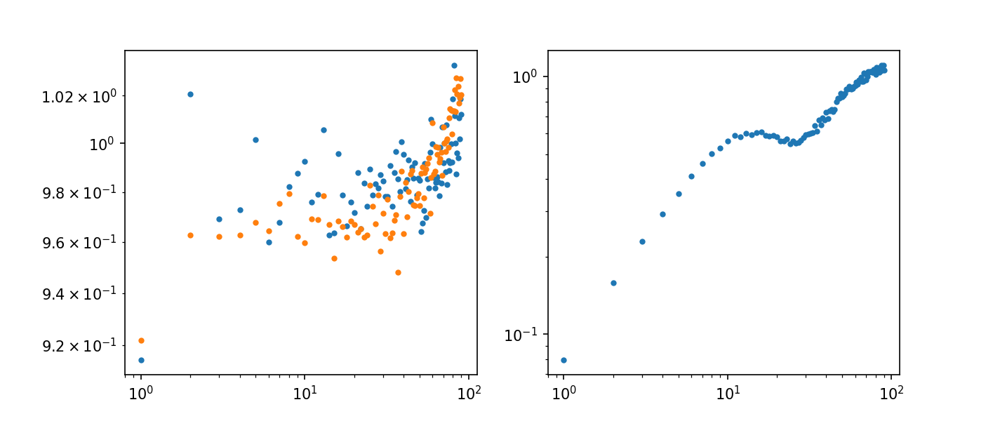

In [40]:
gfw.build_transfer_function(tf_list, plot=True, base_freq=1, number_of_harmonics=90, scale_freq=71)

In [41]:
# Normal feedback values
foldername = r'/data/new_trap/20200316/Bead1/Shaking/Shaking368/'
datasets_num = 2000
data_bdfs = load_dir(foldername, file_prefix='Shaking0', max_file=datasets_num)

100  files in folder
100  files loaded


In [59]:
gfw.BDFs = data_bdfs

<IPython.core.display.Javascript object>


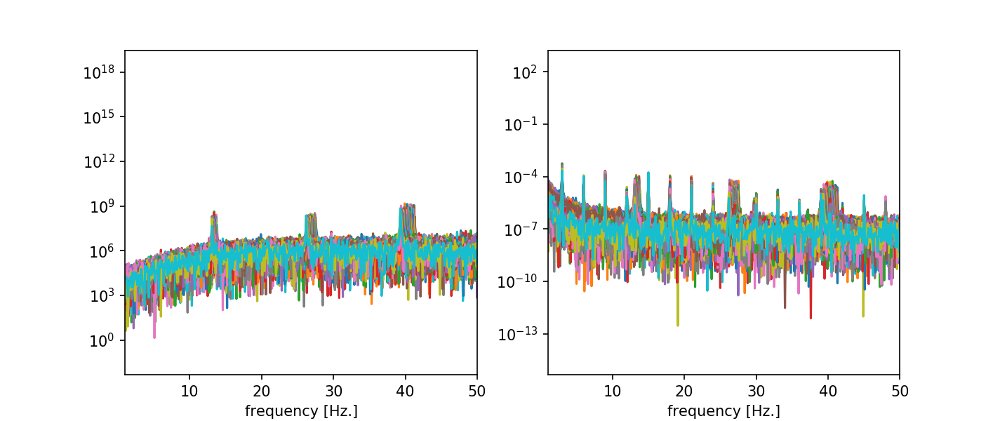

[(1, 50), Text(0.5, 0, 'frequency [Hz.]')]

In [60]:
_,ax = plt.subplots(1,2,figsize=(9.5,4),sharex=True)
for i,bb in enumerate(gfw.BDFs):
    ax[0].semilogy(*bb.psd2('z'))
ax[0].set(xlim=(1,50),xlabel='frequency [Hz.]')

for i,bb in enumerate(gfw.BDFs):
    ax[1].semilogy(*bb.psd2('x'))
ax[1].set(xlim=(1,50),xlabel='frequency [Hz.]')

In [44]:
gfw.build_noise_array(sideband_freq=38, bandwidth=1)
gfw.build_noise_array_z(sideband_freq=38, bandwidth=1)

/home/analysis_user/.local/lib/python3.6/site-packages/scipy/signal/_arraytools.py:45: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  b = a[a_slice]


x2 noise rms:  0.2779402559448682
x3 noise rms:  0.06844618151104559
z2 noise level:  21.5915721653589  std:  3.682873081277408


### profile likelihood fit

In [62]:
fit_kwargs2 = {'alpha': 0.01, 'phase': 0, 'sigma': 40, 'error_alpha': 0.1, 'error_phase': 1, 'error_sigma': 1,
              'errordef': 1,
              'limit_alpha': [-1000, 1000], 'limit_phase': [-13,13], 'limit_sigma': [0,200],
              'fix_alpha': False, 'fix_phase': False, 'fix_sigma': False, 'print_level': 0}

min_36_x = []
datasets_num = 1000
bandwidth = 1
center_freq = 12
noise_freq = 11
for i,bb in enumerate(gfw.BDFs):
    print(i,'/',datasets_num) 
    min_36_x.append(gfw.get_alpha_mle_pl(bdf=bb, center_freq=center_freq, noise_freq=noise_freq, 
                                             bandwidth=bandwidth, decimate=100, direction1='x',
                          x_focous=386.2, frequency=3, offset_y=0, lambda_par=0.0001, height=6e-6, 
                                         suppress_print=False, large_bead=True, **fit_kwargs2)[2])

0 / 1000
Large Bead:  True
Separation (face to face):  14.259100406766049
Stroke:  100.4815752000709
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.40e-05 is selected
A height of 6.00e-06 is selected
***************************************************
alpha mle:  8.35e-02
sigma mle:  3.45e-01
reduced chi2:  -0.018071532372694012
1 / 1000
Large Bead:  True
Separation (face to face):  14.257035901371534
Stroke:  100.47501488490602
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.40e-05 is selected
A height of 6.00e-06 is selected
***************************************************
alpha mle:  8.

/home/analysis_user/.local/lib/python3.6/site-packages/scipy/signal/_arraytools.py:45: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  b = a[a_slice]


***************************************************
alpha mle:  5.89e-02
sigma mle:  3.43e-01
reduced chi2:  -0.018209322787120962
4 / 1000
Large Bead:  True
Separation (face to face):  14.258394353717744
Stroke:  100.46987653251334
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.40e-05 is selected
A height of 6.00e-06 is selected
***************************************************
alpha mle:  4.27e-02
sigma mle:  2.40e-01
reduced chi2:  -0.029704277035620282
5 / 1000
Large Bead:  True
Separation (face to face):  14.25710913653695
Stroke:  100.4694693204536
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A sepa

***************************************************
alpha mle:  7.86e-02
sigma mle:  4.37e-01
reduced chi2:  -0.010514113076272289
20 / 1000
Large Bead:  True
Separation (face to face):  14.255986670992637
Stroke:  100.46485444488016
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.40e-05 is selected
A height of 6.00e-06 is selected
***************************************************
alpha mle:  6.97e-02
sigma mle:  3.95e-01
reduced chi2:  -0.01348183565162253
21 / 1000
Large Bead:  True
Separation (face to face):  14.254883009650722
Stroke:  100.46551196516234
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A s

***************************************************
alpha mle:  3.39e-02
sigma mle:  4.67e-01
reduced chi2:  -0.008337485585445573
38 / 1000
Large Bead:  True
Separation (face to face):  14.256634174285534
Stroke:  100.46329476423095
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.40e-05 is selected
A height of 6.00e-06 is selected
***************************************************
alpha mle:  5.72e-02
sigma mle:  7.00e-01
reduced chi2:  0.004602953009565365
39 / 1000
Large Bead:  True
Separation (face to face):  14.257492034889548
Stroke:  100.46319721673296
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A s

***************************************************
alpha mle:  4.36e-02
sigma mle:  3.83e-01
reduced chi2:  -0.01473349060931965
58 / 1000
Large Bead:  True
Separation (face to face):  14.255868097184372
Stroke:  100.46166910674475
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.40e-05 is selected
A height of 6.00e-06 is selected
***************************************************
alpha mle:  8.61e-02
sigma mle:  4.21e-01
reduced chi2:  -0.011623831136040146
59 / 1000
Large Bead:  True
Separation (face to face):  14.255609981466488
Stroke:  100.46184149315175
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A s

***************************************************
alpha mle:  5.18e-02
sigma mle:  3.01e-01
reduced chi2:  -0.02243396561829523
74 / 1000
Large Bead:  True
Separation (face to face):  14.258380002669195
Stroke:  100.46133755413447
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.40e-05 is selected
A height of 6.00e-06 is selected
***************************************************
alpha mle:  1.43e-02
sigma mle:  3.69e-01
reduced chi2:  -0.015920622620003298
75 / 1000
Large Bead:  True
Separation (face to face):  14.256935286131533
Stroke:  100.46167547562746
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A s

***************************************************
alpha mle:  1.69e-02
sigma mle:  4.85e-01
reduced chi2:  -0.007137617954488798
94 / 1000
Large Bead:  True
Separation (face to face):  14.252211962299679
Stroke:  100.45972409950679
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.40e-05 is selected
A height of 6.00e-06 is selected
***************************************************
alpha mle:  9.77e-03
sigma mle:  3.79e-01
reduced chi2:  -0.015042884962403478
95 / 1000
Large Bead:  True
Separation (face to face):  14.252870724588217
Stroke:  100.45998992124913
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A 

<IPython.core.display.Javascript object>


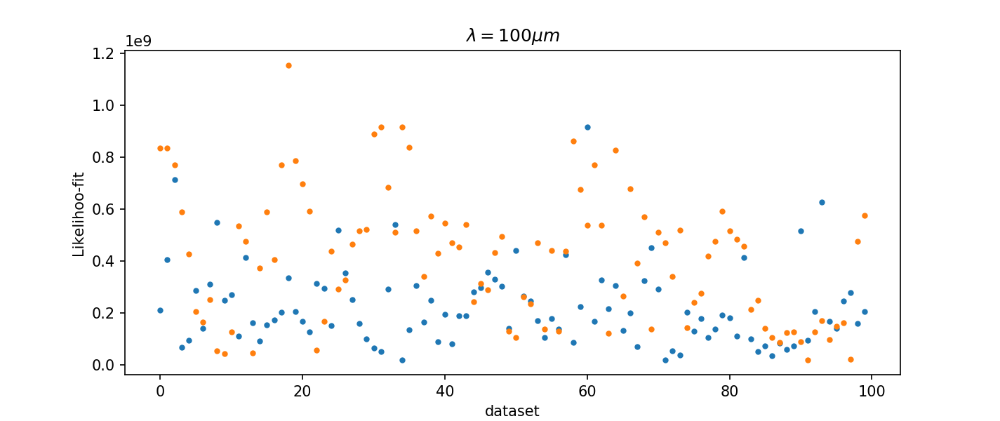

0.022327214108451017

In [63]:
m_36_alpha = [m1_.values[0] for m1_ in min_36_z]
m_36_sigma = [m1_.values[2] for m1_ in min_36_z]

m_36_alpha_x = [m1_.values[0] for m1_ in min_36_x]
m_36_sigma_x = [m1_.values[2] for m1_ in min_36_x]

_, ax = plt.subplots(figsize=(9.5,4))
ax.plot(range(len(m_36_alpha)),np.array(np.abs(m_36_alpha))*1e10,'.')
ax.plot(range(len(m_36_alpha_x)),np.array(np.abs(m_36_alpha_x))*1e10,'.')
ax.set(xlabel='dataset', ylabel=r'Likelihoo-fit', title=r'$\lambda=100 \mu m $')
# ax.set(ylim=(-10e8,10e8))
np.mean(np.abs(m_36_alpha))

<IPython.core.display.Javascript object>


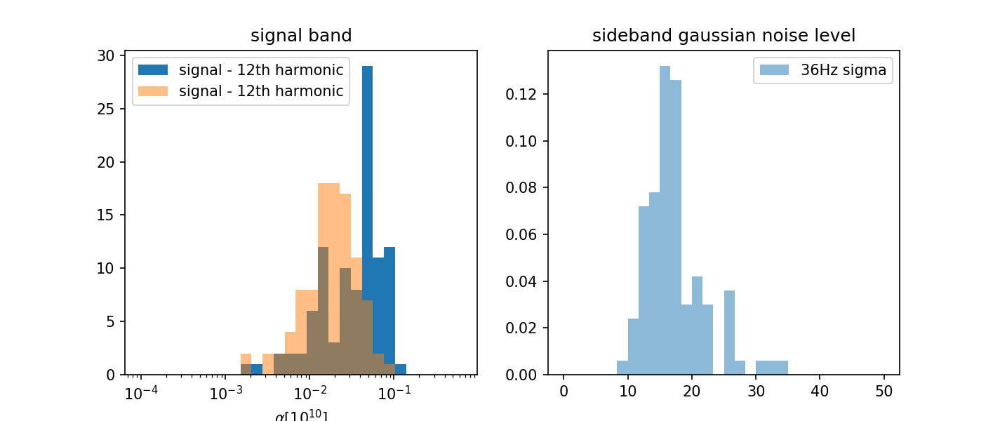

12th hsrmonic mean:  0.04094280620086579  error:  0.0007925637847925393
12th hsrmonic mean:  0.022327214108451017  error:  0.00048824519142176835
estimated limit:  9.76e+06


/usr/lib/python3/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  import sys


In [68]:
_, ax = plt.subplots(1,2,figsize=(9.5,4))
bins = np.logspace(-4, -0.2, 30) 
ax[0].hist(np.abs(m_36_alpha_x), bins=bins, label=r'signal - 12th harmonic')
ax[0].hist(np.abs(m_36_alpha), bins=bins, label=r'signal - 12th harmonic', alpha=0.5)
ax[0].set(xlabel=r'$\alpha [10^{10}]$', xscale='log', title='signal band')

ax[1].hist(m_36_sigma,range=(0,50),bins=30,alpha=0.5,normed=True, label=r'36Hz sigma')
[a.legend() for a in ax]
ax[1].set(title='sideband gaussian noise level')

N_data = len(m_36_alpha2)
print('12th hsrmonic mean: ',np.mean(np.abs(m_36_alpha_x)), ' error: ', np.std(np.abs(m_36_alpha_x))/np.sqrt(N_data))
print('12th hsrmonic mean: ',np.mean(np.abs(m_36_alpha)), ' error: ', np.std(np.abs(m_36_alpha))/np.sqrt(N_data))
print('estimated limit: ', format(np.std(np.abs(m_36_alpha))/np.sqrt(N_data)*2e10,"5.2e"))

<IPython.core.display.Javascript object>


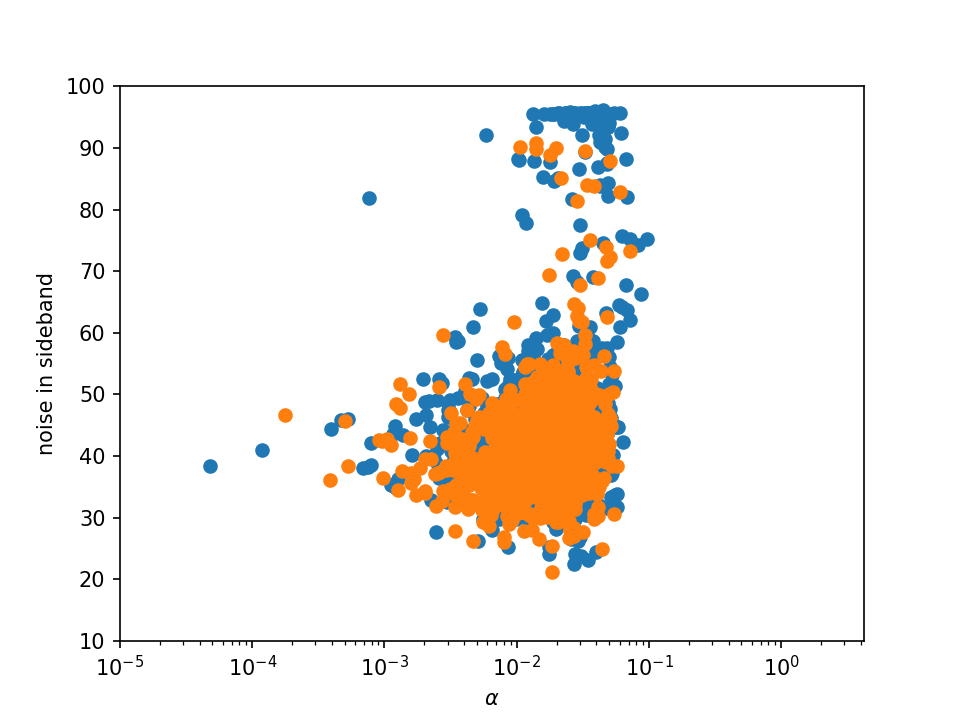

[(10, 100),
 Text(0, 0.5, 'noise in sideband'),
 None,
 (1e-05, 4.225176168817546),
 Text(0.5, 0, '$\\alpha$')]

In [327]:
_,ax = plt.subplots()
ax.scatter(np.abs(m_36_alpha), m_36_sigma)
ax.scatter(np.abs(m_40_alpha), m_40_sigma)
ax.set(xlim=(0.00001,None), ylim=(10,100), xscale='log', xlabel=r'$\alpha$', ylabel='noise in sideband')

<IPython.core.display.Javascript object>


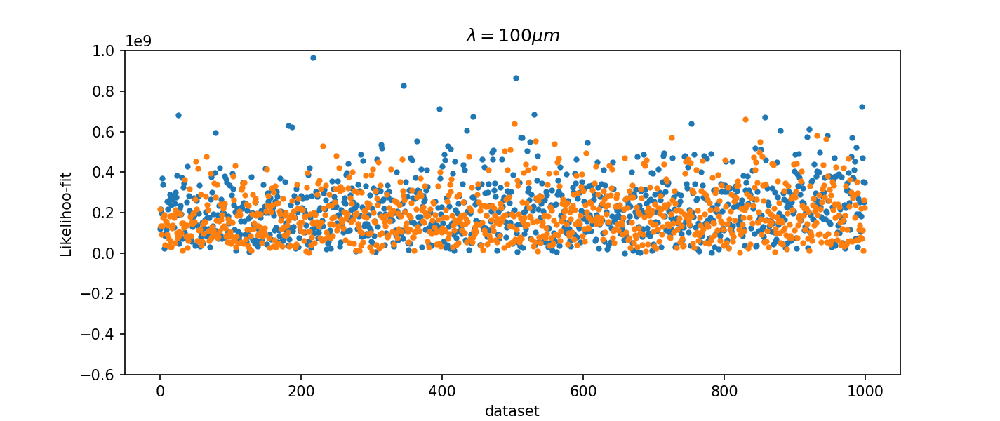

12th hsrmonic mean:  0.025582496888561762  error:  0.0038715631754542685


In [229]:
_, ax = plt.subplots(figsize=(9.5,4))
N_data = len(m_36_alpha)
ax.plot(range(len(m_36_alpha)),np.abs(m_36_alpha)*1e10,'.')
ax.plot(range(len(m_36_alpha)),np.abs(m_20_alpha)*1e10,'.')
ax.set(xlabel='dataset', ylabel=r'Likelihoo-fit', title=r'$\lambda=100 \mu m $')
ax.set(ylim=(-6e8,1e9))
print('12th hsrmonic mean: ',np.mean(np.abs(m_36_alpha)), ' error: ', np.std(np.abs(m_36_alpha))/np.sqrt(N_data))

### Limit

In [301]:
fit_kwargs2 = {'alpha': 1, 'phase': 0, 'sigma': 40, 'error_alpha': 0.1, 'error_phase': 1, 'error_sigma': 1,
              'errordef': 1,
              'limit_alpha': [-1000, 1000], 'limit_phase': [-13,13], 'limit_sigma': [0,200],
              'fix_alpha': False, 'fix_phase': False, 'fix_sigma': False, 'print_level': 0}

In [315]:
datasets_num = len(reduced_bdfs)
bandwidth = 1
center_freq = 36
noise_freq = 37

In [ ]:
L = np.logspace(0.3, 3, 50)*1e-6
lim_z = []
min_all = []
for L_ in L:
    min_tmp = []
    for i,bb in enumerate(reduced_bdfs):
        print(i,'/',datasets_num) 
        min_tmp.append(gfw.get_alpha_mle_pl(bdf=bb, center_freq=center_freq, noise_freq=noise_freq, 
                                                 bandwidth=bandwidth, decimate=100, direction1='z',
                              x_focous=385.8, frequency=3, offset_y=0, lambda_par=L_, height=10e-6, 
                                             suppress_print=True, large_bead=True, **fit_kwargs2)[2])
    m_tmp = [m1_.values[0] for m1_ in min_tmp]
    min_all.append(min_tmp)
    lim_z.append(np.std(np.abs(m_tmp))/np.sqrt(datasets_num)*2*1e10)

0 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.57e+01
sigma mle:  3.47e+01
reduced chi2:  0.1295134838734932
1 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.15e+01
sigma mle:  4.18e+01
reduced chi2:  0.13546125286687347
2 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.8

/home/analysis_user/.local/lib/python3.6/site-packages/scipy/signal/_arraytools.py:45: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  b = a[a_slice]


Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.52e+01
sigma mle:  2.53e+01
reduced chi2:  0.11937163657071334
6 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.01e+01
sigma mle:  4.48e+01
reduced chi2:  0.1377003717348408
7 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is 

Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.19e+01
sigma mle:  3.53e+01
reduced chi2:  0.13002574228239233
29 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.68e+01
sigma mle:  3.38e+01
reduced chi2:  0.1287001625190604
30 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size

***************************************************
alpha mle:  -2.11e+01
sigma mle:  3.17e+01
reduced chi2:  0.12664979780898222
50 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.81e+01
sigma mle:  4.39e+01
reduced chi2:  0.13703334257732197
51 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.07e+01
sigma mle:  5.01e+01
reduced chi2:  0.14124936898545634
52 / 885
Your ch

***************************************************
alpha mle:  2.46e+01
sigma mle:  3.63e+01
reduced chi2:  0.13092200020371406
73 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.60e+01
sigma mle:  4.12e+01
reduced chi2:  0.13501562992970148
74 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.10e+01
sigma mle:  4.00e+01
reduced chi2:  0.13402055203802007
75 / 885
Your choi

***************************************************
alpha mle:  -2.77e+01
sigma mle:  4.49e+01
reduced chi2:  0.13752226302483536
96 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.88e+01
sigma mle:  4.44e+01
reduced chi2:  0.13738468775702295
97 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.14e+01
sigma mle:  4.34e+01
reduced chi2:  0.13666205603406067
98 / 885
Your cho

***************************************************
alpha mle:  -2.71e+01
sigma mle:  3.98e+01
reduced chi2:  0.1338866560791428
119 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.81e+01
sigma mle:  3.77e+01
reduced chi2:  0.13217180429578385
120 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.48e+01
sigma mle:  4.37e+01
reduced chi2:  0.13687916985516552
121 / 885
Your ch

***************************************************
alpha mle:  -1.76e+01
sigma mle:  3.67e+01
reduced chi2:  0.13129404799169092
142 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.21e+01
sigma mle:  3.18e+01
reduced chi2:  0.12668574568383587
143 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.59e+01
sigma mle:  4.47e+01
reduced chi2:  0.13759643216355785
144 / 885
Your c

Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.82e+01
sigma mle:  3.76e+01
reduced chi2:  0.1320460523768875
165 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.54e+00
sigma mle:  3.93e+01
reduced chi2:  0.13345053613954844
166 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  2.91e+01
sigma mle:  3.29e+01
reduced chi2:  0.1278070785815964
187 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.31e+01
sigma mle:  3.33e+01
reduced chi2:  0.12814431893409306
188 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.03e+01
sigma mle:  4.60e+01
reduced chi2:  0.13850323246777044
189 / 885
Your c

***************************************************
alpha mle:  -5.54e+01
sigma mle:  5.53e+01
reduced chi2:  0.14442103002078824
210 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.15e+01
sigma mle:  5.42e+01
reduced chi2:  0.143768384466319
211 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.50e+01
sigma mle:  4.28e+01
reduced chi2:  0.1362345202329169
212 / 885
Your ch

***************************************************
alpha mle:  -3.72e+01
sigma mle:  5.00e+01
reduced chi2:  0.1412146622870495
232 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.71e+01
sigma mle:  3.92e+01
reduced chi2:  0.13338827887164625
233 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.75e+01
sigma mle:  3.48e+01
reduced chi2:  0.12963090576667163
234 / 885
Your ch

***************************************************
alpha mle:  5.58e+01
sigma mle:  3.19e+01
reduced chi2:  0.1267879495465492
256 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.34e+01
sigma mle:  3.37e+01
reduced chi2:  0.12856759851774804
257 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.84e+01
sigma mle:  3.75e+01
reduced chi2:  0.13200090478449364
258 / 885
Your ch

***************************************************
alpha mle:  7.20e+01
sigma mle:  4.37e+01
reduced chi2:  0.13689076741741263
279 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.04e+02
sigma mle:  5.33e+01
reduced chi2:  0.14323577048112815
280 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.38e+01
sigma mle:  3.67e+01
reduced chi2:  0.13125023530443222
281 / 885
Your ch

***************************************************
alpha mle:  6.80e+01
sigma mle:  3.89e+01
reduced chi2:  0.13311863706373245
300 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.02e+00
sigma mle:  4.04e+01
reduced chi2:  0.13438285890795199
301 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.01e+01
sigma mle:  4.10e+01
reduced chi2:  0.13488707054802823
302 / 885
Your c

***************************************************
alpha mle:  1.23e+02
sigma mle:  5.23e+01
reduced chi2:  0.1426311121042909
324 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.63e+01
sigma mle:  4.10e+01
reduced chi2:  0.1348566025512799
325 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.17e+02
sigma mle:  3.35e+01
reduced chi2:  0.12834344006889853
326 / 885
Your cho

***************************************************
alpha mle:  3.29e+01
sigma mle:  3.39e+01
reduced chi2:  0.12875680265546355
347 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.92e+00
sigma mle:  3.03e+01
reduced chi2:  0.12512486431350725
348 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.32e+01
sigma mle:  4.70e+01
reduced chi2:  0.13920140209123244
349 / 885
Your ch

***************************************************
alpha mle:  8.96e+01
sigma mle:  4.30e+01
reduced chi2:  0.13634064211505934
371 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.40e+02
sigma mle:  3.50e+01
reduced chi2:  0.12975698152787468
372 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.10e+01
sigma mle:  3.87e+01
reduced chi2:  0.13302217649498763
373 / 885
Your ch

***************************************************
alpha mle:  5.80e+01
sigma mle:  3.29e+01
reduced chi2:  0.1278376702031515
393 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.47e+01
sigma mle:  4.12e+01
reduced chi2:  0.1337543747557363
394 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.10e+01
sigma mle:  2.94e+01
reduced chi2:  0.12420188300752458
395 / 885
Your ch

***************************************************
alpha mle:  3.44e+01
sigma mle:  4.20e+01
reduced chi2:  0.13557636822855004
417 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.35e+01
sigma mle:  4.43e+01
reduced chi2:  0.13732342530270245
418 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.23e+01
sigma mle:  3.72e+01
reduced chi2:  0.13173710068317007
419 / 885
Your 

***************************************************
alpha mle:  1.23e+02
sigma mle:  4.90e+01
reduced chi2:  0.1405269126416834
440 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.31e+01
sigma mle:  4.41e+01
reduced chi2:  0.13719130435856153
441 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.41e+01
sigma mle:  4.29e+01
reduced chi2:  0.13630277167373042
442 / 885
Your cho

***************************************************
alpha mle:  6.64e+01
sigma mle:  3.23e+01
reduced chi2:  0.12733270514694198
464 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.67e+01
sigma mle:  3.77e+01
reduced chi2:  0.1321151268899617
465 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.31e+02
sigma mle:  3.39e+01
reduced chi2:  0.12870275780940543
466 / 885
Your cho

***************************************************
alpha mle:  -6.70e+01
sigma mle:  4.74e+01
reduced chi2:  0.13947237394860337
485 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.75e+01
sigma mle:  4.36e+01
reduced chi2:  0.13677057050883903
486 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.84e+01
sigma mle:  4.04e+01
reduced chi2:  0.13438314169423288
487 / 885
Your 

***************************************************
alpha mle:  1.45e+01
sigma mle:  3.29e+01
reduced chi2:  0.12780789853781857
508 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.45e+01
sigma mle:  4.49e+01
reduced chi2:  0.13771175462735696
509 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.88e+01
sigma mle:  3.75e+01
reduced chi2:  0.1320998710014783
510 / 885
Your cho

***************************************************
alpha mle:  -8.25e+01
sigma mle:  3.51e+01
reduced chi2:  0.12871094611560202
532 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.25e+01
sigma mle:  3.91e+01
reduced chi2:  0.13334249132242681
533 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.20e+01
sigma mle:  4.11e+01
reduced chi2:  0.13494524656368254
534 / 885
Your 

***************************************************
alpha mle:  -2.89e+01
sigma mle:  3.11e+01
reduced chi2:  0.12598640105189673
556 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.09e+01
sigma mle:  4.63e+01
reduced chi2:  0.13872003710106295
557 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.72e+01
sigma mle:  4.41e+01
reduced chi2:  0.13714050868238561
558 / 885
Your 

Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.23e+00
sigma mle:  4.13e+01
reduced chi2:  0.13504199479489076
581 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.70e+01
sigma mle:  3.60e+01
reduced chi2:  0.13066092401111445
582 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  7.39e+01
sigma mle:  5.43e+01
reduced chi2:  0.1438221915972285
603 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.58e+01
sigma mle:  4.52e+01
reduced chi2:  0.13793335268111523
604 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.34e+01
sigma mle:  4.42e+01
reduced chi2:  0.1372216641311913
605 / 885
Your ch

***************************************************
alpha mle:  1.39e+01
sigma mle:  4.10e+01
reduced chi2:  0.13483336386054356
628 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.61e+01
sigma mle:  4.37e+01
reduced chi2:  0.13686964394872356
629 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.06e+02
sigma mle:  4.19e+01
reduced chi2:  0.13554304124889524
630 / 885
Your ch

***************************************************
alpha mle:  8.91e+01
sigma mle:  2.65e+01
reduced chi2:  0.1208951686702385
651 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.19e+01
sigma mle:  4.32e+01
reduced chi2:  0.13652224737675303
652 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.91e+01
sigma mle:  2.85e+01
reduced chi2:  0.12321566150890884
653 / 885
Your ch

***************************************************
alpha mle:  -6.17e+01
sigma mle:  4.21e+01
reduced chi2:  0.1357140912390598
676 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.08e+01
sigma mle:  4.75e+01
reduced chi2:  0.1395727636725402
677 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.88e+00
sigma mle:  3.39e+01
reduced chi2:  0.1287644992835312
678 / 885
Your cho

***************************************************
alpha mle:  -1.64e+01
sigma mle:  4.88e+01
reduced chi2:  0.1403793360394792
699 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.22e+01
sigma mle:  5.34e+01
reduced chi2:  0.14329640378098146
700 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.39e+01
sigma mle:  5.22e+01
reduced chi2:  0.14258708529160216
701 / 885
Your ch

***************************************************
alpha mle:  -6.26e+00
sigma mle:  3.96e+01
reduced chi2:  0.13371764385325854
723 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.07e+01
sigma mle:  4.25e+01
reduced chi2:  0.13595049172979434
724 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.91e+01
sigma mle:  5.01e+01
reduced chi2:  0.1412402592623721
725 / 885
Your ch

***************************************************
alpha mle:  6.24e+01
sigma mle:  5.71e+01
reduced chi2:  0.14546154249773582
745 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.88e+01
sigma mle:  4.38e+01
reduced chi2:  0.13689394228085036
746 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.47e+01
sigma mle:  4.27e+01
reduced chi2:  0.13616855345436846
747 / 885
Your 

***************************************************
alpha mle:  5.28e+01
sigma mle:  5.07e+01
reduced chi2:  0.14163103720346829
766 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.41e+01
sigma mle:  4.24e+01
reduced chi2:  0.13590697003191335
767 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.78e+01
sigma mle:  4.87e+01
reduced chi2:  0.1403771152631708
768 / 885
Your ch

***************************************************
alpha mle:  3.27e+01
sigma mle:  5.06e+01
reduced chi2:  0.14164731921130186
786 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.46e+01
sigma mle:  4.67e+01
reduced chi2:  0.13901337152531318
787 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.75e+01
sigma mle:  5.50e+01
reduced chi2:  0.1442391699272548
788 / 885
Your ch

***************************************************
alpha mle:  9.57e+01
sigma mle:  5.20e+01
reduced chi2:  0.14242858043431855
809 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.32e+02
sigma mle:  4.66e+01
reduced chi2:  0.13889867173187928
810 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.10e+02
sigma mle:  3.48e+01
reduced chi2:  0.12961622592124067
811 / 885
Your c

***************************************************
alpha mle:  -6.29e+01
sigma mle:  5.37e+01
reduced chi2:  0.14347211606013233
831 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.79e+01
sigma mle:  3.40e+01
reduced chi2:  0.1288777666299663
832 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.99e+01
sigma mle:  5.17e+01
reduced chi2:  0.14227807312729857
833 / 885
Your 

***************************************************
alpha mle:  6.74e+01
sigma mle:  5.96e+01
reduced chi2:  0.14682143650406435
853 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.03e+01
sigma mle:  4.91e+01
reduced chi2:  0.14057714223101078
854 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.45e+01
sigma mle:  4.65e+01
reduced chi2:  0.13889724535258463
855 / 885
Your ch

***************************************************
alpha mle:  9.06e+01
sigma mle:  4.42e+01
reduced chi2:  0.13726586702871366
875 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.12e+02
sigma mle:  3.93e+01
reduced chi2:  0.13351510883045847
876 / 885
Your choice of lambda is not existing
Taking 2.00e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.53e+01
sigma mle:  3.96e+01
reduced chi2:  0.13371839376045683
877 / 885
Your c

***************************************************
alpha mle:  -1.52e+01
sigma mle:  4.15e+01
reduced chi2:  0.13527176632666532
11 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.71e+01
sigma mle:  4.88e+01
reduced chi2:  0.14042598127875472
12 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.85e+01
sigma mle:  4.42e+01
reduced chi2:  0.13726607952405248
13 / 885
Your ch

***************************************************
alpha mle:  -1.98e+01
sigma mle:  3.52e+01
reduced chi2:  0.12952143676807476
34 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.21e+00
sigma mle:  3.16e+01
reduced chi2:  0.1264881801655344
35 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.79e+01
sigma mle:  3.43e+01
reduced chi2:  0.12908568457905611
36 / 885
Your cho

***************************************************
alpha mle:  -7.07e+00
sigma mle:  2.76e+01
reduced chi2:  0.12174368632270695
57 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.15e+01
sigma mle:  3.47e+01
reduced chi2:  0.12961066448622602
58 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.59e+01
sigma mle:  3.36e+01
reduced chi2:  0.12844109955192493
59 / 885
Your cho

***************************************************
alpha mle:  -1.06e+01
sigma mle:  2.98e+01
reduced chi2:  0.12466355013722985
80 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.61e+00
sigma mle:  4.30e+01
reduced chi2:  0.13633999833138033
81 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.49e+00
sigma mle:  4.31e+01
reduced chi2:  0.1364194117768525
82 / 885
Your cho

Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.36e+01
sigma mle:  4.49e+01
reduced chi2:  0.13776375598763047
104 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.59e+01
sigma mle:  4.59e+01
reduced chi2:  0.1384778301371558
105 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.44e+00
sigma mle:  3.55e+01
reduced chi2:  0.1302466399204446
126 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.13e+00
sigma mle:  3.10e+01
reduced chi2:  0.12584807319053729
127 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  2.04e+00
sigma mle:  3.54e+01
reduced chi2:  0.13017682058157518
149 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.04e+01
sigma mle:  3.33e+01
reduced chi2:  0.1289671223976989
150 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.43e+01
sigma mle:  2.53e+01
reduced chi2:  0.11941832572015046
151 / 885
Your c

***************************************************
alpha mle:  -1.52e+01
sigma mle:  3.55e+01
reduced chi2:  0.13021306077664013
169 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.29e+01
sigma mle:  3.52e+01
reduced chi2:  0.129948714072596
170 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.35e+00
sigma mle:  3.68e+01
reduced chi2:  0.1314116000231944
171 / 885
Your ch

***************************************************
alpha mle:  -2.58e+01
sigma mle:  4.14e+01
reduced chi2:  0.13518407326679516
194 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.72e+01
sigma mle:  3.94e+01
reduced chi2:  0.13358465066397152
195 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.05e+01
sigma mle:  3.93e+01
reduced chi2:  0.13348220564865562
196 / 885
Your 

***************************************************
alpha mle:  5.76e+00
sigma mle:  2.87e+01
reduced chi2:  0.12345017873471682
217 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.81e+00
sigma mle:  3.70e+01
reduced chi2:  0.13157061573894843
218 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.47e+00
sigma mle:  3.76e+01
reduced chi2:  0.1320703762330266
219 / 885
Your ch

Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.81e+01
sigma mle:  5.50e+01
reduced chi2:  0.14422254613938573
240 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.80e+00
sigma mle:  4.95e+01
reduced chi2:  0.14086963855158854
241 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  3.98e+01
sigma mle:  4.29e+01
reduced chi2:  0.13627682880557432
262 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.99e+00
sigma mle:  5.30e+01
reduced chi2:  0.1430459963017168
263 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.33e+00
sigma mle:  4.60e+01
reduced chi2:  0.13853267407698147
264 / 885
Your cho

***************************************************
alpha mle:  2.93e+01
sigma mle:  3.83e+01
reduced chi2:  0.13264690022296632
286 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.10e+01
sigma mle:  3.60e+01
reduced chi2:  0.1307022967261154
287 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.43e+01
sigma mle:  4.64e+01
reduced chi2:  0.138804667592683
288 / 885
Your choi

***************************************************
alpha mle:  1.29e+01
sigma mle:  3.84e+01
reduced chi2:  0.1327012298006743
309 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.17e+01
sigma mle:  4.51e+01
reduced chi2:  0.1379041353493547
310 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.83e+01
sigma mle:  3.93e+01
reduced chi2:  0.13349584820773894
311 / 885
Your choi

***************************************************
alpha mle:  1.92e+01
sigma mle:  5.55e+01
reduced chi2:  0.14451548876033332
333 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.83e+01
sigma mle:  4.11e+01
reduced chi2:  0.13492925311348697
334 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.08e+01
sigma mle:  3.45e+01
reduced chi2:  0.1298155106166564
335 / 885
Your cho

***************************************************
alpha mle:  1.47e+01
sigma mle:  3.22e+01
reduced chi2:  0.1270849868142676
355 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.92e+00
sigma mle:  4.23e+01
reduced chi2:  0.13582467574715748
356 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.01e+01
sigma mle:  3.30e+01
reduced chi2:  0.12909239777564352
357 / 885
Your cho

***************************************************
alpha mle:  1.04e+01
sigma mle:  3.75e+01
reduced chi2:  0.13197319790470585
379 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.61e+00
sigma mle:  3.81e+01
reduced chi2:  0.1324712926105381
380 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.83e+01
sigma mle:  4.77e+01
reduced chi2:  0.13964932188753626
381 / 885
Your ch

***************************************************
alpha mle:  5.22e+00
sigma mle:  4.21e+01
reduced chi2:  0.1356461140074477
403 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.42e+01
sigma mle:  3.49e+01
reduced chi2:  0.1296505001334243
404 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.07e+00
sigma mle:  3.83e+01
reduced chi2:  0.13263131496536995
405 / 885
Your cho

***************************************************
alpha mle:  -3.32e+01
sigma mle:  4.57e+01
reduced chi2:  0.13827854610948564
428 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.10e+01
sigma mle:  4.05e+01
reduced chi2:  0.13440870231259489
429 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.04e+01
sigma mle:  4.55e+01
reduced chi2:  0.13815026271536296
430 / 885
Your c

***************************************************
alpha mle:  6.76e+00
sigma mle:  4.18e+01
reduced chi2:  0.1354508113514249
451 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.05e+00
sigma mle:  4.19e+01
reduced chi2:  0.13556000626606496
452 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.24e+00
sigma mle:  4.71e+01
reduced chi2:  0.13930153799916825
453 / 885
Your ch

Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.50e+01
sigma mle:  4.69e+01
reduced chi2:  0.13852275298638583
476 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.57e+01
sigma mle:  4.49e+01
reduced chi2:  0.137766872353185
477 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.94e+00
sigma mle:  4.76e+01
reduced chi2:  0.13958107215654192
499 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.86e+00
sigma mle:  2.71e+01
reduced chi2:  0.12151810605867007
500 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -9.13e+00
sigma mle:  3.39e+01
reduced chi2:  0.1287701929708218
522 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.77e+00
sigma mle:  4.34e+01
reduced chi2:  0.13668947858116617
523 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.77e+00
sigma mle:  4.23e+01
reduced chi2:  0.13582027796512489
524 / 885
Your ch

***************************************************
alpha mle:  -1.04e+01
sigma mle:  4.60e+01
reduced chi2:  0.1384969634636663
546 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.96e+01
sigma mle:  5.08e+01
reduced chi2:  0.14168092715869343
547 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.35e+00
sigma mle:  3.77e+01
reduced chi2:  0.1321534046748323
548 / 885
Your c

***************************************************
alpha mle:  -1.14e+01
sigma mle:  4.64e+01
reduced chi2:  0.13879463483410295
567 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.24e+01
sigma mle:  3.91e+01
reduced chi2:  0.13331202492299013
568 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.95e+00
sigma mle:  3.59e+01
reduced chi2:  0.13105133138955175
569 / 885
Your

***************************************************
alpha mle:  6.78e+00
sigma mle:  4.12e+01
reduced chi2:  0.1349861372757512
589 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.79e+00
sigma mle:  4.99e+01
reduced chi2:  0.14114797309027752
590 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.32e+00
sigma mle:  3.99e+01
reduced chi2:  0.13398241653299522
591 / 885
Your ch

***************************************************
alpha mle:  -1.40e+01
sigma mle:  4.41e+01
reduced chi2:  0.1371790857300953
614 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.15e+01
sigma mle:  3.61e+01
reduced chi2:  0.1293966407892088
615 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.45e+01
sigma mle:  5.02e+01
reduced chi2:  0.14129931274791793
616 / 885
Your cho

***************************************************
alpha mle:  -7.38e+00
sigma mle:  4.30e+01
reduced chi2:  0.13636840146602308
638 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.29e+01
sigma mle:  4.60e+01
reduced chi2:  0.13852758209506968
639 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.77e+01
sigma mle:  4.29e+01
reduced chi2:  0.13627794051213774
640 / 885
Your 

***************************************************
alpha mle:  -3.19e+01
sigma mle:  5.29e+01
reduced chi2:  0.14300450227142864
661 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.58e+00
sigma mle:  5.23e+01
reduced chi2:  0.1426035581935779
662 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.16e+01
sigma mle:  4.40e+01
reduced chi2:  0.1370771796187063
663 / 885
Your ch

***************************************************
alpha mle:  1.67e+01
sigma mle:  4.74e+01
reduced chi2:  0.1395123801636119
684 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.79e+01
sigma mle:  5.48e+01
reduced chi2:  0.14414721837318192
685 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.49e+00
sigma mle:  5.44e+01
reduced chi2:  0.14389041960925816
686 / 885
Your c

***************************************************
alpha mle:  3.23e+01
sigma mle:  4.66e+01
reduced chi2:  0.13897387100398734
706 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.10e+00
sigma mle:  4.47e+01
reduced chi2:  0.13754602578295397
707 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.87e+01
sigma mle:  3.62e+01
reduced chi2:  0.13088979209277354
708 / 885
Your c

Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.08e+01
sigma mle:  5.13e+01
reduced chi2:  0.1419938794694398
729 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.23e+01
sigma mle:  4.76e+01
reduced chi2:  0.13962825477156415
730 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -2.06e+01
sigma mle:  3.98e+01
reduced chi2:  0.13391470537198105
750 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.66e+00
sigma mle:  3.54e+01
reduced chi2:  0.13013217185227494
751 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.89e+01
sigma mle:  4.11e+01
reduced chi2:  0.1349339141088569
752 / 885
Your c

***************************************************
alpha mle:  3.01e+01
sigma mle:  4.82e+01
reduced chi2:  0.1399853251545637
770 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.90e+01
sigma mle:  4.17e+01
reduced chi2:  0.1342249163484588
771 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.04e+01
sigma mle:  4.08e+01
reduced chi2:  0.1346703239488694
772 / 885
Your choi

***************************************************
alpha mle:  -1.82e+01
sigma mle:  4.86e+01
reduced chi2:  0.14025069610410304
792 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.24e+01
sigma mle:  5.10e+01
reduced chi2:  0.14184424895312894
793 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.73e-01
sigma mle:  4.06e+01
reduced chi2:  0.13456125741958858
794 / 885
Your 

Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.57e+00
sigma mle:  3.86e+01
reduced chi2:  0.13293541581790977
815 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.38e+01
sigma mle:  3.68e+01
reduced chi2:  0.13141667385792874
816 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -1.85e+01
sigma mle:  4.17e+01
reduced chi2:  0.13539343810701696
837 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.17e+01
sigma mle:  4.99e+01
reduced chi2:  0.14112032560368204
838 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.06e+01
sigma mle:  5.61e+01
reduced chi2:  0.14486771724371494
839 / 885
Your

***************************************************
alpha mle:  -6.99e+00
sigma mle:  3.73e+01
reduced chi2:  0.13182703395539933
858 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.39e+01
sigma mle:  3.41e+01
reduced chi2:  0.12889827365005443
859 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.12e+00
sigma mle:  4.52e+01
reduced chi2:  0.13795942149221452
860 / 885
Your 

***************************************************
alpha mle:  -1.73e+01
sigma mle:  4.27e+01
reduced chi2:  0.13617548206068203
881 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.66e+00
sigma mle:  4.00e+01
reduced chi2:  0.13400207065798703
882 / 885
Your choice of lambda is not existing
Taking 2.33e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.34e+00
sigma mle:  3.32e+01
reduced chi2:  0.12808335322547107
883 / 885
Your c

***************************************************
alpha mle:  -5.69e+00
sigma mle:  3.82e+01
reduced chi2:  0.13255253100568912
20 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.98e+00
sigma mle:  3.40e+01
reduced chi2:  0.1288411654066017
21 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.07e+01
sigma mle:  3.60e+01
reduced chi2:  0.13064151166032464
22 / 885
Your cho

***************************************************
alpha mle:  2.54e+00
sigma mle:  4.44e+01
reduced chi2:  0.13740804452226768
42 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.29e+00
sigma mle:  4.47e+01
reduced chi2:  0.13756608843293405
43 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.46e+00
sigma mle:  3.35e+01
reduced chi2:  0.12817223937789304
44 / 885
Your cho

***************************************************
alpha mle:  4.49e+00
sigma mle:  4.49e+01
reduced chi2:  0.13771536871209714
66 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.25e+00
sigma mle:  4.23e+01
reduced chi2:  0.135860610197252
67 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.76e+00
sigma mle:  3.63e+01
reduced chi2:  0.13091326458890032
68 / 885
Your choice

***************************************************
alpha mle:  1.09e+01
sigma mle:  3.65e+01
reduced chi2:  0.13113821545911458
89 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.06e+00
sigma mle:  4.39e+01
reduced chi2:  0.13703591417117486
90 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.87e+00
sigma mle:  4.12e+01
reduced chi2:  0.1349853710805753
91 / 885
Your choic

***************************************************
alpha mle:  -8.05e+00
sigma mle:  4.03e+01
reduced chi2:  0.1342661876461358
112 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.91e+00
sigma mle:  4.29e+01
reduced chi2:  0.13631378445691406
113 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.50e+00
sigma mle:  5.43e+01
reduced chi2:  0.1438429192144571
114 / 885
Your ch

***************************************************
alpha mle:  -1.69e+00
sigma mle:  4.71e+01
reduced chi2:  0.13925601836603713
136 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.76e+00
sigma mle:  4.02e+01
reduced chi2:  0.13420029730133967
137 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.33e+00
sigma mle:  3.73e+01
reduced chi2:  0.13124611732464117
138 / 885
Your c

Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.12e+00
sigma mle:  4.25e+01
reduced chi2:  0.1360076526201583
161 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.37e+01
sigma mle:  3.94e+01
reduced chi2:  0.13357386126956355
162 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  -1.13e+01
sigma mle:  3.69e+01
reduced chi2:  0.13353489657457135
184 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.37e+00
sigma mle:  3.78e+01
reduced chi2:  0.1323141714280534
185 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.18e+00
sigma mle:  3.31e+01
reduced chi2:  0.12799701205229005
186 / 885
Your c

***************************************************
alpha mle:  5.65e+00
sigma mle:  5.58e+01
reduced chi2:  0.1447055247044401
207 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.36e+00
sigma mle:  4.51e+01
reduced chi2:  0.1378859997801127
208 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.24e+00
sigma mle:  5.03e+01
reduced chi2:  0.14137160649655006
209 / 885
Your cho

***************************************************
alpha mle:  -4.22e+00
sigma mle:  5.50e+01
reduced chi2:  0.14425270827015352
229 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.17e+00
sigma mle:  4.50e+01
reduced chi2:  0.13810202597871118
230 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.75e-01
sigma mle:  3.90e+01
reduced chi2:  0.1332268565586329
231 / 885
Your 

***************************************************
alpha mle:  2.84e-01
sigma mle:  3.78e+01
reduced chi2:  0.1322355411186303
252 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.48e+00
sigma mle:  4.39e+01
reduced chi2:  0.13699454579704634
253 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.39e+00
sigma mle:  4.14e+01
reduced chi2:  0.13510810642856627
254 / 885
Your ch

***************************************************
alpha mle:  -1.24e+01
sigma mle:  4.39e+01
reduced chi2:  0.13703101079203295
275 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.52e+00
sigma mle:  4.70e+01
reduced chi2:  0.13921489141577628
276 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.34e+00
sigma mle:  4.85e+01
reduced chi2:  0.14019807326699318
277 / 885
Your c

***************************************************
alpha mle:  6.57e+00
sigma mle:  4.96e+01
reduced chi2:  0.14094173051238373
297 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.77e+00
sigma mle:  4.71e+01
reduced chi2:  0.13927074583007662
298 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.37e+01
sigma mle:  3.15e+01
reduced chi2:  0.12326048258802426
299 / 885
Your c

***************************************************
alpha mle:  -1.09e+01
sigma mle:  3.89e+01
reduced chi2:  0.1331592325937538
319 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.30e+01
sigma mle:  3.80e+01
reduced chi2:  0.1324331342932559
320 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.84e+00
sigma mle:  4.55e+01
reduced chi2:  0.1382020861842431
321 / 885
Your cho

***************************************************
alpha mle:  1.06e+01
sigma mle:  4.14e+01
reduced chi2:  0.13514893375497855
343 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.24e+00
sigma mle:  3.86e+01
reduced chi2:  0.13292614638662612
344 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.89e+00
sigma mle:  3.23e+01
reduced chi2:  0.127197467948156
345 / 885
Your choi

***************************************************
alpha mle:  1.68e+01
sigma mle:  4.60e+01
reduced chi2:  0.13851901622503385
367 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.95e+00
sigma mle:  3.68e+01
reduced chi2:  0.1313862394768362
368 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.16e+00
sigma mle:  3.94e+01
reduced chi2:  0.13353454952971824
369 / 885
Your ch

***************************************************
alpha mle:  4.97e+00
sigma mle:  4.31e+01
reduced chi2:  0.1364346238527058
390 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.32e+01
sigma mle:  3.58e+01
reduced chi2:  0.13051690260791218
391 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.55e+00
sigma mle:  3.94e+01
reduced chi2:  0.13262519455513191
392 / 885
Your cho

***************************************************
alpha mle:  1.29e+01
sigma mle:  3.68e+01
reduced chi2:  0.13151293158317648
410 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.24e+00
sigma mle:  4.56e+01
reduced chi2:  0.13826457573864223
411 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.74e+00
sigma mle:  3.07e+01
reduced chi2:  0.12554085217244818
412 / 885
Your c

***************************************************
alpha mle:  1.62e+00
sigma mle:  3.84e+01
reduced chi2:  0.13274789639628337
433 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.04e+00
sigma mle:  3.89e+01
reduced chi2:  0.13318707977991326
434 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.12e+00
sigma mle:  3.46e+01
reduced chi2:  0.12942705146366457
435 / 885
Your ch

Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.34e+00
sigma mle:  4.12e+01
reduced chi2:  0.13501708769332985
457 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.98e+00
sigma mle:  2.76e+01
reduced chi2:  0.12222002528430956
458 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  1.93e+01
sigma mle:  3.93e+01
reduced chi2:  0.13356163002840077
479 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.50e+00
sigma mle:  4.09e+01
reduced chi2:  0.13479850014316844
480 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.61e+00
sigma mle:  5.27e+01
reduced chi2:  0.14287565737267863
481 / 885
Your c

Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.95e+00
sigma mle:  4.76e+01
reduced chi2:  0.13958109042173
499 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.15e+00
sigma mle:  2.72e+01
reduced chi2:  0.1217162757926822
500 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is 

***************************************************
alpha mle:  -5.05e+00
sigma mle:  3.39e+01
reduced chi2:  0.1287697069884658
522 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.85e+00
sigma mle:  4.34e+01
reduced chi2:  0.13668935074814098
523 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.74e+00
sigma mle:  4.23e+01
reduced chi2:  0.13582009002658013
524 / 885
Your ch

***************************************************
alpha mle:  -5.77e+00
sigma mle:  4.60e+01
reduced chi2:  0.1384969486742134
546 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.09e+01
sigma mle:  5.08e+01
reduced chi2:  0.14168090687791401
547 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.06e+00
sigma mle:  3.77e+01
reduced chi2:  0.13215311681404637
548 / 885
Your 

***************************************************
alpha mle:  8.34e+00
sigma mle:  4.49e+01
reduced chi2:  0.1377173509873369
570 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.09e+01
sigma mle:  3.28e+01
reduced chi2:  0.12773515902211424
571 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.80e+00
sigma mle:  3.75e+01
reduced chi2:  0.13198877658885746
572 / 885
Your cho

***************************************************
alpha mle:  6.71e+00
sigma mle:  4.59e+01
reduced chi2:  0.13841995734830537
592 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.93e+00
sigma mle:  4.61e+01
reduced chi2:  0.1385982186182842
593 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.91e+00
sigma mle:  4.17e+01
reduced chi2:  0.13536615242856145
594 / 885
Your c

Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.19e+00
sigma mle:  4.18e+01
reduced chi2:  0.1354480952268764
613 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.76e+00
sigma mle:  4.41e+01
reduced chi2:  0.13717891145643582
614 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  3.83e+00
sigma mle:  3.13e+01
reduced chi2:  0.126209528246089
637 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.09e+00
sigma mle:  4.30e+01
reduced chi2:  0.13636823610395374
638 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.82e+01
sigma mle:  4.60e+01
reduced chi2:  0.13852823609623954
639 / 885
Your cho

***************************************************
alpha mle:  5.29e+00
sigma mle:  5.41e+01
reduced chi2:  0.14372748636406385
657 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.70e+00
sigma mle:  4.07e+01
reduced chi2:  0.13455036160294034
658 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.06e+01
sigma mle:  4.36e+01
reduced chi2:  0.13680240106689306
659 / 885
Your c

***************************************************
alpha mle:  -1.03e+01
sigma mle:  3.96e+01
reduced chi2:  0.13374667115191677
681 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.20e+01
sigma mle:  5.21e+01
reduced chi2:  0.14253264622951275
682 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.01e+00
sigma mle:  4.24e+01
reduced chi2:  0.1363573272382361
683 / 885
Your ch

Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.51e+00
sigma mle:  4.61e+01
reduced chi2:  0.13857433619584755
703 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.21e+00
sigma mle:  5.59e+01
reduced chi2:  0.14477291828633443
704 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.28e+00
sigma mle:  5.01e+01
reduced chi2:  0.14124030878730928
725 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.71e+01
sigma mle:  4.80e+01
reduced chi2:  0.13989063544134955
726 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.20e+01
sigma mle:  5.54e+01
reduced chi2:  0.14446586505933226
748 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.16e+01
sigma mle:  4.27e+01
reduced chi2:  0.13617572954013052
749 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  8.50e+00
sigma mle:  4.87e+01
reduced chi2:  0.14037674740398629
768 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.63e-01
sigma mle:  3.72e+01
reduced chi2:  0.131983890975944
769 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.67e+01
sigma mle:  4.82e+01
reduced chi2:  0.13998530230497694
770 / 885
Your cho

***************************************************
alpha mle:  -1.01e+01
sigma mle:  4.86e+01
reduced chi2:  0.14025061048352366
792 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.87e+00
sigma mle:  5.10e+01
reduced chi2:  0.14184459785552384
793 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.17e-01
sigma mle:  4.06e+01
reduced chi2:  0.13456020740506913
794 / 885
Your 

***************************************************
alpha mle:  3.08e+00
sigma mle:  3.86e+01
reduced chi2:  0.132935493151379
815 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.51e+01
sigma mle:  3.35e+01
reduced chi2:  0.12834449395418018
816 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.65e+00
sigma mle:  4.25e+01
reduced chi2:  0.1360223227746389
817 / 885
Your cho

***************************************************
alpha mle:  6.92e+00
sigma mle:  4.94e+01
reduced chi2:  0.14082105313521723
840 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.39e+01
sigma mle:  5.01e+01
reduced chi2:  0.14127735887492884
841 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.40e+00
sigma mle:  4.87e+01
reduced chi2:  0.14036586801525094
842 / 885
Your 

Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.54e+00
sigma mle:  4.94e+01
reduced chi2:  0.14077705490009892
863 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.28e+00
sigma mle:  4.59e+01
reduced chi2:  0.13843586517774717
864 / 885
Your choice of lambda is not existing
Taking 2.51e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -9.46e+00
sigma mle:  3.33e+01
reduced chi2:  0.12814657763771006
0 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.58e+00
sigma mle:  3.46e+01
reduced chi2:  0.12939376299650715
1 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.61e+00
sigma mle:  4.18e+01
reduced chi2:  0.13546115489361604
2 / 885
Your choic

***************************************************
alpha mle:  -2.08e+00
sigma mle:  3.40e+01
reduced chi2:  0.12884142817305136
21 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.72e+00
sigma mle:  3.60e+01
reduced chi2:  0.13064235585024575
22 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.84e+00
sigma mle:  4.00e+01
reduced chi2:  0.13405051900678705
23 / 885
Your ch

***************************************************
alpha mle:  5.04e-01
sigma mle:  4.45e+01
reduced chi2:  0.13745677398301767
42 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.55e+00
sigma mle:  4.39e+01
reduced chi2:  0.13701234841631582
43 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.24e-01
sigma mle:  3.34e+01
reduced chi2:  0.12824922657163687
44 / 885
Your cho

***************************************************
alpha mle:  -2.14e+00
sigma mle:  2.88e+01
reduced chi2:  0.12347632383484547
64 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.46e+00
sigma mle:  3.96e+01
reduced chi2:  0.13373023026804554
65 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.56e+00
sigma mle:  4.49e+01
reduced chi2:  0.13771552746466934
66 / 885
Your cho

***************************************************
alpha mle:  -2.61e+00
sigma mle:  3.78e+01
reduced chi2:  0.13223366122533292
87 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.01e+00
sigma mle:  4.17e+01
reduced chi2:  0.13530571856189058
88 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.78e+00
sigma mle:  3.65e+01
reduced chi2:  0.13113919660521198
89 / 885
Your cho

***************************************************
alpha mle:  2.82e+00
sigma mle:  3.26e+01
reduced chi2:  0.12745991980502724
110 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.65e-01
sigma mle:  4.34e+01
reduced chi2:  0.13665315396643005
111 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.80e+00
sigma mle:  4.03e+01
reduced chi2:  0.1342662979964693
112 / 885
Your ch

Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.22e+00
sigma mle:  4.08e+01
reduced chi2:  0.13465556406930887
134 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.53e+00
sigma mle:  3.86e+01
reduced chi2:  0.13291127126568142
135 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.11e+00
sigma mle:  3.71e+01
reduced chi2:  0.13166756046391523
156 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.95e+00
sigma mle:  3.94e+01
reduced chi2:  0.13354308948915788
157 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -1.53e+00
sigma mle:  3.12e+01
reduced chi2:  0.12607873954733223
179 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.22e+00
sigma mle:  3.74e+01
reduced chi2:  0.13191306790401797
180 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.38e+00
sigma mle:  3.47e+01
reduced chi2:  0.12949597247883704
181 / 885
Your c

***************************************************
alpha mle:  -2.59e+00
sigma mle:  3.75e+01
reduced chi2:  0.13195532181866454
204 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.80e+00
sigma mle:  4.07e+01
reduced chi2:  0.13420809203230571
205 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.46e+00
sigma mle:  4.04e+01
reduced chi2:  0.13437083617698867
206 / 885
Your c

***************************************************
alpha mle:  -2.30e+00
sigma mle:  5.47e+01
reduced chi2:  0.14405985867434365
229 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.11e+00
sigma mle:  4.55e+01
reduced chi2:  0.13815545302617577
230 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.03e-01
sigma mle:  3.90e+01
reduced chi2:  0.13322689680512767
231 / 885
Your

***************************************************
alpha mle:  3.34e+00
sigma mle:  4.27e+01
reduced chi2:  0.13614321569633267
253 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.53e+00
sigma mle:  4.14e+01
reduced chi2:  0.13510829889603795
254 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.21e+00
sigma mle:  4.22e+01
reduced chi2:  0.13576228788319977
255 / 885
Your 

***************************************************
alpha mle:  1.85e+00
sigma mle:  4.85e+01
reduced chi2:  0.14019813630459863
277 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.01e-01
sigma mle:  4.82e+01
reduced chi2:  0.1400110484420234
278 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.65e-01
sigma mle:  4.55e+01
reduced chi2:  0.13804350301719728
279 / 885
Your ch

***************************************************
alpha mle:  -4.61e-01
sigma mle:  4.04e+01
reduced chi2:  0.1343828419256124
301 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.56e+00
sigma mle:  4.11e+01
reduced chi2:  0.13488622431038833
302 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.61e+00
sigma mle:  4.34e+01
reduced chi2:  0.13662814812678434
303 / 885
Your ch

***************************************************
alpha mle:  5.96e+00
sigma mle:  3.35e+01
reduced chi2:  0.12834530203345726
326 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.03e+00
sigma mle:  4.05e+01
reduced chi2:  0.13441718680692155
327 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.58e+00
sigma mle:  3.29e+01
reduced chi2:  0.12775767835130256
328 / 885
Your ch

***************************************************
alpha mle:  1.69e+00
sigma mle:  4.70e+01
reduced chi2:  0.13920139910748158
349 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.77e+00
sigma mle:  4.51e+01
reduced chi2:  0.1379010647368821
350 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.94e+00
sigma mle:  3.76e+01
reduced chi2:  0.1320005444417662
351 / 885
Your cho

***************************************************
alpha mle:  1.93e+00
sigma mle:  5.14e+01
reduced chi2:  0.14205006070147833
374 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.70e+00
sigma mle:  4.56e+01
reduced chi2:  0.13826763183111956
375 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.88e+00
sigma mle:  3.14e+01
reduced chi2:  0.12633862843795524
376 / 885
Your c

A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.83e+00
sigma mle:  4.44e+01
reduced chi2:  0.13736249699094086
397 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.41e-01
sigma mle:  3.62e+01
reduced chi2:  0.13085817269567426
398 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.81e-01
sigma mle:  3.34e+01
reduced chi2:  0.12

***************************************************
alpha mle:  2.21e+00
sigma mle:  3.33e+01
reduced chi2:  0.12822509972860868
420 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.11e+00
sigma mle:  4.15e+01
reduced chi2:  0.13525303952651294
421 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.70e+00
sigma mle:  4.70e+01
reduced chi2:  0.1391885961268627
422 / 885
Your c

***************************************************
alpha mle:  3.10e+00
sigma mle:  4.16e+01
reduced chi2:  0.13531360077862586
444 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.67e+00
sigma mle:  5.26e+01
reduced chi2:  0.14279836496946738
445 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.59e+00
sigma mle:  4.22e+01
reduced chi2:  0.13578161317629947
446 / 885
Your c

***************************************************
alpha mle:  -2.54e+00
sigma mle:  4.28e+01
reduced chi2:  0.13623547011334772
468 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.44e-01
sigma mle:  5.43e+01
reduced chi2:  0.14382842911345828
469 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.33e+00
sigma mle:  4.48e+01
reduced chi2:  0.13770272047989354
470 / 885
Your 

***************************************************
alpha mle:  2.36e+00
sigma mle:  3.42e+01
reduced chi2:  0.12906714044189865
491 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.35e+00
sigma mle:  2.98e+01
reduced chi2:  0.12464455807020797
492 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.75e+00
sigma mle:  3.72e+01
reduced chi2:  0.1317202412126854
493 / 885
Your ch

***************************************************
alpha mle:  5.73e+00
sigma mle:  4.68e+01
reduced chi2:  0.1391009909996742
515 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.53e+00
sigma mle:  4.18e+01
reduced chi2:  0.13545737275434327
516 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.28e+00
sigma mle:  4.26e+01
reduced chi2:  0.13603902765684558
517 / 885
Your c

Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.69e+00
sigma mle:  3.99e+01
reduced chi2:  0.13397175913364948
535 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.24e+00
sigma mle:  4.07e+01
reduced chi2:  0.1346402280631811
536 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -4.45e+00
sigma mle:  4.41e+01
reduced chi2:  0.1371405822766827
558 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.29e+00
sigma mle:  5.36e+01
reduced chi2:  0.14340989849354546
559 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.99e-01
sigma mle:  4.83e+01
reduced chi2:  0.1400981169163469
560 / 885
Your c

***************************************************
alpha mle:  3.42e+00
sigma mle:  3.60e+01
reduced chi2:  0.1306613175958477
582 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.41e+00
sigma mle:  3.54e+01
reduced chi2:  0.13016451097710263
583 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.18e+00
sigma mle:  4.41e+01
reduced chi2:  0.13717200754945466
584 / 885
Your ch

***************************************************
alpha mle:  -1.14e+00
sigma mle:  3.68e+01
reduced chi2:  0.13139865374291826
606 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.98e+00
sigma mle:  3.98e+01
reduced chi2:  0.1339184433929354
607 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.31e+00
sigma mle:  4.04e+01
reduced chi2:  0.13435602011503628
608 / 885
Your 

***************************************************
alpha mle:  4.70e+00
sigma mle:  4.29e+01
reduced chi2:  0.13627573213157007
630 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.05e-02
sigma mle:  3.71e+01
reduced chi2:  0.13167527663240677
631 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.99e+00
sigma mle:  4.11e+01
reduced chi2:  0.13497518903821082
632 / 885
Your c

***************************************************
alpha mle:  -9.36e-01
sigma mle:  4.17e+01
reduced chi2:  0.13535466767817209
654 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.28e+00
sigma mle:  3.42e+01
reduced chi2:  0.12907830997025319
655 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.52e-01
sigma mle:  4.06e+01
reduced chi2:  0.1345150580595009
656 / 885
Your c

***************************************************
alpha mle:  1.86e+00
sigma mle:  4.92e+01
reduced chi2:  0.14064472069516123
677 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.18e-01
sigma mle:  3.39e+01
reduced chi2:  0.1287472944263602
678 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.79e+00
sigma mle:  4.10e+01
reduced chi2:  0.13479891765909197
679 / 885
Your cho

***************************************************
alpha mle:  1.22e+00
sigma mle:  5.22e+01
reduced chi2:  0.14258732059002505
701 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.34e+00
sigma mle:  5.25e+01
reduced chi2:  0.1427521725362409
702 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.70e-01
sigma mle:  4.61e+01
reduced chi2:  0.13858637444968153
703 / 885
Your c

***************************************************
alpha mle:  1.49e+00
sigma mle:  5.01e+01
reduced chi2:  0.14124035458850814
725 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.57e+00
sigma mle:  4.97e+01
reduced chi2:  0.14099748908875898
726 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.92e+00
sigma mle:  4.93e+01
reduced chi2:  0.14069210156723488
727 / 885
Your c

***************************************************
alpha mle:  4.18e+00
sigma mle:  5.54e+01
reduced chi2:  0.1444652079714901
748 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.23e+00
sigma mle:  4.47e+01
reduced chi2:  0.13760980129800307
749 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.49e+00
sigma mle:  3.92e+01
reduced chi2:  0.13337846675376205
750 / 885
Your c

***************************************************
alpha mle:  -7.25e-01
sigma mle:  3.74e+01
reduced chi2:  0.1319178508816487
769 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.79e+00
sigma mle:  4.82e+01
reduced chi2:  0.13998553078659615
770 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.28e+00
sigma mle:  4.02e+01
reduced chi2:  0.1341686781331113
771 / 885
Your ch

***************************************************
alpha mle:  2.39e+00
sigma mle:  5.10e+01
reduced chi2:  0.14184427436306712
793 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.40e-01
sigma mle:  4.06e+01
reduced chi2:  0.13453988513235707
794 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.35e+00
sigma mle:  4.71e+01
reduced chi2:  0.13925183812884862
795 / 885
Your 

***************************************************
alpha mle:  -2.64e+00
sigma mle:  3.68e+01
reduced chi2:  0.13141728381521403
816 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.27e+00
sigma mle:  4.23e+01
reduced chi2:  0.13584908189183928
817 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.56e+00
sigma mle:  3.49e+01
reduced chi2:  0.12972754469263317
818 / 885
Your

***************************************************
alpha mle:  -2.16e+00
sigma mle:  5.60e+01
reduced chi2:  0.1448373065344716
839 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.06e+00
sigma mle:  4.82e+01
reduced chi2:  0.1399888043504671
840 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.81e+00
sigma mle:  5.01e+01
reduced chi2:  0.14127759416880836
841 / 885
Your ch

***************************************************
alpha mle:  5.85e-01
sigma mle:  3.74e+01
reduced chi2:  0.13201999585200927
861 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.29e+00
sigma mle:  3.71e+01
reduced chi2:  0.131609701623466
862 / 885
Your choice of lambda is not existing
Taking 2.93e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.03e+00
sigma mle:  4.93e+01
reduced chi2:  0.14074341892039757
863 / 885
Your cho

***************************************************
alpha mle:  -3.28e+00
sigma mle:  3.33e+01
reduced chi2:  0.1281468702843904
0 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.31e-01
sigma mle:  3.47e+01
reduced chi2:  0.12951367340572426
1 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.22e+00
sigma mle:  4.09e+01
reduced chi2:  0.13476508648892152
2 / 885
Your choice

***************************************************
alpha mle:  -1.55e+00
sigma mle:  4.00e+01
reduced chi2:  0.13405216520207547
23 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.19e+00
sigma mle:  3.13e+01
reduced chi2:  0.1261675192887272
24 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.06e-01
sigma mle:  3.47e+01
reduced chi2:  0.12946689813120427
25 / 885
Your cho

***************************************************
alpha mle:  1.04e+00
sigma mle:  5.41e+01
reduced chi2:  0.1437194035069318
45 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.34e+00
sigma mle:  5.14e+01
reduced chi2:  0.14205400519764483
46 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.95e-01
sigma mle:  3.66e+01
reduced chi2:  0.130794363518426
47 / 885
Your choice 

***************************************************
alpha mle:  -2.83e-01
sigma mle:  3.66e+01
reduced chi2:  0.1312259425838113
68 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.09e-01
sigma mle:  4.48e+01
reduced chi2:  0.13765822305111122
69 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.17e-01
sigma mle:  3.67e+01
reduced chi2:  0.13156169017375677
70 / 885
Your choi

***************************************************
alpha mle:  1.80e+00
sigma mle:  4.63e+01
reduced chi2:  0.1387221052125684
92 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.21e+00
sigma mle:  5.12e+01
reduced chi2:  0.1419632212393978
93 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.34e+00
sigma mle:  3.78e+01
reduced chi2:  0.13222368165221693
94 / 885
Your choic

***************************************************
alpha mle:  -8.93e-01
sigma mle:  5.42e+01
reduced chi2:  0.14376631536185394
114 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.84e+00
sigma mle:  5.85e+01
reduced chi2:  0.14621109857904457
115 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.59e-01
sigma mle:  3.01e+01
reduced chi2:  0.12581543195676803
116 / 885
Your

***************************************************
alpha mle:  1.37e+00
sigma mle:  4.02e+01
reduced chi2:  0.13420088154360893
137 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.28e-01
sigma mle:  3.68e+01
reduced chi2:  0.1313854704937203
138 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.48e-01
sigma mle:  4.00e+01
reduced chi2:  0.1340779480863513
139 / 885
Your cho

***************************************************
alpha mle:  -2.21e-01
sigma mle:  3.80e+01
reduced chi2:  0.13244430463158427
159 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.61e+00
sigma mle:  3.49e+01
reduced chi2:  0.12983814733482174
160 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.38e-01
sigma mle:  4.25e+01
reduced chi2:  0.13600765469902673
161 / 885
Your 

***************************************************
alpha mle:  -1.20e+00
sigma mle:  3.52e+01
reduced chi2:  0.13000692607316047
182 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.60e+00
sigma mle:  3.47e+01
reduced chi2:  0.12950188267905768
183 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.21e+00
sigma mle:  3.97e+01
reduced chi2:  0.13383533260818983
184 / 885
Your

***************************************************
alpha mle:  9.95e-01
sigma mle:  4.04e+01
reduced chi2:  0.1343703691141209
206 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.92e-01
sigma mle:  5.59e+01
reduced chi2:  0.14476005252034135
207 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.94e-01
sigma mle:  4.51e+01
reduced chi2:  0.1378861145614307
208 / 885
Your choi

***************************************************
alpha mle:  1.04e+00
sigma mle:  4.60e+01
reduced chi2:  0.13843094727997315
230 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.23e-01
sigma mle:  3.90e+01
reduced chi2:  0.13322685878433993
231 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.68e-01
sigma mle:  5.00e+01
reduced chi2:  0.14121490794452923
232 / 885
Your 

***************************************************
alpha mle:  1.06e+00
sigma mle:  4.33e+01
reduced chi2:  0.13656545974554135
253 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.85e-01
sigma mle:  4.15e+01
reduced chi2:  0.1352045422006002
254 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.30e+00
sigma mle:  4.22e+01
reduced chi2:  0.13576247108024111
255 / 885
Your c

***************************************************
alpha mle:  5.54e-01
sigma mle:  4.71e+01
reduced chi2:  0.13926449816674022
276 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.51e-01
sigma mle:  4.85e+01
reduced chi2:  0.1401980450921949
277 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.60e-01
sigma mle:  4.81e+01
reduced chi2:  0.13997278731067855
278 / 885
Your ch

Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.86e-01
sigma mle:  4.04e+01
reduced chi2:  0.13438292776093672
301 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.04e+00
sigma mle:  4.11e+01
reduced chi2:  0.13488614351854467
302 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  1.75e+00
sigma mle:  5.46e+01
reduced chi2:  0.14399293455115003
324 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.83e-01
sigma mle:  4.04e+01
reduced chi2:  0.13440031163699429
325 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.41e+00
sigma mle:  3.35e+01
reduced chi2:  0.1283448327757391
326 / 885
Your ch

***************************************************
alpha mle:  1.16e+00
sigma mle:  3.86e+01
reduced chi2:  0.13292593032939304
344 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.29e-01
sigma mle:  3.23e+01
reduced chi2:  0.12719705459451
345 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.93e+00
sigma mle:  3.37e+01
reduced chi2:  0.1285564913742358
346 / 885
Your choice

***************************************************
alpha mle:  -2.58e-01
sigma mle:  3.68e+01
reduced chi2:  0.13139342085539235
368 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.66e-01
sigma mle:  3.94e+01
reduced chi2:  0.13353415523211346
369 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.52e-01
sigma mle:  5.51e+01
reduced chi2:  0.14431038436602187
370 / 885
Your

A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.03e+00
sigma mle:  3.81e+01
reduced chi2:  0.1324538070139657
394 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.64e-01
sigma mle:  2.95e+01
reduced chi2:  0.1242733860958462
395 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.0

***************************************************
alpha mle:  2.00e+00
sigma mle:  4.33e+01
reduced chi2:  0.1365927142419386
415 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.12e+00
sigma mle:  4.67e+01
reduced chi2:  0.13906256260754113
416 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.63e-01
sigma mle:  4.19e+01
reduced chi2:  0.1355272087706148
417 / 885
Your ch

***************************************************
alpha mle:  1.67e+00
sigma mle:  3.69e+01
reduced chi2:  0.12960067722535198
438 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.54e-01
sigma mle:  4.72e+01
reduced chi2:  0.1393626239456508
439 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.54e+00
sigma mle:  4.90e+01
reduced chi2:  0.1405260265105475
440 / 885
Your choi

***************************************************
alpha mle:  -5.46e-01
sigma mle:  3.81e+01
reduced chi2:  0.13247549375609222
463 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.37e+00
sigma mle:  3.24e+01
reduced chi2:  0.1273325903362725
464 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.68e-01
sigma mle:  3.76e+01
reduced chi2:  0.1321154201914108
465 / 885
Your cho

order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.64e-01
sigma mle:  4.04e+01
reduced chi2:  0.13439192146736054
487 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.46e-02
sigma mle:  4.50e+01
reduced chi2:  0.13785051895507308
488 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected

***************************************************
alpha mle:  3.89e-01
sigma mle:  3.76e+01
reduced chi2:  0.1320994223226755
510 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.88e-01
sigma mle:  4.65e+01
reduced chi2:  0.13884101026827125
511 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.97e+00
sigma mle:  4.28e+01
reduced chi2:  0.13619552433354262
512 / 885
Your c

***************************************************
alpha mle:  -4.64e-01
sigma mle:  3.91e+01
reduced chi2:  0.13334270277554397
533 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.55e-01
sigma mle:  4.11e+01
reduced chi2:  0.13494534243132222
534 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.90e+00
sigma mle:  3.99e+01
reduced chi2:  0.13397138147767168
535 / 885
Your 

sigma mle:  3.09e+01
reduced chi2:  0.12578572909598526
556 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.21e+00
sigma mle:  4.64e+01
reduced chi2:  0.13848327607906105
557 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.80e+00
sigma mle:  4.41e+01
reduced chi2:  0.13714037179178776
558 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead 

***************************************************
alpha mle:  -1.13e+00
sigma mle:  4.92e+01
reduced chi2:  0.14064082230877623
578 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.70e+00
sigma mle:  5.85e+01
reduced chi2:  0.1461974700158465
579 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.57e-01
sigma mle:  5.07e+01
reduced chi2:  0.14163744786257187
580 / 885
Your c

***************************************************
alpha mle:  -7.66e-01
sigma mle:  3.96e+01
reduced chi2:  0.13373477626871236
600 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.77e-01
sigma mle:  4.35e+01
reduced chi2:  0.13669744278702517
601 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.25e+00
sigma mle:  4.40e+01
reduced chi2:  0.13712443270738298
602 / 885
Your

***************************************************
alpha mle:  1.63e+00
sigma mle:  4.19e+01
reduced chi2:  0.13553628818341035
622 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.35e+00
sigma mle:  3.64e+01
reduced chi2:  0.13106120040867378
623 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.54e-01
sigma mle:  4.20e+01
reduced chi2:  0.13561982239433104
624 / 885
Your ch

***************************************************
alpha mle:  9.04e-01
sigma mle:  5.09e+01
reduced chi2:  0.1417880347999821
646 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.48e-01
sigma mle:  5.02e+01
reduced chi2:  0.14134190927516196
647 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.45e+00
sigma mle:  4.78e+01
reduced chi2:  0.13976548901794672
648 / 885
Your ch

***************************************************
alpha mle:  -5.03e-01
sigma mle:  3.80e+01
reduced chi2:  0.13241751685272318
669 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.40e-01
sigma mle:  4.88e+01
reduced chi2:  0.14039527427320414
670 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.76e-01
sigma mle:  4.23e+01
reduced chi2:  0.13584133057272027
671 / 885
Your 

***************************************************
alpha mle:  -4.38e-01
sigma mle:  5.58e+01
reduced chi2:  0.144726740064767
692 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.43e+00
sigma mle:  4.66e+01
reduced chi2:  0.13894743860912753
693 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.48e+00
sigma mle:  3.89e+01
reduced chi2:  0.133176244337261
694 / 885
Your choi

***************************************************
alpha mle:  1.56e+00
sigma mle:  4.05e+01
reduced chi2:  0.13440623144534514
715 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.14e-01
sigma mle:  5.10e+01
reduced chi2:  0.14275121570441127
716 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.16e+00
sigma mle:  5.08e+01
reduced chi2:  0.14169003556364126
717 / 885
Your 

***************************************************
alpha mle:  1.23e+00
sigma mle:  4.48e+01
reduced chi2:  0.13770287488282673
739 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.48e-01
sigma mle:  5.49e+01
reduced chi2:  0.14419381420467436
740 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.63e+00
sigma mle:  5.23e+01
reduced chi2:  0.14264299445085435
741 / 885
Your 

***************************************************
alpha mle:  -9.48e-01
sigma mle:  4.79e+01
reduced chi2:  0.13982340346981634
762 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.30e-01
sigma mle:  5.81e+01
reduced chi2:  0.14601056151847605
763 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.80e+00
sigma mle:  4.84e+01
reduced chi2:  0.1401715942844972
764 / 885
Your c

***************************************************
alpha mle:  -8.45e-01
sigma mle:  3.97e+01
reduced chi2:  0.13383285572630937
785 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.48e-01
sigma mle:  5.06e+01
reduced chi2:  0.14159918706300953
786 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.54e+00
sigma mle:  4.67e+01
reduced chi2:  0.1390134000288519
787 / 885
Your 

reduced chi2:  0.1423424470535039
809 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.64e+00
sigma mle:  4.80e+01
reduced chi2:  0.13951577073282814
810 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.42e+00
sigma mle:  3.78e+01
reduced chi2:  0.13227199172834067
811 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is sel

***************************************************
alpha mle:  -1.40e+00
sigma mle:  3.40e+01
reduced chi2:  0.1288779132832989
832 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.19e+00
sigma mle:  4.91e+01
reduced chi2:  0.1406208209283936
833 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.78e+00
sigma mle:  5.43e+01
reduced chi2:  0.14380940850664226
834 / 885
Your c

***************************************************
alpha mle:  5.71e-01
sigma mle:  4.67e+01
reduced chi2:  0.13899214713390745
855 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.22e-01
sigma mle:  4.84e+01
reduced chi2:  0.14015488731468284
856 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.99e+00
sigma mle:  5.24e+01
reduced chi2:  0.14270376078785504
857 / 885
Your 

***************************************************
alpha mle:  -2.87e+00
sigma mle:  5.47e+01
reduced chi2:  0.14405794870267843
878 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.06e+00
sigma mle:  3.93e+01
reduced chi2:  0.13347951248886242
879 / 885
Your choice of lambda is not existing
Taking 3.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.29e-01
sigma mle:  4.53e+01
reduced chi2:  0.1380477061330868
880 / 885
Your c

***************************************************
alpha mle:  -1.01e+00
sigma mle:  2.97e+01
reduced chi2:  0.12457141231091126
15 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.18e+00
sigma mle:  4.13e+01
reduced chi2:  0.13505840210916223
16 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.25e+00
sigma mle:  3.97e+01
reduced chi2:  0.1338178203358081
17 / 885
Your cho

***************************************************
alpha mle:  -5.57e-01
sigma mle:  3.39e+01
reduced chi2:  0.12813138000537877
39 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.13e-01
sigma mle:  3.42e+01
reduced chi2:  0.12905451641838947
40 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.62e-01
sigma mle:  3.91e+01
reduced chi2:  0.13329182063239878
41 / 885
Your ch

***************************************************
alpha mle:  -4.65e-01
sigma mle:  4.60e+01
reduced chi2:  0.13849225768112
63 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.82e-01
sigma mle:  2.87e+01
reduced chi2:  0.12347620819514239
64 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.97e-01
sigma mle:  3.96e+01
reduced chi2:  0.1337303244008087
65 / 885
Your choice

***************************************************
alpha mle:  3.78e-01
sigma mle:  3.78e+01
reduced chi2:  0.1322616118421877
86 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.60e-01
sigma mle:  3.86e+01
reduced chi2:  0.13287256087912855
87 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.17e-01
sigma mle:  4.33e+01
reduced chi2:  0.13562760754281383
88 / 885
Your choi

***************************************************
alpha mle:  2.12e-01
sigma mle:  4.38e+01
reduced chi2:  0.13665183759891647
111 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.59e-01
sigma mle:  4.03e+01
reduced chi2:  0.13426632164931968
112 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.44e-01
sigma mle:  4.28e+01
reduced chi2:  0.13624644159210458
113 / 885
Your c

***************************************************
alpha mle:  4.99e-01
sigma mle:  3.86e+01
reduced chi2:  0.132885166325364
133 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.59e+00
sigma mle:  3.98e+01
reduced chi2:  0.13387615201555908
134 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.86e-01
sigma mle:  3.86e+01
reduced chi2:  0.1329111691103224
135 / 885
Your cho

***************************************************
alpha mle:  -7.99e-01
sigma mle:  3.94e+01
reduced chi2:  0.13354305489944684
157 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.23e-01
sigma mle:  3.43e+01
reduced chi2:  0.1291576700874293
158 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.55e-01
sigma mle:  3.80e+01
reduced chi2:  0.1323695461320583
159 / 885
Your c

***************************************************
alpha mle:  9.16e-01
sigma mle:  3.47e+01
reduced chi2:  0.12949581384761957
181 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.16e-01
sigma mle:  3.58e+01
reduced chi2:  0.13051163415433054
182 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.02e+00
sigma mle:  3.50e+01
reduced chi2:  0.12973419412234274
183 / 885
Your 

***************************************************
alpha mle:  6.52e-01
sigma mle:  4.06e+01
reduced chi2:  0.13391959121742705
205 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.67e-01
sigma mle:  4.04e+01
reduced chi2:  0.13437055878589368
206 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.33e-01
sigma mle:  5.58e+01
reduced chi2:  0.14470523620423148
207 / 885
Your ch

***************************************************
alpha mle:  -6.24e-01
sigma mle:  5.47e+01
reduced chi2:  0.14405994489361165
229 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.38e-01
sigma mle:  4.56e+01
reduced chi2:  0.13819012781492043
230 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.28e-01
sigma mle:  3.90e+01
reduced chi2:  0.13321162331251696
231 / 885
Your 

***************************************************
alpha mle:  7.09e-01
sigma mle:  4.33e+01
reduced chi2:  0.1365655958099911
253 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.25e-01
sigma mle:  4.15e+01
reduced chi2:  0.1352042607465948
254 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.24e+00
sigma mle:  4.07e+01
reduced chi2:  0.13461059728570257
255 / 885
Your ch

***************************************************
alpha mle:  4.85e-01
sigma mle:  3.99e+01
reduced chi2:  0.13394753160689102
274 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.17e+00
sigma mle:  4.39e+01
reduced chi2:  0.13703023554779892
275 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.71e-01
sigma mle:  4.71e+01
reduced chi2:  0.13926441390253783
276 / 885
Your c

***************************************************
alpha mle:  5.37e-01
sigma mle:  4.03e+01
reduced chi2:  0.13430951754425877
296 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.19e-01
sigma mle:  4.96e+01
reduced chi2:  0.14094187146269402
297 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.10e+00
sigma mle:  4.57e+01
reduced chi2:  0.13832531161092115
298 / 885
Your ch

***************************************************
alpha mle:  -5.16e-01
sigma mle:  4.54e+01
reduced chi2:  0.13813120579796473
321 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.67e-01
sigma mle:  3.83e+01
reduced chi2:  0.13267019696189628
322 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.62e-01
sigma mle:  4.34e+01
reduced chi2:  0.13668706621903476
323 / 885
Your c

***************************************************
alpha mle:  1.29e+00
sigma mle:  3.37e+01
reduced chi2:  0.12855554031801364
346 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.83e-01
sigma mle:  3.40e+01
reduced chi2:  0.12887432912309152
347 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.55e-01
sigma mle:  3.02e+01
reduced chi2:  0.1251012456278802
348 / 885
Your ch

***************************************************
alpha mle:  1.77e-01
sigma mle:  5.51e+01
reduced chi2:  0.14430594102231978
370 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.91e+00
sigma mle:  3.89e+01
reduced chi2:  0.13310871647365968
371 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.94e+00
sigma mle:  3.50e+01
reduced chi2:  0.1297550736745756
372 / 885
Your cho

***************************************************
alpha mle:  -1.47e+00
sigma mle:  3.73e+01
reduced chi2:  0.13180910829792233
394 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.77e-01
sigma mle:  2.94e+01
reduced chi2:  0.12422387474532207
395 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.07e-01
sigma mle:  4.01e+01
reduced chi2:  0.13412504973421538
396 / 885
Your 

***************************************************
alpha mle:  1.34e+00
sigma mle:  4.33e+01
reduced chi2:  0.13659325161395558
415 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.34e+00
sigma mle:  4.71e+01
reduced chi2:  0.13930261038598463
416 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.36e-01
sigma mle:  4.20e+01
reduced chi2:  0.13562884584690255
417 / 885
Your c

***************************************************
alpha mle:  5.95e-01
sigma mle:  4.72e+01
reduced chi2:  0.1390423324310705
439 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.70e+00
sigma mle:  4.90e+01
reduced chi2:  0.14052644874763834
440 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.35e-01
sigma mle:  4.41e+01
reduced chi2:  0.13719106520251587
441 / 885
Your cho

***************************************************
alpha mle:  -3.49e-01
sigma mle:  3.81e+01
reduced chi2:  0.1324953560174308
463 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.21e-01
sigma mle:  3.24e+01
reduced chi2:  0.12733228529678167
464 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.47e-01
sigma mle:  3.77e+01
reduced chi2:  0.13211542125170597
465 / 885
Your ch

***************************************************
alpha mle:  -2.65e-01
sigma mle:  4.04e+01
reduced chi2:  0.1343750710616624
487 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.53e-02
sigma mle:  4.50e+01
reduced chi2:  0.13785051598121675
488 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.84e-01
sigma mle:  5.19e+01
reduced chi2:  0.1423841935536026
489 / 885
Your c

Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.73e-01
sigma mle:  3.73e+01
reduced chi2:  0.13182152479541825
510 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.65e-01
sigma mle:  4.66e+01
reduced chi2:  0.1384570239527949
511 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -3.38e-01
sigma mle:  3.91e+01
reduced chi2:  0.13331444114432925
533 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.91e-01
sigma mle:  3.94e+01
reduced chi2:  0.13357152142493448
534 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.27e+00
sigma mle:  3.99e+01
reduced chi2:  0.1339713594252421
535 / 885
Your 

***************************************************
alpha mle:  -3.74e-01
sigma mle:  4.88e+01
reduced chi2:  0.1404242188166852
555 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.91e-01
sigma mle:  3.09e+01
reduced chi2:  0.12577484292683405
556 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.44e-01
sigma mle:  4.60e+01
reduced chi2:  0.13850778521806734
557 / 885
Your c

***************************************************
alpha mle:  -4.33e-01
sigma mle:  4.62e+01
reduced chi2:  0.13866783478686068
577 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.57e-01
sigma mle:  4.92e+01
reduced chi2:  0.1406410252580548
578 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.00e+00
sigma mle:  5.88e+01
reduced chi2:  0.14640537110809013
579 / 885
Your c

***************************************************
alpha mle:  -5.14e-01
sigma mle:  3.96e+01
reduced chi2:  0.13373459794797155
600 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.86e-01
sigma mle:  4.34e+01
reduced chi2:  0.13663947966320136
601 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.37e-01
sigma mle:  4.40e+01
reduced chi2:  0.13712476010868677
602 / 885
Your

order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.04e-03
sigma mle:  3.52e+01
reduced chi2:  0.12996430383159868
625 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.62e-01
sigma mle:  4.15e+01
reduced chi2:  0.1352352509065863
626 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3

***************************************************
alpha mle:  9.75e-01
sigma mle:  4.78e+01
reduced chi2:  0.13976486052585962
648 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.59e-01
sigma mle:  5.52e+01
reduced chi2:  0.1443477112858569
649 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.96e-01
sigma mle:  4.45e+01
reduced chi2:  0.13747299246717506
650 / 885
Your ch

672 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.29e-01
sigma mle:  3.93e+01
reduced chi2:  0.13346312557243145
673 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.47e-01
sigma mle:  4.66e+01
reduced chi2:  0.13892998399814413
674 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size 

***************************************************
alpha mle:  5.15e-01
sigma mle:  3.72e+01
reduced chi2:  0.13173809882720044
695 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.38e-01
sigma mle:  4.90e+01
reduced chi2:  0.14054626523868374
696 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.77e-01
sigma mle:  5.01e+01
reduced chi2:  0.1415081799183521
697 / 885
Your ch

***************************************************
alpha mle:  -1.10e+00
sigma mle:  4.64e+01
reduced chi2:  0.1387796943662639
719 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.69e-01
sigma mle:  4.03e+01
reduced chi2:  0.1343027552193627
720 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.63e-01
sigma mle:  5.05e+01
reduced chi2:  0.1415322070858842
721 / 885
Your ch

***************************************************
alpha mle:  -1.43e-01
sigma mle:  4.10e+01
reduced chi2:  0.13483912557903835
743 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.15e+00
sigma mle:  5.75e+01
reduced chi2:  0.1456645184212682
744 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.65e-01
sigma mle:  5.71e+01
reduced chi2:  0.14546094303200857
745 / 885
Your c

***************************************************
alpha mle:  7.32e-01
sigma mle:  5.07e+01
reduced chi2:  0.14163111627846733
766 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.18e-01
sigma mle:  4.24e+01
reduced chi2:  0.13598194944899356
767 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.01e-01
sigma mle:  4.87e+01
reduced chi2:  0.14037703303990706
768 / 885
Your c

***************************************************
alpha mle:  5.19e-02
sigma mle:  4.80e+01
reduced chi2:  0.13989914250616162
789 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.63e-01
sigma mle:  5.45e+01
reduced chi2:  0.14396494824633135
790 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.62e-01
sigma mle:  4.14e+01
reduced chi2:  0.13516256020286452
791 / 885
Your ch

***************************************************
alpha mle:  -1.11e+00
sigma mle:  3.49e+01
reduced chi2:  0.1296601014849567
812 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.37e-01
sigma mle:  4.47e+01
reduced chi2:  0.1376237494378292
813 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.27e+00
sigma mle:  3.18e+01
reduced chi2:  0.12670380995556407
814 / 885
Your ch

***************************************************
alpha mle:  -6.77e-01
sigma mle:  4.13e+01
reduced chi2:  0.13507398273723728
836 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.81e-01
sigma mle:  4.22e+01
reduced chi2:  0.13579002266992055
837 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.13e+00
sigma mle:  4.99e+01
reduced chi2:  0.14111990816754055
838 / 885
Your

***************************************************
alpha mle:  -6.30e-01
sigma mle:  4.48e+01
reduced chi2:  0.1376889684148084
860 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.52e-01
sigma mle:  3.75e+01
reduced chi2:  0.13201933660332701
861 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.57e-01
sigma mle:  3.58e+01
reduced chi2:  0.13045363742419328
862 / 885
Your ch

***************************************************
alpha mle:  -6.87e-01
sigma mle:  3.90e+01
reduced chi2:  0.13369617136371081
882 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.34e-01
sigma mle:  3.29e+01
reduced chi2:  0.1278394712881612
883 / 885
Your choice of lambda is not existing
Taking 3.69e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.01e-01
sigma mle:  4.16e+01
reduced chi2:  0.13532780773210898
884 / 885
Your c

***************************************************
alpha mle:  -2.36e-01
sigma mle:  3.53e+01
reduced chi2:  0.13002146731757627
19 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.65e-01
sigma mle:  3.82e+01
reduced chi2:  0.13255236821219646
20 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.63e-01
sigma mle:  3.16e+01
reduced chi2:  0.12655242765123795
21 / 885
Your ch

***************************************************
alpha mle:  -1.05e-01
sigma mle:  3.42e+01
reduced chi2:  0.12905454768726785
40 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.81e-01
sigma mle:  3.92e+01
reduced chi2:  0.13342195211344693
41 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.35e-01
sigma mle:  4.32e+01
reduced chi2:  0.13652520454573733
42 / 885
Your cho

Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.59e-01
sigma mle:  3.53e+01
reduced chi2:  0.13013531837136358
61 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.33e-01
sigma mle:  3.82e+01
reduced chi2:  0.13258938157833158
62 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  -4.31e-01
sigma mle:  4.20e+01
reduced chi2:  0.13562883706954515
81 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.97e-01
sigma mle:  4.21e+01
reduced chi2:  0.1356942049482537
82 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.54e-01
sigma mle:  4.65e+01
reduced chi2:  0.1388418090517305
83 / 885
Your choi

104 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.29e-01
sigma mle:  4.64e+01
reduced chi2:  0.13877601722510322
105 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.27e-01
sigma mle:  5.37e+01
reduced chi2:  0.14344629074228116
106 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size 

***************************************************
alpha mle:  -1.91e-01
sigma mle:  3.84e+01
reduced chi2:  0.13272767045280479
125 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.17e-01
sigma mle:  3.55e+01
reduced chi2:  0.13024673319786836
126 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.96e-01
sigma mle:  3.09e+01
reduced chi2:  0.12580070096246726
127 / 885
Your

***************************************************
alpha mle:  -2.81e-01
sigma mle:  3.85e+01
reduced chi2:  0.1328421943206208
146 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.17e-01
sigma mle:  4.13e+01
reduced chi2:  0.13507658993307642
147 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.60e-01
sigma mle:  4.01e+01
reduced chi2:  0.134143078431402
148 / 885
Your ch

***************************************************
alpha mle:  -2.93e-01
sigma mle:  4.05e+01
reduced chi2:  0.13447675205989643
167 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.12e-01
sigma mle:  4.62e+01
reduced chi2:  0.13857544717962267
168 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.27e-01
sigma mle:  3.49e+01
reduced chi2:  0.1300015821217426
169 / 885
Your 

***************************************************
alpha mle:  -7.95e-02
sigma mle:  4.60e+01
reduced chi2:  0.13849657916922709
189 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.84e-01
sigma mle:  4.50e+01
reduced chi2:  0.1378614055758543
190 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.53e-01
sigma mle:  3.74e+01
reduced chi2:  0.1318815206615343
191 / 885
Your c

***************************************************
alpha mle:  -4.57e-01
sigma mle:  4.52e+01
reduced chi2:  0.13802624976308753
213 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.74e-01
sigma mle:  3.59e+01
reduced chi2:  0.130556913843401
214 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.93e-02
sigma mle:  2.89e+01
reduced chi2:  0.12355287012583506
215 / 885
Your c

***************************************************
alpha mle:  1.91e-01
sigma mle:  4.06e+01
reduced chi2:  0.13450490284253078
236 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.38e-01
sigma mle:  5.50e+01
reduced chi2:  0.14421818625535643
237 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.00e-01
sigma mle:  5.71e+01
reduced chi2:  0.14542424161239356
238 / 885
Your c

***************************************************
alpha mle:  -7.20e-01
sigma mle:  4.73e+01
reduced chi2:  0.13940708522530737
259 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.31e-01
sigma mle:  5.82e+01
reduced chi2:  0.14602567960085014
260 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.27e-01
sigma mle:  4.00e+01
reduced chi2:  0.13408529303133268
261 / 885
Your

***************************************************
alpha mle:  -6.46e-01
sigma mle:  4.41e+01
reduced chi2:  0.137179275646158
282 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.59e-01
sigma mle:  4.37e+01
reduced chi2:  0.13691109995900436
283 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.94e-01
sigma mle:  5.26e+01
reduced chi2:  0.14339063949502256
284 / 885
Your c

***************************************************
alpha mle:  1.94e-01
sigma mle:  4.22e+01
reduced chi2:  0.13579322972202554
304 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.42e-01
sigma mle:  4.39e+01
reduced chi2:  0.13834648730208382
305 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.38e-01
sigma mle:  5.49e+01
reduced chi2:  0.14420121833535898
306 / 885
Your c

***************************************************
alpha mle:  7.99e-01
sigma mle:  3.35e+01
reduced chi2:  0.12834429785574863
326 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.72e-01
sigma mle:  4.05e+01
reduced chi2:  0.13441754452491947
327 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.45e-01
sigma mle:  3.29e+01
reduced chi2:  0.1277584480894107
328 / 885
Your cho

***************************************************
alpha mle:  2.27e-01
sigma mle:  4.70e+01
reduced chi2:  0.1392015227992569
349 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.40e-01
sigma mle:  4.46e+01
reduced chi2:  0.13760266388223882
350 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.67e-01
sigma mle:  3.75e+01
reduced chi2:  0.13200034207854416
351 / 885
Your ch

***************************************************
alpha mle:  3.49e-01
sigma mle:  3.87e+01
reduced chi2:  0.13302211403357006
373 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.22e-01
sigma mle:  5.15e+01
reduced chi2:  0.14211869761159265
374 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.62e-01
sigma mle:  4.56e+01
reduced chi2:  0.13826695206602443
375 / 885
Your ch

***************************************************
alpha mle:  3.79e-01
sigma mle:  4.44e+01
reduced chi2:  0.13736220690073128
397 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.55e-02
sigma mle:  3.62e+01
reduced chi2:  0.13085648524554538
398 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.90e-02
sigma mle:  3.35e+01
reduced chi2:  0.12838883741663532
399 / 885
Your 

***************************************************
alpha mle:  -3.14e-01
sigma mle:  3.32e+01
reduced chi2:  0.1281257189157371
420 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.32e-01
sigma mle:  4.08e+01
reduced chi2:  0.1347180816449293
421 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.43e-01
sigma mle:  4.66e+01
reduced chi2:  0.13895718145742886
422 / 885
Your c

***************************************************
alpha mle:  4.39e-01
sigma mle:  4.29e+01
reduced chi2:  0.1363025022469519
442 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.00e-01
sigma mle:  2.94e+01
reduced chi2:  0.12423848401793262
443 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.15e-01
sigma mle:  4.16e+01
reduced chi2:  0.1353135807220631
444 / 885
Your choi

***************************************************
alpha mle:  3.20e-01
sigma mle:  3.77e+01
reduced chi2:  0.13211496113208038
465 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.29e-01
sigma mle:  3.49e+01
reduced chi2:  0.12968667517374344
466 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.21e-01
sigma mle:  4.53e+01
reduced chi2:  0.13805946068192368
467 / 885
Your ch

***************************************************
alpha mle:  -2.79e-01
sigma mle:  5.13e+01
reduced chi2:  0.1423449449222292
489 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.83e-01
sigma mle:  4.29e+01
reduced chi2:  0.1363682683126074
490 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.01e-01
sigma mle:  3.25e+01
reduced chi2:  0.12773477408333378
491 / 885
Your c

***************************************************
alpha mle:  -5.60e-01
sigma mle:  5.00e+01
reduced chi2:  0.14119896915821992
513 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.60e-02
sigma mle:  4.67e+01
reduced chi2:  0.1390084388413723
514 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.68e-01
sigma mle:  4.68e+01
reduced chi2:  0.13910078528722808
515 / 885
Your c

Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.30e-01
sigma mle:  3.99e+01
reduced chi2:  0.13397154281020265
535 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.37e-01
sigma mle:  4.08e+01
reduced chi2:  0.1346399201914879
536 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -5.97e-01
sigma mle:  4.41e+01
reduced chi2:  0.13714029505861308
558 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.80e-01
sigma mle:  5.33e+01
reduced chi2:  0.1432316267824692
559 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.24e-01
sigma mle:  4.83e+01
reduced chi2:  0.1400916638688065
560 / 885
Your c

***************************************************
alpha mle:  -2.70e-01
sigma mle:  5.09e+01
reduced chi2:  0.14174699982448635
580 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.91e-01
sigma mle:  4.06e+01
reduced chi2:  0.13453358976597005
581 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.58e-01
sigma mle:  3.60e+01
reduced chi2:  0.13066087460439826
582 / 885
Your c

***************************************************
alpha mle:  -4.13e-01
sigma mle:  4.40e+01
reduced chi2:  0.13712510315049828
602 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.05e-01
sigma mle:  5.43e+01
reduced chi2:  0.14382260712638728
603 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.70e-01
sigma mle:  4.40e+01
reduced chi2:  0.137154075288235
604 / 885
Your ch

***************************************************
alpha mle:  5.39e-01
sigma mle:  4.19e+01
reduced chi2:  0.1355363228266942
622 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.46e-01
sigma mle:  3.64e+01
reduced chi2:  0.1310611136996327
623 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.83e-01
sigma mle:  4.20e+01
reduced chi2:  0.13561975317697167
624 / 885
Your choi

Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.96e-01
sigma mle:  4.83e+01
reduced chi2:  0.14009566873467033
644 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.03e-01
sigma mle:  4.78e+01
reduced chi2:  0.13972134044158507
645 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  5.31e-01
sigma mle:  4.40e+01
reduced chi2:  0.1370658449403707
664 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.69e-01
sigma mle:  3.28e+01
reduced chi2:  0.12773853250326236
665 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.36e-01
sigma mle:  4.81e+01
reduced chi2:  0.1399513390608371
666 / 885
Your ch

***************************************************
alpha mle:  4.94e-03
sigma mle:  5.44e+01
reduced chi2:  0.14389543789928247
686 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.00e-01
sigma mle:  5.46e+01
reduced chi2:  0.1440022710854651
687 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.44e-02
sigma mle:  4.35e+01
reduced chi2:  0.13669822720051475
688 / 885
Your ch

3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.32e-02
sigma mle:  4.37e+01
reduced chi2:  0.1368604007105379
709 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.00e-01
sigma mle:  3.86e+01
reduced chi2:  0.1329284575124712
710 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selecte

***************************************************
alpha mle:  -4.34e-01
sigma mle:  5.59e+01
reduced chi2:  0.14476648047261448
731 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.06e-01
sigma mle:  4.02e+01
reduced chi2:  0.1342236295480372
732 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.62e-01
sigma mle:  4.76e+01
reduced chi2:  0.1396122657411333
733 / 885
Your cho

***************************************************
alpha mle:  2.39e-01
sigma mle:  4.49e+01
reduced chi2:  0.13779762235677664
753 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.70e-01
sigma mle:  5.07e+01
reduced chi2:  0.14165268306931633
754 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.74e-01
sigma mle:  4.46e+01
reduced chi2:  0.13750278979663388
755 / 885
Your c

***************************************************
alpha mle:  -2.13e-01
sigma mle:  4.08e+01
reduced chi2:  0.13464847322988607
775 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.95e-01
sigma mle:  4.30e+01
reduced chi2:  0.13633420214851075
776 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.79e-01
sigma mle:  4.23e+01
reduced chi2:  0.13582439738937657
777 / 885
Your 

***************************************************
alpha mle:  -3.93e-01
sigma mle:  5.88e+01
reduced chi2:  0.14638106726298514
799 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.05e-01
sigma mle:  4.94e+01
reduced chi2:  0.14077921080682643
800 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.99e-02
sigma mle:  3.48e+01
reduced chi2:  0.12956663267998847
801 / 885
Your 

Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.17e-01
sigma mle:  4.74e+01
reduced chi2:  0.13949229140919034
822 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.18e-02
sigma mle:  6.21e+01
reduced chi2:  0.14809776587830337
823 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

***************************************************
alpha mle:  3.67e-01
sigma mle:  5.20e+01
reduced chi2:  0.14243400138918938
844 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.53e-01
sigma mle:  5.45e+01
reduced chi2:  0.1439723130608291
845 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.97e-01
sigma mle:  4.09e+01
reduced chi2:  0.13486552199743695
846 / 885
Your c

***************************************************
alpha mle:  -6.24e-01
sigma mle:  4.42e+01
reduced chi2:  0.1372358123191383
867 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.53e-01
sigma mle:  4.74e+01
reduced chi2:  0.13839449851005103
868 / 885
Your choice of lambda is not existing
Taking 4.30e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.36e-01
sigma mle:  4.90e+01
reduced chi2:  0.14051743327932498
869 / 885
Your 

reduced chi2:  0.12455616922663096
4 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.41e-01
sigma mle:  3.36e+01
reduced chi2:  0.12846869431206318
5 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.33e-01
sigma mle:  2.53e+01
reduced chi2:  0.11937151505983574
6 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selecte

***************************************************
alpha mle:  -2.29e-01
sigma mle:  3.11e+01
reduced chi2:  0.12601266963044117
24 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.67e-02
sigma mle:  3.46e+01
reduced chi2:  0.1294114770878688
25 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.75e-01
sigma mle:  3.50e+01
reduced chi2:  0.1297468845838128
26 / 885
Your choic

***************************************************
alpha mle:  -3.90e-02
sigma mle:  3.34e+01
reduced chi2:  0.1282491509555722
44 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.91e-01
sigma mle:  5.41e+01
reduced chi2:  0.14371902844323867
45 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.59e-01
sigma mle:  5.12e+01
reduced chi2:  0.1419721442636534
46 / 885
Your choic

***************************************************
alpha mle:  -2.08e-01
sigma mle:  4.43e+01
reduced chi2:  0.1372949894074693
69 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.13e-01
sigma mle:  3.70e+01
reduced chi2:  0.131559408672553
70 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.73e-01
sigma mle:  3.97e+01
reduced chi2:  0.13378503414593274
71 / 885
Your choice 

***************************************************
alpha mle:  1.55e-01
sigma mle:  4.10e+01
reduced chi2:  0.1348201533562096
91 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.30e-01
sigma mle:  4.63e+01
reduced chi2:  0.13872245786800372
92 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.23e-01
sigma mle:  5.12e+01
reduced chi2:  0.14196322313166218
93 / 885
Your choic

***************************************************
alpha mle:  -2.07e-01
sigma mle:  4.03e+01
reduced chi2:  0.13426650237234888
112 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.11e-02
sigma mle:  4.29e+01
reduced chi2:  0.1362565036375838
113 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.76e-01
sigma mle:  5.41e+01
reduced chi2:  0.14371818984211376
114 / 885
Your c

***************************************************
alpha mle:  -1.24e-01
sigma mle:  2.82e+01
reduced chi2:  0.1228984197039218
132 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.28e-01
sigma mle:  3.86e+01
reduced chi2:  0.1329330621388748
133 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.36e-01
sigma mle:  3.96e+01
reduced chi2:  0.13405701376309614
134 / 885
Your c

***************************************************
alpha mle:  -7.64e-02
sigma mle:  3.35e+01
reduced chi2:  0.1284057622119809
154 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.90e-01
sigma mle:  4.22e+01
reduced chi2:  0.13573552948258077
155 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.09e-01
sigma mle:  3.61e+01
reduced chi2:  0.13073012211920337
156 / 885
Your 

***************************************************
alpha mle:  1.00e-02
sigma mle:  3.68e+01
reduced chi2:  0.1314197455234441
174 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.31e-01
sigma mle:  4.33e+01
reduced chi2:  0.13656626096200863
175 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.41e-01
sigma mle:  4.01e+01
reduced chi2:  0.13410489644875578
176 / 885
Your ch

194 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.45e-01
sigma mle:  3.94e+01
reduced chi2:  0.1335846026364515
195 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.26e-01
sigma mle:  3.95e+01
reduced chi2:  0.13362291494379183
196 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size o

***************************************************
alpha mle:  6.70e-02
sigma mle:  2.87e+01
reduced chi2:  0.12338680403412064
215 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.88e-01
sigma mle:  3.89e+01
reduced chi2:  0.1331507503618852
216 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.02e-01
sigma mle:  2.86e+01
reduced chi2:  0.12329787395834192
217 / 885
Your ch

A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.06e-01
sigma mle:  4.06e+01
reduced chi2:  0.13450286367205697
236 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.42e-01
sigma mle:  5.50e+01
reduced chi2:  0.1442180637356553
237 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.18e-01
sigma mle:  5.70e+01
reduced chi2:  0.14

***************************************************
alpha mle:  1.56e-01
sigma mle:  3.25e+01
reduced chi2:  0.12744302829942206
256 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.90e-01
sigma mle:  3.42e+01
reduced chi2:  0.12902890413466164
257 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.42e-01
sigma mle:  3.79e+01
reduced chi2:  0.1323191533892034
258 / 885
Your ch

***************************************************
alpha mle:  1.02e-01
sigma mle:  4.71e+01
reduced chi2:  0.13926436159253391
276 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.38e-01
sigma mle:  4.84e+01
reduced chi2:  0.14019836714885714
277 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.44e-02
sigma mle:  4.81e+01
reduced chi2:  0.13997273430932633
278 / 885
Your c

***************************************************
alpha mle:  1.69e-01
sigma mle:  4.96e+01
reduced chi2:  0.14094217564356867
297 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.75e-01
sigma mle:  4.61e+01
reduced chi2:  0.13857339137051883
298 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.55e-01
sigma mle:  2.82e+01
reduced chi2:  0.12282151433195326
299 / 885
Your c

***************************************************
alpha mle:  3.92e-01
sigma mle:  4.09e+01
reduced chi2:  0.1347788251482352
318 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.16e-01
sigma mle:  3.98e+01
reduced chi2:  0.13386268546170038
319 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.37e-01
sigma mle:  3.80e+01
reduced chi2:  0.13243396331741233
320 / 885
Your ch

***************************************************
alpha mle:  3.01e-02
sigma mle:  3.75e+01
reduced chi2:  0.13198267676467007
340 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.32e-01
sigma mle:  3.68e+01
reduced chi2:  0.13139550837131328
341 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.23e-01
sigma mle:  4.14e+01
reduced chi2:  0.13513726677775822
342 / 885
Your ch

***************************************************
alpha mle:  1.27e-01
sigma mle:  4.34e+01
reduced chi2:  0.13660059551850035
360 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.72e-01
sigma mle:  3.97e+01
reduced chi2:  0.1336973259861844
361 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.51e-01
sigma mle:  3.90e+01
reduced chi2:  0.13324428898408738
362 / 885
Your cho

***************************************************
alpha mle:  -7.83e-02
sigma mle:  3.81e+01
reduced chi2:  0.1324771120012131
380 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.03e-01
sigma mle:  4.76e+01
reduced chi2:  0.13964897134492485
381 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.05e-01
sigma mle:  4.72e+01
reduced chi2:  0.13939666142955037
382 / 885
Your ch

***************************************************
alpha mle:  2.13e-01
sigma mle:  4.10e+01
reduced chi2:  0.1348670336373222
403 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.69e-01
sigma mle:  3.39e+01
reduced chi2:  0.12874820603843826
404 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.27e-02
sigma mle:  3.85e+01
reduced chi2:  0.13281607428594425
405 / 885
Your ch

***************************************************
alpha mle:  -3.01e-01
sigma mle:  3.87e+01
reduced chi2:  0.13297856618031997
423 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.61e-01
sigma mle:  4.16e+01
reduced chi2:  0.13536273537211682
424 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.32e-01
sigma mle:  3.77e+01
reduced chi2:  0.13216692271068167
425 / 885
Your 

***************************************************
alpha mle:  -1.24e-01
sigma mle:  5.26e+01
reduced chi2:  0.14279859654999133
445 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.67e-01
sigma mle:  4.22e+01
reduced chi2:  0.1357819767169832
446 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.88e-01
sigma mle:  5.04e+01
reduced chi2:  0.14142716713540843
447 / 885
Your ch

Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.72e-02
sigma mle:  4.53e+01
reduced chi2:  0.1380594426080003
467 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.98e-01
sigma mle:  4.27e+01
reduced chi2:  0.13616889997424853
468 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -6.24e-02
sigma mle:  4.04e+01
reduced chi2:  0.13440317513898523
487 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.17e-01
sigma mle:  4.08e+01
reduced chi2:  0.13467318667093492
488 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.71e-01
sigma mle:  5.18e+01
reduced chi2:  0.14233867196371064
489 / 885
Your

***************************************************
alpha mle:  -2.40e-01
sigma mle:  3.91e+01
reduced chi2:  0.13333411270417878
507 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.00e-02
sigma mle:  3.30e+01
reduced chi2:  0.12785206343760186
508 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.44e-01
sigma mle:  4.49e+01
reduced chi2:  0.137711221260391
509 / 885
Your cho

***************************************************
alpha mle:  -6.38e-02
sigma mle:  3.53e+01
reduced chi2:  0.13004737688227652
528 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.42e-02
sigma mle:  3.80e+01
reduced chi2:  0.1323692071762889
529 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.08e-02
sigma mle:  3.93e+01
reduced chi2:  0.13352124372585128
530 / 885
Your ch

***************************************************
alpha mle:  -1.32e-01
sigma mle:  3.75e+01
reduced chi2:  0.13200151572488572
548 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.39e-02
sigma mle:  4.08e+01
reduced chi2:  0.13470729288432784
549 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.58e-01
sigma mle:  5.50e+01
reduced chi2:  0.14421068154564254
550 / 885
Your

Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.80e-01
sigma mle:  3.28e+01
reduced chi2:  0.12773647869381935
571 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.90e-01
sigma mle:  3.76e+01
reduced chi2:  0.1320878645368115
572 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.67e-01
sigma mle:  4.59e+01
reduced chi2:  0.1384502895386183
592 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.07e-01
sigma mle:  4.57e+01
reduced chi2:  0.13828970395590176
593 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -1.20e-01
sigma mle:  4.28e+01
reduced chi2:  0.13619566448604356
612 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.89e-01
sigma mle:  4.23e+01
reduced chi2:  0.1358378388815229
613 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.51e-01
sigma mle:  4.45e+01
reduced chi2:  0.1374741841667336
614 / 885
Your ch

***************************************************
alpha mle:  -3.48e-01
sigma mle:  4.02e+01
reduced chi2:  0.13422308508550077
634 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.21e-01
sigma mle:  3.83e+01
reduced chi2:  0.13261765705112585
635 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.74e-01
sigma mle:  3.82e+01
reduced chi2:  0.13258421830077954
636 / 885
Your c

***************************************************
alpha mle:  1.86e-01
sigma mle:  3.98e+01
reduced chi2:  0.13390358674789365
656 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.36e-01
sigma mle:  5.41e+01
reduced chi2:  0.14372760488333933
657 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.46e-01
sigma mle:  4.06e+01
reduced chi2:  0.13454926365146253
658 / 885
Your ch

Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.04e-01
sigma mle:  4.09e+01
reduced chi2:  0.1347976172532909
679 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.50e-01
sigma mle:  4.41e+01
reduced chi2:  0.13719205358800876
680 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  1.60e-01
sigma mle:  5.34e+01
reduced chi2:  0.143296441969004
700 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.05e-02
sigma mle:  5.22e+01
reduced chi2:  0.14258716341575847
701 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.95e-01
sigma mle:  5.27e+01
reduced chi2:  0.14268691458168606
702 / 885
Your cho

***************************************************
alpha mle:  -1.56e-01
sigma mle:  3.90e+01
reduced chi2:  0.13320014628737564
723 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.79e-01
sigma mle:  4.20e+01
reduced chi2:  0.1355997570703685
724 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.10e-01
sigma mle:  5.01e+01
reduced chi2:  0.14124019667082216
725 / 885
Your ch

***************************************************
alpha mle:  -2.93e-01
sigma mle:  4.37e+01
reduced chi2:  0.13689374614690297
746 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.21e-01
sigma mle:  4.18e+01
reduced chi2:  0.135723173360345
747 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.10e-01
sigma mle:  5.54e+01
reduced chi2:  0.1444647494894693
748 / 885
Your cho

***************************************************
alpha mle:  2.19e-01
sigma mle:  4.87e+01
reduced chi2:  0.1403775242563151
768 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.08e-02
sigma mle:  3.75e+01
reduced chi2:  0.13194741212331307
769 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.29e-01
sigma mle:  4.82e+01
reduced chi2:  0.1399860839755624
770 / 885
Your cho

***************************************************
alpha mle:  3.15e-02
sigma mle:  4.80e+01
reduced chi2:  0.13988759442303364
789 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.70e-01
sigma mle:  5.43e+01
reduced chi2:  0.14381878843816542
790 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.96e-01
sigma mle:  4.10e+01
reduced chi2:  0.13480341630194592
791 / 885
Your c

sigma mle:  5.18e+01
reduced chi2:  0.14234145888622202
809 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.24e-01
sigma mle:  4.81e+01
reduced chi2:  0.1399516316023151
810 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.72e-01
sigma mle:  3.77e+01
reduced chi2:  0.1321474021410562
811 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead siz

***************************************************
alpha mle:  4.22e-01
sigma mle:  4.43e+01
reduced chi2:  0.13731023721875538
829 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.70e-01
sigma mle:  4.04e+01
reduced chi2:  0.13436595176365632
830 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.38e-01
sigma mle:  5.37e+01
reduced chi2:  0.14347171181949503
831 / 885
Your 

***************************************************
alpha mle:  1.87e-01
sigma mle:  4.68e+01
reduced chi2:  0.13910033155597298
851 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.32e-01
sigma mle:  5.45e+01
reduced chi2:  0.14395475315026823
852 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.74e-01
sigma mle:  5.83e+01
reduced chi2:  0.1461015653245731
853 / 885
Your ch

***************************************************
alpha mle:  -6.79e-01
sigma mle:  5.20e+01
reduced chi2:  0.14250207808130885
873 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.35e-01
sigma mle:  4.26e+01
reduced chi2:  0.1360954713835675
874 / 885
Your choice of lambda is not existing
Taking 5.01e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.43e-01
sigma mle:  4.42e+01
reduced chi2:  0.13726720477808713
875 / 885
Your ch

***************************************************
alpha mle:  -2.03e-01
sigma mle:  4.42e+01
reduced chi2:  0.1372659666802667
13 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.74e-01
sigma mle:  3.90e+01
reduced chi2:  0.13321500067675818
14 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.13e-01
sigma mle:  2.97e+01
reduced chi2:  0.12457081192134323
15 / 885
Your choi

***************************************************
alpha mle:  -4.29e-02
sigma mle:  3.89e+01
reduced chi2:  0.1331145728488819
33 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.15e-01
sigma mle:  3.59e+01
reduced chi2:  0.1307066485887687
34 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.01e-02
sigma mle:  3.16e+01
reduced chi2:  0.12646944717689126
35 / 885
Your choi

***************************************************
alpha mle:  -1.47e-02
sigma mle:  3.62e+01
reduced chi2:  0.13082023820827385
55 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.24e-01
sigma mle:  4.11e+01
reduced chi2:  0.13492492375690135
56 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.31e-02
sigma mle:  2.72e+01
reduced chi2:  0.12175978294129697
57 / 885
Your cho

***************************************************
alpha mle:  1.04e-01
sigma mle:  3.99e+01
reduced chi2:  0.1339278646642812
75 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.22e-02
sigma mle:  3.79e+01
reduced chi2:  0.13233630877544794
76 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.07e-02
sigma mle:  3.43e+01
reduced chi2:  0.12914737437388518
77 / 885
Your choic

***************************************************
alpha mle:  1.09e-01
sigma mle:  5.01e+01
reduced chi2:  0.14124684031332435
95 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.61e-01
sigma mle:  4.42e+01
reduced chi2:  0.13721537832928113
96 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.24e-01
sigma mle:  4.40e+01
reduced chi2:  0.13730205758536945
97 / 885
Your choi

Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.36e-01
sigma mle:  3.01e+01
reduced chi2:  0.12492664399414685
116 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.11e-02
sigma mle:  3.81e+01
reduced chi2:  0.1325305442600377
117 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -1.57e-01
sigma mle:  3.84e+01
reduced chi2:  0.13277256925580283
135 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.06e-02
sigma mle:  4.71e+01
reduced chi2:  0.139281811858549
136 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.95e-01
sigma mle:  4.02e+01
reduced chi2:  0.13420071873144823
137 / 885
Your ch

***************************************************
alpha mle:  -2.25e-01
sigma mle:  4.22e+01
reduced chi2:  0.13573543212115052
155 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.51e-01
sigma mle:  3.62e+01
reduced chi2:  0.13087990166825833
156 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.23e-01
sigma mle:  4.23e+01
reduced chi2:  0.13378813500259723
157 / 885
Your 

***************************************************
alpha mle:  -8.28e-02
sigma mle:  3.12e+01
reduced chi2:  0.12612880072246005
179 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.43e-02
sigma mle:  3.73e+01
reduced chi2:  0.13182354753718142
180 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.42e-01
sigma mle:  3.56e+01
reduced chi2:  0.13028456040759734
181 / 885
Your

***************************************************
alpha mle:  1.97e-01
sigma mle:  4.11e+01
reduced chi2:  0.13492492131392492
199 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.32e-02
sigma mle:  4.46e+01
reduced chi2:  0.13752514739793117
200 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.20e-01
sigma mle:  3.50e+01
reduced chi2:  0.1297634219164705
201 / 885
Your cho

***************************************************
alpha mle:  1.87e-01
sigma mle:  3.40e+01
reduced chi2:  0.1288668708449932
220 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.68e-01
sigma mle:  3.86e+01
reduced chi2:  0.13287675804293833
221 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.23e-01
sigma mle:  4.36e+01
reduced chi2:  0.1368334752899512
222 / 885
Your cho

***************************************************
alpha mle:  2.40e-01
sigma mle:  5.62e+01
reduced chi2:  0.14490790826269287
240 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.65e-02
sigma mle:  4.95e+01
reduced chi2:  0.1408675105379855
241 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.65e-01
sigma mle:  4.35e+01
reduced chi2:  0.1367029663151876
242 / 885
Your cho

***************************************************
alpha mle:  -1.62e-01
sigma mle:  3.98e+01
reduced chi2:  0.13385272644024754
261 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.39e-01
sigma mle:  4.29e+01
reduced chi2:  0.13628085444804722
262 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.46e-02
sigma mle:  5.29e+01
reduced chi2:  0.1430217783889217
263 / 885
Your c

***************************************************
alpha mle:  9.81e-02
sigma mle:  3.67e+01
reduced chi2:  0.13125767837177613
281 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.34e-01
sigma mle:  4.50e+01
reduced chi2:  0.1377895489474532
282 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.23e-01
sigma mle:  4.47e+01
reduced chi2:  0.1375868740178641
283 / 885
Your choi

***************************************************
alpha mle:  -3.83e-02
sigma mle:  4.04e+01
reduced chi2:  0.13435654473313324
301 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.47e-01
sigma mle:  4.11e+01
reduced chi2:  0.13488630307966495
302 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.49e-01
sigma mle:  4.34e+01
reduced chi2:  0.1366283522206742
303 / 885
Your ch

***************************************************
alpha mle:  -1.03e-01
sigma mle:  4.55e+01
reduced chi2:  0.13816695522985326
321 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.65e-02
sigma mle:  3.83e+01
reduced chi2:  0.13267022411939933
322 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.46e-01
sigma mle:  4.27e+01
reduced chi2:  0.1361091859516384
323 / 885
Your ch

A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.27e-01
sigma mle:  4.05e+01
reduced chi2:  0.1344042720842271
342 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.10e-01
sigma mle:  4.14e+01
reduced chi2:  0.135149515273905
343 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.64e-01
sigma 

***************************************************
alpha mle:  1.93e-01
sigma mle:  3.90e+01
reduced chi2:  0.13325152957137087
362 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.82e-01
sigma mle:  4.02e+01
reduced chi2:  0.1342246729501329
363 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.34e-01
sigma mle:  4.85e+01
reduced chi2:  0.14018530434953128
364 / 885
Your cho

***************************************************
alpha mle:  1.70e-02
sigma mle:  3.91e+01
reduced chi2:  0.1333046058435776
384 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.34e-01
sigma mle:  3.25e+01
reduced chi2:  0.12741016208077915
385 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.90e-01
sigma mle:  4.11e+01
reduced chi2:  0.13493609742306978
386 / 885
Your cho

***************************************************
alpha mle:  -9.62e-02
sigma mle:  3.83e+01
reduced chi2:  0.1326593493872465
405 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.90e-01
sigma mle:  3.63e+01
reduced chi2:  0.13113569783705759
406 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.23e-01
sigma mle:  3.26e+01
reduced chi2:  0.12753209303855942
407 / 885
Your c

***************************************************
alpha mle:  1.78e-01
sigma mle:  3.77e+01
reduced chi2:  0.1321823740752013
425 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.04e-01
sigma mle:  3.35e+01
reduced chi2:  0.128332922613006
426 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.50e-01
sigma mle:  4.23e+01
reduced chi2:  0.13582595300637376
427 / 885
Your choi

***************************************************
alpha mle:  2.06e-01
sigma mle:  4.21e+01
reduced chi2:  0.13578269683001484
446 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.47e-01
sigma mle:  4.91e+01
reduced chi2:  0.1414485918601491
447 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.52e-01
sigma mle:  3.47e+01
reduced chi2:  0.12940380374029478
448 / 885
Your ch

***************************************************
alpha mle:  7.53e-02
sigma mle:  4.52e+01
reduced chi2:  0.1379779526843458
467 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.17e-01
sigma mle:  4.31e+01
reduced chi2:  0.13646141445709015
468 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.41e-02
sigma mle:  5.43e+01
reduced chi2:  0.14382845759645568
469 / 885
Your ch

***************************************************
alpha mle:  -1.24e-01
sigma mle:  5.19e+01
reduced chi2:  0.1423841999936536
489 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.63e-01
sigma mle:  4.35e+01
reduced chi2:  0.13671357225763162
490 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.11e-01
sigma mle:  3.29e+01
reduced chi2:  0.1277553926794321
491 / 885
Your cho

Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.51e-02
sigma mle:  3.76e+01
reduced chi2:  0.1320993753543108
510 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.43e-01
sigma mle:  4.48e+01
reduced chi2:  0.13773273129320093
511 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  6.19e-02
sigma mle:  3.92e+01
reduced chi2:  0.13336134195883234
533 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.98e-01
sigma mle:  3.96e+01
reduced chi2:  0.13373989253217927
534 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.70e-01
sigma mle:  3.99e+01
reduced chi2:  0.13397183551720457
535 / 885
Your c

***************************************************
alpha mle:  -1.50e-01
sigma mle:  4.65e+01
reduced chi2:  0.13886191869089826
553 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.32e-01
sigma mle:  3.73e+01
reduced chi2:  0.1318392148504643
554 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.65e-03
sigma mle:  4.90e+01
reduced chi2:  0.14057042064841468
555 / 885
Your 

***************************************************
alpha mle:  1.18e-01
sigma mle:  4.88e+01
reduced chi2:  0.1404614183980603
574 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.18e-02
sigma mle:  4.75e+01
reduced chi2:  0.13951710731377628
575 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.62e-01
sigma mle:  4.50e+01
reduced chi2:  0.13783397009426307
576 / 885
Your c

***************************************************
alpha mle:  -6.98e-02
sigma mle:  4.16e+01
reduced chi2:  0.13531680190008172
594 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.48e-02
sigma mle:  3.95e+01
reduced chi2:  0.13363609325968545
595 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.80e-01
sigma mle:  4.18e+01
reduced chi2:  0.13542203326905713
596 / 885
Your 

***************************************************
alpha mle:  -1.17e-01
sigma mle:  4.45e+01
reduced chi2:  0.13747355079286028
614 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.65e-01
sigma mle:  3.63e+01
reduced chi2:  0.13097981368801423
615 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.59e-01
sigma mle:  5.02e+01
reduced chi2:  0.14129930821357553
616 / 885
Your c

***************************************************
alpha mle:  -1.06e-01
sigma mle:  3.83e+01
reduced chi2:  0.13255722594793226
635 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.26e-01
sigma mle:  3.83e+01
reduced chi2:  0.1326663025071792
636 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.71e-02
sigma mle:  3.13e+01
reduced chi2:  0.12620207907701064
637 / 885
Your ch

***************************************************
alpha mle:  7.51e-02
sigma mle:  3.42e+01
reduced chi2:  0.12906712871329493
655 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.44e-01
sigma mle:  3.98e+01
reduced chi2:  0.13390347657731633
656 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.05e-01
sigma mle:  5.41e+01
reduced chi2:  0.14372775708943117
657 / 885
Your ch

***************************************************
alpha mle:  -2.23e-01
sigma mle:  4.14e+01
reduced chi2:  0.13515960720917797
676 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.77e-01
sigma mle:  4.68e+01
reduced chi2:  0.13905091912850254
677 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.98e-02
sigma mle:  3.39e+01
reduced chi2:  0.12874733851407555
678 / 885
Your

***************************************************
alpha mle:  -1.14e-01
sigma mle:  4.90e+01
reduced chi2:  0.1405460306148653
696 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.81e-01
sigma mle:  5.05e+01
reduced chi2:  0.1415055066294497
697 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.17e-01
sigma mle:  4.52e+01
reduced chi2:  0.13797944746029273
698 / 885
Your cho

***************************************************
alpha mle:  -2.99e-01
sigma mle:  5.09e+01
reduced chi2:  0.14178703169856377
717 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.44e-01
sigma mle:  3.43e+01
reduced chi2:  0.12910976015817383
718 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.14e-01
sigma mle:  4.67e+01
reduced chi2:  0.13899510112707605
719 / 885
Your

***************************************************
alpha mle:  -1.29e-01
sigma mle:  4.68e+01
reduced chi2:  0.13907041213510676
737 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.39e-01
sigma mle:  6.26e+01
reduced chi2:  0.1483563264571273
738 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.75e-01
sigma mle:  4.48e+01
reduced chi2:  0.1377031306959549
739 / 885
Your ch

***************************************************
alpha mle:  -2.02e-01
sigma mle:  4.83e+01
reduced chi2:  0.14006946536842296
759 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.10e-01
sigma mle:  4.87e+01
reduced chi2:  0.14039135878109796
760 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.72e-02
sigma mle:  4.54e+01
reduced chi2:  0.13811410616924935
761 / 885
Your c

***************************************************
alpha mle:  7.79e-02
sigma mle:  4.09e+01
reduced chi2:  0.13472586314364576
782 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.51e-01
sigma mle:  4.86e+01
reduced chi2:  0.14039762808580267
783 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.72e-02
sigma mle:  4.83e+01
reduced chi2:  0.14005459240182713
784 / 885
Your c

***************************************************
alpha mle:  -1.48e-01
sigma mle:  5.66e+01
reduced chi2:  0.1451658130683067
804 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.58e-01
sigma mle:  4.63e+01
reduced chi2:  0.13870388281383117
805 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.10e-01
sigma mle:  4.54e+01
reduced chi2:  0.13811530032795877
806 / 885
Your c

***************************************************
alpha mle:  -1.68e-01
sigma mle:  4.19e+01
reduced chi2:  0.13555960692632632
824 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.50e-02
sigma mle:  5.69e+01
reduced chi2:  0.1452219219319567
825 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.04e-01
sigma mle:  4.23e+01
reduced chi2:  0.13586418598632688
826 / 885
Your 

***************************************************
alpha mle:  -1.28e-01
sigma mle:  5.52e+01
reduced chi2:  0.14436885358614973
847 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.24e-02
sigma mle:  5.81e+01
reduced chi2:  0.1460160772811204
848 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.40e-02
sigma mle:  4.09e+01
reduced chi2:  0.13474313999842746
849 / 885
Your 

***************************************************
alpha mle:  -2.67e-01
sigma mle:  4.42e+01
reduced chi2:  0.1372364161723505
867 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.35e-01
sigma mle:  4.45e+01
reduced chi2:  0.13747481022405997
868 / 885
Your choice of lambda is not existing
Taking 5.41e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.63e-01
sigma mle:  4.93e+01
reduced chi2:  0.1407157541336428
869 / 885
Your c

Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.15e-01
sigma mle:  4.10e+01
reduced chi2:  0.13473123534737533
2 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.13e-01
sigma mle:  3.45e+01
reduced chi2:  0.1293165647557472
3 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is 

***************************************************
alpha mle:  -3.68e-02
sigma mle:  3.47e+01
reduced chi2:  0.12946716310507186
25 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.09e-01
sigma mle:  3.58e+01
reduced chi2:  0.1304662409295479
26 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.56e-02
sigma mle:  3.62e+01
reduced chi2:  0.13088510126013198
27 / 885
Your choi

***************************************************
alpha mle:  -8.93e-02
sigma mle:  5.42e+01
reduced chi2:  0.14376567991781172
45 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.28e-01
sigma mle:  5.12e+01
reduced chi2:  0.1419720183762665
46 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.95e-02
sigma mle:  3.58e+01
reduced chi2:  0.13054000607143867
47 / 885
Your cho

Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.38e-02
sigma mle:  3.96e+01
reduced chi2:  0.13372999326082285
65 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.91e-02
sigma mle:  4.49e+01
reduced chi2:  0.1377744092976349
66 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  -8.25e-02
sigma mle:  3.97e+01
reduced chi2:  0.13379555729210443
84 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.11e-01
sigma mle:  4.02e+01
reduced chi2:  0.13420785787342104
85 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.45e-02
sigma mle:  3.78e+01
reduced chi2:  0.13222715493942508
86 / 885
Your choi

***************************************************
alpha mle:  1.03e-01
sigma mle:  3.38e+01
reduced chi2:  0.1286990483554148
109 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.14e-01
sigma mle:  2.53e+01
reduced chi2:  0.12874030860812652
110 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.87e-02
sigma mle:  4.34e+01
reduced chi2:  0.13665096483325867
111 / 885
Your cho

***************************************************
alpha mle:  -9.77e-02
sigma mle:  3.17e+01
reduced chi2:  0.12660189637422012
129 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.64e-02
sigma mle:  3.34e+01
reduced chi2:  0.12828815441255895
130 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.93e-02
sigma mle:  3.72e+01
reduced chi2:  0.1317234537525284
131 / 885
Your ch

***************************************************
alpha mle:  -7.72e-02
sigma mle:  3.73e+01
reduced chi2:  0.1318297975042311
153 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.79e-02
sigma mle:  3.35e+01
reduced chi2:  0.12840600899982316
154 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.53e-01
sigma mle:  4.19e+01
reduced chi2:  0.1355372453849982
155 / 885
Your c

***************************************************
alpha mle:  -8.47e-02
sigma mle:  3.66e+01
reduced chi2:  0.1312060122099213
173 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.21e-02
sigma mle:  3.68e+01
reduced chi2:  0.1314077118790429
174 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.16e-01
sigma mle:  4.32e+01
reduced chi2:  0.1365375576138894
175 / 885
Your ch

***************************************************
alpha mle:  -6.10e-02
sigma mle:  5.95e+01
reduced chi2:  0.1467344332951988
197 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.71e-02
sigma mle:  3.79e+01
reduced chi2:  0.13246222154083717
198 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.26e-01
sigma mle:  4.11e+01
reduced chi2:  0.13492492120206942
199 / 885
Your c

***************************************************
alpha mle:  1.72e-01
sigma mle:  3.86e+01
reduced chi2:  0.13287684870166389
221 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.59e-01
sigma mle:  4.32e+01
reduced chi2:  0.13648090229874024
222 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.17e-01
sigma mle:  4.30e+01
reduced chi2:  0.1363990822887269
223 / 885
Your c

reduced chi2:  0.14087057874673176
241 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.70e-01
sigma mle:  4.35e+01
reduced chi2:  0.13670362395834781
242 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.60e-02
sigma mle:  4.28e+01
reduced chi2:  0.1362315228081712
243 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is sel

***************************************************
alpha mle:  1.68e-01
sigma mle:  4.42e+01
reduced chi2:  0.13725685203721907
265 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.12e-02
sigma mle:  3.57e+01
reduced chi2:  0.13038590305137124
266 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.16e-02
sigma mle:  3.96e+01
reduced chi2:  0.13374102097295776
267 / 885
Your c

***************************************************
alpha mle:  2.07e-01
sigma mle:  3.83e+01
reduced chi2:  0.13264772243673106
286 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.50e-01
sigma mle:  3.60e+01
reduced chi2:  0.13066159826494758
287 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.14e-01
sigma mle:  4.60e+01
reduced chi2:  0.13867148910417848
288 / 885
Your c

***************************************************
alpha mle:  1.20e-01
sigma mle:  5.49e+01
reduced chi2:  0.14420070404329977
306 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.79e-02
sigma mle:  3.55e+01
reduced chi2:  0.130211946525077
307 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.03e-02
sigma mle:  4.89e+01
reduced chi2:  0.14051264280288275
308 / 885
Your choi

***************************************************
alpha mle:  1.57e-01
sigma mle:  4.25e+01
reduced chi2:  0.13603621214621658
330 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.47e-01
sigma mle:  4.21e+01
reduced chi2:  0.1356546395402086
331 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.42e-01
sigma mle:  4.52e+01
reduced chi2:  0.1379778269026113
332 / 885
Your cho

***************************************************
alpha mle:  7.13e-02
sigma mle:  3.76e+01
reduced chi2:  0.1320285120480166
351 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.07e-02
sigma mle:  3.20e+01
reduced chi2:  0.1269391847948776
352 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.54e-01
sigma mle:  2.84e+01
reduced chi2:  0.12311369500533513
353 / 885
Your cho

***************************************************
alpha mle:  2.45e-01
sigma mle:  3.97e+01
reduced chi2:  0.13379590036294972
371 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.62e-01
sigma mle:  3.50e+01
reduced chi2:  0.12975559894152908
372 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.57e-02
sigma mle:  3.88e+01
reduced chi2:  0.13302217961188648
373 / 885
Your ch

***************************************************
alpha mle:  1.71e-01
sigma mle:  3.57e+01
reduced chi2:  0.13041848058404223
391 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.57e-01
sigma mle:  3.67e+01
reduced chi2:  0.1313168026247486
392 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.32e-01
sigma mle:  3.22e+01
reduced chi2:  0.12709467395703244
393 / 885
Your cho

***************************************************
alpha mle:  1.82e-01
sigma mle:  4.33e+01
reduced chi2:  0.13659284770499935
415 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.82e-01
sigma mle:  4.71e+01
reduced chi2:  0.13930280159984634
416 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.25e-02
sigma mle:  4.22e+01
reduced chi2:  0.13575853718117
417 / 885
Your choi

reduced chi2:  0.12966974896326322
435 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.51e-02
sigma mle:  3.58e+01
reduced chi2:  0.13047098546080313
436 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.84e-02
sigma mle:  4.50e+01
reduced chi2:  0.13307733382512804
437 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is se

***************************************************
alpha mle:  -7.37e-02
sigma mle:  2.76e+01
reduced chi2:  0.1222289440574485
458 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.74e-03
sigma mle:  4.73e+01
reduced chi2:  0.1393953819768204
459 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.59e-02
sigma mle:  3.13e+01
reduced chi2:  0.1261961364326261
460 / 885
Your ch

***************************************************
alpha mle:  2.08e-01
sigma mle:  4.11e+01
reduced chi2:  0.1349984479420042
479 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.04e-01
sigma mle:  4.05e+01
reduced chi2:  0.13447079202324785
480 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.14e-01
sigma mle:  5.37e+01
reduced chi2:  0.14295585917560047
481 / 885
Your ch

***************************************************
alpha mle:  7.15e-02
sigma mle:  4.75e+01
reduced chi2:  0.1395125130214025
499 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.97e-02
sigma mle:  2.71e+01
reduced chi2:  0.12157568301006912
500 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.15e-01
sigma mle:  3.60e+01
reduced chi2:  0.13064030012116634
501 / 885
Your ch

***************************************************
alpha mle:  -7.54e-02
sigma mle:  4.33e+01
reduced chi2:  0.13658276624082083
519 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.75e-02
sigma mle:  3.90e+01
reduced chi2:  0.13327108233715473
520 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.34e-01
sigma mle:  4.39e+01
reduced chi2:  0.1370513045304721
521 / 885
Your c

***************************************************
alpha mle:  -1.34e-01
sigma mle:  4.23e+01
reduced chi2:  0.13580057818322108
539 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.04e-02
sigma mle:  4.02e+01
reduced chi2:  0.13422723635635236
540 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.55e-01
sigma mle:  5.13e+01
reduced chi2:  0.14200194157839552
541 / 885
Your 

***************************************************
alpha mle:  -7.98e-02
sigma mle:  6.24e+01
reduced chi2:  0.14829742089872713
561 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.91e-02
sigma mle:  4.09e+01
reduced chi2:  0.13476142458022916
562 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.55e-02
sigma mle:  4.09e+01
reduced chi2:  0.13488187612896155
563 / 885
Your 

Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.26e-01
sigma mle:  3.60e+01
reduced chi2:  0.13066076843218746
582 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.25e-01
sigma mle:  3.54e+01
reduced chi2:  0.13016546119671774
583 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  9.45e-02
sigma mle:  4.34e+01
reduced chi2:  0.13662094916645093
601 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.26e-01
sigma mle:  4.38e+01
reduced chi2:  0.13713674489255442
602 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.07e-01
sigma mle:  5.49e+01
reduced chi2:  0.14417389775814693
603 / 885
Your c

***************************************************
alpha mle:  1.48e-01
sigma mle:  4.19e+01
reduced chi2:  0.13553620047953124
622 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.08e-01
sigma mle:  3.68e+01
reduced chi2:  0.1313939532966809
623 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.11e-02
sigma mle:  4.20e+01
reduced chi2:  0.1356133183818753
624 / 885
Your cho

Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.90e-02
sigma mle:  5.11e+01
reduced chi2:  0.1418961305114452
642 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.46e-01
sigma mle:  4.40e+01
reduced chi2:  0.13708373151931716
643 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  9.55e-02
sigma mle:  4.37e+01
reduced chi2:  0.1369046655168622
663 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.45e-01
sigma mle:  4.40e+01
reduced chi2:  0.1370655686146736
664 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.11e-02
sigma mle:  3.27e+01
reduced chi2:  0.12759277192857557
665 / 885
Your cho

***************************************************
alpha mle:  -7.72e-02
sigma mle:  4.30e+01
reduced chi2:  0.1363330064035662
683 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.18e-01
sigma mle:  4.73e+01
reduced chi2:  0.13951223122517664
684 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.27e-01
sigma mle:  5.47e+01
reduced chi2:  0.14414747722960985
685 / 885
Your c

***************************************************
alpha mle:  1.60e-02
sigma mle:  4.79e+01
reduced chi2:  0.1397988744145853
705 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.28e-01
sigma mle:  4.67e+01
reduced chi2:  0.1389734396996989
706 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.83e-02
sigma mle:  4.46e+01
reduced chi2:  0.13754547669737635
707 / 885
Your cho

***************************************************
alpha mle:  1.24e-01
sigma mle:  4.85e+01
reduced chi2:  0.14021837912819143
728 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.37e-01
sigma mle:  5.15e+01
reduced chi2:  0.14212881806925617
729 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.57e-01
sigma mle:  4.76e+01
reduced chi2:  0.13962718077303396
730 / 885
Your c

Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.49e-01
sigma mle:  4.27e+01
reduced chi2:  0.13617397254868752
749 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.76e-01
sigma mle:  3.87e+01
reduced chi2:  0.13302988423211348
750 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

***************************************************
alpha mle:  1.08e-01
sigma mle:  4.87e+01
reduced chi2:  0.1403768876562044
768 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.22e-02
sigma mle:  3.74e+01
reduced chi2:  0.13188624434033278
769 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.27e-01
sigma mle:  4.73e+01
reduced chi2:  0.13960161860794046
770 / 885
Your cho

***************************************************
alpha mle:  8.91e-02
sigma mle:  5.50e+01
reduced chi2:  0.14423936907915114
788 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.46e-02
sigma mle:  4.79e+01
reduced chi2:  0.13986640934659147
789 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.26e-02
sigma mle:  5.45e+01
reduced chi2:  0.14396501507346082
790 / 885
Your c

***************************************************
alpha mle:  1.32e-01
sigma mle:  3.90e+01
reduced chi2:  0.13325217978496812
808 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.80e-01
sigma mle:  5.19e+01
reduced chi2:  0.1424281060853254
809 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.15e-01
sigma mle:  4.79e+01
reduced chi2:  0.13995477323408886
810 / 885
Your ch

***************************************************
alpha mle:  -1.35e-01
sigma mle:  4.20e+01
reduced chi2:  0.13561087066144978
830 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.18e-01
sigma mle:  5.37e+01
reduced chi2:  0.1434715218278969
831 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.37e-01
sigma mle:  3.37e+01
reduced chi2:  0.12856523326570302
832 / 885
Your 

Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.35e-02
sigma mle:  4.90e+01
reduced chi2:  0.14056640626469363
854 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.56e-02
sigma mle:  4.67e+01
reduced chi2:  0.13903049771021375
855 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  1.70e-01
sigma mle:  4.42e+01
reduced chi2:  0.13726628219553694
875 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.22e-01
sigma mle:  3.87e+01
reduced chi2:  0.13301303305153064
876 / 885
Your choice of lambda is not existing
Taking 6.31e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.81e-02
sigma mle:  3.96e+01
reduced chi2:  0.13372144213611553
877 / 885
Your ch

***************************************************
alpha mle:  1.01e-01
sigma mle:  3.80e+01
reduced chi2:  0.13243497593653403
14 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.39e-02
sigma mle:  2.99e+01
reduced chi2:  0.12457227952816174
15 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.11e-01
sigma mle:  4.13e+01
reduced chi2:  0.13505864963976005
16 / 885
Your cho

***************************************************
alpha mle:  2.36e-02
sigma mle:  3.16e+01
reduced chi2:  0.12651579379462194
35 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.77e-02
sigma mle:  3.43e+01
reduced chi2:  0.12908529326985338
36 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.94e-02
sigma mle:  3.24e+01
reduced chi2:  0.12734250002796907
37 / 885
Your cho

***************************************************
alpha mle:  -1.63e-02
sigma mle:  3.61e+01
reduced chi2:  0.13077173501458345
55 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.65e-02
sigma mle:  4.13e+01
reduced chi2:  0.135075400616633
56 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.84e-02
sigma mle:  2.75e+01
reduced chi2:  0.12210452300661456
57 / 885
Your choi

***************************************************
alpha mle:  4.99e-02
sigma mle:  3.98e+01
reduced chi2:  0.13386886595167002
75 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.07e-02
sigma mle:  3.74e+01
reduced chi2:  0.1318676525645327
76 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.63e-02
sigma mle:  3.44e+01
reduced chi2:  0.12922222690978682
77 / 885
Your choi

***************************************************
alpha mle:  4.84e-02
sigma mle:  5.01e+01
reduced chi2:  0.1412467244020921
95 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.73e-02
sigma mle:  4.43e+01
reduced chi2:  0.1373053953933183
96 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.98e-02
sigma mle:  4.44e+01
reduced chi2:  0.13738516496504322
97 / 885
Your choice

***************************************************
alpha mle:  -1.19e-01
sigma mle:  5.84e+01
reduced chi2:  0.1461547261796494
115 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.93e-02
sigma mle:  3.01e+01
reduced chi2:  0.12498222949479719
116 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.60e-02
sigma mle:  3.74e+01
reduced chi2:  0.13186429920672532
117 / 885
Your 

***************************************************
alpha mle:  -6.47e-02
sigma mle:  3.86e+01
reduced chi2:  0.13291116920486723
135 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.07e-02
sigma mle:  4.71e+01
reduced chi2:  0.13926991825848525
136 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.77e-02
sigma mle:  3.97e+01
reduced chi2:  0.13383643685119537
137 / 885
Your 

***************************************************
alpha mle:  7.38e-02
sigma mle:  3.60e+01
reduced chi2:  0.1306849515275219
156 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.52e-02
sigma mle:  3.94e+01
reduced chi2:  0.133543311100169
157 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.88e-02
sigma mle:  3.44e+01
reduced chi2:  0.12917826059394233
158 / 885
Your cho

***************************************************
alpha mle:  -3.75e-02
sigma mle:  3.73e+01
reduced chi2:  0.13182381487233802
180 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.90e-02
sigma mle:  3.65e+01
reduced chi2:  0.13107908664317863
181 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.56e-02
sigma mle:  3.52e+01
reduced chi2:  0.1299847975683297
182 / 885
Your 

Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.67e-02
sigma mle:  3.74e+01
reduced chi2:  0.13035697020584433
201 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.60e-02
sigma mle:  4.29e+01
reduced chi2:  0.1362604692925876
202 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  8.33e-02
sigma mle:  3.40e+01
reduced chi2:  0.12886714439583893
220 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.04e-01
sigma mle:  3.93e+01
reduced chi2:  0.13351826553331153
221 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.91e-02
sigma mle:  4.36e+01
reduced chi2:  0.13683369143478702
222 / 885
Your c

***************************************************
alpha mle:  3.86e-02
sigma mle:  4.95e+01
reduced chi2:  0.1408673285509271
241 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.68e-02
sigma mle:  4.32e+01
reduced chi2:  0.1367716618145573
242 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.29e-02
sigma mle:  4.28e+01
reduced chi2:  0.13623117947776028
243 / 885
Your cho

***************************************************
alpha mle:  -5.92e-02
sigma mle:  4.01e+01
reduced chi2:  0.1341545301725142
261 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.95e-01
sigma mle:  4.29e+01
reduced chi2:  0.1362796834849009
262 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.96e-02
sigma mle:  5.29e+01
reduced chi2:  0.14301701391266172
263 / 885
Your cho

Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.19e-02
sigma mle:  3.67e+01
reduced chi2:  0.13128890080347103
281 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.22e-01
sigma mle:  4.68e+01
reduced chi2:  0.13720904553540667
282 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

***************************************************
alpha mle:  1.07e-01
sigma mle:  3.84e+01
reduced chi2:  0.13318979283435176
300 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.18e-02
sigma mle:  4.04e+01
reduced chi2:  0.13438292699726404
301 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.54e-02
sigma mle:  4.11e+01
reduced chi2:  0.13488666848397723
302 / 885
Your c

***************************************************
alpha mle:  1.12e-01
sigma mle:  5.47e+01
reduced chi2:  0.1439933861269253
324 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.20e-02
sigma mle:  4.04e+01
reduced chi2:  0.13440048287479062
325 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.52e-01
sigma mle:  3.35e+01
reduced chi2:  0.12834412092303307
326 / 885
Your ch

Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.50e-02
sigma mle:  3.02e+01
reduced chi2:  0.12509744275293438
348 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.33e-02
sigma mle:  4.70e+01
reduced chi2:  0.13920149977261395
349 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.16e-01
sigma mle:  4.30e+01
reduced chi2:  0.13638594102052143
371 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.04e-01
sigma mle:  3.38e+01
reduced chi2:  0.129904459768103
372 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size 

***************************************************
alpha mle:  1.17e-01
sigma mle:  3.58e+01
reduced chi2:  0.13051725803533176
391 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.40e-01
sigma mle:  3.48e+01
reduced chi2:  0.12959121034054585
392 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.11e-02
sigma mle:  3.22e+01
reduced chi2:  0.12714688233998472
393 / 885
Your c

***************************************************
alpha mle:  1.26e-01
sigma mle:  4.33e+01
reduced chi2:  0.13659219026993247
415 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.59e-01
sigma mle:  4.54e+01
reduced chi2:  0.13808774402008306
416 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.23e-02
sigma mle:  4.20e+01
reduced chi2:  0.13561305340253582
417 / 885
Your 

***************************************************
alpha mle:  5.32e-02
sigma mle:  3.52e+01
reduced chi2:  0.1299758916926774
435 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.18e-02
sigma mle:  3.56e+01
reduced chi2:  0.1302955075286398
436 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.08e-02
sigma mle:  3.74e+01
reduced chi2:  0.13190021967501334
437 / 885
Your choi

Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.47e-02
sigma mle:  5.19e+01
reduced chi2:  0.14238966143516205
455 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.10e-02
sigma mle:  3.53e+01
reduced chi2:  0.1300324474053105
456 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  -1.71e-02
sigma mle:  5.12e+01
reduced chi2:  0.14193191833771146
478 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.70e-01
sigma mle:  3.95e+01
reduced chi2:  0.1336287264177623
479 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.06e-02
sigma mle:  4.06e+01
reduced chi2:  0.13451621383624043
480 / 885
Your 

***************************************************
alpha mle:  7.23e-02
sigma mle:  3.63e+01
reduced chi2:  0.13089850616515525
501 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.49e-02
sigma mle:  4.05e+01
reduced chi2:  0.13441690287202948
502 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.01e-02
sigma mle:  4.07e+01
reduced chi2:  0.13456728371526552
503 / 885
Your 

***************************************************
alpha mle:  -4.49e-02
sigma mle:  3.39e+01
reduced chi2:  0.128770174042877
522 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.15e-02
sigma mle:  4.33e+01
reduced chi2:  0.1365689336064669
523 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.85e-02
sigma mle:  4.23e+01
reduced chi2:  0.1358663698668593
524 / 885
Your choic

***************************************************
alpha mle:  -1.46e-02
sigma mle:  4.89e+01
reduced chi2:  0.14048895390616226
542 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.52e-02
sigma mle:  4.40e+01
reduced chi2:  0.1371329287397645
543 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.19e-01
sigma mle:  4.86e+01
reduced chi2:  0.14030012064855718
544 / 885
Your 

***************************************************
alpha mle:  1.73e-02
sigma mle:  4.09e+01
reduced chi2:  0.13478018708284603
562 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.94e-02
sigma mle:  4.11e+01
reduced chi2:  0.1348817157237928
563 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.58e-02
sigma mle:  4.56e+01
reduced chi2:  0.1382668613644941
564 / 885
Your ch

***************************************************
alpha mle:  8.74e-02
sigma mle:  3.60e+01
reduced chi2:  0.13066095980118236
582 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.95e-02
sigma mle:  3.57e+01
reduced chi2:  0.13016769405726356
583 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.18e-02
sigma mle:  4.37e+01
reduced chi2:  0.13686982561219688
584 / 885
Your c

***************************************************
alpha mle:  -2.06e-02
sigma mle:  3.69e+01
reduced chi2:  0.13148797291761624
606 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.39e-01
sigma mle:  5.10e+01
reduced chi2:  0.134841542930737
607 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.46e-02
sigma mle:  4.04e+01
reduced chi2:  0.13435673712328755
608 / 885
Your c

***************************************************
alpha mle:  7.43e-02
sigma mle:  4.68e+01
reduced chi2:  0.1390522798143989
627 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.72e-02
sigma mle:  4.09e+01
reduced chi2:  0.13476436042847004
628 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.33e-02
sigma mle:  4.37e+01
reduced chi2:  0.13686949114989322
629 / 885
Your cho

Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.06e-02
sigma mle:  4.42e+01
reduced chi2:  0.13721030100669232
650 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.16e-01
sigma mle:  2.65e+01
reduced chi2:  0.12089244717538529
651 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -1.86e-02
sigma mle:  3.81e+01
reduced chi2:  0.13254246938296638
669 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.14e-02
sigma mle:  4.88e+01
reduced chi2:  0.14039532955143896
670 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.36e-02
sigma mle:  4.21e+01
reduced chi2:  0.13568443773671748
671 / 885
Your 

***************************************************
alpha mle:  3.15e-02
sigma mle:  3.54e+01
reduced chi2:  0.13012286481188706
690 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.39e-01
sigma mle:  4.87e+01
reduced chi2:  0.14034035170503079
691 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.77e-02
sigma mle:  5.58e+01
reduced chi2:  0.1447266986806138
692 / 885
Your c

***************************************************
alpha mle:  -1.39e-01
sigma mle:  5.68e+01
reduced chi2:  0.14525615011871443
712 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.06e-01
sigma mle:  5.26e+01
reduced chi2:  0.14281733475834768
713 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.73e-02
sigma mle:  4.86e+01
reduced chi2:  0.1402645623522831
714 / 885
Your 

Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.65e-02
sigma mle:  4.02e+01
reduced chi2:  0.13422355651302614
732 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.24e-02
sigma mle:  4.72e+01
reduced chi2:  0.1393578844530918
733 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  -1.42e-01
sigma mle:  4.11e+01
reduced chi2:  0.13493416189763377
752 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.17e-02
sigma mle:  4.49e+01
reduced chi2:  0.13771668434319007
753 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.64e-02
sigma mle:  5.00e+01
reduced chi2:  0.14116637649294045
754 / 885
Your 

***************************************************
alpha mle:  1.02e-01
sigma mle:  4.48e+01
reduced chi2:  0.1376944502759499
773 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.35e-02
sigma mle:  4.89e+01
reduced chi2:  0.14045736721328797
774 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.62e-02
sigma mle:  4.07e+01
reduced chi2:  0.13456504895244492
775 / 885
Your c

***************************************************
alpha mle:  6.09e-02
sigma mle:  5.10e+01
reduced chi2:  0.1418450079928754
793 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.61e-03
sigma mle:  4.06e+01
reduced chi2:  0.13455165402155275
794 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.50e-02
sigma mle:  4.68e+01
reduced chi2:  0.13906136220500603
795 / 885
Your c

***************************************************
alpha mle:  -7.19e-02
sigma mle:  4.99e+01
reduced chi2:  0.1377222153013153
813 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.29e-01
sigma mle:  3.11e+01
reduced chi2:  0.12602786291869658
814 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.72e-02
sigma mle:  3.74e+01
reduced chi2:  0.13191510909522666
815 / 885
Your c

***************************************************
alpha mle:  -7.31e-02
sigma mle:  5.11e+01
reduced chi2:  0.14185871186084661
835 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.78e-02
sigma mle:  4.17e+01
reduced chi2:  0.13532533211895184
836 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.78e-02
sigma mle:  4.14e+01
reduced chi2:  0.1351182608000874
837 / 885
Your 

***************************************************
alpha mle:  -4.77e-02
sigma mle:  4.84e+01
reduced chi2:  0.14013033538376177
856 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.40e-01
sigma mle:  5.18e+01
reduced chi2:  0.14231413303629867
857 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.99e-02
sigma mle:  3.74e+01
reduced chi2:  0.13188381128852253
858 / 885
Your 

***************************************************
alpha mle:  1.24e-01
sigma mle:  4.06e+01
reduced chi2:  0.13454923096383
876 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.56e-02
sigma mle:  3.95e+01
reduced chi2:  0.13367204276235553
877 / 885
Your choice of lambda is not existing
Taking 7.36e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.81e-01
sigma mle:  5.47e+01
reduced chi2:  0.14405980625989337
878 / 885
Your cho

***************************************************
alpha mle:  -7.18e-02
sigma mle:  4.88e+01
reduced chi2:  0.14042571318089375
12 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.23e-02
sigma mle:  4.51e+01
reduced chi2:  0.1379037756735967
13 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.66e-02
sigma mle:  3.90e+01
reduced chi2:  0.13321559602667
14 / 885
Your choice 

***************************************************
alpha mle:  4.24e-02
sigma mle:  3.83e+01
reduced chi2:  0.13273271181803467
33 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.51e-02
sigma mle:  3.47e+01
reduced chi2:  0.1294930989976095
34 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.37e-02
sigma mle:  3.15e+01
reduced chi2:  0.12646000901510707
35 / 885
Your choic

***************************************************
alpha mle:  4.29e-02
sigma mle:  3.68e+01
reduced chi2:  0.13133633269579456
53 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.50e-02
sigma mle:  3.01e+01
reduced chi2:  0.1249403267520077
54 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.04e-02
sigma mle:  3.61e+01
reduced chi2:  0.13079782220289596
55 / 885
Your choic

***************************************************
alpha mle:  -2.50e-02
sigma mle:  3.45e+01
reduced chi2:  0.12933410977514564
77 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.83e-02
sigma mle:  3.78e+01
reduced chi2:  0.13226302413314553
78 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.78e-02
sigma mle:  3.61e+01
reduced chi2:  0.13075562663460263
79 / 885
Your cho

Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.69e-02
sigma mle:  4.44e+01
reduced chi2:  0.13738436819817182
97 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.62e-02
sigma mle:  4.34e+01
reduced chi2:  0.1366621222594982
98 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  -7.06e-02
sigma mle:  2.70e+01
reduced chi2:  0.12535861990028774
116 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.66e-02
sigma mle:  3.74e+01
reduced chi2:  0.1318644272787416
117 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.67e-02
sigma mle:  4.36e+01
reduced chi2:  0.13679764485430534
118 / 885
Your 

***************************************************
alpha mle:  5.11e-02
sigma mle:  4.18e+01
reduced chi2:  0.13542032832963888
140 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.10e-02
sigma mle:  3.68e+01
reduced chi2:  0.131416899657757
141 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.04e-02
sigma mle:  3.67e+01
reduced chi2:  0.13128694259491688
142 / 885
Your cho

***************************************************
alpha mle:  -9.88e-02
sigma mle:  3.43e+01
reduced chi2:  0.12912485527077203
160 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.36e-02
sigma mle:  4.25e+01
reduced chi2:  0.1360090990743402
161 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.89e-02
sigma mle:  3.97e+01
reduced chi2:  0.13383686666702388
162 / 885
Your ch

179 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.42e-02
sigma mle:  3.75e+01
reduced chi2:  0.13194752948030625
180 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.39e-02
sigma mle:  3.47e+01
reduced chi2:  0.12949630034532736
181 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size 

***************************************************
alpha mle:  9.00e-02
sigma mle:  4.04e+01
reduced chi2:  0.1343543554919215
199 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.74e-02
sigma mle:  4.46e+01
reduced chi2:  0.13749927924138308
200 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.04e-02
sigma mle:  3.57e+01
reduced chi2:  0.13041248707146616
201 / 885
Your ch

***************************************************
alpha mle:  -6.98e-03
sigma mle:  3.76e+01
reduced chi2:  0.13206744881319574
219 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.14e-02
sigma mle:  3.40e+01
reduced chi2:  0.1288660831732349
220 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.03e-01
sigma mle:  3.85e+01
reduced chi2:  0.13285622740330696
221 / 885
Your ch

***************************************************
alpha mle:  -4.69e-02
sigma mle:  4.28e+01
reduced chi2:  0.1362001274914764
243 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.76e-02
sigma mle:  5.12e+01
reduced chi2:  0.1419402559574
244 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.26e-02
sigma mle:  5.14e+01
reduced chi2:  0.1420607558241474
245 / 885
Your choice 

***************************************************
alpha mle:  -2.60e-02
sigma mle:  4.04e+01
reduced chi2:  0.1343626937794338
268 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.42e-02
sigma mle:  4.89e+01
reduced chi2:  0.14047027852442182
269 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.24e-01
sigma mle:  4.32e+01
reduced chi2:  0.1364803398310404
270 / 885
Your cho

***************************************************
alpha mle:  -7.99e-02
sigma mle:  3.79e+01
reduced chi2:  0.13242842853791312
289 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.85e-02
sigma mle:  3.45e+01
reduced chi2:  0.12927381013630734
290 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.13e-01
sigma mle:  4.74e+01
reduced chi2:  0.13456608964241049
291 / 885
Your c

***************************************************
alpha mle:  5.42e-02
sigma mle:  3.84e+01
reduced chi2:  0.13270082898456897
309 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.94e-02
sigma mle:  4.51e+01
reduced chi2:  0.13790442815004572
310 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.36e-01
sigma mle:  4.94e+01
reduced chi2:  0.13594556951761722
311 / 885
Your ch

***************************************************
alpha mle:  9.38e-02
sigma mle:  4.26e+01
reduced chi2:  0.13603601447917696
330 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.77e-02
sigma mle:  4.20e+01
reduced chi2:  0.13565551795009878
331 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.44e-02
sigma mle:  4.52e+01
reduced chi2:  0.13797867272826397
332 / 885
Your c

***************************************************
alpha mle:  5.85e-02
sigma mle:  3.23e+01
reduced chi2:  0.12723375217458796
355 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.64e-02
sigma mle:  4.22e+01
reduced chi2:  0.135655908510386
356 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.56e-02
sigma mle:  3.28e+01
reduced chi2:  0.1277135668162776
357 / 885
Your choic

***************************************************
alpha mle:  -1.30e-01
sigma mle:  4.19e+01
reduced chi2:  0.13555952390179282
375 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.71e-02
sigma mle:  3.18e+01
reduced chi2:  0.12671148663834186
376 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.99e-02
sigma mle:  4.26e+01
reduced chi2:  0.13602798561295412
377 / 885
Your 

***************************************************
alpha mle:  -1.74e-02
sigma mle:  2.95e+01
reduced chi2:  0.12431142552463663
395 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.10e-02
sigma mle:  4.01e+01
reduced chi2:  0.13415833967466878
396 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.19e-02
sigma mle:  4.44e+01
reduced chi2:  0.1373624066514243
397 / 885
Your c

***************************************************
alpha mle:  -3.64e-02
sigma mle:  3.72e+01
reduced chi2:  0.1317367437051115
419 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.36e-02
sigma mle:  3.32e+01
reduced chi2:  0.12804037290003067
420 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.72e-02
sigma mle:  4.13e+01
reduced chi2:  0.13507570317970624
421 / 885
Your c

***************************************************
alpha mle:  4.62e-02
sigma mle:  4.72e+01
reduced chi2:  0.13936241830255686
439 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.37e-01
sigma mle:  4.90e+01
reduced chi2:  0.14052547067615279
440 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.93e-02
sigma mle:  4.41e+01
reduced chi2:  0.13719113928673468
441 / 885
Your ch

Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.55e-02
sigma mle:  3.85e+01
reduced chi2:  0.13280382372799085
461 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.73e-02
sigma mle:  3.50e+01
reduced chi2:  0.12975933881351354
462 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -4.70e-02
sigma mle:  4.06e+01
reduced chi2:  0.13450739019405436
483 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.69e-02
sigma mle:  3.38e+01
reduced chi2:  0.12865129521165375
484 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.52e-02
sigma mle:  4.75e+01
reduced chi2:  0.1394721617649609
485 / 885
Your 

***************************************************
alpha mle:  -7.73e-02
sigma mle:  4.06e+01
reduced chi2:  0.1345658715766382
503 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.73e-02
sigma mle:  4.39e+01
reduced chi2:  0.13705207168364805
504 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.08e-02
sigma mle:  5.30e+01
reduced chi2:  0.14305885511503247
505 / 885
Your 

Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.41e-02
sigma mle:  4.33e+01
reduced chi2:  0.13656903019844152
523 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.85e-02
sigma mle:  4.23e+01
reduced chi2:  0.13581967478206025
524 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -5.22e-02
sigma mle:  4.42e+01
reduced chi2:  0.13721037275827053
543 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.05e-01
sigma mle:  4.85e+01
reduced chi2:  0.14018770707357558
544 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.20e-02
sigma mle:  4.63e+01
reduced chi2:  0.1387481928760256
545 / 885
Your 

***************************************************
alpha mle:  -5.09e-02
sigma mle:  4.11e+01
reduced chi2:  0.13488175049657297
563 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.93e-02
sigma mle:  4.56e+01
reduced chi2:  0.13826710812657572
564 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.52e-02
sigma mle:  5.05e+01
reduced chi2:  0.14171622451287744
565 / 885
Your 

***************************************************
alpha mle:  5.72e-02
sigma mle:  4.38e+01
reduced chi2:  0.13697257153634282
584 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.42e-02
sigma mle:  4.22e+01
reduced chi2:  0.13576160862217998
585 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.52e-02
sigma mle:  4.64e+01
reduced chi2:  0.13881164322567696
586 / 885
Your c

***************************************************
alpha mle:  -7.25e-02
sigma mle:  4.04e+01
reduced chi2:  0.13435660091140655
608 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.52e-02
sigma mle:  3.36e+01
reduced chi2:  0.12849431722496554
609 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.31e-02
sigma mle:  4.00e+01
reduced chi2:  0.13402908265939378
610 / 885
Your 

***************************************************
alpha mle:  1.55e-02
sigma mle:  4.10e+01
reduced chi2:  0.13483344802918829
628 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.27e-02
sigma mle:  4.37e+01
reduced chi2:  0.136869860729618
629 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.17e-01
sigma mle:  4.21e+01
reduced chi2:  0.13569545086748427
630 / 885
Your choi

***************************************************
alpha mle:  2.79e-02
sigma mle:  5.52e+01
reduced chi2:  0.14435554804589876
649 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.49e-02
sigma mle:  4.40e+01
reduced chi2:  0.1371000156487604
650 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.96e-02
sigma mle:  2.65e+01
reduced chi2:  0.12089320183825641
651 / 885
Your ch

***************************************************
alpha mle:  1.14e-01
sigma mle:  4.47e+01
reduced chi2:  0.13759617247056585
674 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.99e-02
sigma mle:  5.22e+01
reduced chi2:  0.14258468954948572
675 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.90e-02
sigma mle:  4.21e+01
reduced chi2:  0.13571333192223534
676 / 885
Your c

***************************************************
alpha mle:  8.03e-02
sigma mle:  3.89e+01
reduced chi2:  0.13317615116991194
694 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.17e-02
sigma mle:  3.72e+01
reduced chi2:  0.131737823831811
695 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.34e-02
sigma mle:  4.90e+01
reduced chi2:  0.14054600202946588
696 / 885
Your cho

***************************************************
alpha mle:  -8.49e-02
sigma mle:  5.42e+01
reduced chi2:  0.14228141479383663
717 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.35e-01
sigma mle:  3.40e+01
reduced chi2:  0.12881690184936578
718 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.15e-02
sigma mle:  4.74e+01
reduced chi2:  0.13949685349046048
719 / 885
Your 

***************************************************
alpha mle:  8.28e-02
sigma mle:  6.28e+01
reduced chi2:  0.14849805815658848
738 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.67e-02
sigma mle:  4.48e+01
reduced chi2:  0.13770291017896058
739 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.90e-02
sigma mle:  5.50e+01
reduced chi2:  0.1442224519804667
740 / 885
Your ch

***************************************************
alpha mle:  1.38e-02
sigma mle:  6.09e+01
reduced chi2:  0.1475222360525665
758 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.04e-02
sigma mle:  4.82e+01
reduced chi2:  0.13998514704184134
759 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.67e-02
sigma mle:  4.87e+01
reduced chi2:  0.14032524939068122
760 / 885
Your ch

***************************************************
alpha mle:  -3.03e-02
sigma mle:  4.27e+01
reduced chi2:  0.13611371074019332
778 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.63e-02
sigma mle:  4.15e+01
reduced chi2:  0.1346944155977445
779 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.08e-02
sigma mle:  3.85e+01
reduced chi2:  0.13287383345408108
780 / 885
Your c

***************************************************
alpha mle:  -6.58e-02
sigma mle:  4.65e+01
reduced chi2:  0.13886940433663855
798 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.61e-02
sigma mle:  5.88e+01
reduced chi2:  0.14635428585524696
799 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.60e-02
sigma mle:  4.94e+01
reduced chi2:  0.140779302873836
800 / 885
Your cho

Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.76e-02
sigma mle:  3.52e+01
reduced chi2:  0.12999739492597093
818 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.43e-02
sigma mle:  3.54e+01
reduced chi2:  0.13015141370643268
819 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

***************************************************
alpha mle:  -6.30e-02
sigma mle:  4.22e+01
reduced chi2:  0.13579079344538061
837 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.14e-02
sigma mle:  4.99e+01
reduced chi2:  0.1411202939665369
838 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.98e-02
sigma mle:  5.58e+01
reduced chi2:  0.14480945360094208
839 / 885
Your 

Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.36e-02
sigma mle:  3.42e+01
reduced chi2:  0.1290755265502041
859 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.29e-02
sigma mle:  4.52e+01
reduced chi2:  0.1379756694371099
860 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  -6.83e-02
sigma mle:  4.29e+01
reduced chi2:  0.13630159224247035
881 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.06e-02
sigma mle:  3.99e+01
reduced chi2:  0.13400256069546299
882 / 885
Your choice of lambda is not existing
Taking 7.94e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.24e-02
sigma mle:  3.31e+01
reduced chi2:  0.12774105520904333
883 / 885
Your 

***************************************************
alpha mle:  -7.56e-02
sigma mle:  4.11e+01
reduced chi2:  0.13492996936829324
16 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.79e-02
sigma mle:  3.97e+01
reduced chi2:  0.13381725002823108
17 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.15e-02
sigma mle:  2.72e+01
reduced chi2:  0.1320768822996788
18 / 885
Your cho

***************************************************
alpha mle:  -5.79e-02
sigma mle:  3.42e+01
reduced chi2:  0.12908487625889378
36 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.22e-02
sigma mle:  3.22e+01
reduced chi2:  0.12710186859906725
37 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.07e-02
sigma mle:  3.79e+01
reduced chi2:  0.13188294584663168
38 / 885
Your ch

***************************************************
alpha mle:  -4.38e-02
sigma mle:  4.08e+01
reduced chi2:  0.13469931568053975
56 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.62e-03
sigma mle:  2.75e+01
reduced chi2:  0.12213607033697582
57 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.67e-02
sigma mle:  3.49e+01
reduced chi2:  0.12964054449459697
58 / 885
Your cho

***************************************************
alpha mle:  -1.62e-02
sigma mle:  3.60e+01
reduced chi2:  0.13071831468183126
79 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.58e-02
sigma mle:  2.92e+01
reduced chi2:  0.12398404077008289
80 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.81e-02
sigma mle:  4.23e+01
reduced chi2:  0.13585899888128522
81 / 885
Your ch

***************************************************
alpha mle:  -4.16e-02
sigma mle:  4.46e+01
reduced chi2:  0.13752280872839306
99 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.46e-02
sigma mle:  4.03e+01
reduced chi2:  0.1342908685779837
100 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.11e-02
sigma mle:  4.11e+01
reduced chi2:  0.1349457107782081
101 / 885
Your cho

***************************************************
alpha mle:  5.77e-02
sigma mle:  3.90e+01
reduced chi2:  0.13324780288896632
122 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.44e-03
sigma mle:  3.69e+01
reduced chi2:  0.13147321120902783
123 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.66e-02
sigma mle:  4.42e+01
reduced chi2:  0.1372238255176243
124 / 885
Your c

***************************************************
alpha mle:  4.20e-02
sigma mle:  3.83e+01
reduced chi2:  0.13262074319947614
146 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.44e-02
sigma mle:  4.11e+01
reduced chi2:  0.1349313546903925
147 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.21e-02
sigma mle:  4.00e+01
reduced chi2:  0.13405372278753805
148 / 885
Your ch

***************************************************
alpha mle:  4.74e-02
sigma mle:  3.49e+01
reduced chi2:  0.1296842322598799
170 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.46e-02
sigma mle:  3.68e+01
reduced chi2:  0.1313938264850329
171 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.57e-02
sigma mle:  4.48e+01
reduced chi2:  0.13767375656474942
172 / 885
Your cho

***************************************************
alpha mle:  -8.36e-02
sigma mle:  4.14e+01
reduced chi2:  0.1351841184441486
194 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.90e-02
sigma mle:  3.86e+01
reduced chi2:  0.13287663348670217
195 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.27e-02
sigma mle:  3.96e+01
reduced chi2:  0.1337505867907493
196 / 885
Your ch

***************************************************
alpha mle:  4.34e-02
sigma mle:  3.60e+01
reduced chi2:  0.13071883624301203
214 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.48e-02
sigma mle:  2.87e+01
reduced chi2:  0.12339658002691703
215 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.27e-02
sigma mle:  3.89e+01
reduced chi2:  0.13315127471757549
216 / 885
Your 

***************************************************
alpha mle:  4.45e-02
sigma mle:  5.72e+01
reduced chi2:  0.14551763710864038
238 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.59e-02
sigma mle:  5.64e+01
reduced chi2:  0.14453872072463145
239 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.09e-02
sigma mle:  5.50e+01
reduced chi2:  0.14422225232773647
240 / 885
Your ch

***************************************************
alpha mle:  -5.39e-02
sigma mle:  3.94e+01
reduced chi2:  0.13358945663591779
261 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.29e-01
sigma mle:  4.29e+01
reduced chi2:  0.13627928694500474
262 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.83e-02
sigma mle:  5.30e+01
reduced chi2:  0.14302763678143263
263 / 885
Your c

***************************************************
alpha mle:  -2.49e-02
sigma mle:  3.68e+01
reduced chi2:  0.13136140856115802
281 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.37e-02
sigma mle:  4.66e+01
reduced chi2:  0.13890817858981747
282 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.41e-02
sigma mle:  4.39e+01
reduced chi2:  0.13704962747654068
283 / 885
Your c

***************************************************
alpha mle:  5.50e-02
sigma mle:  5.49e+01
reduced chi2:  0.14420064602817587
306 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.49e-02
sigma mle:  3.55e+01
reduced chi2:  0.13021189397384947
307 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.70e-03
sigma mle:  4.90e+01
reduced chi2:  0.14054913111294798
308 / 885
Your c

Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.76e-02
sigma mle:  4.21e+01
reduced chi2:  0.13565511828470433
331 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.50e-02
sigma mle:  4.52e+01
reduced chi2:  0.13797809597696575
332 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -4.51e-02
sigma mle:  4.46e+01
reduced chi2:  0.1375323076598868
350 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.30e-02
sigma mle:  3.75e+01
reduced chi2:  0.13201967928767544
351 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.07e-02
sigma mle:  3.20e+01
reduced chi2:  0.12692420207368127
352 / 885
Your 

***************************************************
alpha mle:  1.19e-01
sigma mle:  3.88e+01
reduced chi2:  0.13310855514942813
371 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.20e-01
sigma mle:  3.50e+01
reduced chi2:  0.12975448679897297
372 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.39e-02
sigma mle:  3.87e+01
reduced chi2:  0.13302221084013668
373 / 885
Your ch

***************************************************
alpha mle:  8.05e-02
sigma mle:  3.55e+01
reduced chi2:  0.1302714150392576
391 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.74e-02
sigma mle:  3.43e+01
reduced chi2:  0.1290940798614546
392 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.59e-02
sigma mle:  3.18e+01
reduced chi2:  0.12668600319744422
393 / 885
Your choi

***************************************************
alpha mle:  -4.97e-02
sigma mle:  4.51e+01
reduced chi2:  0.13790637110321902
411 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.59e-02
sigma mle:  2.93e+01
reduced chi2:  0.12409747548806963
412 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.81e-03
sigma mle:  3.69e+01
reduced chi2:  0.13147122705039868
413 / 885
Your

sigma mle:  3.49e+01
reduced chi2:  0.12963695145942392
435 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.74e-02
sigma mle:  3.56e+01
reduced chi2:  0.1302955242052468
436 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.98e-02
sigma mle:  3.74e+01
reduced chi2:  0.1319097011538317
437 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead siz

***************************************************
alpha mle:  4.18e-02
sigma mle:  5.13e+01
reduced chi2:  0.14229450449946315
455 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.99e-03
sigma mle:  3.62e+01
reduced chi2:  0.13008887057333446
456 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.13e-02
sigma mle:  4.12e+01
reduced chi2:  0.13501685764672863
457 / 885
Your c

***************************************************
alpha mle:  -1.02e-01
sigma mle:  4.06e+01
reduced chi2:  0.134485411614088
479 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.66e-02
sigma mle:  4.06e+01
reduced chi2:  0.13451407250273215
480 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.66e-02
sigma mle:  5.20e+01
reduced chi2:  0.1428817750253963
481 / 885
Your choi

***************************************************
alpha mle:  -2.47e-02
sigma mle:  2.72e+01
reduced chi2:  0.12170097743448603
500 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.36e-02
sigma mle:  3.59e+01
reduced chi2:  0.1306115739778874
501 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.95e-02
sigma mle:  4.05e+01
reduced chi2:  0.13441654357031882
502 / 885
Your 

***************************************************
alpha mle:  -6.16e-02
sigma mle:  4.39e+01
reduced chi2:  0.1370511271639189
521 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.63e-02
sigma mle:  3.40e+01
reduced chi2:  0.12887229952962687
522 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.40e-02
sigma mle:  4.33e+01
reduced chi2:  0.13656843586385026
523 / 885
Your ch

***************************************************
alpha mle:  -6.87e-02
sigma mle:  5.14e+01
reduced chi2:  0.14208072319789186
541 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.91e-03
sigma mle:  4.89e+01
reduced chi2:  0.14048612636225016
542 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.82e-02
sigma mle:  4.45e+01
reduced chi2:  0.1374819824808065
543 / 885
Your 

***************************************************
alpha mle:  -1.43e-02
sigma mle:  4.12e+01
reduced chi2:  0.1347623537454831
562 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.42e-02
sigma mle:  4.12e+01
reduced chi2:  0.13502216154243413
563 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.26e-02
sigma mle:  4.40e+01
reduced chi2:  0.1372075910424957
564 / 885
Your c

***************************************************
alpha mle:  6.13e-02
sigma mle:  3.57e+01
reduced chi2:  0.13044015649989335
582 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.76e-02
sigma mle:  3.54e+01
reduced chi2:  0.13016468485865462
583 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.81e-02
sigma mle:  4.37e+01
reduced chi2:  0.13684343423066067
584 / 885
Your c

***************************************************
alpha mle:  -5.20e-02
sigma mle:  4.40e+01
reduced chi2:  0.13712482293853673
602 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.20e-02
sigma mle:  5.56e+01
reduced chi2:  0.14458821971694213
603 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.72e-02
sigma mle:  4.40e+01
reduced chi2:  0.1370674160438466
604 / 885
Your c

***************************************************
alpha mle:  5.61e-02
sigma mle:  3.64e+01
reduced chi2:  0.13106019323207227
623 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.31e-02
sigma mle:  4.20e+01
reduced chi2:  0.13562000009174874
624 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.69e-02
sigma mle:  3.47e+01
reduced chi2:  0.12983677085655523
625 / 885
Your ch

***************************************************
alpha mle:  -4.15e-02
sigma mle:  5.02e+01
reduced chi2:  0.14130111275843524
647 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.25e-02
sigma mle:  4.71e+01
reduced chi2:  0.13930726763799756
648 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.43e-02
sigma mle:  5.52e+01
reduced chi2:  0.14432730893232412
649 / 885
Your c

***************************************************
alpha mle:  2.81e-02
sigma mle:  3.76e+01
reduced chi2:  0.13168226232556848
667 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.90e-02
sigma mle:  3.42e+01
reduced chi2:  0.1290401337140044
668 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.16e-02
sigma mle:  3.80e+01
reduced chi2:  0.13240402140806393
669 / 885
Your ch

***************************************************
alpha mle:  -9.15e-02
sigma mle:  4.87e+01
reduced chi2:  0.14034068931788388
691 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.83e-02
sigma mle:  5.58e+01
reduced chi2:  0.1447266966084905
692 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.55e-02
sigma mle:  4.57e+01
reduced chi2:  0.13827628271946132
693 / 885
Your 

***************************************************
alpha mle:  1.23e-02
sigma mle:  5.61e+01
reduced chi2:  0.14485695658363174
711 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.58e-02
sigma mle:  5.65e+01
reduced chi2:  0.1451009982044733
712 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.19e-02
sigma mle:  5.25e+01
reduced chi2:  0.14275504715016069
713 / 885
Your c

***************************************************
alpha mle:  -5.02e-02
sigma mle:  5.61e+01
reduced chi2:  0.14486187670834116
731 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.67e-02
sigma mle:  4.00e+01
reduced chi2:  0.13406159337938253
732 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.43e-02
sigma mle:  4.72e+01
reduced chi2:  0.13935814071833783
733 / 885
Your c

***************************************************
alpha mle:  2.49e-02
sigma mle:  4.51e+01
reduced chi2:  0.13789237598920762
753 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.64e-02
sigma mle:  5.07e+01
reduced chi2:  0.14165261885839317
754 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.19e-02
sigma mle:  4.46e+01
reduced chi2:  0.13750202989336818
755 / 885
Your 

***************************************************
alpha mle:  -5.51e-02
sigma mle:  4.89e+01
reduced chi2:  0.14045735766716502
774 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.57e-02
sigma mle:  4.10e+01
reduced chi2:  0.13483173253283395
775 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.71e-02
sigma mle:  4.30e+01
reduced chi2:  0.13633378274643446
776 / 885
Your

***************************************************
alpha mle:  -7.05e-03
sigma mle:  4.06e+01
reduced chi2:  0.13454202395479858
794 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.64e-02
sigma mle:  4.75e+01
reduced chi2:  0.1395525302514864
795 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.53e-02
sigma mle:  3.54e+01
reduced chi2:  0.1300869724072505
796 / 885
Your ch

***************************************************
alpha mle:  5.65e-02
sigma mle:  3.71e+01
reduced chi2:  0.13165488472138523
815 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.88e-02
sigma mle:  3.44e+01
reduced chi2:  0.12925615848383817
816 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.52e-02
sigma mle:  4.23e+01
reduced chi2:  0.1358485954003456
817 / 885
Your c

***************************************************
alpha mle:  -4.20e-02
sigma mle:  4.13e+01
reduced chi2:  0.13507452247792917
836 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.85e-02
sigma mle:  4.22e+01
reduced chi2:  0.1357899107884318
837 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.03e-02
sigma mle:  4.99e+01
reduced chi2:  0.14112076679081528
838 / 885
Your 

***************************************************
alpha mle:  -9.54e-02
sigma mle:  5.15e+01
reduced chi2:  0.14216282185176896
857 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.31e-02
sigma mle:  3.73e+01
reduced chi2:  0.13181615597628513
858 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.92e-02
sigma mle:  3.38e+01
reduced chi2:  0.12867459792027658
859 / 885
Your

***************************************************
alpha mle:  -1.55e-02
sigma mle:  3.96e+01
reduced chi2:  0.1336912702985518
877 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.52e-01
sigma mle:  5.14e+01
reduced chi2:  0.1420482616366632
878 / 885
Your choice of lambda is not existing
Taking 9.26e-06 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.41e-02
sigma mle:  3.93e+01
reduced chi2:  0.13347954757125943
879 / 885
Your c

***************************************************
alpha mle:  5.44e-02
sigma mle:  3.84e+01
reduced chi2:  0.13276048873278884
14 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.60e-02
sigma mle:  2.97e+01
reduced chi2:  0.1245718847649124
15 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.55e-02
sigma mle:  4.13e+01
reduced chi2:  0.13505855978782488
16 / 885
Your choi

***************************************************
alpha mle:  -5.00e-02
sigma mle:  3.48e+01
reduced chi2:  0.12962044337203138
34 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.39e-02
sigma mle:  3.16e+01
reduced chi2:  0.1265156038643861
35 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.79e-02
sigma mle:  3.38e+01
reduced chi2:  0.12862374520020406
36 / 885
Your choi

***************************************************
alpha mle:  3.09e-02
sigma mle:  3.49e+01
reduced chi2:  0.1297247494273709
58 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.62e-02
sigma mle:  3.36e+01
reduced chi2:  0.12844120154075883
59 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.84e-03
sigma mle:  4.03e+01
reduced chi2:  0.1343123129440546
60 / 885
Your choice

***************************************************
alpha mle:  -1.60e-02
sigma mle:  3.60e+01
reduced chi2:  0.13071962838669446
79 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.22e-02
sigma mle:  2.91e+01
reduced chi2:  0.12389649486026712
80 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.02e-02
sigma mle:  4.19e+01
reduced chi2:  0.13555826046561453
81 / 885
Your cho

***************************************************
alpha mle:  -3.73e-02
sigma mle:  4.46e+01
reduced chi2:  0.13752260701543273
99 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.20e-02
sigma mle:  4.03e+01
reduced chi2:  0.1342908147459393
100 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.47e-02
sigma mle:  4.11e+01
reduced chi2:  0.1348897589030089
101 / 885
Your cho

***************************************************
alpha mle:  2.03e-02
sigma mle:  3.77e+01
reduced chi2:  0.13221834201911445
120 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.05e-02
sigma mle:  4.37e+01
reduced chi2:  0.13688750458714238
121 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.23e-02
sigma mle:  3.90e+01
reduced chi2:  0.13321619511761723
122 / 885
Your 

***************************************************
alpha mle:  3.53e-02
sigma mle:  4.18e+01
reduced chi2:  0.1354196412095131
140 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.55e-02
sigma mle:  3.66e+01
reduced chi2:  0.13121353421017565
141 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.01e-02
sigma mle:  3.68e+01
reduced chi2:  0.13134393062187552
142 / 885
Your ch

***************************************************
alpha mle:  -2.32e-02
sigma mle:  3.12e+01
reduced chi2:  0.12607889130943412
179 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.25e-02
sigma mle:  3.73e+01
reduced chi2:  0.13181595546927954
180 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.10e-02
sigma mle:  3.47e+01
reduced chi2:  0.12949577977694968
181 / 885
Your c

***************************************************
alpha mle:  -6.28e-02
sigma mle:  4.03e+01
reduced chi2:  0.1343145907339141
199 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.59e-02
sigma mle:  4.46e+01
reduced chi2:  0.13749862251346395
200 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.88e-02
sigma mle:  3.61e+01
reduced chi2:  0.13042866024222963
201 / 885
Your c

***************************************************
alpha mle:  -6.95e-03
sigma mle:  3.83e+01
reduced chi2:  0.13208862004970073
219 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.08e-02
sigma mle:  3.39e+01
reduced chi2:  0.12875728478464277
220 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.15e-02
sigma mle:  3.93e+01
reduced chi2:  0.13351875837745839
221 / 885
Your c

***************************************************
alpha mle:  -3.13e-02
sigma mle:  4.28e+01
reduced chi2:  0.13623134994881636
243 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.37e-02
sigma mle:  5.12e+01
reduced chi2:  0.1419754974329435
244 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.02e-02
sigma mle:  5.14e+01
reduced chi2:  0.1420612007345018
245 / 885
Your cho

***************************************************
alpha mle:  4.96e-02
sigma mle:  5.26e+01
reduced chi2:  0.13906383946648693
264 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.91e-02
sigma mle:  4.42e+01
reduced chi2:  0.13725617554835992
265 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.15e-03
sigma mle:  3.60e+01
reduced chi2:  0.13065396529838277
266 / 885
Your ch

***************************************************
alpha mle:  6.73e-02
sigma mle:  4.34e+01
reduced chi2:  0.13665753770494396
285 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.51e-02
sigma mle:  3.83e+01
reduced chi2:  0.1326471292101245
286 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.10e-02
sigma mle:  3.60e+01
reduced chi2:  0.13070302285586025
287 / 885
Your ch

***************************************************
alpha mle:  4.02e-02
sigma mle:  3.55e+01
reduced chi2:  0.13021186148485353
307 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.07e-02
sigma mle:  4.90e+01
reduced chi2:  0.14052633307189266
308 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.96e-02
sigma mle:  3.87e+01
reduced chi2:  0.13298742732962623
309 / 885
Your ch

***************************************************
alpha mle:  3.89e-02
sigma mle:  3.29e+01
reduced chi2:  0.12775804923576625
328 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.73e-02
sigma mle:  4.27e+01
reduced chi2:  0.13615461643627513
329 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.48e-02
sigma mle:  4.26e+01
reduced chi2:  0.13603587548621252
330 / 885
Your ch

Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.02e-02
sigma mle:  3.08e+01
reduced chi2:  0.1251017626380658
348 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.56e-02
sigma mle:  4.70e+01
reduced chi2:  0.13920157338519928
349 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  8.81e-02
sigma mle:  4.60e+01
reduced chi2:  0.13851839138595068
367 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.84e-03
sigma mle:  3.69e+01
reduced chi2:  0.13143976132301266
368 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.23e-02
sigma mle:  3.94e+01
reduced chi2:  0.13353449746024149
369 / 885
Your c

***************************************************
alpha mle:  5.36e-02
sigma mle:  4.46e+01
reduced chi2:  0.13755584758384778
388 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.96e-02
sigma mle:  5.34e+01
reduced chi2:  0.14331306573292546
389 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.66e-02
sigma mle:  4.31e+01
reduced chi2:  0.13642357183866724
390 / 885
Your ch

Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.28e-02
sigma mle:  3.88e+01
reduced chi2:  0.13310657016881944
408 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.51e-02
sigma mle:  3.32e+01
reduced chi2:  0.1281135076278822
409 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  5.73e-02
sigma mle:  4.79e+01
reduced chi2:  0.1397876455529483
431 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.03e-02
sigma mle:  3.49e+01
reduced chi2:  0.12963892212223355
432 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.24e-02
sigma mle:  3.84e+01
reduced chi2:  0.13270299622520293
433 / 885
Your c

***************************************************
alpha mle:  -6.16e-02
sigma mle:  3.97e+01
reduced chi2:  0.1337903555290679
451 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.74e-02
sigma mle:  4.19e+01
reduced chi2:  0.13553119957759344
452 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.31e-03
sigma mle:  4.72e+01
reduced chi2:  0.13931430116013058
453 / 885
Your ch

A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.47e-02
sigma mle:  4.55e+01
reduced chi2:  0.13813714508268923
476 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.91e-02
sigma mle:  4.98e+01
reduced chi2:  0.13814858939811941
477 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
********************************

***************************************************
alpha mle:  -7.22e-02
sigma mle:  4.01e+01
reduced chi2:  0.13410558288008498
496 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.31e-02
sigma mle:  4.45e+01
reduced chi2:  0.13749986463530425
497 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.60e-03
sigma mle:  4.76e+01
reduced chi2:  0.13960351970408855
498 / 885
Your c

***************************************************
alpha mle:  3.94e-02
sigma mle:  3.85e+01
reduced chi2:  0.13285013998637632
520 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.52e-02
sigma mle:  4.39e+01
reduced chi2:  0.1370511512714796
521 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.49e-02
sigma mle:  3.40e+01
reduced chi2:  0.12882724338736065
522 / 885
Your c

Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.44e-02
sigma mle:  5.18e+01
reduced chi2:  0.14233364649318922
541 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.18e-02
sigma mle:  4.89e+01
reduced chi2:  0.1404676085252338
542 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -1.81e-02
sigma mle:  6.27e+01
reduced chi2:  0.1484526427914279
561 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.21e-02
sigma mle:  4.09e+01
reduced chi2:  0.13475996909170931
562 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.52e-02
sigma mle:  4.11e+01
reduced chi2:  0.13488174700192418
563 / 885
Your 

***************************************************
alpha mle:  5.50e-02
sigma mle:  3.57e+01
reduced chi2:  0.1304402440290507
582 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.16e-02
sigma mle:  3.54e+01
reduced chi2:  0.13016496111936757
583 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.28e-02
sigma mle:  4.41e+01
reduced chi2:  0.13717270125909684
584 / 885
Your ch

***************************************************
alpha mle:  -4.66e-02
sigma mle:  4.40e+01
reduced chi2:  0.1371247461805824
602 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.97e-02
sigma mle:  5.41e+01
reduced chi2:  0.14373558518940643
603 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.39e-02
sigma mle:  4.52e+01
reduced chi2:  0.13793320663907885
604 / 885
Your c

Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.39e-02
sigma mle:  4.68e+01
reduced chi2:  0.13905186725504773
627 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.61e-02
sigma mle:  4.09e+01
reduced chi2:  0.13476439592310183
628 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -3.71e-02
sigma mle:  5.02e+01
reduced chi2:  0.1413017871270756
647 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.12e-02
sigma mle:  4.67e+01
reduced chi2:  0.13899703061074037
648 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.28e-02
sigma mle:  5.51e+01
reduced chi2:  0.14431633230488353
649 / 885
Your ch

***************************************************
alpha mle:  3.66e-02
sigma mle:  3.71e+01
reduced chi2:  0.1316015663219562
667 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.29e-02
sigma mle:  3.42e+01
reduced chi2:  0.1290395712712245
668 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.94e-02
sigma mle:  3.80e+01
reduced chi2:  0.13240387091221942
669 / 885
Your cho

***************************************************
alpha mle:  -8.20e-02
sigma mle:  4.87e+01
reduced chi2:  0.1403411271780479
691 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.64e-02
sigma mle:  5.59e+01
reduced chi2:  0.1447265715660738
692 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.23e-02
sigma mle:  4.60e+01
reduced chi2:  0.13854062577224743
693 / 885
Your c

***************************************************
alpha mle:  1.10e-02
sigma mle:  5.61e+01
reduced chi2:  0.1448569312129299
711 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.22e-02
sigma mle:  5.68e+01
reduced chi2:  0.14525556604116663
712 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.21e-02
sigma mle:  5.20e+01
reduced chi2:  0.1424463500410156
713 / 885
Your ch

***************************************************
alpha mle:  5.30e-02
sigma mle:  4.05e+01
reduced chi2:  0.13444347179730168
732 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.08e-02
sigma mle:  4.76e+01
reduced chi2:  0.13961255587431726
733 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.58e-02
sigma mle:  5.26e+01
reduced chi2:  0.1432065604384038
734 / 885
Your ch

sigma mle:  4.51e+01
reduced chi2:  0.1378924500225316
753 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.70e-02
sigma mle:  5.00e+01
reduced chi2:  0.14116659708508905
754 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.71e-02
sigma mle:  4.46e+01
reduced chi2:  0.13754002392312756
755 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead si

***************************************************
alpha mle:  -4.94e-02
sigma mle:  4.89e+01
reduced chi2:  0.14045682837108212
774 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.79e-02
sigma mle:  4.06e+01
reduced chi2:  0.13455133145700962
775 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.32e-02
sigma mle:  4.30e+01
reduced chi2:  0.1363332948805925
776 / 885
Your 

***************************************************
alpha mle:  5.99e-03
sigma mle:  4.06e+01
reduced chi2:  0.13454398837656778
794 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.25e-02
sigma mle:  4.75e+01
reduced chi2:  0.13952643406442897
795 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.83e-02
sigma mle:  3.65e+01
reduced chi2:  0.1311255070042257
796 / 885
Your ch

reduced chi2:  0.12670281841050965
814 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.57e-02
sigma mle:  3.74e+01
reduced chi2:  0.13191545641978394
815 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.79e-02
sigma mle:  3.36e+01
reduced chi2:  0.1285052243882231
816 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is sel

***************************************************
alpha mle:  -8.88e-02
sigma mle:  5.26e+01
reduced chi2:  0.14283315020602008
834 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.36e-02
sigma mle:  5.06e+01
reduced chi2:  0.14187763230889808
835 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.77e-02
sigma mle:  4.13e+01
reduced chi2:  0.13507435578880353
836 / 885
Your

***************************************************
alpha mle:  -1.23e-02
sigma mle:  4.87e+01
reduced chi2:  0.1405489532839518
854 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.01e-02
sigma mle:  4.64e+01
reduced chi2:  0.1388235640330815
855 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.69e-02
sigma mle:  4.84e+01
reduced chi2:  0.14015523929841625
856 / 885
Your ch

***************************************************
alpha mle:  8.60e-02
sigma mle:  3.93e+01
reduced chi2:  0.1335155505219154
876 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.29e-02
sigma mle:  3.96e+01
reduced chi2:  0.13370475970989099
877 / 885
Your choice of lambda is not existing
Taking 1.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.07e-01
sigma mle:  5.47e+01
reduced chi2:  0.14405931976879693
878 / 885
Your c

***************************************************
alpha mle:  -3.66e-02
sigma mle:  4.16e+01
reduced chi2:  0.13527207572933872
11 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.23e-02
sigma mle:  4.88e+01
reduced chi2:  0.1403844547631734
12 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.74e-02
sigma mle:  4.47e+01
reduced chi2:  0.13761927729007042
13 / 885
Your cho

***************************************************
alpha mle:  -7.39e-02
sigma mle:  3.98e+01
reduced chi2:  0.13516077795338802
31 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.84e-02
sigma mle:  3.03e+01
reduced chi2:  0.12516449430729706
32 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.05e-02
sigma mle:  3.85e+01
reduced chi2:  0.1328564279467682
33 / 885
Your choi

***************************************************
alpha mle:  -4.38e-02
sigma mle:  4.39e+01
reduced chi2:  0.1370330375187814
51 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.32e-02
sigma mle:  5.01e+01
reduced chi2:  0.14125033451916838
52 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.66e-02
sigma mle:  3.60e+01
reduced chi2:  0.13069196488398827
53 / 885
Your choi

***************************************************
alpha mle:  6.29e-02
sigma mle:  3.97e+01
reduced chi2:  0.1337851529657224
71 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.92e-02
sigma mle:  4.12e+01
reduced chi2:  0.13495748961831486
72 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.62e-02
sigma mle:  3.63e+01
reduced chi2:  0.1309086661948443
73 / 885
Your choice

Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.39e-02
sigma mle:  5.01e+01
reduced chi2:  0.14124652636970036
95 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.57e-02
sigma mle:  4.42e+01
reduced chi2:  0.1372144323766925
96 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  -1.29e-02
sigma mle:  5.46e+01
reduced chi2:  0.14400471344422922
114 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.73e-02
sigma mle:  5.85e+01
reduced chi2:  0.14621122349522592
115 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.52e-02
sigma mle:  3.04e+01
reduced chi2:  0.12526133305706136
116 / 885
Your

***************************************************
alpha mle:  2.27e-02
sigma mle:  3.71e+01
reduced chi2:  0.13165918574995808
138 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.86e-02
sigma mle:  3.98e+01
reduced chi2:  0.13387529050679803
139 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.58e-02
sigma mle:  4.23e+01
reduced chi2:  0.13582729357673196
140 / 885
Your c

***************************************************
alpha mle:  1.37e-02
sigma mle:  4.25e+01
reduced chi2:  0.13600766772481687
161 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.92e-02
sigma mle:  3.95e+01
reduced chi2:  0.13363423909873148
162 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.73e-02
sigma mle:  3.49e+01
reduced chi2:  0.12966275034708968
163 / 885
Your c

***************************************************
alpha mle:  -4.30e-02
sigma mle:  3.93e+01
reduced chi2:  0.13351814721560276
184 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.70e-02
sigma mle:  3.68e+01
reduced chi2:  0.1313493179510923
185 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.14e-02
sigma mle:  3.31e+01
reduced chi2:  0.1279976075383795
186 / 885
Your c

***************************************************
alpha mle:  2.41e-02
sigma mle:  5.58e+01
reduced chi2:  0.14471573722029635
207 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.78e-02
sigma mle:  4.51e+01
reduced chi2:  0.13788647854564207
208 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.33e-02
sigma mle:  5.03e+01
reduced chi2:  0.14136310721439538
209 / 885
Your c

***************************************************
alpha mle:  -5.88e-03
sigma mle:  3.90e+01
reduced chi2:  0.1332115122858181
231 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.39e-02
sigma mle:  5.00e+01
reduced chi2:  0.14121482881506223
232 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.68e-02
sigma mle:  3.92e+01
reduced chi2:  0.13338865545491185
233 / 885
Your c

***************************************************
alpha mle:  1.37e-03
sigma mle:  3.78e+01
reduced chi2:  0.13223526931858495
252 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.00e-02
sigma mle:  4.28e+01
reduced chi2:  0.1362384287752218
253 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.13e-02
sigma mle:  4.16e+01
reduced chi2:  0.13527145295101764
254 / 885
Your ch

***************************************************
alpha mle:  1.27e-02
sigma mle:  3.30e+01
reduced chi2:  0.12790947492621255
272 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.48e-02
sigma mle:  4.90e+01
reduced chi2:  0.14051438652661255
273 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.25e-02
sigma mle:  3.99e+01
reduced chi2:  0.13394795615821456
274 / 885
Your ch

***************************************************
alpha mle:  -1.75e-02
sigma mle:  3.38e+01
reduced chi2:  0.12866398717669758
292 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.61e-02
sigma mle:  5.20e+01
reduced chi2:  0.14245498532929537
293 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.54e-02
sigma mle:  4.55e+01
reduced chi2:  0.13814951185623178
294 / 885
Your 

***************************************************
alpha mle:  2.04e-02
sigma mle:  3.20e+01
reduced chi2:  0.12693507292004347
312 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.95e-02
sigma mle:  4.36e+01
reduced chi2:  0.13680557338892593
313 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.39e-02
sigma mle:  4.32e+01
reduced chi2:  0.13651900883643922
314 / 885
Your c

***************************************************
alpha mle:  4.86e-02
sigma mle:  4.52e+01
reduced chi2:  0.13797676568694464
332 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.65e-02
sigma mle:  5.59e+01
reduced chi2:  0.1445177315627598
333 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.14e-02
sigma mle:  3.95e+01
reduced chi2:  0.13362049310765978
334 / 885
Your cho

***************************************************
alpha mle:  5.29e-02
sigma mle:  2.84e+01
reduced chi2:  0.12311403046265636
353 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.35e-02
sigma mle:  4.38e+01
reduced chi2:  0.13692841420524393
354 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.50e-02
sigma mle:  3.22e+01
reduced chi2:  0.1271279227393925
355 / 885
Your cho

***************************************************
alpha mle:  2.43e-02
sigma mle:  5.14e+01
reduced chi2:  0.14204976177061865
374 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.78e-02
sigma mle:  4.28e+01
reduced chi2:  0.13621160003840466
375 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.37e-02
sigma mle:  3.14e+01
reduced chi2:  0.12633829896558935
376 / 885
Your 

***************************************************
alpha mle:  -1.32e-02
sigma mle:  2.94e+01
reduced chi2:  0.12421199098355369
395 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.63e-03
sigma mle:  4.01e+01
reduced chi2:  0.1341246427625618
396 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.56e-02
sigma mle:  4.44e+01
reduced chi2:  0.13736224721474863
397 / 885
Your c

***************************************************
alpha mle:  -2.80e-02
sigma mle:  4.43e+01
reduced chi2:  0.13732340614853358
418 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.05e-02
sigma mle:  3.72e+01
reduced chi2:  0.13174921669643352
419 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.08e-02
sigma mle:  3.31e+01
reduced chi2:  0.12804042724938192
420 / 885
Your 

***************************************************
alpha mle:  -6.84e-02
sigma mle:  3.44e+01
reduced chi2:  0.1291874053343018
438 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.73e-02
sigma mle:  4.67e+01
reduced chi2:  0.13899861789645784
439 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.90e-02
sigma mle:  4.90e+01
reduced chi2:  0.1405257891717397
440 / 885
Your ch

alpha mle:  -2.51e-02
sigma mle:  2.77e+01
reduced chi2:  0.1222396636050904
458 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.56e-03
sigma mle:  4.73e+01
reduced chi2:  0.1393949654697842
459 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.37e-02
sigma mle:  3.12e+01
reduced chi2:  0.12615226996065756
460 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for la

***************************************************
alpha mle:  -5.97e-02
sigma mle:  4.26e+01
reduced chi2:  0.13602789583862956
479 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.64e-02
sigma mle:  4.05e+01
reduced chi2:  0.13443523232265253
480 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.33e-02
sigma mle:  5.27e+01
reduced chi2:  0.1428753790007192
481 / 885
Your c

***************************************************
alpha mle:  -3.83e-02
sigma mle:  4.04e+01
reduced chi2:  0.1343465031293705
502 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.44e-02
sigma mle:  4.07e+01
reduced chi2:  0.13456681177941646
503 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.79e-02
sigma mle:  4.41e+01
reduced chi2:  0.137136437952683
504 / 885
Your ch

order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.73e-02
sigma mle:  4.36e+01
reduced chi2:  0.13678309742626596
523 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.64e-02
sigma mle:  4.23e+01
reduced chi2:  0.1358199981774663
524 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.

***************************************************
alpha mle:  -2.78e-02
sigma mle:  4.59e+01
reduced chi2:  0.13842061210331016
546 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.75e-02
sigma mle:  5.08e+01
reduced chi2:  0.14168058204697329
547 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.23e-02
sigma mle:  3.75e+01
reduced chi2:  0.13200131857770858
548 / 885
Your

566 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.77e-02
sigma mle:  4.64e+01
reduced chi2:  0.1387949490272963
567 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.00e-02
sigma mle:  3.91e+01
reduced chi2:  0.13331220069452016
568 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size 

***************************************************
alpha mle:  5.59e-02
sigma mle:  4.63e+01
reduced chi2:  0.13874036506971507
586 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.87e-02
sigma mle:  3.46e+01
reduced chi2:  0.12937495177639752
587 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.24e-02
sigma mle:  4.60e+01
reduced chi2:  0.13855020784964509
588 / 885
Your c

***************************************************
alpha mle:  4.90e-02
sigma mle:  3.36e+01
reduced chi2:  0.1284953280110218
609 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.68e-02
sigma mle:  4.06e+01
reduced chi2:  0.1345160577497024
610 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.07e-02
sigma mle:  5.27e+01
reduced chi2:  0.14289002732500408
611 / 885
Your ch

***************************************************
alpha mle:  4.42e-02
sigma mle:  4.31e+01
reduced chi2:  0.13646525416737107
629 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.75e-02
sigma mle:  4.20e+01
reduced chi2:  0.1355982039348374
630 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.42e-04
sigma mle:  3.71e+01
reduced chi2:  0.13167626329171242
631 / 885
Your c

Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.73e-02
sigma mle:  5.59e+01
reduced chi2:  0.13236232802906625
651 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.09e-02
sigma mle:  4.14e+01
reduced chi2:  0.13513767263835527
652 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  8.21e-02
sigma mle:  4.10e+01
reduced chi2:  0.13485853717462393
672 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.64e-02
sigma mle:  3.87e+01
reduced chi2:  0.13301583122825697
673 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.49e-02
sigma mle:  4.48e+01
reduced chi2:  0.1376553368105165
674 / 885
Your ch

***************************************************
alpha mle:  -5.74e-02
sigma mle:  4.56e+01
reduced chi2:  0.13820680446638686
693 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.73e-02
sigma mle:  3.88e+01
reduced chi2:  0.13309877954416185
694 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.11e-02
sigma mle:  3.73e+01
reduced chi2:  0.1318446963235378
695 / 885
Your c

***************************************************
alpha mle:  -4.56e-02
sigma mle:  4.84e+01
reduced chi2:  0.14015050078495772
714 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.85e-02
sigma mle:  4.05e+01
reduced chi2:  0.13440649924338108
715 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.79e-02
sigma mle:  5.25e+01
reduced chi2:  0.14276036893690006
716 / 885
Your 

***************************************************
alpha mle:  4.55e-02
sigma mle:  6.29e+01
reduced chi2:  0.14855676244474533
738 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.83e-02
sigma mle:  4.48e+01
reduced chi2:  0.13770270351259048
739 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.56e-03
sigma mle:  5.50e+01
reduced chi2:  0.14424052170659063
740 / 885
Your c

***************************************************
alpha mle:  8.65e-03
sigma mle:  6.09e+01
reduced chi2:  0.14751846346001934
758 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.20e-02
sigma mle:  4.77e+01
reduced chi2:  0.13969467559085785
759 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.66e-02
sigma mle:  4.87e+01
reduced chi2:  0.14033252914631988
760 / 885
Your c

Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.64e-02
sigma mle:  4.09e+01
reduced chi2:  0.13474203313094976
782 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.52e-02
sigma mle:  4.88e+01
reduced chi2:  0.1403980946384312
783 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -1.07e-02
sigma mle:  3.47e+01
reduced chi2:  0.1295257422498509
801 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.69e-02
sigma mle:  5.16e+01
reduced chi2:  0.14219720624343973
802 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.00e-02
sigma mle:  5.05e+01
reduced chi2:  0.14180612911887183
803 / 885
Your 

***************************************************
alpha mle:  -1.93e-02
sigma mle:  5.67e+01
reduced chi2:  0.14524129530578672
825 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.89e-02
sigma mle:  4.11e+01
reduced chi2:  0.13488693276746913
826 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.82e-02
sigma mle:  5.11e+01
reduced chi2:  0.14191402661320052
827 / 885
Your 

Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.68e-02
sigma mle:  4.20e+01
reduced chi2:  0.13557304398835507
846 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.40e-02
sigma mle:  5.50e+01
reduced chi2:  0.1442276463259064
847 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -3.57e-02
sigma mle:  4.93e+01
reduced chi2:  0.14071594138881377
869 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.82e-02
sigma mle:  5.97e+01
reduced chi2:  0.14686264054942
870 / 885
Your choice of lambda is not existing
Taking 1.17e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.03e-02
sigma mle:  4.67e+01
reduced chi2:  0.1389994014566946
871 / 885
Your choic

***************************************************
alpha mle:  2.71e-02
sigma mle:  2.46e+01
reduced chi2:  0.11850690153597927
6 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.10e-03
sigma mle:  4.44e+01
reduced chi2:  0.13771137696823949
7 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.63e-02
sigma mle:  4.60e+01
reduced chi2:  0.13854932474716403
8 / 885
Your choice

***************************************************
alpha mle:  -4.80e-02
sigma mle:  3.32e+01
reduced chi2:  0.128049510237444
30 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.39e-02
sigma mle:  4.14e+01
reduced chi2:  0.13511211659734884
31 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.56e-02
sigma mle:  3.03e+01
reduced chi2:  0.12518430331790895
32 / 885
Your choi

***************************************************
alpha mle:  -3.18e-02
sigma mle:  3.60e+01
reduced chi2:  0.13069233158873161
53 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.25e-02
sigma mle:  3.01e+01
reduced chi2:  0.12494050553657698
54 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.37e-03
sigma mle:  3.61e+01
reduced chi2:  0.13078153138285603
55 / 885
Your ch

***************************************************
alpha mle:  -1.08e-02
sigma mle:  3.64e+01
reduced chi2:  0.13100707546904622
73 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.74e-02
sigma mle:  4.11e+01
reduced chi2:  0.13493104920636703
74 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.13e-02
sigma mle:  3.98e+01
reduced chi2:  0.13386883124537607
75 / 885
Your cho

***************************************************
alpha mle:  3.99e-02
sigma mle:  4.43e+01
reduced chi2:  0.1372945206054372
97 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.81e-02
sigma mle:  4.31e+01
reduced chi2:  0.1364501976150789
98 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.64e-02
sigma mle:  4.46e+01
reduced chi2:  0.1375467213369381
99 / 885
Your choice

***************************************************
alpha mle:  -2.10e-02
sigma mle:  3.95e+01
reduced chi2:  0.13368015034568675
119 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.03e-02
sigma mle:  3.78e+01
reduced chi2:  0.1322164722978297
120 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.58e-03
sigma mle:  4.37e+01
reduced chi2:  0.13689911518380882
121 / 885
Your 

***************************************************
alpha mle:  -1.01e-02
sigma mle:  3.67e+01
reduced chi2:  0.1312869570531689
142 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.60e-02
sigma mle:  3.18e+01
reduced chi2:  0.12668477299821798
143 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.74e-02
sigma mle:  4.43e+01
reduced chi2:  0.13732396797433563
144 / 885
Your ch

***************************************************
alpha mle:  -1.49e-02
sigma mle:  3.89e+01
reduced chi2:  0.13313739782185238
164 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.36e-02
sigma mle:  3.76e+01
reduced chi2:  0.13204635031271303
165 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.18e-02
sigma mle:  3.91e+01
reduced chi2:  0.1333279404753099
166 / 885
Your ch

***************************************************
alpha mle:  2.53e-02
sigma mle:  3.73e+01
reduced chi2:  0.13178939590906383
185 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.72e-02
sigma mle:  3.31e+01
reduced chi2:  0.1279978786364464
186 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.06e-02
sigma mle:  3.27e+01
reduced chi2:  0.12757313732215173
187 / 885
Your c

***************************************************
alpha mle:  -1.99e-02
sigma mle:  5.03e+01
reduced chi2:  0.14137168349476215
209 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.28e-02
sigma mle:  5.45e+01
reduced chi2:  0.1439665632707882
210 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.99e-02
sigma mle:  5.30e+01
reduced chi2:  0.14306099739566636
211 / 885
Your 

***************************************************
alpha mle:  3.30e-02
sigma mle:  3.91e+01
reduced chi2:  0.1333118588034041
233 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.08e-02
sigma mle:  3.46e+01
reduced chi2:  0.12937878748409348
234 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.65e-02
sigma mle:  4.39e+01
reduced chi2:  0.1370492921670792
235 / 885
Your choi

***************************************************
alpha mle:  -2.53e-02
sigma mle:  3.24e+01
reduced chi2:  0.12727956358934572
256 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.19e-02
sigma mle:  3.43e+01
reduced chi2:  0.12911763289116232
257 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.75e-02
sigma mle:  3.74e+01
reduced chi2:  0.1319589638533108
258 / 885
Your 

***************************************************
alpha mle:  -4.41e-02
sigma mle:  4.33e+01
reduced chi2:  0.13661541343121927
279 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.43e-02
sigma mle:  5.37e+01
reduced chi2:  0.14345154844702596
280 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.95e-02
sigma mle:  3.66e+01
reduced chi2:  0.13122131255054964
281 / 885
Your c

***************************************************
alpha mle:  3.80e-02
sigma mle:  3.89e+01
reduced chi2:  0.13311877101207117
300 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.00e-03
sigma mle:  4.04e+01
reduced chi2:  0.13437276636201
301 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.07e-02
sigma mle:  4.09e+01
reduced chi2:  0.1347419619550495
302 / 885
Your choic

***************************************************
alpha mle:  6.37e-02
sigma mle:  5.29e+01
reduced chi2:  0.14301310541111895
324 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.47e-02
sigma mle:  4.10e+01
reduced chi2:  0.13485641790895775
325 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.51e-02
sigma mle:  3.35e+01
reduced chi2:  0.12834500350819184
326 / 885
Your c

***************************************************
alpha mle:  -1.54e-02
sigma mle:  3.40e+01
reduced chi2:  0.1288741339107383
347 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.99e-03
sigma mle:  3.02e+01
reduced chi2:  0.1251061575555828
348 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.85e-02
sigma mle:  4.70e+01
reduced chi2:  0.13920131303172087
349 / 885
Your cho

***************************************************
alpha mle:  -2.67e-02
sigma mle:  3.92e+01
reduced chi2:  0.13336592437722414
369 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.22e-03
sigma mle:  5.51e+01
reduced chi2:  0.14430526775702396
370 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.76e-02
sigma mle:  3.88e+01
reduced chi2:  0.13308105801894912
371 / 885
Your c

***************************************************
alpha mle:  2.07e-02
sigma mle:  5.35e+01
reduced chi2:  0.14333052323161308
389 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.81e-02
sigma mle:  4.32e+01
reduced chi2:  0.13643524223575296
390 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.02e-02
sigma mle:  3.58e+01
reduced chi2:  0.13051838727079773
391 / 885
Your ch

Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.62e-02
sigma mle:  3.32e+01
reduced chi2:  0.1280560961882687
409 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.41e-02
sigma mle:  3.83e+01
reduced chi2:  0.1326546055605709
410 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  -2.26e-02
sigma mle:  3.42e+01
reduced chi2:  0.12904782248889402
432 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.99e-03
sigma mle:  3.84e+01
reduced chi2:  0.1327028592761043
433 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.52e-02
sigma mle:  3.89e+01
reduced chi2:  0.13319218968053542
434 / 885
Your c

***************************************************
alpha mle:  1.98e-02
sigma mle:  4.19e+01
reduced chi2:  0.13553165825297606
452 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.81e-03
sigma mle:  4.71e+01
reduced chi2:  0.13930145588668055
453 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.17e-02
sigma mle:  4.10e+01
reduced chi2:  0.13481007351043797
454 / 885
Your c

***************************************************
alpha mle:  -3.85e-02
sigma mle:  4.55e+01
reduced chi2:  0.13819579656734288
476 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.98e-02
sigma mle:  4.41e+01
reduced chi2:  0.13716591452613713
477 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.07e-02
sigma mle:  5.11e+01
reduced chi2:  0.14189542813258996
478 / 885
Your 

***************************************************
alpha mle:  -1.87e-02
sigma mle:  2.70e+01
reduced chi2:  0.12150183430184751
500 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.86e-02
sigma mle:  3.64e+01
reduced chi2:  0.1310674079082242
501 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.51e-02
sigma mle:  4.02e+01
reduced chi2:  0.13422116849945487
502 / 885
Your 

***************************************************
alpha mle:  1.42e-02
sigma mle:  4.23e+01
reduced chi2:  0.13581978584935545
524 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.40e-02
sigma mle:  3.41e+01
reduced chi2:  0.12895925420867793
525 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.25e-02
sigma mle:  3.52e+01
reduced chi2:  0.12992698238577285
526 / 885
Your c

Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.89e-02
sigma mle:  4.59e+01
reduced chi2:  0.13846104962479502
545 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.42e-02
sigma mle:  4.59e+01
reduced chi2:  0.13842062420206633
546 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

***************************************************
alpha mle:  3.73e-02
sigma mle:  5.08e+01
reduced chi2:  0.14171466615693806
565 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.99e-02
sigma mle:  5.10e+01
reduced chi2:  0.14179190548433562
566 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.40e-02
sigma mle:  4.64e+01
reduced chi2:  0.13879481211479353
567 / 885
Your 

***************************************************
alpha mle:  -3.97e-02
sigma mle:  4.16e+01
reduced chi2:  0.13560124200815446
585 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.73e-02
sigma mle:  4.65e+01
reduced chi2:  0.1388270511490509
586 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.81e-02
sigma mle:  3.41e+01
reduced chi2:  0.12895090807891504
587 / 885
Your c

***************************************************
alpha mle:  4.27e-02
sigma mle:  3.36e+01
reduced chi2:  0.12849416114388684
609 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.65e-02
sigma mle:  4.00e+01
reduced chi2:  0.1340289467487992
610 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.56e-02
sigma mle:  5.24e+01
reduced chi2:  0.14272386459478423
611 / 885
Your c

***************************************************
alpha mle:  -4.03e-02
sigma mle:  4.30e+01
reduced chi2:  0.13633761660999055
629 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.70e-02
sigma mle:  4.22e+01
reduced chi2:  0.13575817317031258
630 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.24e-03
sigma mle:  3.71e+01
reduced chi2:  0.13167075243012485
631 / 885
Your 

***************************************************
alpha mle:  3.15e-02
sigma mle:  2.87e+01
reduced chi2:  0.12289075381696224
653 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.37e-02
sigma mle:  4.16e+01
reduced chi2:  0.13527972151537393
654 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.40e-02
sigma mle:  3.42e+01
reduced chi2:  0.12907818461440054
655 / 885
Your c

***************************************************
alpha mle:  4.98e-02
sigma mle:  4.55e+01
reduced chi2:  0.1381794070017626
674 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.38e-02
sigma mle:  5.22e+01
reduced chi2:  0.1425836249509627
675 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.25e-02
sigma mle:  4.14e+01
reduced chi2:  0.13515967475548846
676 / 885
Your cho

***************************************************
alpha mle:  3.94e-02
sigma mle:  3.90e+01
reduced chi2:  0.13323372839334652
694 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.07e-02
sigma mle:  3.72e+01
reduced chi2:  0.13173792425383488
695 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.16e-02
sigma mle:  4.90e+01
reduced chi2:  0.14054598618782166
696 / 885
Your c

***************************************************
alpha mle:  -3.25e-02
sigma mle:  4.89e+01
reduced chi2:  0.1404859171996302
714 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.29e-02
sigma mle:  4.04e+01
reduced chi2:  0.1343435304896373
715 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.76e-02
sigma mle:  5.25e+01
reduced chi2:  0.14272288924808577
716 / 885
Your ch

***************************************************
alpha mle:  3.85e-02
sigma mle:  4.44e+01
reduced chi2:  0.1374098220357825
739 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.21e-02
sigma mle:  5.49e+01
reduced chi2:  0.1441938511309796
740 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.58e-02
sigma mle:  5.08e+01
reduced chi2:  0.1420102785710777
741 / 885
Your cho

***************************************************
alpha mle:  2.10e-02
sigma mle:  4.88e+01
reduced chi2:  0.14039100699961538
760 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.15e-02
sigma mle:  4.55e+01
reduced chi2:  0.1381388286554323
761 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.29e-02
sigma mle:  4.75e+01
reduced chi2:  0.1395308501358063
762 / 885
Your cho

***************************************************
alpha mle:  -5.04e-02
sigma mle:  4.85e+01
reduced chi2:  0.14024034568467342
783 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.92e-03
sigma mle:  4.82e+01
reduced chi2:  0.14004302140744337
784 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.19e-02
sigma mle:  3.82e+01
reduced chi2:  0.13257300050006532
785 / 885
Your 

***************************************************
alpha mle:  -2.84e-02
sigma mle:  5.66e+01
reduced chi2:  0.1451604437937185
804 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.01e-02
sigma mle:  4.63e+01
reduced chi2:  0.13870365752474406
805 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.91e-02
sigma mle:  4.54e+01
reduced chi2:  0.13811540351586152
806 / 885
Your c

***************************************************
alpha mle:  -6.51e-02
sigma mle:  4.51e+01
reduced chi2:  0.13788945625575275
828 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.22e-02
sigma mle:  4.43e+01
reduced chi2:  0.13731045071501569
829 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.70e-02
sigma mle:  4.13e+01
reduced chi2:  0.13506679883260195
830 / 885
Your 

***************************************************
alpha mle:  4.20e-03
sigma mle:  4.09e+01
reduced chi2:  0.1347460861923818
849 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.16e-02
sigma mle:  4.98e+01
reduced chi2:  0.1410733460350356
850 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.26e-02
sigma mle:  4.65e+01
reduced chi2:  0.13888312738555142
851 / 885
Your choi

***************************************************
alpha mle:  -1.75e-02
sigma mle:  5.97e+01
reduced chi2:  0.14683814440130147
870 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.36e-02
sigma mle:  4.67e+01
reduced chi2:  0.13899969568245518
871 / 885
Your choice of lambda is not existing
Taking 1.36e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.72e-02
sigma mle:  5.73e+01
reduced chi2:  0.14696854850654406
872 / 885
Your 

***************************************************
alpha mle:  -4.74e-02
sigma mle:  3.36e+01
reduced chi2:  0.12846844976628946
5 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.57e-02
sigma mle:  2.46e+01
reduced chi2:  0.1184791948341851
6 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.19e-03
sigma mle:  4.48e+01
reduced chi2:  0.13770174678549987
7 / 885
Your choice

***************************************************
alpha mle:  1.24e-02
sigma mle:  3.46e+01
reduced chi2:  0.12939945049869514
25 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.07e-02
sigma mle:  3.58e+01
reduced chi2:  0.13046633197391774
26 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.69e-02
sigma mle:  3.62e+01
reduced chi2:  0.13088463642727047
27 / 885
Your choi

Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.91e-02
sigma mle:  3.49e+01
reduced chi2:  0.12964738098604103
48 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.75e-02
sigma mle:  4.04e+01
reduced chi2:  0.13439596824799077
49 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  5.55e-02
sigma mle:  3.91e+01
reduced chi2:  0.13333245819135262
71 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.21e-02
sigma mle:  4.13e+01
reduced chi2:  0.13505892302608302
72 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.20e-02
sigma mle:  3.63e+01
reduced chi2:  0.13095338907103554
73 / 885
Your choi

***************************************************
alpha mle:  -3.20e-02
sigma mle:  3.80e+01
reduced chi2:  0.13239852629122473
94 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.95e-02
sigma mle:  5.01e+01
reduced chi2:  0.14124681230431468
95 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.66e-02
sigma mle:  4.42e+01
reduced chi2:  0.13730565647489415
96 / 885
Your cho

***************************************************
alpha mle:  -2.29e-02
sigma mle:  5.41e+01
reduced chi2:  0.1437662151461546
114 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.69e-02
sigma mle:  5.85e+01
reduced chi2:  0.14621094828857306
115 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.55e-02
sigma mle:  3.00e+01
reduced chi2:  0.12483220684637213
116 / 885
Your 

***************************************************
alpha mle:  -6.02e-02
sigma mle:  3.98e+01
reduced chi2:  0.13387653501184485
134 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.83e-02
sigma mle:  3.84e+01
reduced chi2:  0.1327732126992157
135 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.36e-03
sigma mle:  4.78e+01
reduced chi2:  0.13926613661599516
136 / 885
Your c

***************************************************
alpha mle:  -1.20e-02
sigma mle:  3.35e+01
reduced chi2:  0.12835595107818754
154 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.04e-02
sigma mle:  4.22e+01
reduced chi2:  0.13573504403992848
155 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.87e-02
sigma mle:  3.61e+01
reduced chi2:  0.13077056295105977
156 / 885
Your

***************************************************
alpha mle:  3.65e-02
sigma mle:  3.98e+01
reduced chi2:  0.13387701856375725
176 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.11e-02
sigma mle:  3.66e+01
reduced chi2:  0.13117376273813564
177 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.09e-02
sigma mle:  3.73e+01
reduced chi2:  0.13182122177011005
178 / 885
Your c

***************************************************
alpha mle:  9.22e-03
sigma mle:  3.80e+01
reduced chi2:  0.13241851678326472
198 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.11e-02
sigma mle:  4.05e+01
reduced chi2:  0.13446749914432243
199 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.66e-02
sigma mle:  4.46e+01
reduced chi2:  0.1375251595531921
200 / 885
Your ch

***************************************************
alpha mle:  1.75e-02
sigma mle:  3.70e+01
reduced chi2:  0.1315670872235911
218 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.17e-03
sigma mle:  3.76e+01
reduced chi2:  0.13206838670862345
219 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.36e-02
sigma mle:  3.40e+01
reduced chi2:  0.1288671069740481
220 / 885
Your choi

***************************************************
alpha mle:  2.28e-02
sigma mle:  5.75e+01
reduced chi2:  0.14563237656779635
238 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.58e-02
sigma mle:  5.41e+01
reduced chi2:  0.1436862996438777
239 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.67e-02
sigma mle:  5.49e+01
reduced chi2:  0.1441493004681705
240 / 885
Your choi

***************************************************
alpha mle:  -7.06e-02
sigma mle:  4.50e+01
reduced chi2:  0.13782458597706396
259 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.15e-03
sigma mle:  5.82e+01
reduced chi2:  0.14603458709541228
260 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.24e-02
sigma mle:  3.95e+01
reduced chi2:  0.1336256478099583
261 / 885
Your c

***************************************************
alpha mle:  1.31e-02
sigma mle:  3.69e+01
reduced chi2:  0.1314368977360271
281 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.99e-02
sigma mle:  4.52e+01
reduced chi2:  0.13794399704781757
282 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.06e-02
sigma mle:  4.37e+01
reduced chi2:  0.13744721038427066
283 / 885
Your c

***************************************************
alpha mle:  1.38e-02
sigma mle:  4.23e+01
reduced chi2:  0.13582342037473807
304 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.28e-03
sigma mle:  4.57e+01
reduced chi2:  0.1383238650943611
305 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.40e-02
sigma mle:  5.49e+01
reduced chi2:  0.14418736821496161
306 / 885
Your ch

***************************************************
alpha mle:  2.15e-02
sigma mle:  4.04e+01
reduced chi2:  0.13439140101113106
327 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.65e-02
sigma mle:  3.29e+01
reduced chi2:  0.12775908096093697
328 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.55e-02
sigma mle:  4.27e+01
reduced chi2:  0.1361542889525781
329 / 885
Your cho

***************************************************
alpha mle:  1.79e-02
sigma mle:  3.77e+01
reduced chi2:  0.13212803695571484
351 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.54e-03
sigma mle:  3.21e+01
reduced chi2:  0.12696136441086425
352 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.32e-02
sigma mle:  5.60e+01
reduced chi2:  0.13294549199033445
353 / 885
Your c

***************************************************
alpha mle:  6.87e-02
sigma mle:  3.97e+01
reduced chi2:  0.13379670090235968
371 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.36e-02
sigma mle:  3.50e+01
reduced chi2:  0.12975430397260662
372 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.68e-02
sigma mle:  3.87e+01
reduced chi2:  0.1330224301308085
373 / 885
Your cho

***************************************************
alpha mle:  4.41e-02
sigma mle:  3.67e+01
reduced chi2:  0.13131720544794698
392 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.91e-02
sigma mle:  3.22e+01
reduced chi2:  0.12669460940201113
393 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.61e-02
sigma mle:  3.73e+01
reduced chi2:  0.13180941756215753
394 / 885
Your c

***************************************************
alpha mle:  -3.61e-02
sigma mle:  2.91e+01
reduced chi2:  0.123822861696909
412 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.26e-03
sigma mle:  3.69e+01
reduced chi2:  0.131472547036247
413 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.10e-03
sigma mle:  2.35e+01
reduced chi2:  0.11706096050451963
414 / 885
Your choic

***************************************************
alpha mle:  2.15e-02
sigma mle:  3.52e+01
reduced chi2:  0.12997574714355728
435 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.91e-02
sigma mle:  3.56e+01
reduced chi2:  0.13029592142011578
436 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.11e-03
sigma mle:  3.75e+01
reduced chi2:  0.13198831173393913
437 / 885
Your ch

***************************************************
alpha mle:  1.37e-03
sigma mle:  4.73e+01
reduced chi2:  0.13939478352596796
459 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.98e-02
sigma mle:  3.12e+01
reduced chi2:  0.12610643713096634
460 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.92e-03
sigma mle:  3.85e+01
reduced chi2:  0.1328253459314076
461 / 885
Your cho

***************************************************
alpha mle:  -1.60e-02
sigma mle:  4.09e+01
reduced chi2:  0.13475019864088167
483 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.26e-02
sigma mle:  3.42e+01
reduced chi2:  0.12901654123786274
484 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.53e-02
sigma mle:  4.74e+01
reduced chi2:  0.13947196591522568
485 / 885
Your

***************************************************
alpha mle:  -1.21e-03
sigma mle:  5.31e+01
reduced chi2:  0.143117181269853
505 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.38e-02
sigma mle:  3.77e+01
reduced chi2:  0.13212374738400973
506 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.34e-02
sigma mle:  3.90e+01
reduced chi2:  0.13333459069037237
507 / 885
Your ch

***************************************************
alpha mle:  -5.09e-02
sigma mle:  3.41e+01
reduced chi2:  0.12895948927370074
525 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.13e-02
sigma mle:  3.52e+01
reduced chi2:  0.12992479537054968
526 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.63e-02
sigma mle:  3.77e+01
reduced chi2:  0.13213939064889732
527 / 885
Your

***************************************************
alpha mle:  -1.83e-02
sigma mle:  3.75e+01
reduced chi2:  0.1320014627681327
548 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.23e-03
sigma mle:  4.09e+01
reduced chi2:  0.13473501099329876
549 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.20e-02
sigma mle:  5.50e+01
reduced chi2:  0.14421046408773674
550 / 885
Your 

***************************************************
alpha mle:  4.29e-02
sigma mle:  4.37e+01
reduced chi2:  0.13687331555414847
570 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.89e-02
sigma mle:  3.28e+01
reduced chi2:  0.12773561687971843
571 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.79e-02
sigma mle:  3.75e+01
reduced chi2:  0.13198869215530365
572 / 885
Your ch

***************************************************
alpha mle:  -2.04e-02
sigma mle:  4.99e+01
reduced chi2:  0.1411458575798414
590 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.54e-02
sigma mle:  3.97e+01
reduced chi2:  0.13384504500898298
591 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.29e-02
sigma mle:  4.59e+01
reduced chi2:  0.13846435531274312
592 / 885
Your c

Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.17e-02
sigma mle:  5.25e+01
reduced chi2:  0.14277424380572243
611 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.68e-02
sigma mle:  4.28e+01
reduced chi2:  0.13619140287243703
612 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

***************************************************
alpha mle:  -4.84e-02
sigma mle:  4.02e+01
reduced chi2:  0.13422229505623237
634 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.48e-02
sigma mle:  3.83e+01
reduced chi2:  0.13269177131312082
635 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.80e-02
sigma mle:  3.79e+01
reduced chi2:  0.1323455252020381
636 / 885
Your c

***************************************************
alpha mle:  1.82e-02
sigma mle:  4.18e+01
reduced chi2:  0.13540583530276504
658 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.70e-02
sigma mle:  4.39e+01
reduced chi2:  0.1368044376038733
659 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.98e-02
sigma mle:  4.34e+01
reduced chi2:  0.1366633439297722
660 / 885
Your ch

***************************************************
alpha mle:  -4.15e-03
sigma mle:  3.39e+01
reduced chi2:  0.1287644709018998
678 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.00e-02
sigma mle:  4.10e+01
reduced chi2:  0.13479953172066167
679 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.75e-02
sigma mle:  4.37e+01
reduced chi2:  0.13690087466120188
680 / 885
Your ch

***************************************************
alpha mle:  -2.01e-02
sigma mle:  4.53e+01
reduced chi2:  0.13801044047965752
698 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.02e-03
sigma mle:  4.88e+01
reduced chi2:  0.14038698089579094
699 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.22e-02
sigma mle:  5.34e+01
reduced chi2:  0.14329679191603067
700 / 885
Your 

***************************************************
alpha mle:  -4.52e-02
sigma mle:  3.70e+01
reduced chi2:  0.13154485088714818
718 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.62e-02
sigma mle:  4.69e+01
reduced chi2:  0.1391280927015174
719 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.28e-03
sigma mle:  4.03e+01
reduced chi2:  0.13427374787263657
720 / 885
Your 

Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.29e-02
sigma mle:  6.26e+01
reduced chi2:  0.14835645597512376
738 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.14e-02
sigma mle:  4.48e+01
reduced chi2:  0.1377032564990497
739 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -5.99e-03
sigma mle:  5.20e+01
reduced chi2:  0.14245838155281082
757 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.08e-03
sigma mle:  6.09e+01
reduced chi2:  0.1475184663609202
758 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.12e-02
sigma mle:  4.79e+01
reduced chi2:  0.13978488747498635
759 / 885
Your c

***************************************************
alpha mle:  1.38e-02
sigma mle:  3.71e+01
reduced chi2:  0.13160633805049765
781 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.67e-02
sigma mle:  4.02e+01
reduced chi2:  0.13416431216348632
782 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.76e-02
sigma mle:  4.87e+01
reduced chi2:  0.14040171502745902
783 / 885
Your 

***************************************************
alpha mle:  -6.68e-03
sigma mle:  3.48e+01
reduced chi2:  0.12957124644327733
801 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.61e-02
sigma mle:  5.11e+01
reduced chi2:  0.14197414703530684
802 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.92e-02
sigma mle:  5.10e+01
reduced chi2:  0.14180141201140878
803 / 885
Your

***************************************************
alpha mle:  -2.52e-02
sigma mle:  4.64e+01
reduced chi2:  0.13882934450431386
821 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.39e-02
sigma mle:  4.84e+01
reduced chi2:  0.1401660869148274
822 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.20e-02
sigma mle:  6.19e+01
reduced chi2:  0.14803740759101244
823 / 885
Your c

***************************************************
alpha mle:  -5.60e-02
sigma mle:  4.94e+01
reduced chi2:  0.1408047712045512
841 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.32e-02
sigma mle:  4.87e+01
reduced chi2:  0.1403558437692204
842 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.45e-02
sigma mle:  4.52e+01
reduced chi2:  0.13793147938197325
843 / 885
Your ch

***************************************************
alpha mle:  5.77e-03
sigma mle:  3.75e+01
reduced chi2:  0.13201936076122167
861 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.61e-02
sigma mle:  3.63e+01
reduced chi2:  0.13095531632257484
862 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.09e-02
sigma mle:  4.93e+01
reduced chi2:  0.14074331093904582
863 / 885
Your c

***************************************************
alpha mle:  -3.21e-02
sigma mle:  4.29e+01
reduced chi2:  0.13630219469692914
881 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.04e-02
sigma mle:  3.99e+01
reduced chi2:  0.13394609305690375
882 / 885
Your choice of lambda is not existing
Taking 1.47e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.33e-02
sigma mle:  3.29e+01
reduced chi2:  0.12781417756234603
883 / 885
Your 

***************************************************
alpha mle:  -4.07e-02
sigma mle:  4.13e+01
reduced chi2:  0.1350589432508967
16 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.33e-02
sigma mle:  3.97e+01
reduced chi2:  0.13381754751022595
17 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.82e-02
sigma mle:  3.59e+01
reduced chi2:  0.1305783333437906
18 / 885
Your choi

***************************************************
alpha mle:  -3.22e-02
sigma mle:  3.43e+01
reduced chi2:  0.12908519246215955
36 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.46e-02
sigma mle:  3.22e+01
reduced chi2:  0.12710244842284787
37 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.22e-03
sigma mle:  3.74e+01
reduced chi2:  0.13192548346906535
38 / 885
Your ch

***************************************************
alpha mle:  -2.40e-02
sigma mle:  4.08e+01
reduced chi2:  0.1347203389773862
56 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.25e-02
sigma mle:  2.74e+01
reduced chi2:  0.12196963927227351
57 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.10e-02
sigma mle:  3.48e+01
reduced chi2:  0.12960220237595513
58 / 885
Your cho

***************************************************
alpha mle:  1.67e-02
sigma mle:  3.00e+01
reduced chi2:  0.12486771213822434
80 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.95e-02
sigma mle:  4.18e+01
reduced chi2:  0.13563131190001126
81 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.78e-02
sigma mle:  4.11e+01
reduced chi2:  0.13488017758799342
82 / 885
Your cho

***************************************************
alpha mle:  2.45e-02
sigma mle:  4.49e+01
reduced chi2:  0.13776363860071425
104 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.30e-02
sigma mle:  4.64e+01
reduced chi2:  0.13877622157901923
105 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.27e-02
sigma mle:  5.38e+01
reduced chi2:  0.14352130027561674
106 / 885
Your c

***************************************************
alpha mle:  -3.15e-02
sigma mle:  4.42e+01
reduced chi2:  0.13722365409815612
124 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.32e-02
sigma mle:  3.84e+01
reduced chi2:  0.13273263006816177
125 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.52e-02
sigma mle:  3.55e+01
reduced chi2:  0.1302465839128735
126 / 885
Your 

***************************************************
alpha mle:  -1.48e-02
sigma mle:  4.11e+01
reduced chi2:  0.13488863969474071
147 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.92e-02
sigma mle:  4.01e+01
reduced chi2:  0.13414356250809695
148 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.26e-03
sigma mle:  3.53e+01
reduced chi2:  0.1300554443637349
149 / 885
Your 

***************************************************
alpha mle:  2.14e-02
sigma mle:  4.05e+01
reduced chi2:  0.1344287199137121
167 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.51e-02
sigma mle:  4.61e+01
reduced chi2:  0.13857487723046974
168 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.98e-02
sigma mle:  3.52e+01
reduced chi2:  0.129983010489799
169 / 885
Your cho

***************************************************
alpha mle:  -3.06e-02
sigma mle:  4.54e+01
reduced chi2:  0.1373735679429473
190 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.16e-02
sigma mle:  3.73e+01
reduced chi2:  0.13184939559620204
191 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.21e-02
sigma mle:  4.48e+01
reduced chi2:  0.13763894695175052
192 / 885
Your ch

***************************************************
alpha mle:  -2.18e-02
sigma mle:  5.56e+01
reduced chi2:  0.14457308769449084
210 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.28e-02
sigma mle:  5.30e+01
reduced chi2:  0.14306125937498018
211 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.15e-02
sigma mle:  4.28e+01
reduced chi2:  0.1362343047878498
212 / 885
Your 

***************************************************
alpha mle:  3.08e-02
sigma mle:  4.53e+01
reduced chi2:  0.1380533813303675
230 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.07e-03
sigma mle:  3.90e+01
reduced chi2:  0.13323647547173642
231 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.91e-02
sigma mle:  5.00e+01
reduced chi2:  0.14117474632135016
232 / 885
Your ch

***************************************************
alpha mle:  2.75e-02
sigma mle:  3.00e+01
reduced chi2:  0.1248982520505913
251 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.97e-04
sigma mle:  3.78e+01
reduced chi2:  0.13223561887783536
252 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.89e-02
sigma mle:  4.29e+01
reduced chi2:  0.13629686351800602
253 / 885
Your cho

***************************************************
alpha mle:  -1.39e-02
sigma mle:  3.66e+01
reduced chi2:  0.1312338369540462
271 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.94e-03
sigma mle:  3.30e+01
reduced chi2:  0.12789190875109335
272 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.75e-02
sigma mle:  4.88e+01
reduced chi2:  0.14044067114328632
273 / 885
Your ch

***************************************************
alpha mle:  2.74e-02
sigma mle:  3.93e+01
reduced chi2:  0.13347411443990334
291 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.26e-02
sigma mle:  3.38e+01
reduced chi2:  0.12868275321153322
292 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.82e-02
sigma mle:  5.17e+01
reduced chi2:  0.1422380576567175
293 / 885
Your cho

***************************************************
alpha mle:  1.28e-02
sigma mle:  3.22e+01
reduced chi2:  0.1270697386774997
312 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.04e-02
sigma mle:  4.38e+01
reduced chi2:  0.13692047713833624
313 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.48e-02
sigma mle:  4.30e+01
reduced chi2:  0.13635817686838503
314 / 885
Your ch

***************************************************
alpha mle:  3.76e-02
sigma mle:  5.52e+01
reduced chi2:  0.14437050322448672
333 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.28e-02
sigma mle:  3.99e+01
reduced chi2:  0.13397034588146153
334 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.95e-02
sigma mle:  3.50e+01
reduced chi2:  0.1298070263591989
335 / 885
Your ch

***************************************************
alpha mle:  2.17e-02
sigma mle:  3.26e+01
reduced chi2:  0.1275408204199259
355 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.36e-02
sigma mle:  4.21e+01
reduced chi2:  0.13569828404501397
356 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.16e-02
sigma mle:  3.29e+01
reduced chi2:  0.1278029098260254
357 / 885
Your choi

***************************************************
alpha mle:  -5.58e-02
sigma mle:  4.19e+01
reduced chi2:  0.13555950902468064
375 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.84e-02
sigma mle:  3.14e+01
reduced chi2:  0.126347083762153
376 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.92e-02
sigma mle:  4.24e+01
reduced chi2:  0.13594010362824036
377 / 885
Your ch

***************************************************
alpha mle:  4.88e-03
sigma mle:  3.35e+01
reduced chi2:  0.12838819316286162
399 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.64e-02
sigma mle:  5.03e+01
reduced chi2:  0.1413803707974478
400 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.12e-02
sigma mle:  4.58e+01
reduced chi2:  0.13843063301979178
401 / 885
Your ch

***************************************************
alpha mle:  -2.43e-02
sigma mle:  4.01e+01
reduced chi2:  0.13413134186915554
423 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.23e-02
sigma mle:  4.15e+01
reduced chi2:  0.13526257254654395
424 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.93e-02
sigma mle:  3.77e+01
reduced chi2:  0.13216721699744152
425 / 885
Your 

***************************************************
alpha mle:  2.45e-02
sigma mle:  5.03e+01
reduced chi2:  0.14139853228494303
447 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.48e-02
sigma mle:  3.35e+01
reduced chi2:  0.1283242671352267
448 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.37e-02
sigma mle:  3.58e+01
reduced chi2:  0.1305299976494943
449 / 885
Your cho

***************************************************
alpha mle:  -1.49e-02
sigma mle:  5.57e+01
reduced chi2:  0.144656380608178
471 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.41e-02
sigma mle:  6.08e+01
reduced chi2:  0.14743389000367793
472 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.19e-02
sigma mle:  4.92e+01
reduced chi2:  0.14065864057552263
473 / 885
Your cho

***************************************************
alpha mle:  -2.52e-02
sigma mle:  3.40e+01
reduced chi2:  0.12880084776388329
491 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.84e-02
sigma mle:  3.03e+01
reduced chi2:  0.1251360720660005
492 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.58e-02
sigma mle:  3.72e+01
reduced chi2:  0.1317199299373726
493 / 885
Your ch

***************************************************
alpha mle:  -2.87e-02
sigma mle:  4.59e+01
reduced chi2:  0.13844555529218636
511 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.56e-02
sigma mle:  4.28e+01
reduced chi2:  0.13619541241773192
512 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.91e-02
sigma mle:  5.00e+01
reduced chi2:  0.1411986528285997
513 / 885
Your 

***************************************************
alpha mle:  -4.40e-02
sigma mle:  3.99e+01
reduced chi2:  0.13397139342013906
535 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.85e-02
sigma mle:  4.07e+01
reduced chi2:  0.13464061346558331
536 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.53e-03
sigma mle:  3.83e+01
reduced chi2:  0.1326304428135638
537 / 885
Your 

***************************************************
alpha mle:  -1.30e-02
sigma mle:  4.88e+01
reduced chi2:  0.14042500008341144
555 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.73e-02
sigma mle:  3.09e+01
reduced chi2:  0.12575000922567664
556 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.81e-02
sigma mle:  4.64e+01
reduced chi2:  0.13877863548241623
557 / 885
Your 

***************************************************
alpha mle:  7.00e-03
sigma mle:  4.75e+01
reduced chi2:  0.13951495595185281
575 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.66e-02
sigma mle:  4.50e+01
reduced chi2:  0.13783378250268338
576 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.36e-02
sigma mle:  4.63e+01
reduced chi2:  0.13870508091397077
577 / 885
Your 

***************************************************
alpha mle:  -2.39e-02
sigma mle:  4.69e+01
reduced chi2:  0.13913277337310948
599 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.77e-02
sigma mle:  3.96e+01
reduced chi2:  0.1337348273697266
600 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.28e-02
sigma mle:  4.33e+01
reduced chi2:  0.1366786891006194
601 / 885
Your ch

***************************************************
alpha mle:  3.12e-02
sigma mle:  3.64e+01
reduced chi2:  0.13106147835811205
623 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.28e-02
sigma mle:  4.20e+01
reduced chi2:  0.13561968494703971
624 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.25e-03
sigma mle:  3.53e+01
reduced chi2:  0.1298035259221622
625 / 885
Your ch

***************************************************
alpha mle:  -3.70e-02
sigma mle:  4.40e+01
reduced chi2:  0.13710827140232637
643 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.87e-02
sigma mle:  4.83e+01
reduced chi2:  0.14009483888038402
644 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.18e-02
sigma mle:  4.80e+01
reduced chi2:  0.13972175941430381
645 / 885
Your c

***************************************************
alpha mle:  -2.25e-02
sigma mle:  3.25e+01
reduced chi2:  0.12744214377927648
665 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.16e-02
sigma mle:  4.87e+01
reduced chi2:  0.1403671453518332
666 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.45e-02
sigma mle:  3.69e+01
reduced chi2:  0.13146969100571818
667 / 885
Your 

Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.68e-03
sigma mle:  5.44e+01
reduced chi2:  0.14389042697614987
686 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.49e-02
sigma mle:  5.53e+01
reduced chi2:  0.14442325599562192
687 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  5.82e-02
sigma mle:  4.67e+01
reduced chi2:  0.13897280782271262
706 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.99e-03
sigma mle:  4.48e+01
reduced chi2:  0.13768857461952969
707 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.96e-02
sigma mle:  3.67e+01
reduced chi2:  0.13129117589951922
708 / 885
Your ch

***************************************************
alpha mle:  -5.75e-02
sigma mle:  4.77e+01
reduced chi2:  0.13970053189540546
726 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.30e-02
sigma mle:  4.94e+01
reduced chi2:  0.14082274206776876
727 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.45e-02
sigma mle:  4.82e+01
reduced chi2:  0.14004260921861084
728 / 885
Your 

***************************************************
alpha mle:  -3.10e-02
sigma mle:  4.27e+01
reduced chi2:  0.13616794855481895
747 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.91e-02
sigma mle:  5.54e+01
reduced chi2:  0.1444657190662413
748 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.15e-02
sigma mle:  4.42e+01
reduced chi2:  0.1372571064824781
749 / 885
Your ch

***************************************************
alpha mle:  2.77e-02
sigma mle:  4.87e+01
reduced chi2:  0.14037732042001516
768 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.96e-03
sigma mle:  3.74e+01
reduced chi2:  0.1319145478507902
769 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.75e-02
sigma mle:  4.78e+01
reduced chi2:  0.1396004353304988
770 / 885
Your cho

***************************************************
alpha mle:  2.24e-02
sigma mle:  5.49e+01
reduced chi2:  0.14423926470772463
788 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.65e-03
sigma mle:  4.80e+01
reduced chi2:  0.13988231541102755
789 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.19e-02
sigma mle:  5.43e+01
reduced chi2:  0.1438067295568839
790 / 885
Your ch

***************************************************
alpha mle:  4.95e-02
sigma mle:  5.15e+01
reduced chi2:  0.1421547141157742
809 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.95e-02
sigma mle:  4.98e+01
reduced chi2:  0.14119356935009159
810 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.77e-02
sigma mle:  3.73e+01
reduced chi2:  0.13178156040457828
811 / 885
Your c

***************************************************
alpha mle:  5.34e-02
sigma mle:  4.43e+01
reduced chi2:  0.13731105788946282
829 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.88e-02
sigma mle:  4.01e+01
reduced chi2:  0.13413211278560846
830 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.03e-02
sigma mle:  5.36e+01
reduced chi2:  0.14347157229771418
831 / 885
Your 

***************************************************
alpha mle:  -3.78e-03
sigma mle:  4.09e+01
reduced chi2:  0.13474449474328673
849 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.16e-02
sigma mle:  5.12e+01
reduced chi2:  0.141952609728729
850 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.36e-02
sigma mle:  4.68e+01
reduced chi2:  0.13910029208421792
851 / 885
Your ch

reduced chi2:  0.13720709437201656
868 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.97e-02
sigma mle:  4.90e+01
reduced chi2:  0.14056130303300446
869 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.52e-02
sigma mle:  5.97e+01
reduced chi2:  0.14683539240525087
870 / 885
Your choice of lambda is not existing
Taking 1.71e-05 for lambda
order
A bead size of 3.80e-06 is s

***************************************************
alpha mle:  -3.45e-03
sigma mle:  4.49e+01
reduced chi2:  0.13771070015008166
7 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.10e-02
sigma mle:  4.60e+01
reduced chi2:  0.13854945264077598
8 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.18e-02
sigma mle:  3.89e+01
reduced chi2:  0.13317861549584084
9 / 885
Your choice

***************************************************
alpha mle:  -3.44e-02
sigma mle:  5.20e+01
reduced chi2:  0.14246543439887693
28 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.87e-02
sigma mle:  3.53e+01
reduced chi2:  0.13002582821522432
29 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.42e-02
sigma mle:  3.38e+01
reduced chi2:  0.1286996188884309
30 / 885
Your cho

***************************************************
alpha mle:  3.32e-02
sigma mle:  3.49e+01
reduced chi2:  0.12964653411005192
48 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.61e-02
sigma mle:  3.96e+01
reduced chi2:  0.13370024254280202
49 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.22e-02
sigma mle:  3.16e+01
reduced chi2:  0.12650560487126758
50 / 885
Your cho

***************************************************
alpha mle:  -1.28e-02
sigma mle:  3.64e+01
reduced chi2:  0.1309941176637096
68 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.09e-02
sigma mle:  4.46e+01
reduced chi2:  0.1374967439183155
69 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.97e-02
sigma mle:  3.66e+01
reduced chi2:  0.13117822223462114
70 / 885
Your choic

***************************************************
alpha mle:  1.57e-02
sigma mle:  4.17e+01
reduced chi2:  0.1353591762387416
88 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.91e-02
sigma mle:  3.56e+01
reduced chi2:  0.1303175650556952
89 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.32e-02
sigma mle:  4.40e+01
reduced chi2:  0.13711239147819262
90 / 885
Your choice

***************************************************
alpha mle:  -2.44e-02
sigma mle:  4.03e+01
reduced chi2:  0.13426593138636195
112 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.34e-03
sigma mle:  4.29e+01
reduced chi2:  0.13629269409988418
113 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.91e-03
sigma mle:  5.46e+01
reduced chi2:  0.14400472608771314
114 / 885
Your 

***************************************************
alpha mle:  -2.39e-02
sigma mle:  3.84e+01
reduced chi2:  0.13277264641323497
135 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.08e-03
sigma mle:  4.71e+01
reduced chi2:  0.1392563724643804
136 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.96e-02
sigma mle:  4.02e+01
reduced chi2:  0.1342005369890127
137 / 885
Your ch

***************************************************
alpha mle:  -6.88e-03
sigma mle:  3.43e+01
reduced chi2:  0.1291656793342271
158 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.19e-03
sigma mle:  3.80e+01
reduced chi2:  0.13236946685390044
159 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.13e-02
sigma mle:  3.66e+01
reduced chi2:  0.13123884059700636
160 / 885
Your 

***************************************************
alpha mle:  -1.58e-02
sigma mle:  3.10e+01
reduced chi2:  0.12590173085455417
179 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.06e-02
sigma mle:  3.74e+01
reduced chi2:  0.13191289920429664
180 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.95e-02
sigma mle:  3.47e+01
reduced chi2:  0.12949546366016806
181 / 885
Your c

***************************************************
alpha mle:  1.13e-02
sigma mle:  3.98e+01
reduced chi2:  0.13383844682190313
203 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.26e-02
sigma mle:  3.75e+01
reduced chi2:  0.13195524666205488
204 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.35e-02
sigma mle:  3.99e+01
reduced chi2:  0.13398353449247066
205 / 885
Your 

***************************************************
alpha mle:  2.24e-02
sigma mle:  4.11e+01
reduced chi2:  0.13493835278551075
226 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.74e-02
sigma mle:  5.20e+01
reduced chi2:  0.14245558827262444
227 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.12e-02
sigma mle:  3.38e+01
reduced chi2:  0.12873848338459964
228 / 885
Your c

***************************************************
alpha mle:  -3.66e-02
sigma mle:  4.67e+01
reduced chi2:  0.13898115281920684
246 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.06e-02
sigma mle:  3.49e+01
reduced chi2:  0.12969296556438475
247 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.14e-02
sigma mle:  4.69e+01
reduced chi2:  0.13917031953916115
248 / 885
Your 

Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.21e-02
sigma mle:  3.57e+01
reduced chi2:  0.1303860963829427
266 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.39e-02
sigma mle:  3.98e+01
reduced chi2:  0.1338895422433605
267 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.91e-02
sigma mle:  3.83e+01
reduced chi2:  0.13264857611414985
286 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.45e-02
sigma mle:  3.75e+01
reduced chi2:  0.13186969365862214
287 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -7.00e-03
sigma mle:  4.57e+01
reduced chi2:  0.13832395438499595
305 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.86e-02
sigma mle:  5.49e+01
reduced chi2:  0.14420080291224907
306 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.33e-02
sigma mle:  3.55e+01
reduced chi2:  0.13021138046917138
307 / 885
Your c

***************************************************
alpha mle:  5.35e-02
sigma mle:  3.31e+01
reduced chi2:  0.1280069558452577
326 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.78e-02
sigma mle:  4.05e+01
reduced chi2:  0.13441690928744712
327 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.25e-02
sigma mle:  3.29e+01
reduced chi2:  0.1277586010180218
328 / 885
Your choi

***************************************************
alpha mle:  4.15e-02
sigma mle:  3.37e+01
reduced chi2:  0.12855632711902046
346 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.39e-02
sigma mle:  3.40e+01
reduced chi2:  0.1287835493124111
347 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.11e-03
sigma mle:  3.02e+01
reduced chi2:  0.12509746901409832
348 / 885
Your c

***************************************************
alpha mle:  -6.85e-03
sigma mle:  4.00e+01
reduced chi2:  0.1340711583297291
366 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.40e-02
sigma mle:  4.54e+01
reduced chi2:  0.13813088491199413
367 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.31e-03
sigma mle:  3.68e+01
reduced chi2:  0.13139819624364277
368 / 885
Your ch

***************************************************
alpha mle:  2.33e-02
sigma mle:  4.17e+01
reduced chi2:  0.13535222007072686
386 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.01e-02
sigma mle:  3.76e+01
reduced chi2:  0.13206268719279315
387 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.09e-02
sigma mle:  4.46e+01
reduced chi2:  0.13755629753282245
388 / 885
Your ch

Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.23e-02
sigma mle:  3.72e+01
reduced chi2:  0.1316881996319753
406 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.96e-02
sigma mle:  3.26e+01
reduced chi2:  0.12745345776388747
407 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.91e-02
sigma mle:  3.32e+01
reduced chi2:  0.12805072449166188
426 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.11e-02
sigma mle:  4.10e+01
reduced chi2:  0.1363668406973025
427 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -2.66e-02
sigma mle:  3.64e+01
reduced chi2:  0.13104040655204766
449 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.68e-02
sigma mle:  2.57e+01
reduced chi2:  0.11994605057858396
450 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.56e-02
sigma mle:  3.97e+01
reduced chi2:  0.13378839507318127
451 / 885
Your

Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.13e-02
sigma mle:  5.42e+01
reduced chi2:  0.14377870029331286
469 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.52e-02
sigma mle:  4.48e+01
reduced chi2:  0.1377034724492448
470 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead siz

***************************************************
alpha mle:  -1.88e-02
sigma mle:  5.19e+01
reduced chi2:  0.1423839361348009
489 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.91e-02
sigma mle:  4.31e+01
reduced chi2:  0.13640904095291717
490 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.62e-02
sigma mle:  3.36e+01
reduced chi2:  0.12850822921513508
491 / 885
Your c

***************************************************
alpha mle:  -3.64e-02
sigma mle:  5.00e+01
reduced chi2:  0.14119807899735118
513 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.30e-03
sigma mle:  4.67e+01
reduced chi2:  0.1390084032544879
514 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.00e-02
sigma mle:  4.68e+01
reduced chi2:  0.13910150578107125
515 / 885
Your c

***************************************************
alpha mle:  9.18e-03
sigma mle:  3.82e+01
reduced chi2:  0.13259488635160643
537 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.70e-02
sigma mle:  3.92e+01
reduced chi2:  0.13338159623127432
538 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.19e-02
sigma mle:  4.23e+01
reduced chi2:  0.13580029209817862
539 / 885
Your 

***************************************************
alpha mle:  -6.62e-03
sigma mle:  4.84e+01
reduced chi2:  0.14011445898809158
560 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.14e-02
sigma mle:  6.23e+01
reduced chi2:  0.14823616542789622
561 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.24e-03
sigma mle:  4.09e+01
reduced chi2:  0.13477412110269446
562 / 885
Your

***************************************************
alpha mle:  -1.92e-02
sigma mle:  5.08e+01
reduced chi2:  0.14169027710979487
580 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.96e-02
sigma mle:  4.06e+01
reduced chi2:  0.13449760674218408
581 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.98e-02
sigma mle:  3.60e+01
reduced chi2:  0.13066066017347852
582 / 885
Your 

***************************************************
alpha mle:  -3.41e-02
sigma mle:  5.42e+01
reduced chi2:  0.14375817997524906
603 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.98e-02
sigma mle:  4.39e+01
reduced chi2:  0.13715327827540094
604 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.96e-03
sigma mle:  4.42e+01
reduced chi2:  0.13722173385378475
605 / 885
Your

***************************************************
alpha mle:  2.90e-02
sigma mle:  3.64e+01
reduced chi2:  0.13106086764667726
623 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.45e-02
sigma mle:  4.19e+01
reduced chi2:  0.1355244185007231
624 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.09e-02
sigma mle:  3.49e+01
reduced chi2:  0.1297298653628316
625 / 885
Your cho

***************************************************
alpha mle:  3.35e-02
sigma mle:  4.41e+01
reduced chi2:  0.13719158709292595
643 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.53e-02
sigma mle:  4.83e+01
reduced chi2:  0.14009555313153646
644 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.89e-02
sigma mle:  4.80e+01
reduced chi2:  0.1397216562944285
645 / 885
Your cho

***************************************************
alpha mle:  1.79e-02
sigma mle:  3.73e+01
reduced chi2:  0.13182300620430343
667 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.05e-02
sigma mle:  3.42e+01
reduced chi2:  0.12903989485764855
668 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.12e-02
sigma mle:  3.80e+01
reduced chi2:  0.13240395318935852
669 / 885
Your c

***************************************************
alpha mle:  1.74e-03
sigma mle:  4.35e+01
reduced chi2:  0.13669757738600657
688 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.03e-02
sigma mle:  4.64e+01
reduced chi2:  0.13883073118800987
689 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.67e-03
sigma mle:  3.55e+01
reduced chi2:  0.13020080296285955
690 / 885
Your 

***************************************************
alpha mle:  -1.27e-02
sigma mle:  3.86e+01
reduced chi2:  0.13294053546601958
710 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.04e-02
sigma mle:  5.60e+01
reduced chi2:  0.14480401696947545
711 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.74e-02
sigma mle:  5.68e+01
reduced chi2:  0.14525606786253337
712 / 885
Your 

***************************************************
alpha mle:  -2.69e-02
sigma mle:  5.60e+01
reduced chi2:  0.14482554680566068
731 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.29e-02
sigma mle:  4.02e+01
reduced chi2:  0.13422379926599573
732 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.82e-02
sigma mle:  4.71e+01
reduced chi2:  0.13946169460971827
733 / 885
Your c

***************************************************
alpha mle:  3.21e-02
sigma mle:  4.52e+01
reduced chi2:  0.1332011101642535
751 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.02e-02
sigma mle:  3.68e+01
reduced chi2:  0.1358359493488689
752 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.81e-02
sigma mle:  4.48e+01
reduced chi2:  0.1376961680514778
753 / 885
Your choi

***************************************************
alpha mle:  -2.68e-02
sigma mle:  4.03e+01
reduced chi2:  0.1343181011576691
771 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.43e-02
sigma mle:  4.08e+01
reduced chi2:  0.1346705542926079
772 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.48e-02
sigma mle:  4.48e+01
reduced chi2:  0.13769467097747853
773 / 885
Your cho

***************************************************
alpha mle:  3.09e-02
sigma mle:  4.14e+01
reduced chi2:  0.13516267098771986
791 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.83e-02
sigma mle:  4.95e+01
reduced chi2:  0.14085560389792193
792 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.17e-02
sigma mle:  5.07e+01
reduced chi2:  0.14184608965879208
793 / 885
Your c

***************************************************
alpha mle:  4.01e-02
sigma mle:  3.65e+01
reduced chi2:  0.1311037939611893
811 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.56e-02
sigma mle:  3.49e+01
reduced chi2:  0.1296601685224216
812 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.28e-02
sigma mle:  5.50e+01
reduced chi2:  0.138862928398708
813 / 885
Your choi

Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.44e-02
sigma mle:  4.95e+01
reduced chi2:  0.1408830964240935
833 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.08e-02
sigma mle:  5.40e+01
reduced chi2:  0.14365274702002745
834 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -4.95e-02
sigma mle:  5.76e+01
reduced chi2:  0.14572492589231
853 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.72e-03
sigma mle:  4.90e+01
reduced chi2:  0.14055279169086196
854 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.79e-02
sigma mle:  4.64e+01
reduced chi2:  0.1388011581488488
855 / 885
Your choic

***************************************************
alpha mle:  1.20e-04
sigma mle:  3.97e+01
reduced chi2:  0.13379003484688143
877 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.89e-02
sigma mle:  5.28e+01
reduced chi2:  0.1431073256413679
878 / 885
Your choice of lambda is not existing
Taking 2.00e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.12e-02
sigma mle:  3.96e+01
reduced chi2:  0.13348492628724595
879 / 885
Your ch

***************************************************
alpha mle:  -3.14e-02
sigma mle:  2.98e+01
reduced chi2:  0.12457217620925602
15 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.68e-02
sigma mle:  4.13e+01
reduced chi2:  0.13505872696339136
16 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.91e-02
sigma mle:  3.97e+01
reduced chi2:  0.1338165792753569
17 / 885
Your cho

***************************************************
alpha mle:  -3.10e-02
sigma mle:  3.23e+01
reduced chi2:  0.12710288223479368
37 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.51e-03
sigma mle:  3.74e+01
reduced chi2:  0.13192562461825016
38 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.11e-02
sigma mle:  3.25e+01
reduced chi2:  0.12805270885876296
39 / 885
Your ch

***************************************************
alpha mle:  -1.93e-02
sigma mle:  3.52e+01
reduced chi2:  0.12992157705780413
61 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.52e-03
sigma mle:  3.82e+01
reduced chi2:  0.1325856525810284
62 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.19e-02
sigma mle:  4.61e+01
reduced chi2:  0.13857588262049203
63 / 885
Your choic

***************************************************
alpha mle:  -2.82e-02
sigma mle:  4.19e+01
reduced chi2:  0.13555750336126016
81 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.42e-02
sigma mle:  4.11e+01
reduced chi2:  0.1348797579348908
82 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.43e-02
sigma mle:  4.51e+01
reduced chi2:  0.13795855089826609
83 / 885
Your cho

***************************************************
alpha mle:  -3.86e-02
sigma mle:  5.38e+01
reduced chi2:  0.14352114182866918
106 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.95e-02
sigma mle:  4.20e+01
reduced chi2:  0.13563314908404406
107 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.05e-02
sigma mle:  3.88e+01
reduced chi2:  0.13304695352215498
108 / 885
Your 

***************************************************
alpha mle:  6.10e-03
sigma mle:  3.34e+01
reduced chi2:  0.12828796378712037
130 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.03e-03
sigma mle:  3.72e+01
reduced chi2:  0.13171634555835088
131 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.42e-04
sigma mle:  2.88e+01
reduced chi2:  0.12353306930389864
132 / 885
Your c

***************************************************
alpha mle:  1.58e-03
sigma mle:  3.60e+01
reduced chi2:  0.13064461818076553
152 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.80e-02
sigma mle:  3.73e+01
reduced chi2:  0.1318176861891497
153 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.64e-03
sigma mle:  3.35e+01
reduced chi2:  0.12836758661782172
154 / 885
Your ch

***************************************************
alpha mle:  -3.64e-02
sigma mle:  4.21e+01
reduced chi2:  0.13567217900373502
175 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.32e-02
sigma mle:  3.94e+01
reduced chi2:  0.1337872939770882
176 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.56e-02
sigma mle:  3.66e+01
reduced chi2:  0.13117348667527565
177 / 885
Your ch

***************************************************
alpha mle:  3.48e-02
sigma mle:  3.85e+01
reduced chi2:  0.13286479182524982
195 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.68e-02
sigma mle:  3.93e+01
reduced chi2:  0.13349426209669704
196 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.46e-02
sigma mle:  5.94e+01
reduced chi2:  0.14672292157316372
197 / 885
Your 

***************************************************
alpha mle:  1.44e-02
sigma mle:  3.70e+01
reduced chi2:  0.13157015638312664
218 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.87e-03
sigma mle:  3.76e+01
reduced chi2:  0.1320656797458137
219 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.85e-02
sigma mle:  3.39e+01
reduced chi2:  0.12875724726044757
220 / 885
Your ch

***************************************************
alpha mle:  1.87e-02
sigma mle:  5.75e+01
reduced chi2:  0.14563212833592423
238 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.35e-02
sigma mle:  5.42e+01
reduced chi2:  0.14384301504426833
239 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.55e-02
sigma mle:  5.62e+01
reduced chi2:  0.14490797299564484
240 / 885
Your ch

***************************************************
alpha mle:  -5.81e-02
sigma mle:  4.50e+01
reduced chi2:  0.1378245199926034
259 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.00e-03
sigma mle:  5.62e+01
reduced chi2:  0.1460569111174174
260 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.47e-02
sigma mle:  3.97e+01
reduced chi2:  0.13379310503997766
261 / 885
Your ch

***************************************************
alpha mle:  3.34e-02
sigma mle:  4.35e+01
reduced chi2:  0.1366966540081433
279 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.17e-02
sigma mle:  5.23e+01
reduced chi2:  0.14263310614223956
280 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.14e-02
sigma mle:  3.68e+01
reduced chi2:  0.13141123636171742
281 / 885
Your ch

***************************************************
alpha mle:  1.14e-02
sigma mle:  4.17e+01
reduced chi2:  0.1353986555364761
302 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.21e-02
sigma mle:  4.34e+01
reduced chi2:  0.1366277484540901
303 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.51e-03
sigma mle:  4.24e+01
reduced chi2:  0.1358794249408325
304 / 885
Your choic

***************************************************
alpha mle:  5.05e-02
sigma mle:  3.35e+01
reduced chi2:  0.12834438866129097
326 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.77e-02
sigma mle:  4.04e+01
reduced chi2:  0.13439171617450835
327 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.18e-02
sigma mle:  3.29e+01
reduced chi2:  0.12775849936018963
328 / 885
Your ch

***************************************************
alpha mle:  4.03e-02
sigma mle:  3.37e+01
reduced chi2:  0.1285564768423175
346 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.35e-02
sigma mle:  3.39e+01
reduced chi2:  0.12878381480347828
347 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.08e-03
sigma mle:  3.02e+01
reduced chi2:  0.1250940500799568
348 / 885
Your ch

***************************************************
alpha mle:  -2.02e-02
sigma mle:  3.92e+01
reduced chi2:  0.13340295075249303
369 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.61e-03
sigma mle:  5.51e+01
reduced chi2:  0.14430509758613524
370 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.02e-02
sigma mle:  3.88e+01
reduced chi2:  0.13307846022861572
371 / 885
Your c

***************************************************
alpha mle:  1.56e-02
sigma mle:  5.35e+01
reduced chi2:  0.14334176875086296
389 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.40e-02
sigma mle:  4.32e+01
reduced chi2:  0.13643526359731264
390 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.89e-02
sigma mle:  3.58e+01
reduced chi2:  0.1305168881439971
391 / 885
Your cho

***************************************************
alpha mle:  2.98e-02
sigma mle:  2.90e+01
reduced chi2:  0.12379984065408718
412 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.12e-03
sigma mle:  3.69e+01
reduced chi2:  0.1314723008284532
413 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.55e-03
sigma mle:  2.35e+01
reduced chi2:  0.1169938743146941
414 / 885
Your cho

***************************************************
alpha mle:  2.17e-02
sigma mle:  3.49e+01
reduced chi2:  0.1296364313499895
435 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.38e-02
sigma mle:  3.56e+01
reduced chi2:  0.13029578187129526
436 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.95e-03
sigma mle:  3.74e+01
reduced chi2:  0.13190997993268988
437 / 885
Your cho

***************************************************
alpha mle:  -2.38e-02
sigma mle:  5.15e+01
reduced chi2:  0.14216083665045273
455 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.20e-03
sigma mle:  3.53e+01
reduced chi2:  0.13002577699110113
456 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.58e-02
sigma mle:  4.12e+01
reduced chi2:  0.13501636482103588
457 / 885
Your 

***************************************************
alpha mle:  -6.91e-03
sigma mle:  5.12e+01
reduced chi2:  0.1419166198557492
478 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.76e-02
sigma mle:  3.92e+01
reduced chi2:  0.13340942962029823
479 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.25e-02
sigma mle:  4.07e+01
reduced chi2:  0.13458245486632905
480 / 885
Your 

***************************************************
alpha mle:  3.47e-03
sigma mle:  4.76e+01
reduced chi2:  0.1396010297338223
498 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.70e-02
sigma mle:  4.74e+01
reduced chi2:  0.13949487046722336
499 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.10e-02
sigma mle:  2.73e+01
reduced chi2:  0.12181195651466467
500 / 885
Your ch

Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.10e-03
sigma mle:  3.43e+01
reduced chi2:  0.12911493991927797
522 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.71e-02
sigma mle:  4.33e+01
reduced chi2:  0.1365689761285627
523 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  6.52e-03
sigma mle:  4.89e+01
reduced chi2:  0.1404670233333406
542 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.14e-02
sigma mle:  4.41e+01
reduced chi2:  0.13714572962892305
543 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.60e-02
sigma mle:  4.90e+01
reduced chi2:  0.14056989450772875
544 / 885
Your c

***************************************************
alpha mle:  -3.66e-02
sigma mle:  5.09e+01
reduced chi2:  0.14199837284963737
566 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.86e-02
sigma mle:  4.64e+01
reduced chi2:  0.13879465359383653
567 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.02e-02
sigma mle:  3.91e+01
reduced chi2:  0.13331248117307865
568 / 885
Your

***************************************************
alpha mle:  -1.11e-02
sigma mle:  5.01e+01
reduced chi2:  0.1412826775785686
590 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.34e-02
sigma mle:  3.97e+01
reduced chi2:  0.13381085633395698
591 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.24e-03
sigma mle:  4.64e+01
reduced chi2:  0.13878812177177502
592 / 885
Your c

***************************************************
alpha mle:  -1.38e-02
sigma mle:  4.28e+01
reduced chi2:  0.13619165360251342
612 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.11e-02
sigma mle:  4.21e+01
reduced chi2:  0.13583802694450797
613 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.72e-02
sigma mle:  4.45e+01
reduced chi2:  0.13747386765659922
614 / 885
Your 

***************************************************
alpha mle:  -3.37e-02
sigma mle:  4.11e+01
reduced chi2:  0.13491634276653697
634 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.50e-02
sigma mle:  3.82e+01
reduced chi2:  0.13255637584994157
635 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.87e-02
sigma mle:  3.83e+01
reduced chi2:  0.13266697473745923
636 / 885
Your 

***************************************************
alpha mle:  2.80e-02
sigma mle:  4.06e+01
reduced chi2:  0.13454930694647194
658 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.04e-02
sigma mle:  4.39e+01
reduced chi2:  0.13680501060383285
659 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.45e-02
sigma mle:  4.34e+01
reduced chi2:  0.13666356135222998
660 / 885
Your 

***************************************************
alpha mle:  5.81e-02
sigma mle:  4.08e+01
reduced chi2:  0.1346985396838106
679 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.71e-02
sigma mle:  4.41e+01
reduced chi2:  0.13719217786833987
680 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.19e-02
sigma mle:  3.94e+01
reduced chi2:  0.13359940268304654
681 / 885
Your ch

***************************************************
alpha mle:  -1.88e-02
sigma mle:  5.26e+01
reduced chi2:  0.14278910272023856
702 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.76e-03
sigma mle:  4.61e+01
reduced chi2:  0.13858906067803914
703 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.08e-02
sigma mle:  5.64e+01
reduced chi2:  0.14501990574484366
704 / 885
Your 

***************************************************
alpha mle:  -1.21e-02
sigma mle:  3.93e+01
reduced chi2:  0.1334876415569069
723 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.05e-02
sigma mle:  4.20e+01
reduced chi2:  0.13559998785753707
724 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.26e-02
sigma mle:  5.01e+01
reduced chi2:  0.141240295258939
725 / 885
Your choi

***************************************************
alpha mle:  2.70e-02
sigma mle:  5.71e+01
reduced chi2:  0.14546095663723158
745 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.17e-02
sigma mle:  4.26e+01
reduced chi2:  0.13604014453660834
746 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.51e-02
sigma mle:  4.19e+01
reduced chi2:  0.13551920724262842
747 / 885
Your 

***************************************************
alpha mle:  -2.78e-02
sigma mle:  4.73e+01
reduced chi2:  0.1393878632549195
765 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.52e-02
sigma mle:  5.05e+01
reduced chi2:  0.1415540814967474
766 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.17e-02
sigma mle:  4.25e+01
reduced chi2:  0.13602214628631248
767 / 885
Your cho

Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.15e-02
sigma mle:  3.83e+01
reduced chi2:  0.13268085438018437
785 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.15e-02
sigma mle:  5.08e+01
reduced chi2:  0.14171197006222044
786 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  3.62e-02
sigma mle:  3.83e+01
reduced chi2:  0.13287377246677304
808 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.14e-02
sigma mle:  5.20e+01
reduced chi2:  0.1424291898508145
809 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.84e-02
sigma mle:  5.05e+01
reduced chi2:  0.14162067975118245
810 / 885
Your ch

***************************************************
alpha mle:  -5.05e-02
sigma mle:  4.51e+01
reduced chi2:  0.1378889272122546
828 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.82e-02
sigma mle:  4.43e+01
reduced chi2:  0.13730964345938562
829 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.23e-02
sigma mle:  4.04e+01
reduced chi2:  0.13436546897598414
830 / 885
Your c

***************************************************
alpha mle:  -7.35e-03
sigma mle:  5.83e+01
reduced chi2:  0.1460267881324829
848 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.17e-03
sigma mle:  4.09e+01
reduced chi2:  0.1347471323447039
849 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.46e-02
sigma mle:  5.01e+01
reduced chi2:  0.1414509074814793
850 / 885
Your ch

***************************************************
alpha mle:  -5.58e-02
sigma mle:  5.95e+01
reduced chi2:  0.1467466177941379
872 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.73e-02
sigma mle:  5.21e+01
reduced chi2:  0.14250065380932248
873 / 885
Your choice of lambda is not existing
Taking 2.15e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.83e-02
sigma mle:  4.26e+01
reduced chi2:  0.13609522108035335
874 / 885
Your c

***************************************************
alpha mle:  -2.35e-02
sigma mle:  4.16e+01
reduced chi2:  0.13527199600303333
11 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.65e-02
sigma mle:  4.88e+01
reduced chi2:  0.140425850366108
12 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.87e-02
sigma mle:  4.42e+01
reduced chi2:  0.13726627527976162
13 / 885
Your choi

***************************************************
alpha mle:  -2.77e-02
sigma mle:  3.47e+01
reduced chi2:  0.12949293917139326
34 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.40e-03
sigma mle:  3.16e+01
reduced chi2:  0.1265184064557245
35 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.10e-02
sigma mle:  3.38e+01
reduced chi2:  0.1286249628720192
36 / 885
Your choic

***************************************************
alpha mle:  1.20e-02
sigma mle:  3.53e+01
reduced chi2:  0.13002063221031848
58 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.97e-02
sigma mle:  3.42e+01
reduced chi2:  0.12898900601261915
59 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.09e-02
sigma mle:  4.01e+01
reduced chi2:  0.13411367048017994
60 / 885
Your choi

***************************************************
alpha mle:  -3.26e-02
sigma mle:  4.11e+01
reduced chi2:  0.13487924635490814
82 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.26e-02
sigma mle:  4.51e+01
reduced chi2:  0.13790413615683064
83 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.35e-02
sigma mle:  4.00e+01
reduced chi2:  0.13405838619909435
84 / 885
Your cho

***************************************************
alpha mle:  -6.38e-03
sigma mle:  3.89e+01
reduced chi2:  0.1331733263356497
102 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.96e-03
sigma mle:  4.10e+01
reduced chi2:  0.13484246264359478
103 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.41e-02
sigma mle:  4.47e+01
reduced chi2:  0.13758037875343182
104 / 885
Your c

***************************************************
alpha mle:  -1.31e-02
sigma mle:  3.55e+01
reduced chi2:  0.13024663173201595
126 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.10e-02
sigma mle:  3.10e+01
reduced chi2:  0.12585268601964522
127 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.35e-03
sigma mle:  2.91e+01
reduced chi2:  0.12389784841787423
128 / 885
Your 

***************************************************
alpha mle:  3.26e-02
sigma mle:  4.03e+01
reduced chi2:  0.1342829148942162
148 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.25e-03
sigma mle:  3.53e+01
reduced chi2:  0.13000643481126556
149 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.25e-02
sigma mle:  3.20e+01
reduced chi2:  0.12689234543686942
150 / 885
Your ch

***************************************************
alpha mle:  -3.18e-02
sigma mle:  4.42e+01
reduced chi2:  0.13723113504081
172 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.72e-02
sigma mle:  3.67e+01
reduced chi2:  0.1313141536113916
173 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.92e-03
sigma mle:  3.68e+01
reduced chi2:  0.1314145687040957
174 / 885
Your choi

***************************************************
alpha mle:  1.81e-02
sigma mle:  4.48e+01
reduced chi2:  0.13768765810861003
192 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.83e-03
sigma mle:  3.87e+01
reduced chi2:  0.1329811765628232
193 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.01e-02
sigma mle:  4.14e+01
reduced chi2:  0.13518410508869483
194 / 885
Your c

***************************************************
alpha mle:  -2.03e-02
sigma mle:  3.89e+01
reduced chi2:  0.13316385842902814
216 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.02e-02
sigma mle:  2.86e+01
reduced chi2:  0.12336703969128193
217 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.31e-02
sigma mle:  3.71e+01
reduced chi2:  0.13160464018776016
218 / 885
Your c

***************************************************
alpha mle:  2.63e-02
sigma mle:  5.49e+01
reduced chi2:  0.1442173331487423
237 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.32e-02
sigma mle:  5.71e+01
reduced chi2:  0.14544656732830208
238 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.45e-02
sigma mle:  5.40e+01
reduced chi2:  0.14362418247275152
239 / 885
Your ch

***************************************************
alpha mle:  3.28e-02
sigma mle:  3.40e+01
reduced chi2:  0.12884600795088455
257 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.10e-02
sigma mle:  3.74e+01
reduced chi2:  0.13191640480065336
258 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.40e-02
sigma mle:  4.53e+01
reduced chi2:  0.13804405306190312
259 / 885
Your 

posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.18e-03
sigma mle:  4.81e+01
reduced chi2:  0.13997289497366902
278 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.82e-02
sigma mle:  4.32e+01
reduced chi2:  0.13662679907744069
279 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
************************

***************************************************
alpha mle:  2.81e-02
sigma mle:  3.89e+01
reduced chi2:  0.13311882556633725
300 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.62e-03
sigma mle:  4.04e+01
reduced chi2:  0.13435219789044825
301 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.27e-02
sigma mle:  4.09e+01
reduced chi2:  0.13474201511881725
302 / 885
Your c

Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.18e-02
sigma mle:  5.21e+01
reduced chi2:  0.14253440902767142
324 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.74e-02
sigma mle:  4.06e+01
reduced chi2:  0.1345422800457889
325 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  2.96e-02
sigma mle:  4.14e+01
reduced chi2:  0.13514919062553218
343 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.15e-02
sigma mle:  3.76e+01
reduced chi2:  0.13203975804425724
344 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.66e-02
sigma mle:  3.23e+01
reduced chi2:  0.12719732329368286
345 / 885
Your c

Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.68e-02
sigma mle:  4.72e+01
reduced chi2:  0.13984519136555623
364 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.57e-02
sigma mle:  4.12e+01
reduced chi2:  0.13496793452664022
365 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  1.76e-02
sigma mle:  3.45e+01
reduced chi2:  0.12927452582827942
383 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.32e-02
sigma mle:  3.87e+01
reduced chi2:  0.1329917476583911
384 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.37e-02
sigma mle:  3.30e+01
reduced chi2:  0.12785591953761974
385 / 885
Your ch

***************************************************
alpha mle:  -2.93e-02
sigma mle:  4.04e+01
reduced chi2:  0.13432963133728543
403 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.98e-02
sigma mle:  3.35e+01
reduced chi2:  0.12864500061625786
404 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.38e-02
sigma mle:  3.83e+01
reduced chi2:  0.1326486764194307
405 / 885
Your c

***************************************************
alpha mle:  -3.28e-02
sigma mle:  3.87e+01
reduced chi2:  0.13297564842872014
423 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.76e-02
sigma mle:  4.17e+01
reduced chi2:  0.13536264747101434
424 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.56e-02
sigma mle:  3.77e+01
reduced chi2:  0.13213584432744196
425 / 885
Your 

***************************************************
alpha mle:  1.89e-02
sigma mle:  2.94e+01
reduced chi2:  0.12414424643168231
443 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.63e-02
sigma mle:  4.15e+01
reduced chi2:  0.13520348007208902
444 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.99e-02
sigma mle:  5.22e+01
reduced chi2:  0.14257941254570536
445 / 885
Your c

***************************************************
alpha mle:  1.06e-02
sigma mle:  4.52e+01
reduced chi2:  0.13797760596371228
467 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.31e-03
sigma mle:  4.28e+01
reduced chi2:  0.13650456307296469
468 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.02e-02
sigma mle:  5.42e+01
reduced chi2:  0.14378538991239798
469 / 885
Your c

***************************************************
alpha mle:  -7.82e-03
sigma mle:  4.04e+01
reduced chi2:  0.1343831941122166
487 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.55e-02
sigma mle:  4.11e+01
reduced chi2:  0.13481665870311302
488 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.94e-02
sigma mle:  5.18e+01
reduced chi2:  0.14230802820821833
489 / 885
Your c

***************************************************
alpha mle:  -3.27e-02
sigma mle:  4.50e+01
reduced chi2:  0.13781730750695595
511 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.93e-02
sigma mle:  4.28e+01
reduced chi2:  0.1361953636705711
512 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.37e-02
sigma mle:  5.00e+01
reduced chi2:  0.14119857500266522
513 / 885
Your 

***************************************************
alpha mle:  -2.95e-02
sigma mle:  3.94e+01
reduced chi2:  0.13357109097036327
534 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.80e-02
sigma mle:  3.99e+01
reduced chi2:  0.13397103341693462
535 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.04e-02
sigma mle:  4.07e+01
reduced chi2:  0.1346404178970638
536 / 885
Your 

***************************************************
alpha mle:  -1.12e-02
sigma mle:  4.88e+01
reduced chi2:  0.14042410315614104
555 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.55e-02
sigma mle:  3.08e+01
reduced chi2:  0.1256998857362189
556 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.78e-02
sigma mle:  4.69e+01
reduced chi2:  0.13912703829459622
557 / 885
Your 

***************************************************
alpha mle:  3.11e-02
sigma mle:  5.88e+01
reduced chi2:  0.14634963692587125
579 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.02e-02
sigma mle:  5.06e+01
reduced chi2:  0.14159208353045205
580 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.10e-02
sigma mle:  4.10e+01
reduced chi2:  0.1348515716111168
581 / 885
Your c

***************************************************
alpha mle:  -2.81e-02
sigma mle:  4.62e+01
reduced chi2:  0.13865534095186705
599 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.72e-02
sigma mle:  3.95e+01
reduced chi2:  0.1336232540635753
600 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.99e-02
sigma mle:  4.34e+01
reduced chi2:  0.13667852862378424
601 / 885
Your c

***************************************************
alpha mle:  -4.43e-02
sigma mle:  5.03e+01
reduced chi2:  0.14138369404304846
619 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.19e-02
sigma mle:  3.95e+01
reduced chi2:  0.13357026099099745
620 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.39e-02
sigma mle:  4.66e+01
reduced chi2:  0.1389274004379029
621 / 885
Your c

***************************************************
alpha mle:  5.10e-02
sigma mle:  4.60e+01
reduced chi2:  0.13852818686409166
639 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.96e-02
sigma mle:  3.96e+01
reduced chi2:  0.13663467384075484
640 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.79e-02
sigma mle:  5.19e+01
reduced chi2:  0.1423513655978683
641 / 885
Your ch

***************************************************
alpha mle:  -2.90e-02
sigma mle:  4.39e+01
reduced chi2:  0.13680426967565631
659 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.34e-02
sigma mle:  4.34e+01
reduced chi2:  0.13666326532012898
660 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.93e-02
sigma mle:  5.29e+01
reduced chi2:  0.14300319169404774
661 / 885
Your

***************************************************
alpha mle:  1.63e-02
sigma mle:  4.41e+01
reduced chi2:  0.137191997507623
680 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.04e-02
sigma mle:  3.94e+01
reduced chi2:  0.1335999840988104
681 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.92e-02
sigma mle:  5.15e+01
reduced chi2:  0.14210488517390746
682 / 885
Your choi

Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.56e-02
sigma mle:  5.50e+01
reduced chi2:  0.14270018195853393
701 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.11e-02
sigma mle:  5.24e+01
reduced chi2:  0.14266309562468252
702 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -5.84e-03
sigma mle:  4.03e+01
reduced chi2:  0.13428771643588
720 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.44e-02
sigma mle:  5.04e+01
reduced chi2:  0.14144180824034305
721 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.15e-02
sigma mle:  4.59e+01
reduced chi2:  0.13847720731524282
722 / 885
Your cho

Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.30e-02
sigma mle:  5.23e+01
reduced chi2:  0.14264337639722383
741 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.48e-02
sigma mle:  5.64e+01
reduced chi2:  0.14508009292956098
742 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  1.56e-02
sigma mle:  4.88e+01
reduced chi2:  0.14039112323606567
760 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.05e-02
sigma mle:  4.54e+01
reduced chi2:  0.1380859875810487
761 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.74e-02
sigma mle:  4.72e+01
reduced chi2:  0.13933346931916585
762 / 885
Your ch

***************************************************
alpha mle:  -3.73e-02
sigma mle:  4.85e+01
reduced chi2:  0.14024022822854626
783 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.36e-03
sigma mle:  4.82e+01
reduced chi2:  0.14004294732880518
784 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.48e-02
sigma mle:  3.76e+01
reduced chi2:  0.13208642256306485
785 / 885
Your 

***************************************************
alpha mle:  2.66e-02
sigma mle:  5.14e+01
reduced chi2:  0.14205562645921696
803 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.09e-02
sigma mle:  5.66e+01
reduced chi2:  0.14516549871847592
804 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.43e-02
sigma mle:  4.63e+01
reduced chi2:  0.13870977378066923
805 / 885
Your c

***************************************************
alpha mle:  -2.57e-02
sigma mle:  4.17e+01
reduced chi2:  0.1353999728102953
824 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.05e-02
sigma mle:  5.68e+01
reduced chi2:  0.14527883377460618
825 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.90e-02
sigma mle:  4.09e+01
reduced chi2:  0.13474114537867338
826 / 885
Your 

***************************************************
alpha mle:  2.16e-02
sigma mle:  5.20e+01
reduced chi2:  0.14245755881522243
844 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.14e-02
sigma mle:  5.45e+01
reduced chi2:  0.14397324570339934
845 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.65e-02
sigma mle:  4.20e+01
reduced chi2:  0.1355735071106687
846 / 885
Your c

***************************************************
alpha mle:  -2.65e-02
sigma mle:  4.56e+01
reduced chi2:  0.13821957503541288
864 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.56e-03
sigma mle:  4.78e+01
reduced chi2:  0.13978098481424345
865 / 885
Your choice of lambda is not existing
Taking 2.51e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.19e-02
sigma mle:  5.21e+01
reduced chi2:  0.14250745437775258
866 / 885
Your 

***************************************************
alpha mle:  -2.36e-02
sigma mle:  3.46e+01
reduced chi2:  0.12936747939990167
3 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.33e-02
sigma mle:  3.07e+01
reduced chi2:  0.12555075327742035
4 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.59e-02
sigma mle:  3.36e+01
reduced chi2:  0.1284684861395037
5 / 885
Your choice

***************************************************
alpha mle:  2.03e-02
sigma mle:  3.62e+01
reduced chi2:  0.1308846722223527
27 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.08e-02
sigma mle:  5.20e+01
reduced chi2:  0.14246498661479087
28 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.67e-02
sigma mle:  3.53e+01
reduced chi2:  0.13002587734013937
29 / 885
Your choi

***************************************************
alpha mle:  -2.71e-02
sigma mle:  4.39e+01
reduced chi2:  0.13703341194627372
51 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.25e-03
sigma mle:  5.01e+01
reduced chi2:  0.141268279876415
52 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.05e-02
sigma mle:  3.62e+01
reduced chi2:  0.13091153366184993
53 / 885
Your choi

***************************************************
alpha mle:  3.92e-02
sigma mle:  3.97e+01
reduced chi2:  0.13378438053327743
71 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.18e-02
sigma mle:  4.12e+01
reduced chi2:  0.13495753421946835
72 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.66e-03
sigma mle:  3.64e+01
reduced chi2:  0.1310407707900682
73 / 885
Your choice

***************************************************
alpha mle:  -2.97e-02
sigma mle:  5.06e+01
reduced chi2:  0.14157134663712087
93 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.60e-02
sigma mle:  3.78e+01
reduced chi2:  0.13220632694162507
94 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.49e-02
sigma mle:  5.01e+01
reduced chi2:  0.14124377825051257
95 / 885
Your cho

***************************************************
alpha mle:  8.35e-03
sigma mle:  4.29e+01
reduced chi2:  0.1362929625114754
113 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.18e-02
sigma mle:  5.45e+01
reduced chi2:  0.14392873811603596
114 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.55e-02
sigma mle:  5.61e+01
reduced chi2:  0.14626724867241286
115 / 885
Your c

***************************************************
alpha mle:  2.65e-02
sigma mle:  4.02e+01
reduced chi2:  0.13420015948510758
137 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.99e-02
sigma mle:  3.66e+01
reduced chi2:  0.13121578210795348
138 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.99e-02
sigma mle:  3.96e+01
reduced chi2:  0.13372236495138193
139 / 885
Your ch

Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.30e-02
sigma mle:  3.94e+01
reduced chi2:  0.1335429365776232
157 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.78e-03
sigma mle:  3.44e+01
reduced chi2:  0.12917712942923834
158 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -1.59e-02
sigma mle:  3.08e+01
reduced chi2:  0.12573355023550745
179 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.16e-02
sigma mle:  3.74e+01
reduced chi2:  0.13182796379752743
180 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.63e-02
sigma mle:  3.47e+01
reduced chi2:  0.12949661980802002
181 / 885
Your 

***************************************************
alpha mle:  7.15e-03
sigma mle:  3.99e+01
reduced chi2:  0.13393449931387866
203 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.18e-02
sigma mle:  3.73e+01
reduced chi2:  0.13181371414014437
204 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.36e-02
sigma mle:  3.96e+01
reduced chi2:  0.13376484219243057
205 / 885
Your 

***************************************************
alpha mle:  2.18e-02
sigma mle:  4.33e+01
reduced chi2:  0.1365990134010441
223 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.18e-02
sigma mle:  4.47e+01
reduced chi2:  0.13757901507203346
224 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.21e-02
sigma mle:  4.12e+01
reduced chi2:  0.1349989692759807
225 / 885
Your cho

***************************************************
alpha mle:  -1.67e-02
sigma mle:  4.28e+01
reduced chi2:  0.1362005026442058
243 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.44e-03
sigma mle:  5.14e+01
reduced chi2:  0.14206566026388634
244 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.98e-02
sigma mle:  5.10e+01
reduced chi2:  0.14180820364484373
245 / 885
Your ch

***************************************************
alpha mle:  1.24e-02
sigma mle:  3.98e+01
reduced chi2:  0.13388931924199224
267 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.55e-03
sigma mle:  4.04e+01
reduced chi2:  0.13435335920538247
268 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.32e-02
sigma mle:  4.89e+01
reduced chi2:  0.14045031235796435
269 / 885
Your c

287 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.76e-02
sigma mle:  4.56e+01
reduced chi2:  0.13838908525670068
288 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.34e-02
sigma mle:  3.85e+01
reduced chi2:  0.1328476484839606
289 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size o

***************************************************
alpha mle:  2.08e-02
sigma mle:  3.55e+01
reduced chi2:  0.13021181561791959
307 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.11e-03
sigma mle:  4.89e+01
reduced chi2:  0.14050131279890585
308 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.93e-02
sigma mle:  3.84e+01
reduced chi2:  0.13270094280482053
309 / 885
Your ch

***************************************************
alpha mle:  -3.13e-02
sigma mle:  4.21e+01
reduced chi2:  0.1356553126994449
331 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.15e-02
sigma mle:  4.51e+01
reduced chi2:  0.13785167772639492
332 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.88e-02
sigma mle:  5.55e+01
reduced chi2:  0.1445162401300895
333 / 885
Your cho

***************************************************
alpha mle:  -1.54e-02
sigma mle:  3.29e+01
reduced chi2:  0.12779674803423088
355 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.14e-02
sigma mle:  4.21e+01
reduced chi2:  0.1356978500204769
356 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.23e-02
sigma mle:  3.38e+01
reduced chi2:  0.1287447659095498
357 / 885
Your cho

***************************************************
alpha mle:  -4.70e-02
sigma mle:  4.18e+01
reduced chi2:  0.13547262946808786
375 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.14e-03
sigma mle:  3.21e+01
reduced chi2:  0.1269849047582849
376 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.60e-02
sigma mle:  4.24e+01
reduced chi2:  0.1359400235672975
377 / 885
Your cho

***************************************************
alpha mle:  8.46e-03
sigma mle:  2.94e+01
reduced chi2:  0.12419562794528557
395 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.95e-03
sigma mle:  4.01e+01
reduced chi2:  0.13412513108634183
396 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.21e-02
sigma mle:  4.44e+01
reduced chi2:  0.13736245791348348
397 / 885
Your c

***************************************************
alpha mle:  -1.73e-02
sigma mle:  4.43e+01
reduced chi2:  0.1373234154003207
418 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.30e-02
sigma mle:  3.72e+01
reduced chi2:  0.13173698354504879
419 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.91e-02
sigma mle:  3.32e+01
reduced chi2:  0.1280404478983371
420 / 885
Your ch

A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.95e-02
sigma mle:  3.50e+01
reduced chi2:  0.1297727023941979
438 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.65e-02
sigma mle:  4.72e+01
reduced chi2:  0.13936259809861434
439 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06


***************************************************
alpha mle:  1.45e-02
sigma mle:  4.12e+01
reduced chi2:  0.13501694812976253
457 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.96e-03
sigma mle:  2.86e+01
reduced chi2:  0.1231470922210563
458 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.10e-03
sigma mle:  4.73e+01
reduced chi2:  0.1393945906008606
459 / 885
Your cho

***************************************************
alpha mle:  -7.66e-03
sigma mle:  5.11e+01
reduced chi2:  0.14189562820289078
478 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.01e-02
sigma mle:  3.99e+01
reduced chi2:  0.13398597542007992
479 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.21e-02
sigma mle:  4.05e+01
reduced chi2:  0.1344706901374423
480 / 885
Your c

***************************************************
alpha mle:  -1.16e-02
sigma mle:  4.14e+01
reduced chi2:  0.13512156767115321
502 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.24e-02
sigma mle:  4.00e+01
reduced chi2:  0.13402585009546802
503 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.33e-02
sigma mle:  4.39e+01
reduced chi2:  0.1370516736216947
504 / 885
Your 

***************************************************
alpha mle:  1.32e-02
sigma mle:  4.34e+01
reduced chi2:  0.13668933988963308
523 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.02e-02
sigma mle:  4.23e+01
reduced chi2:  0.13582000707759623
524 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.85e-02
sigma mle:  3.41e+01
reduced chi2:  0.1289584543674744
525 / 885
Your ch

***************************************************
alpha mle:  -2.16e-02
sigma mle:  4.58e+01
reduced chi2:  0.13840236721035606
545 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.73e-02
sigma mle:  4.59e+01
reduced chi2:  0.13841894168288454
546 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.97e-02
sigma mle:  5.07e+01
reduced chi2:  0.14168071886191058
547 / 885
Your

***************************************************
alpha mle:  2.66e-02
sigma mle:  5.08e+01
reduced chi2:  0.14171474945206067
565 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.30e-02
sigma mle:  5.13e+01
reduced chi2:  0.14200049204021012
566 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.81e-02
sigma mle:  4.58e+01
reduced chi2:  0.13880151357562684
567 / 885
Your 

***************************************************
alpha mle:  -2.33e-02
sigma mle:  4.26e+01
reduced chi2:  0.13602820743817648
585 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.81e-02
sigma mle:  4.52e+01
reduced chi2:  0.13869517106622073
586 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.40e-02
sigma mle:  3.46e+01
reduced chi2:  0.1293743110173361
587 / 885
Your c

***************************************************
alpha mle:  -1.27e-02
sigma mle:  3.66e+01
reduced chi2:  0.13121662018934474
606 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.50e-02
sigma mle:  3.82e+01
reduced chi2:  0.13255673569787887
607 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.59e-02
sigma mle:  4.04e+01
reduced chi2:  0.13435682400702398
608 / 885
Your

***************************************************
alpha mle:  -1.04e-02
sigma mle:  4.15e+01
reduced chi2:  0.1352112248116439
626 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.74e-02
sigma mle:  4.67e+01
reduced chi2:  0.1386962121596552
627 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.84e-03
sigma mle:  4.09e+01
reduced chi2:  0.13474750570296543
628 / 885
Your cho

***************************************************
alpha mle:  -4.86e-02
sigma mle:  4.70e+01
reduced chi2:  0.13918678773128204
646 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.92e-02
sigma mle:  5.02e+01
reduced chi2:  0.14130139415288082
647 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.80e-02
sigma mle:  4.65e+01
reduced chi2:  0.1388694226793921
648 / 885
Your c

***************************************************
alpha mle:  6.81e-03
sigma mle:  4.88e+01
reduced chi2:  0.14039097601265024
670 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.25e-02
sigma mle:  4.26e+01
reduced chi2:  0.1360604172020635
671 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.08e-02
sigma mle:  4.10e+01
reduced chi2:  0.13485663456967498
672 / 885
Your ch

***************************************************
alpha mle:  -6.96e-03
sigma mle:  3.55e+01
reduced chi2:  0.13022895127230233
690 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.24e-02
sigma mle:  4.87e+01
reduced chi2:  0.14034047966847063
691 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.46e-03
sigma mle:  5.58e+01
reduced chi2:  0.1447266156884692
692 / 885
Your 

***************************************************
alpha mle:  -1.14e-02
sigma mle:  3.86e+01
reduced chi2:  0.1329405654723217
710 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.25e-03
sigma mle:  5.60e+01
reduced chi2:  0.14480399472400848
711 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.25e-02
sigma mle:  5.68e+01
reduced chi2:  0.14525569100699462
712 / 885
Your c

***************************************************
alpha mle:  -2.12e-02
sigma mle:  5.62e+01
reduced chi2:  0.14494959128597099
731 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.95e-02
sigma mle:  4.02e+01
reduced chi2:  0.13422294682626382
732 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.33e-02
sigma mle:  4.76e+01
reduced chi2:  0.13961931053998994
733 / 885
Your c

***************************************************
alpha mle:  -1.51e-02
sigma mle:  4.49e+01
reduced chi2:  0.13774754904903955
753 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.26e-02
sigma mle:  4.97e+01
reduced chi2:  0.14096668557052658
754 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.01e-02
sigma mle:  4.46e+01
reduced chi2:  0.13750440335559
755 / 885
Your cho

***************************************************
alpha mle:  3.11e-02
sigma mle:  4.48e+01
reduced chi2:  0.1376937317487585
773 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.55e-02
sigma mle:  4.89e+01
reduced chi2:  0.14045711903096875
774 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.24e-02
sigma mle:  4.08e+01
reduced chi2:  0.13464890262041296
775 / 885
Your c

***************************************************
alpha mle:  2.18e-02
sigma mle:  3.58e+01
reduced chi2:  0.13051319840777245
796 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.78e-03
sigma mle:  5.45e+01
reduced chi2:  0.1439179801061886
797 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.53e-02
sigma mle:  4.63e+01
reduced chi2:  0.1387544082892737
798 / 885
Your cho

***************************************************
alpha mle:  -2.59e-02
sigma mle:  4.23e+01
reduced chi2:  0.13581556303270195
817 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.05e-02
sigma mle:  3.51e+01
reduced chi2:  0.1298249333509769
818 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.14e-02
sigma mle:  4.31e+01
reduced chi2:  0.13317362175909453
819 / 885
Your 

***************************************************
alpha mle:  -1.69e-02
sigma mle:  5.61e+01
reduced chi2:  0.14483701702580543
839 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.69e-02
sigma mle:  4.86e+01
reduced chi2:  0.14035512622561475
840 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.76e-02
sigma mle:  5.01e+01
reduced chi2:  0.1412788509629997
841 / 885
Your 

Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.59e-02
sigma mle:  3.46e+01
reduced chi2:  0.12936680996297859
859 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.64e-02
sigma mle:  4.49e+01
reduced chi2:  0.13777964693793526
860 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -2.05e-02
sigma mle:  3.94e+01
reduced chi2:  0.13359756344688256
882 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.10e-02
sigma mle:  3.29e+01
reduced chi2:  0.1277589462493116
883 / 885
Your choice of lambda is not existing
Taking 2.93e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.30e-02
sigma mle:  4.16e+01
reduced chi2:  0.1353275958965895
884 / 885
Your cho

***************************************************
alpha mle:  -2.68e-02
sigma mle:  3.69e+01
reduced chi2:  0.1314765283123717
20 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.78e-02
sigma mle:  3.04e+01
reduced chi2:  0.12530676791480294
21 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.86e-02
sigma mle:  3.60e+01
reduced chi2:  0.1306422462985268
22 / 885
Your choic

***************************************************
alpha mle:  2.54e-03
sigma mle:  3.43e+01
reduced chi2:  0.12913419982149155
40 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.35e-02
sigma mle:  3.90e+01
reduced chi2:  0.1332718616541944
41 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.43e-02
sigma mle:  4.32e+01
reduced chi2:  0.1365244693845178
42 / 885
Your choice

***************************************************
alpha mle:  -1.49e-02
sigma mle:  4.62e+01
reduced chi2:  0.13853292280616453
63 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.65e-02
sigma mle:  2.87e+01
reduced chi2:  0.12347621682449972
64 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.13e-02
sigma mle:  3.96e+01
reduced chi2:  0.13373048139086666
65 / 885
Your ch

***************************************************
alpha mle:  1.14e-02
sigma mle:  3.78e+01
reduced chi2:  0.1322268297123245
86 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.93e-02
sigma mle:  3.79e+01
reduced chi2:  0.13230403165943827
87 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.27e-02
sigma mle:  4.17e+01
reduced chi2:  0.13541251083148476
88 / 885
Your choi

***************************************************
alpha mle:  -3.51e-02
sigma mle:  5.38e+01
reduced chi2:  0.14352114306937752
106 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.63e-02
sigma mle:  4.21e+01
reduced chi2:  0.1356812899993838
107 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.77e-02
sigma mle:  3.88e+01
reduced chi2:  0.13304652838541386
108 / 885
Your 

***************************************************
alpha mle:  -2.05e-02
sigma mle:  3.17e+01
reduced chi2:  0.12660101793098685
129 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.83e-03
sigma mle:  3.89e+01
reduced chi2:  0.1290152040730092
130 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.81e-03
sigma mle:  3.72e+01
reduced chi2:  0.131703792115098
131 / 885
Your ch

***************************************************
alpha mle:  1.57e-02
sigma mle:  3.74e+01
reduced chi2:  0.13186556003950572
153 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.94e-03
sigma mle:  3.35e+01
reduced chi2:  0.12840551252207585
154 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.20e-02
sigma mle:  4.19e+01
reduced chi2:  0.13553637568500723
155 / 885
Your 

172 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.70e-02
sigma mle:  3.67e+01
reduced chi2:  0.13126971890933575
173 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.06e-03
sigma mle:  3.68e+01
reduced chi2:  0.13141244690727263
174 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size 

***************************************************
alpha mle:  -3.81e-02
sigma mle:  4.15e+01
reduced chi2:  0.1351840090451268
194 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.96e-02
sigma mle:  3.89e+01
reduced chi2:  0.13311528808851597
195 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.47e-02
sigma mle:  3.94e+01
reduced chi2:  0.13353117330647143
196 / 885
Your c

***************************************************
alpha mle:  1.75e-02
sigma mle:  3.59e+01
reduced chi2:  0.13093479039312225
214 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.16e-03
sigma mle:  2.87e+01
reduced chi2:  0.12342613943981708
215 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.95e-02
sigma mle:  3.89e+01
reduced chi2:  0.13315101589641198
216 / 885
Your 

***************************************************
alpha mle:  1.28e-02
sigma mle:  3.47e+01
reduced chi2:  0.1295104731359568
234 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.87e-02
sigma mle:  4.39e+01
reduced chi2:  0.13704919617610686
235 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.10e-02
sigma mle:  4.06e+01
reduced chi2:  0.13450488116816625
236 / 885
Your cho

***************************************************
alpha mle:  8.23e-03
sigma mle:  4.15e+01
reduced chi2:  0.13523563394586252
254 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.39e-02
sigma mle:  4.09e+01
reduced chi2:  0.1347911600789545
255 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.93e-02
sigma mle:  3.22e+01
reduced chi2:  0.12711812926638877
256 / 885
Your ch

***************************************************
alpha mle:  3.06e-04
sigma mle:  4.83e+01
reduced chi2:  0.14007542442796703
278 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.70e-02
sigma mle:  4.39e+01
reduced chi2:  0.1370041267051418
279 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.83e-02
sigma mle:  5.21e+01
reduced chi2:  0.14248428776801259
280 / 885
Your cho

***************************************************
alpha mle:  2.16e-02
sigma mle:  4.09e+01
reduced chi2:  0.1347420687993545
302 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.05e-02
sigma mle:  4.33e+01
reduced chi2:  0.1365954820529617
303 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.12e-02
sigma mle:  4.22e+01
reduced chi2:  0.13579345492699485
304 / 885
Your choi

***************************************************
alpha mle:  6.87e-03
sigma mle:  3.83e+01
reduced chi2:  0.1326921048804909
322 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.35e-02
sigma mle:  4.27e+01
reduced chi2:  0.13607262075502558
323 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.32e-02
sigma mle:  5.46e+01
reduced chi2:  0.14399349280830218
324 / 885
Your cho

***************************************************
alpha mle:  3.67e-02
sigma mle:  3.37e+01
reduced chi2:  0.12855581092468718
346 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.84e-03
sigma mle:  3.41e+01
reduced chi2:  0.12898239697577205
347 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.38e-03
sigma mle:  3.02e+01
reduced chi2:  0.12510122257193648
348 / 885
Your c

***************************************************
alpha mle:  -5.95e-03
sigma mle:  4.00e+01
reduced chi2:  0.13407286601620166
366 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.49e-02
sigma mle:  4.60e+01
reduced chi2:  0.13851812906509808
367 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.96e-03
sigma mle:  3.68e+01
reduced chi2:  0.13139194158912282
368 / 885
Your 

***************************************************
alpha mle:  2.06e-02
sigma mle:  4.17e+01
reduced chi2:  0.13535190435109704
386 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.79e-03
sigma mle:  3.82e+01
reduced chi2:  0.13257573744864515
387 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.75e-02
sigma mle:  4.47e+01
reduced chi2:  0.13755618647173068
388 / 885
Your ch

***************************************************
alpha mle:  -2.50e-02
sigma mle:  3.91e+01
reduced chi2:  0.1333047840293041
408 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.85e-02
sigma mle:  3.32e+01
reduced chi2:  0.12805598964284545
409 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.40e-02
sigma mle:  3.83e+01
reduced chi2:  0.13265470759939024
410 / 885
Your ch

***************************************************
alpha mle:  -1.99e-02
sigma mle:  3.86e+01
reduced chi2:  0.12964234481792394
432 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.56e-03
sigma mle:  3.83e+01
reduced chi2:  0.13269654227348834
433 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.99e-03
sigma mle:  3.90e+01
reduced chi2:  0.1332219801114968
434 / 885
Your ch

***************************************************
alpha mle:  6.39e-03
sigma mle:  3.53e+01
reduced chi2:  0.13003058943999307
456 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.43e-02
sigma mle:  4.12e+01
reduced chi2:  0.13501726633731964
457 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.44e-02
sigma mle:  2.78e+01
reduced chi2:  0.12234870434824058
458 / 885
Your c

***************************************************
alpha mle:  -2.82e-02
sigma mle:  4.54e+01
reduced chi2:  0.13810511215440383
476 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.62e-02
sigma mle:  4.41e+01
reduced chi2:  0.1371647084708215
477 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.56e-03
sigma mle:  5.11e+01
reduced chi2:  0.14189546399787167
478 / 885
Your c

***************************************************
alpha mle:  1.95e-03
sigma mle:  2.76e+01
reduced chi2:  0.12221102477251446
500 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.42e-02
sigma mle:  3.60e+01
reduced chi2:  0.13064102583101242
501 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.60e-02
sigma mle:  3.97e+01
reduced chi2:  0.13422947812463384
502 / 885
Your 

Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.27e-02
sigma mle:  3.40e+01
reduced chi2:  0.12882707722677936
522 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.30e-02
sigma mle:  4.34e+01
reduced chi2:  0.13668948795067692
523 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -1.93e-02
sigma mle:  4.60e+01
reduced chi2:  0.138521879997512
545 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.71e-02
sigma mle:  4.59e+01
reduced chi2:  0.1384188449931739
546 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.93e-02
sigma mle:  5.07e+01
reduced chi2:  0.14168071485596254
547 / 885
Your ch

***************************************************
alpha mle:  2.63e-02
sigma mle:  5.08e+01
reduced chi2:  0.14171472922732228
565 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.50e-02
sigma mle:  5.10e+01
reduced chi2:  0.14180448110933647
566 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.69e-02
sigma mle:  4.64e+01
reduced chi2:  0.13879435093925518
567 / 885
Your 

***************************************************
alpha mle:  -2.25e-02
sigma mle:  4.26e+01
reduced chi2:  0.13606094921912898
585 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.33e-02
sigma mle:  4.64e+01
reduced chi2:  0.1388264802850357
586 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.37e-02
sigma mle:  3.46e+01
reduced chi2:  0.12937451759164628
587 / 885
Your c

***************************************************
alpha mle:  1.26e-02
sigma mle:  3.66e+01
reduced chi2:  0.13121335112268875
606 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.47e-02
sigma mle:  3.82e+01
reduced chi2:  0.1325402943728046
607 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.55e-02
sigma mle:  4.04e+01
reduced chi2:  0.13435691661962473
608 / 885
Your c

***************************************************
alpha mle:  -9.51e-03
sigma mle:  4.15e+01
reduced chi2:  0.1352291706888107
626 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.70e-02
sigma mle:  4.67e+01
reduced chi2:  0.1386961747407241
627 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.02e-03
sigma mle:  4.10e+01
reduced chi2:  0.13485871519063486
628 / 885
Your cho

***************************************************
alpha mle:  3.80e-02
sigma mle:  4.87e+01
reduced chi2:  0.14034548473688302
646 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.89e-02
sigma mle:  5.02e+01
reduced chi2:  0.14130121665986767
647 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.50e-02
sigma mle:  4.69e+01
reduced chi2:  0.13912288216004032
648 / 885
Your 

sigma mle:  4.88e+01
reduced chi2:  0.14040172116261695
670 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.26e-02
sigma mle:  4.18e+01
reduced chi2:  0.13542810283932671
671 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.00e-02
sigma mle:  4.10e+01
reduced chi2:  0.13485919578022948
672 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead s

***************************************************
alpha mle:  -6.85e-03
sigma mle:  3.55e+01
reduced chi2:  0.13022912828972927
690 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.18e-02
sigma mle:  4.87e+01
reduced chi2:  0.1403409327831699
691 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.33e-03
sigma mle:  5.58e+01
reduced chi2:  0.14472676655152164
692 / 885
Your 

***************************************************
alpha mle:  9.12e-03
sigma mle:  5.60e+01
reduced chi2:  0.14480404849315953
711 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.19e-02
sigma mle:  5.68e+01
reduced chi2:  0.14525634352733668
712 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.20e-02
sigma mle:  5.26e+01
reduced chi2:  0.14281594557756017
713 / 885
Your 

***************************************************
alpha mle:  1.13e-02
sigma mle:  3.38e+01
reduced chi2:  0.12863104026229447
735 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.20e-02
sigma mle:  4.36e+01
reduced chi2:  0.13679589858255353
736 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.83e-02
sigma mle:  4.67e+01
reduced chi2:  0.13902006564367153
737 / 885
Your 

***************************************************
alpha mle:  -9.06e-03
sigma mle:  4.46e+01
reduced chi2:  0.1375298394466552
755 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.43e-02
sigma mle:  5.27e+01
reduced chi2:  0.1428953832642881
756 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.69e-03
sigma mle:  5.20e+01
reduced chi2:  0.14246567167939547
757 / 885
Your ch

***************************************************
alpha mle:  -1.28e-02
sigma mle:  4.07e+01
reduced chi2:  0.13462530085849392
775 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.69e-02
sigma mle:  4.30e+01
reduced chi2:  0.1363335868133854
776 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.68e-02
sigma mle:  4.22e+01
reduced chi2:  0.13578121954515257
777 / 885
Your c

***************************************************
alpha mle:  -1.58e-02
sigma mle:  4.79e+01
reduced chi2:  0.13982329135623386
795 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.49e-02
sigma mle:  3.54e+01
reduced chi2:  0.13013000350397858
796 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.55e-03
sigma mle:  5.45e+01
reduced chi2:  0.1439256346435578
797 / 885
Your c

***************************************************
alpha mle:  2.33e-02
sigma mle:  3.74e+01
reduced chi2:  0.13191556295064402
815 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.04e-02
sigma mle:  3.35e+01
reduced chi2:  0.12834462289915027
816 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.56e-02
sigma mle:  4.23e+01
reduced chi2:  0.13581446621744878
817 / 885
Your 

***************************************************
alpha mle:  -2.42e-02
sigma mle:  4.90e+01
reduced chi2:  0.140508667732035
840 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.71e-02
sigma mle:  5.01e+01
reduced chi2:  0.14127803193068883
841 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.33e-02
sigma mle:  4.90e+01
reduced chi2:  0.14052022574592468
842 / 885
Your c

***************************************************
alpha mle:  1.48e-02
sigma mle:  4.50e+01
reduced chi2:  0.13784475064033969
860 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.95e-03
sigma mle:  3.75e+01
reduced chi2:  0.132006364828543
861 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.44e-02
sigma mle:  3.57e+01
reduced chi2:  0.1304370337502709
862 / 885
Your choi

Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.80e-03
sigma mle:  4.54e+01
reduced chi2:  0.1380720940582957
880 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.40e-02
sigma mle:  4.29e+01
reduced chi2:  0.13630162942396504
881 / 885
Your choice of lambda is not existing
Taking 3.16e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  2.29e-02
sigma mle:  3.90e+01
reduced chi2:  0.13321546710554694
14 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.79e-02
sigma mle:  2.97e+01
reduced chi2:  0.12457218606555771
15 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.26e-02
sigma mle:  4.13e+01
reduced chi2:  0.13505912018723265
16 / 885
Your cho

***************************************************
alpha mle:  -2.58e-02
sigma mle:  3.47e+01
reduced chi2:  0.12949311540352576
34 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.94e-03
sigma mle:  3.16e+01
reduced chi2:  0.12651578917323036
35 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.58e-02
sigma mle:  3.43e+01
reduced chi2:  0.12908524126984228
36 / 885
Your cho

***************************************************
alpha mle:  -1.93e-02
sigma mle:  4.09e+01
reduced chi2:  0.1347206288931945
56 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.74e-03
sigma mle:  3.18e+01
reduced chi2:  0.12243721549770314
57 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.59e-03
sigma mle:  3.55e+01
reduced chi2:  0.13023473835280672
58 / 885
Your choi

***************************************************
alpha mle:  -1.79e-02
sigma mle:  3.74e+01
reduced chi2:  0.1318680366381452
76 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.21e-02
sigma mle:  3.43e+01
reduced chi2:  0.12913154548735553
77 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.70e-02
sigma mle:  3.78e+01
reduced chi2:  0.13226285921502406
78 / 885
Your cho

***************************************************
alpha mle:  -1.65e-02
sigma mle:  4.45e+01
reduced chi2:  0.1375026698629175
96 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.66e-02
sigma mle:  4.44e+01
reduced chi2:  0.13738521081687288
97 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.81e-02
sigma mle:  4.32e+01
reduced chi2:  0.1365332187115648
98 / 885
Your choic

***************************************************
alpha mle:  1.55e-02
sigma mle:  3.77e+01
reduced chi2:  0.1321844501418914
117 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.86e-03
sigma mle:  4.36e+01
reduced chi2:  0.1367734479685404
118 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.44e-02
sigma mle:  3.95e+01
reduced chi2:  0.13367996536457194
119 / 885
Your ch

***************************************************
alpha mle:  2.98e-02
sigma mle:  3.96e+01
reduced chi2:  0.13371527311760636
137 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.03e-02
sigma mle:  3.65e+01
reduced chi2:  0.13110835855928665
138 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.91e-02
sigma mle:  3.96e+01
reduced chi2:  0.13372296327069996
139 / 885
Your c

Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.54e-02
sigma mle:  3.95e+01
reduced chi2:  0.13363480209392264
162 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.72e-02
sigma mle:  3.48e+01
reduced chi2:  0.129582726746828
163 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.89e-02
sigma mle:  3.71e+01
reduced chi2:  0.13166422815161297
185 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.88e-02
sigma mle:  3.31e+01
reduced chi2:  0.12799709295677825
186 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 

***************************************************
alpha mle:  1.67e-02
sigma mle:  4.50e+01
reduced chi2:  0.1378867109279156
208 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.13e-03
sigma mle:  5.05e+01
reduced chi2:  0.14155346832061133
209 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.68e-02
sigma mle:  5.48e+01
reduced chi2:  0.1441317481594292
210 / 885
Your ch

Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.50e-02
sigma mle:  5.01e+01
reduced chi2:  0.1386316187958232
230 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.36e-03
sigma mle:  3.90e+01
reduced chi2:  0.13321388559461764
231 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  1.92e-02
sigma mle:  3.06e+01
reduced chi2:  0.12551476395467795
249 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.50e-02
sigma mle:  4.00e+01
reduced chi2:  0.13400983310445178
250 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.28e-02
sigma mle:  3.01e+01
reduced chi2:  0.1248957502282485
251 / 885
Your cho

***************************************************
alpha mle:  2.08e-02
sigma mle:  4.90e+01
reduced chi2:  0.1405144810839435
273 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.37e-02
sigma mle:  3.99e+01
reduced chi2:  0.13394792235903558
274 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.37e-02
sigma mle:  4.37e+01
reduced chi2:  0.13688344399943944
275 / 885
Your ch

Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.72e-02
sigma mle:  4.96e+01
reduced chi2:  0.14094194307348287
297 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.95e-02
sigma mle:  4.59e+01
reduced chi2:  0.13842971668833792
298 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead si

***************************************************
alpha mle:  -1.23e-02
sigma mle:  3.17e+01
reduced chi2:  0.12663773900707817
316 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.69e-02
sigma mle:  3.44e+01
reduced chi2:  0.12921709191515643
317 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.61e-02
sigma mle:  4.16e+01
reduced chi2:  0.1353124198254558
318 / 885
Your ch

***************************************************
alpha mle:  3.43e-02
sigma mle:  3.92e+01
reduced chi2:  0.13338764991884056
336 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.19e-02
sigma mle:  4.45e+01
reduced chi2:  0.13744995543512334
337 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.93e-02
sigma mle:  5.02e+01
reduced chi2:  0.1413369282242089
338 / 885
Your cho

***************************************************
alpha mle:  1.94e-02
sigma mle:  3.37e+01
reduced chi2:  0.12858210554291877
357 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.27e-02
sigma mle:  3.28e+01
reduced chi2:  0.12773502180244267
358 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.17e-02
sigma mle:  4.22e+01
reduced chi2:  0.1357813316619856
359 / 885
Your ch

***************************************************
alpha mle:  -1.25e-02
sigma mle:  4.26e+01
reduced chi2:  0.13608410740400537
377 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.62e-02
sigma mle:  3.63e+01
reduced chi2:  0.1309293590650064
378 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.50e-02
sigma mle:  3.75e+01
reduced chi2:  0.13197330319405118
379 / 885
Your ch

3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.13e-02
sigma mle:  4.44e+01
reduced chi2:  0.13736254899980227
397 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.41e-03
sigma mle:  3.62e+01
reduced chi2:  0.13086113095658342
398 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A heig

***************************************************
alpha mle:  -4.68e-02
sigma mle:  4.54e+01
reduced chi2:  0.13808696659169548
416 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.43e-02
sigma mle:  4.19e+01
reduced chi2:  0.13552025937477286
417 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.67e-02
sigma mle:  4.43e+01
reduced chi2:  0.1373229233873553
418 / 885
Your c

A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.12e-02
sigma mle:  3.56e+01
reduced chi2:  0.13029539305843596
436 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.49e-02
sigma mle:  3.76e+01
reduced chi2:  0.13205242920221985
437 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
********************************

***************************************************
alpha mle:  2.13e-02
sigma mle:  5.15e+01
reduced chi2:  0.14215402325298718
455 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.15e-03
sigma mle:  3.53e+01
reduced chi2:  0.1300339859151312
456 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.40e-02
sigma mle:  4.12e+01
reduced chi2:  0.13501723706485436
457 / 885
Your cho

***************************************************
alpha mle:  3.07e-02
sigma mle:  4.33e+01
reduced chi2:  0.1366109185013641
479 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.08e-02
sigma mle:  4.06e+01
reduced chi2:  0.13451691464570031
480 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.19e-02
sigma mle:  5.25e+01
reduced chi2:  0.14277479904772294
481 / 885
Your ch

***************************************************
alpha mle:  -3.17e-02
sigma mle:  3.99e+01
reduced chi2:  0.1339679754558812
503 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.28e-02
sigma mle:  4.39e+01
reduced chi2:  0.13705212211572643
504 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.82e-04
sigma mle:  5.31e+01
reduced chi2:  0.14311804255123856
505 / 885
Your 

***************************************************
alpha mle:  9.79e-03
sigma mle:  4.23e+01
reduced chi2:  0.13581980158131654
524 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.71e-02
sigma mle:  3.41e+01
reduced chi2:  0.1289585805297753
525 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.51e-02
sigma mle:  3.52e+01
reduced chi2:  0.12995932212697858
526 / 885
Your c

***************************************************
alpha mle:  -2.87e-02
sigma mle:  5.07e+01
reduced chi2:  0.14168076615102257
547 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.06e-02
sigma mle:  3.77e+01
reduced chi2:  0.13215312795803835
548 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.59e-03
sigma mle:  4.08e+01
reduced chi2:  0.13470458843747565
549 / 885
Your 

***************************************************
alpha mle:  -3.29e-02
sigma mle:  4.35e+01
reduced chi2:  0.13670599720495924
570 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.92e-02
sigma mle:  3.27e+01
reduced chi2:  0.1275987118005826
571 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.04e-02
sigma mle:  3.75e+01
reduced chi2:  0.13198889994826615
572 / 885
Your ch

***************************************************
alpha mle:  -9.87e-03
sigma mle:  3.98e+01
reduced chi2:  0.13390395157413446
591 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.70e-02
sigma mle:  4.59e+01
reduced chi2:  0.13845022108769864
592 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.55e-02
sigma mle:  4.61e+01
reduced chi2:  0.13859817830656107
593 / 885
Your

***************************************************
alpha mle:  -1.39e-02
sigma mle:  5.26e+01
reduced chi2:  0.14284465166180946
611 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.16e-03
sigma mle:  4.29e+01
reduced chi2:  0.13631112816412946
612 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.91e-02
sigma mle:  4.23e+01
reduced chi2:  0.13583772504143907
613 / 885
Your 

***************************************************
alpha mle:  -1.29e-03
sigma mle:  3.71e+01
reduced chi2:  0.13167063454730774
631 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.75e-02
sigma mle:  4.11e+01
reduced chi2:  0.1349735768327146
632 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.55e-03
sigma mle:  4.43e+01
reduced chi2:  0.13731209658144297
633 / 885
Your ch

***************************************************
alpha mle:  -1.04e-02
sigma mle:  4.15e+01
reduced chi2:  0.13524396551869475
654 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.99e-03
sigma mle:  3.43e+01
reduced chi2:  0.129112516575883
655 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.37e-02
sigma mle:  3.93e+01
reduced chi2:  0.1334714257662333
656 / 885
Your choi

***************************************************
alpha mle:  3.43e-02
sigma mle:  4.55e+01
reduced chi2:  0.1381792404142222
674 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.24e-02
sigma mle:  5.20e+01
reduced chi2:  0.142414824151163
675 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.93e-02
sigma mle:  4.14e+01
reduced chi2:  0.13515989878484685
676 / 885
Your choi

***************************************************
alpha mle:  2.15e-02
sigma mle:  3.98e+01
reduced chi2:  0.13382565092942705
694 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.43e-02
sigma mle:  3.72e+01
reduced chi2:  0.13173763659498644
695 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.49e-02
sigma mle:  4.90e+01
reduced chi2:  0.14054595954440421
696 / 885
Your c

***************************************************
alpha mle:  -1.76e-02
sigma mle:  4.93e+01
reduced chi2:  0.1407409812603477
714 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.95e-02
sigma mle:  4.04e+01
reduced chi2:  0.13434358364183682
715 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.16e-02
sigma mle:  5.25e+01
reduced chi2:  0.14273547062881822
716 / 885
Your c

***************************************************
alpha mle:  -1.78e-02
sigma mle:  4.67e+01
reduced chi2:  0.1390198357695147
737 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.43e-02
sigma mle:  5.61e+01
reduced chi2:  0.14916473595143528
738 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.29e-02
sigma mle:  4.48e+01
reduced chi2:  0.13770273227071173
739 / 885
Your ch

***************************************************
alpha mle:  5.17e-03
sigma mle:  6.09e+01
reduced chi2:  0.1475184566371971
758 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.98e-02
sigma mle:  4.78e+01
reduced chi2:  0.13978489749636222
759 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.45e-02
sigma mle:  4.88e+01
reduced chi2:  0.14039088963195212
760 / 885
Your ch

***************************************************
alpha mle:  -7.33e-03
sigma mle:  4.28e+01
reduced chi2:  0.1362121810337048
778 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.86e-03
sigma mle:  4.08e+01
reduced chi2:  0.13466759801998418
779 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.44e-02
sigma mle:  3.81e+01
reduced chi2:  0.13251548148281658
780 / 885
Your ch

***************************************************
alpha mle:  -2.43e-02
sigma mle:  4.63e+01
reduced chi2:  0.13875419826936647
798 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.32e-02
sigma mle:  5.67e+01
reduced chi2:  0.1463797782524273
799 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.43e-02
sigma mle:  4.93e+01
reduced chi2:  0.14078268058320892
800 / 885
Your c

***************************************************
alpha mle:  -1.18e-02
sigma mle:  3.49e+01
reduced chi2:  0.12972695558937186
818 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.56e-02
sigma mle:  3.54e+01
reduced chi2:  0.1301236118298515
819 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.04e-02
sigma mle:  3.12e+01
reduced chi2:  0.12604824767414285
820 / 885
Your 

Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.63e-02
sigma mle:  5.61e+01
reduced chi2:  0.14483729898816639
839 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.59e-02
sigma mle:  4.87e+01
reduced chi2:  0.14035448323771896
840 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

***************************************************
alpha mle:  -8.97e-03
sigma mle:  3.74e+01
reduced chi2:  0.13187719148315738
858 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.01e-02
sigma mle:  3.41e+01
reduced chi2:  0.1288984373245322
859 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.81e-02
sigma mle:  4.48e+01
reduced chi2:  0.13765433455204235
860 / 885
Your c

***************************************************
alpha mle:  -1.86e-02
sigma mle:  3.96e+01
reduced chi2:  0.13368754499726315
882 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.09e-02
sigma mle:  3.28e+01
reduced chi2:  0.12773630987331422
883 / 885
Your choice of lambda is not existing
Taking 3.69e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.79e-02
sigma mle:  4.19e+01
reduced chi2:  0.13567447729719723
884 / 885
Your c

***************************************************
alpha mle:  -2.63e-02
sigma mle:  3.53e+01
reduced chi2:  0.13005929360234647
18 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.31e-02
sigma mle:  3.53e+01
reduced chi2:  0.13001905214813422
19 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.46e-02
sigma mle:  3.71e+01
reduced chi2:  0.13161447373772778
20 / 885
Your ch

Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.41e-03
sigma mle:  3.74e+01
reduced chi2:  0.13187130199919167
38 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.12e-02
sigma mle:  3.12e+01
reduced chi2:  0.12826122783655924
39 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  -9.31e-03
sigma mle:  4.01e+01
reduced chi2:  0.13413899106959984
60 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.30e-02
sigma mle:  4.37e+01
reduced chi2:  0.13139161502905974
61 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.02e-02
sigma mle:  3.81e+01
reduced chi2:  0.13247150513408362
62 / 885
Your cho

***************************************************
alpha mle:  1.67e-02
sigma mle:  3.97e+01
reduced chi2:  0.13379440662115197
84 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.46e-02
sigma mle:  3.83e+01
reduced chi2:  0.13269014026225698
85 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.13e-02
sigma mle:  3.78e+01
reduced chi2:  0.1322104515411447
86 / 885
Your choice

Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.35e-02
sigma mle:  4.45e+01
reduced chi2:  0.13747066667906835
104 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.27e-02
sigma mle:  4.59e+01
reduced chi2:  0.13848266595854772
105 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -1.23e-02
sigma mle:  3.55e+01
reduced chi2:  0.13022916991481273
126 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.40e-03
sigma mle:  3.12e+01
reduced chi2:  0.12610448752584202
127 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.48e-03
sigma mle:  2.89e+01
reduced chi2:  0.12367321940287661
128 / 885
Your c

***************************************************
alpha mle:  1.28e-02
sigma mle:  3.50e+01
reduced chi2:  0.1297530935691674
149 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.63e-02
sigma mle:  3.26e+01
reduced chi2:  0.12752408388206765
150 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.42e-02
sigma mle:  5.59e+01
reduced chi2:  0.13208862927253423
151 / 885
Your c

***************************************************
alpha mle:  1.67e-02
sigma mle:  3.66e+01
reduced chi2:  0.131235011903635
173 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.24e-03
sigma mle:  3.68e+01
reduced chi2:  0.13141834921020926
174 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.77e-02
sigma mle:  4.27e+01
reduced chi2:  0.13613343220046356
175 / 885
Your cho

A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.09e-02
sigma mle:  4.57e+01
reduced chi2:  0.13833184214427907
213 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.68e-02
sigma mle:  3.63e+01
reduced chi2:  0.13093100884922143
214 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1

***************************************************
alpha mle:  2.27e-02
sigma mle:  3.91e+01
reduced chi2:  0.1332822032153693
233 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.24e-02
sigma mle:  3.47e+01
reduced chi2:  0.1295025692709184
234 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.02e-02
sigma mle:  4.37e+01
reduced chi2:  0.13689862283542242
235 / 885
Your cho

***************************************************
alpha mle:  -1.24e-02
sigma mle:  5.58e+01
reduced chi2:  0.1376034673538109
254 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.54e-02
sigma mle:  4.20e+01
reduced chi2:  0.13560400340849563
255 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.32e-03
sigma mle:  3.30e+01
reduced chi2:  0.12793388958036292
256 / 885
Your 

***************************************************
alpha mle:  1.34e-02
sigma mle:  3.99e+01
reduced chi2:  0.13394804692021994
274 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.19e-02
sigma mle:  4.39e+01
reduced chi2:  0.137030250257991
275 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.01e-02
sigma mle:  4.71e+01
reduced chi2:  0.1392643990353719
276 / 885
Your choi

***************************************************
alpha mle:  2.97e-02
sigma mle:  3.28e+01
reduced chi2:  0.12770659895115696
295 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.89e-02
sigma mle:  4.00e+01
reduced chi2:  0.13401262829390406
296 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.69e-02
sigma mle:  4.96e+01
reduced chi2:  0.14094208391562685
297 / 885
Your ch

***************************************************
alpha mle:  6.62e-03
sigma mle:  3.72e+01
reduced chi2:  0.13172818113238496
315 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.32e-02
sigma mle:  3.17e+01
reduced chi2:  0.12656132881329626
316 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.81e-02
sigma mle:  3.42e+01
reduced chi2:  0.12907003526005753
317 / 885
Your 

***************************************************
alpha mle:  3.37e-02
sigma mle:  3.92e+01
reduced chi2:  0.13338810166857937
336 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.92e-02
sigma mle:  4.47e+01
reduced chi2:  0.13761488842318523
337 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.90e-02
sigma mle:  5.02e+01
reduced chi2:  0.1413362604499104
338 / 885
Your cho

***************************************************
alpha mle:  -1.17e-02
sigma mle:  4.34e+01
reduced chi2:  0.13664044179036283
360 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.03e-02
sigma mle:  3.94e+01
reduced chi2:  0.133590020613112
361 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.70e-02
sigma mle:  3.87e+01
reduced chi2:  0.1330164110001658
362 / 885
Your ch

***************************************************
alpha mle:  -1.60e-02
sigma mle:  3.26e+01
reduced chi2:  0.1275415909728689
385 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.98e-02
sigma mle:  4.17e+01
reduced chi2:  0.13535222781038933
386 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.63e-02
sigma mle:  3.77e+01
reduced chi2:  0.13212145972325762
387 / 885
Your ch

***************************************************
alpha mle:  1.26e-02
sigma mle:  3.83e+01
reduced chi2:  0.13264896310744745
405 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.03e-02
sigma mle:  3.70e+01
reduced chi2:  0.13155407220183254
406 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.70e-02
sigma mle:  3.25e+01
reduced chi2:  0.12742080597617844
407 / 885
Your c

***************************************************
alpha mle:  -1.58e-02
sigma mle:  3.85e+01
reduced chi2:  0.13282975169629507
425 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.53e-02
sigma mle:  3.33e+01
reduced chi2:  0.12814309307504326
426 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.55e-02
sigma mle:  4.22e+01
reduced chi2:  0.1357680875610314
427 / 885
Your 

***************************************************
alpha mle:  3.04e-02
sigma mle:  4.17e+01
reduced chi2:  0.1353819111815778
446 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.76e-02
sigma mle:  5.01e+01
reduced chi2:  0.14152535822303883
447 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.74e-02
sigma mle:  3.34e+01
reduced chi2:  0.12832363869786198
448 / 885
Your cho

***************************************************
alpha mle:  5.41e-02
sigma mle:  3.22e+01
reduced chi2:  0.1271592702887123
466 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.27e-02
sigma mle:  4.51e+01
reduced chi2:  0.13786862706872102
467 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.43e-03
sigma mle:  4.35e+01
reduced chi2:  0.1367160507294489
468 / 885
Your cho

***************************************************
alpha mle:  2.08e-02
sigma mle:  4.35e+01
reduced chi2:  0.1365903096242484
486 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.24e-03
sigma mle:  4.04e+01
reduced chi2:  0.1343750680732471
487 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.16e-02
sigma mle:  4.08e+01
reduced chi2:  0.13467467792209994
488 / 885
Your ch

***************************************************
alpha mle:  1.25e-02
sigma mle:  3.73e+01
reduced chi2:  0.13184496398902898
510 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.68e-02
sigma mle:  4.54e+01
reduced chi2:  0.13811289703054638
511 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.60e-02
sigma mle:  4.28e+01
reduced chi2:  0.13619571922884044
512 / 885
Your 

Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.88e-02
sigma mle:  3.91e+01
reduced chi2:  0.13335110670889486
534 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.48e-02
sigma mle:  3.99e+01
reduced chi2:  0.1339714574649948
535 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -1.93e-02
sigma mle:  4.65e+01
reduced chi2:  0.13886188045814593
553 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.88e-02
sigma mle:  3.72e+01
reduced chi2:  0.13169256383717426
554 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.02e-02
sigma mle:  4.88e+01
reduced chi2:  0.14042484694041343
555 / 885
Your

***************************************************
alpha mle:  -1.23e-02
sigma mle:  4.62e+01
reduced chi2:  0.13864909304758316
577 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.06e-02
sigma mle:  4.92e+01
reduced chi2:  0.14064113269383255
578 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.16e-02
sigma mle:  5.84e+01
reduced chi2:  0.14616283490965049
579 / 885
Your 

***************************************************
alpha mle:  8.34e-03
sigma mle:  4.66e+01
reduced chi2:  0.1389217762587845
597 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.11e-03
sigma mle:  3.77e+01
reduced chi2:  0.13213884494936784
598 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.58e-02
sigma mle:  4.62e+01
reduced chi2:  0.138655993650427
599 / 885
Your cho

Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.97e-02
sigma mle:  4.19e+01
reduced chi2:  0.1355373836902705
622 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.46e-02
sigma mle:  3.64e+01
reduced chi2:  0.1310610556646166
623 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.65e-02
sigma mle:  4.87e+01
reduced chi2:  0.14034639017930145
646 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.82e-02
sigma mle:  5.02e+01
reduced chi2:  0.1413013310973994
647 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead siz

***************************************************
alpha mle:  -1.76e-02
sigma mle:  3.26e+01
reduced chi2:  0.12745543188866432
665 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.34e-02
sigma mle:  4.82e+01
reduced chi2:  0.13999404271055363
666 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.94e-02
sigma mle:  3.69e+01
reduced chi2:  0.13146909719116465
667 / 885
Your

***************************************************
alpha mle:  2.03e-03
sigma mle:  5.44e+01
reduced chi2:  0.1438908159876962
686 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.57e-02
sigma mle:  5.48e+01
reduced chi2:  0.14412019324955816
687 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.30e-03
sigma mle:  4.35e+01
reduced chi2:  0.1366984343060086
688 / 885
Your cho

***************************************************
alpha mle:  -6.42e-03
sigma mle:  4.47e+01
reduced chi2:  0.13763605587351954
707 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.66e-02
sigma mle:  3.62e+01
reduced chi2:  0.13088987909813504
708 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.90e-03
sigma mle:  4.37e+01
reduced chi2:  0.13686487689005966
709 / 885
Your c

***************************************************
alpha mle:  -1.44e-02
sigma mle:  4.92e+01
reduced chi2:  0.14068244383418033
727 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.49e-02
sigma mle:  4.85e+01
reduced chi2:  0.14021854087169353
728 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.95e-02
sigma mle:  5.13e+01
reduced chi2:  0.14199451628118914
729 / 885
Your 

Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.89e-02
sigma mle:  4.16e+01
reduced chi2:  0.13528558540912106
752 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.06e-02
sigma mle:  4.51e+01
reduced chi2:  0.13790262621960592
753 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

***************************************************
alpha mle:  -1.36e-02
sigma mle:  4.06e+01
reduced chi2:  0.1345516172793898
775 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.63e-02
sigma mle:  4.30e+01
reduced chi2:  0.136333632938419
776 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.54e-02
sigma mle:  4.23e+01
reduced chi2:  0.13582465002400448
777 / 885
Your cho

***************************************************
alpha mle:  -2.04e-02
sigma mle:  4.75e+01
reduced chi2:  0.13955316036736
795 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.70e-02
sigma mle:  3.62e+01
reduced chi2:  0.13088109487415547
796 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.45e-03
sigma mle:  5.45e+01
reduced chi2:  0.14392565365052443
797 / 885
Your choi

***************************************************
alpha mle:  -1.50e-02
sigma mle:  3.54e+01
reduced chi2:  0.13015161869253433
819 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.03e-02
sigma mle:  3.11e+01
reduced chi2:  0.1260159571368303
820 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.81e-02
sigma mle:  4.64e+01
reduced chi2:  0.13882971481066614
821 / 885
Your c

3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.60e-02
sigma mle:  5.61e+01
reduced chi2:  0.144837231589121
839 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.55e-02
sigma mle:  4.87e+01
reduced chi2:  0.14035509494639117
840 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.9

***************************************************
alpha mle:  2.18e-02
sigma mle:  3.60e+01
reduced chi2:  0.1306436734454888
862 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.44e-02
sigma mle:  4.93e+01
reduced chi2:  0.14076892630888335
863 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.96e-02
sigma mle:  4.60e+01
reduced chi2:  0.1385447364882018
864 / 885
Your cho

***************************************************
alpha mle:  -1.83e-02
sigma mle:  3.96e+01
reduced chi2:  0.13368778929636593
882 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.04e-02
sigma mle:  3.29e+01
reduced chi2:  0.12775875734768866
883 / 885
Your choice of lambda is not existing
Taking 4.30e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.72e-02
sigma mle:  4.21e+01
reduced chi2:  0.1356734017338226
884 / 885
Your ch

***************************************************
alpha mle:  3.66e-02
sigma mle:  3.03e+01
reduced chi2:  0.12517570226449257
21 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.74e-02
sigma mle:  3.60e+01
reduced chi2:  0.13064215480241018
22 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.82e-02
sigma mle:  3.81e+01
reduced chi2:  0.1325614224947695
23 / 885
Your choi

***************************************************
alpha mle:  -1.79e-02
sigma mle:  5.35e+01
reduced chi2:  0.14377053539690937
45 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.51e-02
sigma mle:  5.11e+01
reduced chi2:  0.14205595641315655
46 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.51e-02
sigma mle:  3.48e+01
reduced chi2:  0.1304954838315897
47 / 885
Your cho

sigma mle:  3.63e+01
reduced chi2:  0.13091336637747122
68 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.01e-02
sigma mle:  4.43e+01
reduced chi2:  0.13733263295545894
69 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.78e-02
sigma mle:  3.65e+01
reduced chi2:  0.13107265843279256
70 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size

***************************************************
alpha mle:  2.78e-02
sigma mle:  3.65e+01
reduced chi2:  0.13113967631291581
89 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.24e-02
sigma mle:  4.39e+01
reduced chi2:  0.13705848114123106
90 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.24e-02
sigma mle:  4.12e+01
reduced chi2:  0.13498553114227643
91 / 885
Your choi

***************************************************
alpha mle:  9.18e-03
sigma mle:  3.49e+01
reduced chi2:  0.129093144870706
109 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.54e-02
sigma mle:  3.18e+01
reduced chi2:  0.1267453040853914
110 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.49e-03
sigma mle:  4.34e+01
reduced chi2:  0.1366560177570589
111 / 885
Your choic

***************************************************
alpha mle:  -1.98e-02
sigma mle:  2.73e+01
reduced chi2:  0.12182842514029645
132 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.31e-02
sigma mle:  3.86e+01
reduced chi2:  0.13291247651314506
133 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.14e-02
sigma mle:  4.01e+01
reduced chi2:  0.13415212750603067
134 / 885
Your 

***************************************************
alpha mle:  2.10e-02
sigma mle:  3.60e+01
reduced chi2:  0.13071323163440793
156 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.17e-02
sigma mle:  3.94e+01
reduced chi2:  0.13354322547125735
157 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.04e-03
sigma mle:  3.43e+01
reduced chi2:  0.1291574790991286
158 / 885
Your ch

reduced chi2:  0.1318550923960274
178 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.46e-02
sigma mle:  3.09e+01
reduced chi2:  0.1257684489007762
179 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.95e-03
sigma mle:  3.74e+01
reduced chi2:  0.1319131825603393
180 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selec

***************************************************
alpha mle:  2.54e-02
sigma mle:  3.54e+01
reduced chi2:  0.1301812583292054
201 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.22e-03
sigma mle:  4.29e+01
reduced chi2:  0.13626751520271488
202 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.01e-02
sigma mle:  3.97e+01
reduced chi2:  0.1338124810621134
203 / 885
Your choi

***************************************************
alpha mle:  -2.82e-02
sigma mle:  4.47e+01
reduced chi2:  0.13773340310885085
224 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.34e-02
sigma mle:  4.07e+01
reduced chi2:  0.13458645604047595
225 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.89e-02
sigma mle:  4.11e+01
reduced chi2:  0.1349382585932838
226 / 885
Your ch

***************************************************
alpha mle:  2.65e-02
sigma mle:  4.69e+01
reduced chi2:  0.13917053081918943
248 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.13e-02
sigma mle:  3.42e+01
reduced chi2:  0.1274831560340965
249 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.44e-02
sigma mle:  4.00e+01
reduced chi2:  0.13401004414517567
250 / 885
Your cho

***************************************************
alpha mle:  -1.09e-02
sigma mle:  3.66e+01
reduced chi2:  0.13123353368696122
271 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.83e-03
sigma mle:  3.31e+01
reduced chi2:  0.12797588090223336
272 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.16e-02
sigma mle:  4.88e+01
reduced chi2:  0.140440711691413
273 / 885
Your cho

***************************************************
alpha mle:  -1.06e-02
sigma mle:  3.38e+01
reduced chi2:  0.12863555799373752
292 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.99e-02
sigma mle:  5.17e+01
reduced chi2:  0.14223819803704282
293 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.18e-02
sigma mle:  4.55e+01
reduced chi2:  0.1382028397271285
294 / 885
Your ch

***************************************************
alpha mle:  2.73e-02
sigma mle:  4.30e+01
reduced chi2:  0.13635743366860004
314 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.50e-03
sigma mle:  3.72e+01
reduced chi2:  0.13175898585934973
315 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.93e-03
sigma mle:  4.67e+01
reduced chi2:  0.1303823525302314
316 / 885
Your cho

***************************************************
alpha mle:  1.89e-02
sigma mle:  5.02e+01
reduced chi2:  0.1413363958629933
338 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.01e-02
sigma mle:  4.50e+01
reduced chi2:  0.1377804175305781
339 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.95e-03
sigma mle:  3.75e+01
reduced chi2:  0.13198272575501993
340 / 885
Your choi

***************************************************
alpha mle:  1.17e-02
sigma mle:  4.22e+01
reduced chi2:  0.13576894805822826
359 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.26e-02
sigma mle:  4.33e+01
reduced chi2:  0.1365970597744151
360 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.02e-02
sigma mle:  3.94e+01
reduced chi2:  0.13358961811218426
361 / 885
Your c

Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.18e-02
sigma mle:  3.87e+01
reduced chi2:  0.13299947933843256
384 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.82e-02
sigma mle:  3.24e+01
reduced chi2:  0.12729370869264608
385 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -2.19e-02
sigma mle:  3.68e+01
reduced chi2:  0.1313723128631308
406 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.97e-02
sigma mle:  4.31e+01
reduced chi2:  0.13137933305470995
407 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.42e-02
sigma mle:  3.90e+01
reduced chi2:  0.13328974532350263
408 / 885
Your c

***************************************************
alpha mle:  -1.30e-02
sigma mle:  3.35e+01
reduced chi2:  0.12833202156520146
426 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.82e-02
sigma mle:  4.37e+01
reduced chi2:  0.1368440943617975
427 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.94e-02
sigma mle:  4.72e+01
reduced chi2:  0.13923803208623065
428 / 885
Your 

Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.27e-02
sigma mle:  2.57e+01
reduced chi2:  0.11990931693198532
450 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.42e-02
sigma mle:  4.05e+01
reduced chi2:  0.13445361989026966
451 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

***************************************************
alpha mle:  1.89e-02
sigma mle:  6.08e+01
reduced chi2:  0.14743392062181954
472 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.20e-02
sigma mle:  4.87e+01
reduced chi2:  0.1406624687001265
473 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.20e-02
sigma mle:  4.94e+01
reduced chi2:  0.140807226717959
474 / 885
Your choic

***************************************************
alpha mle:  -2.62e-02
sigma mle:  2.96e+01
reduced chi2:  0.12442202714127458
492 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.02e-02
sigma mle:  3.72e+01
reduced chi2:  0.1317199823877942
493 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.28e-03
sigma mle:  3.99e+01
reduced chi2:  0.13395807954400346
494 / 885
Your c

***************************************************
alpha mle:  -3.58e-02
sigma mle:  4.28e+01
reduced chi2:  0.1361950734508726
512 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.07e-02
sigma mle:  5.00e+01
reduced chi2:  0.14119853713081218
513 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.78e-03
sigma mle:  4.67e+01
reduced chi2:  0.13901688062427278
514 / 885
Your 

***************************************************
alpha mle:  -4.59e-02
sigma mle:  4.07e+01
reduced chi2:  0.13464066198175798
536 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.69e-03
sigma mle:  3.82e+01
reduced chi2:  0.1325966995340014
537 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.86e-02
sigma mle:  3.84e+01
reduced chi2:  0.13270534841890153
538 / 885
Your 

***************************************************
alpha mle:  1.22e-02
sigma mle:  3.10e+01
reduced chi2:  0.12587623586187263
556 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.52e-02
sigma mle:  4.60e+01
reduced chi2:  0.13854016227223606
557 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.27e-02
sigma mle:  4.41e+01
reduced chi2:  0.13713967458186174
558 / 885
Your 

***************************************************
alpha mle:  -1.85e-02
sigma mle:  5.07e+01
reduced chi2:  0.14159216678360678
580 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.65e-02
sigma mle:  4.06e+01
reduced chi2:  0.13449759653697838
581 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.67e-02
sigma mle:  3.57e+01
reduced chi2:  0.130440037117919
582 / 885
Your ch

***************************************************
alpha mle:  -2.39e-02
sigma mle:  5.47e+01
reduced chi2:  0.1440503041081022
603 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.60e-02
sigma mle:  4.52e+01
reduced chi2:  0.13793273440562737
604 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.02e-03
sigma mle:  4.42e+01
reduced chi2:  0.13722164664272446
605 / 885
Your 

***************************************************
alpha mle:  2.58e-02
sigma mle:  4.67e+01
reduced chi2:  0.13869622825246175
627 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.82e-03
sigma mle:  4.09e+01
reduced chi2:  0.1347643795364934
628 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.72e-02
sigma mle:  4.30e+01
reduced chi2:  0.13633508224394592
629 / 885
Your cho

***************************************************
alpha mle:  3.34e-02
sigma mle:  5.61e+01
reduced chi2:  0.1324583069700971
651 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.31e-02
sigma mle:  4.18e+01
reduced chi2:  0.135466841262834
652 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.97e-02
sigma mle:  2.83e+01
reduced chi2:  0.12302320588219527
653 / 885
Your choi

***************************************************
alpha mle:  -1.54e-02
sigma mle:  3.87e+01
reduced chi2:  0.13301570160440107
673 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.08e-02
sigma mle:  4.42e+01
reduced chi2:  0.13728248159632642
674 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.61e-02
sigma mle:  5.26e+01
reduced chi2:  0.1428151826140829
675 / 885
Your ch

***************************************************
alpha mle:  -2.63e-02
sigma mle:  5.02e+01
reduced chi2:  0.14130378212129827
697 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.02e-02
sigma mle:  4.55e+01
reduced chi2:  0.13818009048437907
698 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.17e-03
sigma mle:  4.88e+01
reduced chi2:  0.14037932037932588
699 / 885
Your 

***************************************************
alpha mle:  -3.82e-02
sigma mle:  5.10e+01
reduced chi2:  0.1417982904358588
717 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.22e-02
sigma mle:  3.70e+01
reduced chi2:  0.1315440974728354
718 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.90e-02
sigma mle:  4.65e+01
reduced chi2:  0.13885208389590142
719 / 885
Your c

***************************************************
alpha mle:  -1.74e-02
sigma mle:  4.67e+01
reduced chi2:  0.1390202180998518
737 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.06e-02
sigma mle:  6.26e+01
reduced chi2:  0.14835669440635837
738 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.24e-02
sigma mle:  4.48e+01
reduced chi2:  0.1377025501238726
739 / 885
Your ch

Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.22e-03
sigma mle:  5.20e+01
reduced chi2:  0.1424682592852503
757 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.04e-03
sigma mle:  6.09e+01
reduced chi2:  0.14751856320131512
758 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  6.03e-03
sigma mle:  4.08e+01
reduced chi2:  0.1347139581295992
779 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.28e-02
sigma mle:  3.83e+01
reduced chi2:  0.13262612325256845
780 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.50e-02
sigma mle:  3.67e+01
reduced chi2:  0.1312868401334961
781 / 885
Your choi

***************************************************
alpha mle:  -2.12e-02
sigma mle:  5.88e+01
reduced chi2:  0.14639689049503932
799 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.37e-02
sigma mle:  4.93e+01
reduced chi2:  0.14078269919875872
800 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.42e-03
sigma mle:  3.48e+01
reduced chi2:  0.12955359641954298
801 / 885
Your c

***************************************************
alpha mle:  8.56e-03
sigma mle:  6.19e+01
reduced chi2:  0.14803737722976185
823 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.26e-02
sigma mle:  4.18e+01
reduced chi2:  0.1354673036980806
824 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.13e-02
sigma mle:  5.68e+01
reduced chi2:  0.14524014118115366
825 / 885
Your c

***************************************************
alpha mle:  -4.16e-03
sigma mle:  5.81e+01
reduced chi2:  0.14601607743117667
848 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.25e-03
sigma mle:  4.09e+01
reduced chi2:  0.13474078600361092
849 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.26e-02
sigma mle:  5.12e+01
reduced chi2:  0.14195349607953928
850 / 885
Your 

***************************************************
alpha mle:  2.94e-02
sigma mle:  4.67e+01
reduced chi2:  0.13899937824404152
871 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.72e-02
sigma mle:  5.63e+01
reduced chi2:  0.14700395418956114
872 / 885
Your choice of lambda is not existing
Taking 4.64e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.64e-02
sigma mle:  5.23e+01
reduced chi2:  0.1426128548601045
873 / 885
Your c

***************************************************
alpha mle:  1.78e-02
sigma mle:  3.89e+01
reduced chi2:  0.13317806340777236
9 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.52e-02
sigma mle:  4.92e+01
reduced chi2:  0.1407246076132611
10 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.12e-02
sigma mle:  4.16e+01
reduced chi2:  0.13527188859166384
11 / 885
Your choic

32 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.40e-02
sigma mle:  3.84e+01
reduced chi2:  0.13272652062373683
33 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.03e-02
sigma mle:  3.54e+01
reduced chi2:  0.1295674032786442
34 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 

***************************************************
alpha mle:  -6.74e-03
sigma mle:  5.01e+01
reduced chi2:  0.14126853675161186
52 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.11e-02
sigma mle:  3.60e+01
reduced chi2:  0.13069198197620427
53 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.49e-02
sigma mle:  3.01e+01
reduced chi2:  0.12494018762953102
54 / 885
Your ch

***************************************************
alpha mle:  1.33e-02
sigma mle:  3.98e+01
reduced chi2:  0.13392623767582765
75 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.83e-02
sigma mle:  3.73e+01
reduced chi2:  0.13177506304007827
76 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.24e-02
sigma mle:  3.42e+01
reduced chi2:  0.12908110606861825
77 / 885
Your choi

***************************************************
alpha mle:  -1.88e-02
sigma mle:  4.30e+01
reduced chi2:  0.13644992552803267
98 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.75e-02
sigma mle:  4.46e+01
reduced chi2:  0.13754688007111074
99 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.06e-02
sigma mle:  4.03e+01
reduced chi2:  0.13429088759333588
100 / 885
Your c

***************************************************
alpha mle:  5.81e-03
sigma mle:  4.36e+01
reduced chi2:  0.13679222150630488
118 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.23e-02
sigma mle:  3.97e+01
reduced chi2:  0.13377855104457773
119 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.30e-02
sigma mle:  3.78e+01
reduced chi2:  0.1322492337382511
120 / 885
Your ch

***************************************************
alpha mle:  3.09e-02
sigma mle:  3.67e+01
reduced chi2:  0.13131222016030014
141 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.66e-03
sigma mle:  3.67e+01
reduced chi2:  0.13128992374138101
142 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.05e-02
sigma mle:  3.18e+01
reduced chi2:  0.12668501536274654
143 / 885
Your ch

***************************************************
alpha mle:  3.04e-02
sigma mle:  3.73e+01
reduced chi2:  0.13184661496902642
165 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.78e-03
sigma mle:  3.91e+01
reduced chi2:  0.13333099089947495
166 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.69e-02
sigma mle:  4.05e+01
reduced chi2:  0.1344090163727232
167 / 885
Your c

***************************************************
alpha mle:  -2.82e-02
sigma mle:  3.31e+01
reduced chi2:  0.12796699585485302
188 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.07e-03
sigma mle:  4.60e+01
reduced chi2:  0.1384999596707854
189 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.83e-02
sigma mle:  4.31e+01
reduced chi2:  0.13646269346991913
190 / 885
Your c

***************************************************
alpha mle:  -1.35e-02
sigma mle:  5.03e+01
reduced chi2:  0.14136328476494742
209 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.81e-02
sigma mle:  5.46e+01
reduced chi2:  0.14399356590726944
210 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.54e-02
sigma mle:  5.27e+01
reduced chi2:  0.14287313839285518
211 / 885
Your

***************************************************
alpha mle:  -2.21e-03
sigma mle:  3.90e+01
reduced chi2:  0.13322690448144106
231 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.47e-02
sigma mle:  5.01e+01
reduced chi2:  0.141216124048761
232 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.15e-02
sigma mle:  3.92e+01
reduced chi2:  0.13338842349800728
233 / 885
Your ch

Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.94e-04
sigma mle:  3.78e+01
reduced chi2:  0.1322362074530745
252 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.32e-02
sigma mle:  4.28e+01
reduced chi2:  0.136229213792243
253 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  -3.26e-02
sigma mle:  4.37e+01
reduced chi2:  0.13688344618933423
275 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.97e-03
sigma mle:  4.71e+01
reduced chi2:  0.1392641758684704
276 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.84e-02
sigma mle:  4.81e+01
reduced chi2:  0.13996543967180416
277 / 885
Your ch

***************************************************
alpha mle:  1.66e-02
sigma mle:  4.96e+01
reduced chi2:  0.14094233175707072
297 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.85e-02
sigma mle:  4.59e+01
reduced chi2:  0.13842956389355024
298 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.59e-02
sigma mle:  2.80e+01
reduced chi2:  0.12261628250736284
299 / 885
Your c

***************************************************
alpha mle:  1.63e-02
sigma mle:  3.44e+01
reduced chi2:  0.12921684461982272
317 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.49e-02
sigma mle:  4.16e+01
reduced chi2:  0.1353132591795486
318 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.82e-02
sigma mle:  3.88e+01
reduced chi2:  0.13307639927443948
319 / 885
Your ch

***************************************************
alpha mle:  1.87e-02
sigma mle:  5.02e+01
reduced chi2:  0.14133624642795758
338 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.97e-02
sigma mle:  4.49e+01
reduced chi2:  0.13777894612033467
339 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.92e-03
sigma mle:  3.75e+01
reduced chi2:  0.13198272705307323
340 / 885
Your ch

***************************************************
alpha mle:  -1.15e-02
sigma mle:  4.34e+01
reduced chi2:  0.13664055814692158
360 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.21e-02
sigma mle:  3.92e+01
reduced chi2:  0.13338044411710787
361 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.93e-02
sigma mle:  3.83e+01
reduced chi2:  0.13265025240395087
362 / 885
Your

***************************************************
alpha mle:  1.60e-02
sigma mle:  3.45e+01
reduced chi2:  0.12927379010456974
383 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.16e-02
sigma mle:  3.89e+01
reduced chi2:  0.1330334007928683
384 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.92e-02
sigma mle:  3.22e+01
reduced chi2:  0.12714326709295204
385 / 885
Your ch

***************************************************
alpha mle:  -1.99e-02
sigma mle:  3.70e+01
reduced chi2:  0.13155427110927576
406 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.66e-02
sigma mle:  3.25e+01
reduced chi2:  0.12742083689106035
407 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.53e-02
sigma mle:  3.89e+01
reduced chi2:  0.13312125401771926
408 / 885
Your 

***************************************************
alpha mle:  3.02e-02
sigma mle:  4.03e+01
reduced chi2:  0.1342928456277272
429 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.34e-02
sigma mle:  4.47e+01
reduced chi2:  0.13761982940855064
430 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.76e-02
sigma mle:  4.79e+01
reduced chi2:  0.13978801455804743
431 / 885
Your ch

***************************************************
alpha mle:  1.32e-02
sigma mle:  4.19e+01
reduced chi2:  0.13553139768305722
452 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.54e-03
sigma mle:  4.71e+01
reduced chi2:  0.13930139639810898
453 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.45e-02
sigma mle:  4.10e+01
reduced chi2:  0.13480985629267186
454 / 885
Your c

***************************************************
alpha mle:  2.96e-02
sigma mle:  4.97e+01
reduced chi2:  0.1409868351386777
474 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.49e-02
sigma mle:  5.52e+01
reduced chi2:  0.14436132587866798
475 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.33e-02
sigma mle:  4.58e+01
reduced chi2:  0.13838737229412176
476 / 885
Your ch

***************************************************
alpha mle:  -1.20e-03
sigma mle:  4.76e+01
reduced chi2:  0.13961248706669457
498 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.25e-02
sigma mle:  4.76e+01
reduced chi2:  0.13958117411385063
499 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.65e-02
sigma mle:  2.21e+01
reduced chi2:  0.12333532692616161
500 / 885
Your c

Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.53e-02
sigma mle:  4.33e+01
reduced chi2:  0.13655956119150836
519 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.92e-02
sigma mle:  3.84e+01
reduced chi2:  0.13287216727201084
520 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  5.64e-03
sigma mle:  4.89e+01
reduced chi2:  0.14046625899277518
542 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.73e-02
sigma mle:  4.42e+01
reduced chi2:  0.13721052976787992
543 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.34e-02
sigma mle:  4.87e+01
reduced chi2:  0.14033483701925287
544 / 885
Your 

***************************************************
alpha mle:  -2.57e-02
sigma mle:  4.45e+01
reduced chi2:  0.13742593044504586
564 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.48e-02
sigma mle:  5.08e+01
reduced chi2:  0.14171494661223338
565 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.08e-02
sigma mle:  5.13e+01
reduced chi2:  0.14200060836557213
566 / 885
Your 

***************************************************
alpha mle:  1.88e-02
sigma mle:  4.36e+01
reduced chi2:  0.13697352189250184
584 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.70e-02
sigma mle:  4.30e+01
reduced chi2:  0.13637302266509738
585 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.30e-02
sigma mle:  4.62e+01
reduced chi2:  0.1386660418046212
586 / 885
Your c

***************************************************
alpha mle:  -4.19e-02
sigma mle:  4.40e+01
reduced chi2:  0.13706759860471976
604 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.96e-03
sigma mle:  4.42e+01
reduced chi2:  0.1372217911413291
605 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.31e-03
sigma mle:  3.68e+01
reduced chi2:  0.13139860688146168
606 / 885
Your 

***************************************************
alpha mle:  9.95e-03
sigma mle:  4.20e+01
reduced chi2:  0.13561985812771646
624 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.27e-03
sigma mle:  3.50e+01
reduced chi2:  0.1298154135012435
625 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.62e-03
sigma mle:  4.15e+01
reduced chi2:  0.13525177604829722
626 / 885
Your ch

***************************************************
alpha mle:  3.25e-02
sigma mle:  4.80e+01
reduced chi2:  0.1397211084283689
645 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.53e-02
sigma mle:  4.70e+01
reduced chi2:  0.13918705132577772
646 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.79e-02
sigma mle:  5.02e+01
reduced chi2:  0.14130166676820272
647 / 885
Your c

***************************************************
alpha mle:  -1.73e-02
sigma mle:  3.26e+01
reduced chi2:  0.1274558449657208
665 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.37e-02
sigma mle:  4.81e+01
reduced chi2:  0.13995057249664322
666 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.03e-02
sigma mle:  3.68e+01
reduced chi2:  0.1313382531631844
667 / 885
Your ch

***************************************************
alpha mle:  -3.02e-02
sigma mle:  5.43e+01
reduced chi2:  0.14380663219201145
685 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.76e-03
sigma mle:  5.44e+01
reduced chi2:  0.14389186120026917
686 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.93e-02
sigma mle:  5.53e+01
reduced chi2:  0.14442314300911058
687 / 885
Your c

***************************************************
alpha mle:  3.48e-03
sigma mle:  4.79e+01
reduced chi2:  0.13979396903900543
705 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.48e-02
sigma mle:  4.66e+01
reduced chi2:  0.13897381271735879
706 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.08e-03
sigma mle:  4.46e+01
reduced chi2:  0.13756157242048836
707 / 885
Your c

***************************************************
alpha mle:  2.44e-02
sigma mle:  4.85e+01
reduced chi2:  0.14021832797995187
728 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.78e-02
sigma mle:  5.11e+01
reduced chi2:  0.1421311229483568
729 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.73e-02
sigma mle:  4.81e+01
reduced chi2:  0.13996747504989185
730 / 885
Your ch

***************************************************
alpha mle:  -4.16e-02
sigma mle:  4.09e+01
reduced chi2:  0.13473995276291312
752 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.55e-02
sigma mle:  4.48e+01
reduced chi2:  0.1376753047600707
753 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.74e-02
sigma mle:  5.00e+01
reduced chi2:  0.14116564702132306
754 / 885
Your c

***************************************************
alpha mle:  2.86e-02
sigma mle:  4.08e+01
reduced chi2:  0.13467110995920273
772 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.92e-02
sigma mle:  4.48e+01
reduced chi2:  0.13769341455220926
773 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.38e-02
sigma mle:  4.89e+01
reduced chi2:  0.1404577105977422
774 / 885
Your ch

***************************************************
alpha mle:  2.34e-02
sigma mle:  3.54e+01
reduced chi2:  0.13015240463263564
796 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.41e-03
sigma mle:  5.45e+01
reduced chi2:  0.14392566199731496
797 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.18e-02
sigma mle:  4.65e+01
reduced chi2:  0.13886948442326805
798 / 885
Your c

***************************************************
alpha mle:  -3.82e-02
sigma mle:  3.35e+01
reduced chi2:  0.12834412466490422
816 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.42e-02
sigma mle:  4.23e+01
reduced chi2:  0.1358150788741284
817 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.12e-02
sigma mle:  3.50e+01
reduced chi2:  0.12973816241905584
818 / 885
Your c

***************************************************
alpha mle:  -2.53e-02
sigma mle:  4.17e+01
reduced chi2:  0.13539293231022853
837 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.04e-02
sigma mle:  4.99e+01
reduced chi2:  0.14111985640923883
838 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.58e-02
sigma mle:  5.61e+01
reduced chi2:  0.14483707211855051
839 / 885
Your

***************************************************
alpha mle:  -3.07e-02
sigma mle:  5.31e+01
reduced chi2:  0.14312413374478167
857 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.02e-02
sigma mle:  3.73e+01
reduced chi2:  0.13180594036071805
858 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.12e-02
sigma mle:  3.38e+01
reduced chi2:  0.128674472232009
859 / 885
Your c

***************************************************
alpha mle:  -2.87e-03
sigma mle:  4.54e+01
reduced chi2:  0.13806378696156923
880 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.27e-02
sigma mle:  4.29e+01
reduced chi2:  0.1363014645882272
881 / 885
Your choice of lambda is not existing
Taking 5.41e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.86e-02
sigma mle:  3.95e+01
reduced chi2:  0.133636813751907
882 / 885
Your cho

***************************************************
alpha mle:  2.80e-02
sigma mle:  3.49e+01
reduced chi2:  0.12969347247248084
18 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.20e-02
sigma mle:  3.53e+01
reduced chi2:  0.130070975970276
19 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.51e-02
sigma mle:  3.69e+01
reduced chi2:  0.13147642158129969
20 / 885
Your choic

Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.26e-02
sigma mle:  3.90e+01
reduced chi2:  0.1332718773279985
41 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.28e-02
sigma mle:  4.32e+01
reduced chi2:  0.13652423562544583
42 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  -1.31e-02
sigma mle:  2.90e+01
reduced chi2:  0.12376878368393404
64 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.14e-02
sigma mle:  3.96e+01
reduced chi2:  0.13368710993477223
65 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.13e-02
sigma mle:  4.49e+01
reduced chi2:  0.1377152794458056
66 / 885
Your choi

Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.62e-02
sigma mle:  3.97e+01
reduced chi2:  0.13379420948217804
84 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.17e-02
sigma mle:  3.87e+01
reduced chi2:  0.13302546055983241
85 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  -9.24e-03
sigma mle:  4.10e+01
reduced chi2:  0.13482918647383083
103 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.29e-02
sigma mle:  4.45e+01
reduced chi2:  0.13747055921364706
104 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.77e-02
sigma mle:  4.64e+01
reduced chi2:  0.13877631757517875
105 / 885
Your c

***************************************************
alpha mle:  -1.20e-02
sigma mle:  3.55e+01
reduced chi2:  0.13022868910131918
126 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.80e-03
sigma mle:  3.10e+01
reduced chi2:  0.1259226948590354
127 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.34e-03
sigma mle:  2.89e+01
reduced chi2:  0.12367978531608896
128 / 885
Your 

***************************************************
alpha mle:  1.16e-02
sigma mle:  3.50e+01
reduced chi2:  0.12981571255432897
149 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.90e-02
sigma mle:  3.20e+01
reduced chi2:  0.12689152716110028
150 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.26e-02
sigma mle:  5.59e+01
reduced chi2:  0.13210008759210082
151 / 885
Your 

***************************************************
alpha mle:  -2.84e-02
sigma mle:  4.42e+01
reduced chi2:  0.13722969648901592
172 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.61e-03
sigma mle:  3.74e+01
reduced chi2:  0.13191652699326953
173 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.36e-03
sigma mle:  3.68e+01
reduced chi2:  0.13140770289308065
174 / 885
Your

***************************************************
alpha mle:  2.95e-02
sigma mle:  3.86e+01
reduced chi2:  0.1328766279404491
195 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.44e-02
sigma mle:  3.93e+01
reduced chi2:  0.13349401321506216
196 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.20e-02
sigma mle:  5.95e+01
reduced chi2:  0.14673452305797582
197 / 885
Your c

***************************************************
alpha mle:  2.85e-03
sigma mle:  2.88e+01
reduced chi2:  0.12353369421280624
215 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.75e-02
sigma mle:  3.90e+01
reduced chi2:  0.1332448490858662
216 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.17e-03
sigma mle:  2.87e+01
reduced chi2:  0.12336748039560205
217 / 885
Your ch

***************************************************
alpha mle:  -1.94e-02
sigma mle:  4.38e+01
reduced chi2:  0.13691965043323295
235 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.23e-03
sigma mle:  4.07e+01
reduced chi2:  0.13458722043598156
236 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.34e-02
sigma mle:  5.49e+01
reduced chi2:  0.1442180601036783
237 / 885
Your ch

***************************************************
alpha mle:  -4.95e-02
sigma mle:  4.50e+01
reduced chi2:  0.13782388430104328
259 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.35e-03
sigma mle:  5.81e+01
reduced chi2:  0.14600449521653278
260 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.36e-02
sigma mle:  3.94e+01
reduced chi2:  0.13353349770222153
261 / 885
Your 

Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.19e-02
sigma mle:  4.41e+01
reduced chi2:  0.13715305718393783
283 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.96e-02
sigma mle:  5.28e+01
reduced chi2:  0.14291678004304376
284 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-

Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.37e-02
sigma mle:  5.49e+01
reduced chi2:  0.14420072695438624
306 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.93e-02
sigma mle:  3.55e+01
reduced chi2:  0.13021261109888546
307 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  1.78e-02
sigma mle:  4.27e+01
reduced chi2:  0.13615388043521143
329 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.20e-02
sigma mle:  4.24e+01
reduced chi2:  0.13590252770680317
330 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.69e-02
sigma mle:  4.07e+01
reduced chi2:  0.13457530950148014
331 / 885
Your c

***************************************************
alpha mle:  3.70e-03
sigma mle:  3.20e+01
reduced chi2:  0.12694894514711255
352 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.15e-02
sigma mle:  2.97e+01
reduced chi2:  0.12304838259772075
353 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.92e-02
sigma mle:  4.38e+01
reduced chi2:  0.13692903335314474
354 / 885
Your ch

Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.38e-02
sigma mle:  3.77e+01
reduced chi2:  0.13258902222283206
373 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.40e-02
sigma mle:  5.14e+01
reduced chi2:  0.1420499173595791
374 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  1.28e-03
sigma mle:  4.02e+01
reduced chi2:  0.13418812468241811
396 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.04e-02
sigma mle:  4.44e+01
reduced chi2:  0.1373622584731064
397 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.97e-03
sigma mle:  3.62e+01
reduced chi2:  0.13085592290652548
398 / 885
Your ch

Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.77e-02
sigma mle:  3.32e+01
reduced chi2:  0.1280404648296447
420 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.59e-02
sigma mle:  4.10e+01
reduced chi2:  0.1348622722734938
421 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  -5.70e-03
sigma mle:  3.03e+01
reduced chi2:  0.12514838083158603
443 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.35e-02
sigma mle:  4.15e+01
reduced chi2:  0.1352035360156694
444 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.89e-02
sigma mle:  5.18e+01
reduced chi2:  0.14253066780992724
445 / 885
Your c

463 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.18e-02
sigma mle:  3.10e+01
reduced chi2:  0.1258834273048625
464 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.72e-02
sigma mle:  3.77e+01
reduced chi2:  0.13211486687529314
465 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size o

***************************************************
alpha mle:  -5.59e-03
sigma mle:  4.05e+01
reduced chi2:  0.13441543292179686
487 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.45e-02
sigma mle:  4.20e+01
reduced chi2:  0.13562914202859716
488 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.76e-02
sigma mle:  5.18e+01
reduced chi2:  0.14229497236561647
489 / 885
Your

***************************************************
alpha mle:  -3.01e-02
sigma mle:  4.49e+01
reduced chi2:  0.13773171568671366
511 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.51e-02
sigma mle:  4.28e+01
reduced chi2:  0.13619584995158845
512 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.01e-02
sigma mle:  5.00e+01
reduced chi2:  0.1411980453807037
513 / 885
Your 

***************************************************
alpha mle:  4.95e-02
sigma mle:  3.68e+01
reduced chi2:  0.1313463158386815
531 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.34e-02
sigma mle:  3.38e+01
reduced chi2:  0.12863964570140468
532 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.28e-03
sigma mle:  3.91e+01
reduced chi2:  0.1333425693339157
533 / 885
Your ch

***************************************************
alpha mle:  1.77e-02
sigma mle:  5.21e+01
reduced chi2:  0.14248115997975697
551 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.69e-02
sigma mle:  4.26e+01
reduced chi2:  0.13617188740632818
552 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.56e-02
sigma mle:  4.68e+01
reduced chi2:  0.139042126736592
553 / 885
Your ch

Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.96e-02
sigma mle:  3.75e+01
reduced chi2:  0.13198935132302675
572 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.62e-02
sigma mle:  4.94e+01
reduced chi2:  0.13720263605690164
573 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -1.03e-02
sigma mle:  3.95e+01
reduced chi2:  0.13365480794566706
595 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.61e-02
sigma mle:  4.13e+01
reduced chi2:  0.1350750574080316
596 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.97e-03
sigma mle:  4.65e+01
reduced chi2:  0.1388673709448523
597 / 885
Your ch

***************************************************
alpha mle:  -1.39e-02
sigma mle:  4.00e+01
reduced chi2:  0.13400835082269977
620 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.01e-02
sigma mle:  4.55e+01
reduced chi2:  0.13817888623181662
621 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.90e-02
sigma mle:  4.19e+01
reduced chi2:  0.13553657803313857
622 / 885
Your 

***************************************************
alpha mle:  3.75e-02
sigma mle:  4.83e+01
reduced chi2:  0.14009527300463318
644 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.22e-02
sigma mle:  4.80e+01
reduced chi2:  0.13972196579181353
645 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.56e-02
sigma mle:  4.86e+01
reduced chi2:  0.1403466970000013
646 / 885
Your cho

***************************************************
alpha mle:  2.86e-02
sigma mle:  4.40e+01
reduced chi2:  0.13706594208971296
664 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.72e-02
sigma mle:  3.26e+01
reduced chi2:  0.12745565312156024
665 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.37e-02
sigma mle:  4.81e+01
reduced chi2:  0.1399379615739762
666 / 885
Your c

***************************************************
alpha mle:  2.64e-02
sigma mle:  4.58e+01
reduced chi2:  0.13939985817580522
684 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.00e-02
sigma mle:  5.43e+01
reduced chi2:  0.14380631500641816
685 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.65e-03
sigma mle:  5.44e+01
reduced chi2:  0.1438922453054018
686 / 885
Your c

***************************************************
alpha mle:  3.85e-03
sigma mle:  4.79e+01
reduced chi2:  0.13979113811490193
705 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.45e-02
sigma mle:  4.66e+01
reduced chi2:  0.13897322630460343
706 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.71e-03
sigma mle:  4.48e+01
reduced chi2:  0.1377001098683342
707 / 885
Your ch

Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.07e-02
sigma mle:  5.01e+01
reduced chi2:  0.14124021737524756
725 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.47e-02
sigma mle:  5.08e+01
reduced chi2:  0.14166995188735304
726 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.30e-02
sigma mle:  5.71e+01
reduced chi2:  0.14546095123251848
745 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.85e-02
sigma mle:  4.37e+01
reduced chi2:  0.1368939031978794
746 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -6.07e-03
sigma mle:  4.31e+01
reduced chi2:  0.1360199354055152
767 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.13e-02
sigma mle:  4.88e+01
reduced chi2:  0.14037765234461747
768 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.38e-03
sigma mle:  3.74e+01
reduced chi2:  0.13188403955120348
769 / 885
Your c

***************************************************
alpha mle:  1.51e-02
sigma mle:  5.44e+01
reduced chi2:  0.14387363663751035
790 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.56e-02
sigma mle:  4.14e+01
reduced chi2:  0.13516243602393696
791 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.34e-02
sigma mle:  4.88e+01
reduced chi2:  0.14038895128370268
792 / 885
Your c

***************************************************
alpha mle:  -3.68e-02
sigma mle:  3.12e+01
reduced chi2:  0.1260270537231109
814 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.85e-03
sigma mle:  3.86e+01
reduced chi2:  0.1329358739940052
815 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.62e-02
sigma mle:  3.39e+01
reduced chi2:  0.12872515209091823
816 / 885
Your ch

***************************************************
alpha mle:  -3.38e-02
sigma mle:  5.40e+01
reduced chi2:  0.14365358243831877
834 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.03e-02
sigma mle:  5.11e+01
reduced chi2:  0.14187459979566638
835 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.21e-02
sigma mle:  4.18e+01
reduced chi2:  0.1354385958586513
836 / 885
Your 

***************************************************
alpha mle:  9.20e-03
sigma mle:  3.73e+01
reduced chi2:  0.13185024861187708
858 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.49e-02
sigma mle:  3.33e+01
reduced chi2:  0.1287302105157125
859 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.73e-02
sigma mle:  4.48e+01
reduced chi2:  0.13765433897453544
860 / 885
Your ch

Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.93e-02
sigma mle:  5.50e+01
reduced chi2:  0.1442706706934502
878 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.89e-02
sigma mle:  3.93e+01
reduced chi2:  0.13347977199401717
879 / 885
Your choice of lambda is not existing
Taking 6.31e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -2.67e-02
sigma mle:  2.97e+01
reduced chi2:  0.1245719665532791
15 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.12e-02
sigma mle:  4.13e+01
reduced chi2:  0.1350588759714452
16 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.32e-02
sigma mle:  3.97e+01
reduced chi2:  0.13381747449499806
17 / 885
Your choi

***************************************************
alpha mle:  1.53e-02
sigma mle:  3.32e+01
reduced chi2:  0.1280651756375188
39 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.84e-03
sigma mle:  3.43e+01
reduced chi2:  0.1291066089887901
40 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.26e-02
sigma mle:  3.90e+01
reduced chi2:  0.13327187620518646
41 / 885
Your choice 

***************************************************
alpha mle:  -1.74e-02
sigma mle:  3.51e+01
reduced chi2:  0.12982520759324778
61 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.87e-03
sigma mle:  3.82e+01
reduced chi2:  0.13251040330318484
62 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.15e-02
sigma mle:  4.60e+01
reduced chi2:  0.13852268584631952
63 / 885
Your ch

***************************************************
alpha mle:  -1.70e-02
sigma mle:  4.27e+01
reduced chi2:  0.13612333616416683
81 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.84e-02
sigma mle:  4.12e+01
reduced chi2:  0.13496335329644843
82 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.79e-02
sigma mle:  4.51e+01
reduced chi2:  0.1379048793910897
83 / 885
Your cho

***************************************************
alpha mle:  2.21e-02
sigma mle:  4.59e+01
reduced chi2:  0.13848262745337717
105 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.71e-02
sigma mle:  5.43e+01
reduced chi2:  0.1434648075416535
106 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.09e-02
sigma mle:  4.25e+01
reduced chi2:  0.13601069698024962
107 / 885
Your c

***************************************************
alpha mle:  -1.91e-02
sigma mle:  3.17e+01
reduced chi2:  0.12660148499136709
129 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.20e-03
sigma mle:  3.35e+01
reduced chi2:  0.1283407335270765
130 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.10e-03
sigma mle:  3.72e+01
reduced chi2:  0.13171648151451762
131 / 885
Your 

Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.36e-02
sigma mle:  3.75e+01
reduced chi2:  0.13193917656562792
153 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.81e-03
sigma mle:  3.35e+01
reduced chi2:  0.12838696091215124
154 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -2.34e-03
sigma mle:  3.68e+01
reduced chi2:  0.13140777532821696
174 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.09e-02
sigma mle:  4.21e+01
reduced chi2:  0.13567149867788258
175 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.55e-02
sigma mle:  3.98e+01
reduced chi2:  0.13387692825721603
176 / 885
Your 

***************************************************
alpha mle:  -1.22e-02
sigma mle:  3.95e+01
reduced chi2:  0.13362276888806737
196 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.24e-02
sigma mle:  5.94e+01
reduced chi2:  0.1467231064775428
197 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.14e-03
sigma mle:  3.80e+01
reduced chi2:  0.132394695597767
198 / 885
Your cho

***************************************************
alpha mle:  9.43e-03
sigma mle:  2.86e+01
reduced chi2:  0.12333958775581208
217 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.50e-03
sigma mle:  3.73e+01
reduced chi2:  0.13180874176297377
218 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.45e-03
sigma mle:  3.76e+01
reduced chi2:  0.13206562160956511
219 / 885
Your c

***************************************************
alpha mle:  -9.23e-03
sigma mle:  4.96e+01
reduced chi2:  0.140915471625578
241 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.54e-02
sigma mle:  4.09e+01
reduced chi2:  0.13478635531580763
242 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.63e-02
sigma mle:  4.27e+01
reduced chi2:  0.1361476425349413
243 / 885
Your cho

***************************************************
alpha mle:  -2.35e-02
sigma mle:  3.94e+01
reduced chi2:  0.1335333083816817
261 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.51e-02
sigma mle:  4.29e+01
reduced chi2:  0.13627846618776243
262 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.35e-03
sigma mle:  5.29e+01
reduced chi2:  0.1430168411596965
263 / 885
Your cho

***************************************************
alpha mle:  3.20e-02
sigma mle:  4.34e+01
reduced chi2:  0.1366595027184149
285 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.05e-02
sigma mle:  3.83e+01
reduced chi2:  0.13264643986767502
286 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.67e-02
sigma mle:  3.64e+01
reduced chi2:  0.13106221192413917
287 / 885
Your ch

***************************************************
alpha mle:  1.78e-02
sigma mle:  3.84e+01
reduced chi2:  0.13270044099095749
309 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.38e-02
sigma mle:  4.44e+01
reduced chi2:  0.13736088861286333
310 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.70e-02
sigma mle:  3.91e+01
reduced chi2:  0.13330269628057187
311 / 885
Your ch

***************************************************
alpha mle:  2.76e-02
sigma mle:  4.53e+01
reduced chi2:  0.13797829121501048
332 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.66e-02
sigma mle:  5.55e+01
reduced chi2:  0.14451534961413381
333 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.10e-02
sigma mle:  4.02e+01
reduced chi2:  0.13422885438431567
334 / 885
Your ch

Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.55e-03
sigma mle:  3.20e+01
reduced chi2:  0.12692423697334693
352 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.07e-02
sigma mle:  2.83e+01
reduced chi2:  0.12297853131252565
353 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  4.34e-02
sigma mle:  4.18e+01
reduced chi2:  0.13545555940679038
375 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.36e-02
sigma mle:  3.14e+01
reduced chi2:  0.1263385441055036
376 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.39e-02
sigma mle:  4.25e+01
reduced chi2:  0.13598397798146622
377 / 885
Your c

***************************************************
alpha mle:  1.49e-03
sigma mle:  3.62e+01
reduced chi2:  0.1308603348975255
398 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.90e-03
sigma mle:  3.34e+01
reduced chi2:  0.1283222153309241
399 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.73e-02
sigma mle:  5.00e+01
reduced chi2:  0.14118358480075194
400 / 885
Your choi

***************************************************
alpha mle:  -2.67e-02
sigma mle:  4.70e+01
reduced chi2:  0.13918836202782445
422 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.96e-02
sigma mle:  3.96e+01
reduced chi2:  0.13372223940176275
423 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.56e-02
sigma mle:  4.17e+01
reduced chi2:  0.13536248312373345
424 / 885
Your 

***************************************************
alpha mle:  2.67e-02
sigma mle:  4.25e+01
reduced chi2:  0.13599266095419726
442 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.68e-03
sigma mle:  3.03e+01
reduced chi2:  0.12514848679843954
443 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.34e-02
sigma mle:  4.14e+01
reduced chi2:  0.13520372168471106
444 / 885
Your c

***************************************************
alpha mle:  3.40e-02
sigma mle:  3.05e+01
reduced chi2:  0.12518118518412566
464 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.72e-02
sigma mle:  3.77e+01
reduced chi2:  0.132115275669557
465 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.45e-02
sigma mle:  3.49e+01
reduced chi2:  0.1296885182218873
466 / 885
Your choic

***************************************************
alpha mle:  -2.26e-02
sigma mle:  3.42e+01
reduced chi2:  0.12904754634173124
484 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.46e-02
sigma mle:  4.74e+01
reduced chi2:  0.1394721584530475
485 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.75e-02
sigma mle:  4.36e+01
reduced chi2:  0.13677068554416932
486 / 885
Your c

***************************************************
alpha mle:  -4.54e-03
sigma mle:  3.29e+01
reduced chi2:  0.1278338627089021
508 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.37e-02
sigma mle:  4.49e+01
reduced chi2:  0.13771108134046323
509 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.25e-02
sigma mle:  3.73e+01
reduced chi2:  0.13182442815410486
510 / 885
Your c

***************************************************
alpha mle:  4.77e-03
sigma mle:  3.54e+01
reduced chi2:  0.13004961202962914
528 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.87e-03
sigma mle:  3.79e+01
reduced chi2:  0.13235245522256434
529 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.11e-03
sigma mle:  3.94e+01
reduced chi2:  0.13354818294083287
530 / 885
Your 

***************************************************
alpha mle:  -1.50e-02
sigma mle:  5.50e+01
reduced chi2:  0.14422480971676552
550 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.77e-02
sigma mle:  5.21e+01
reduced chi2:  0.14248132193050353
551 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.45e-02
sigma mle:  4.29e+01
reduced chi2:  0.1362946035647463
552 / 885
Your ch

***************************************************
alpha mle:  -1.65e-03
sigma mle:  4.29e+01
reduced chi2:  0.136251450995376
573 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.48e-02
sigma mle:  4.89e+01
reduced chi2:  0.14046146179609875
574 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.82e-03
sigma mle:  4.75e+01
reduced chi2:  0.13953762733042827
575 / 885
Your cho

***************************************************
alpha mle:  -2.10e-02
sigma mle:  4.56e+01
reduced chi2:  0.13822450006602469
593 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.30e-03
sigma mle:  4.17e+01
reduced chi2:  0.135366124376025
594 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.02e-02
sigma mle:  3.95e+01
reduced chi2:  0.13365461752281646
595 / 885
Your c

***************************************************
alpha mle:  8.53e-03
sigma mle:  4.14e+01
reduced chi2:  0.13513240325901388
617 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.18e-02
sigma mle:  5.23e+01
reduced chi2:  0.1426481614667231
618 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.75e-02
sigma mle:  4.87e+01
reduced chi2:  0.14035537627782052
619 / 885
Your c

***************************************************
alpha mle:  -2.99e-02
sigma mle:  4.41e+01
reduced chi2:  0.13648129143387433
640 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.89e-02
sigma mle:  5.24e+01
reduced chi2:  0.14269039251865598
641 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.64e-03
sigma mle:  5.11e+01
reduced chi2:  0.14189614958250957
642 / 885
Your c

***************************************************
alpha mle:  -3.88e-03
sigma mle:  5.22e+01
reduced chi2:  0.14259012848107533
662 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.79e-02
sigma mle:  4.38e+01
reduced chi2:  0.1369620746710627
663 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.85e-02
sigma mle:  4.40e+01
reduced chi2:  0.13706591978023305
664 / 885
Your ch

***************************************************
alpha mle:  -2.99e-02
sigma mle:  5.42e+01
reduced chi2:  0.14380640457455113
685 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.66e-03
sigma mle:  5.44e+01
reduced chi2:  0.14389221306670086
686 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.62e-02
sigma mle:  5.47e+01
reduced chi2:  0.14404173445982532
687 / 885
Your 

sigma mle:  5.50e+01
reduced chi2:  0.14429022532058985
704 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.73e-04
sigma mle:  4.79e+01
reduced chi2:  0.13981401397370485
705 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.47e-02
sigma mle:  4.67e+01
reduced chi2:  0.1389721487374498
706 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead si

***************************************************
alpha mle:  -1.84e-02
sigma mle:  4.19e+01
reduced chi2:  0.13553057121803186
724 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.07e-02
sigma mle:  5.01e+01
reduced chi2:  0.1412402212718935
725 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.29e-02
sigma mle:  5.07e+01
reduced chi2:  0.14101131232935418
726 / 885
Your ch

***************************************************
alpha mle:  2.29e-02
sigma mle:  5.71e+01
reduced chi2:  0.14546103270557925
745 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.84e-02
sigma mle:  4.37e+01
reduced chi2:  0.13689299040028244
746 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.98e-02
sigma mle:  4.19e+01
reduced chi2:  0.13551915498165165
747 / 885
Your 

***************************************************
alpha mle:  -5.22e-03
sigma mle:  3.74e+01
reduced chi2:  0.13191774573008744
769 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.16e-02
sigma mle:  4.82e+01
reduced chi2:  0.13998526623688928
770 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.36e-02
sigma mle:  4.02e+01
reduced chi2:  0.13416834752002033
771 / 885
Your 

Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.84e-02
sigma mle:  5.09e+01
reduced chi2:  0.1417832958272261
793 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.44e-03
sigma mle:  4.06e+01
reduced chi2:  0.13454852763209904
794 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -3.59e-02
sigma mle:  3.04e+01
reduced chi2:  0.1260465731667507
814 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.30e-02
sigma mle:  3.72e+01
reduced chi2:  0.13176585532452337
815 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.61e-02
sigma mle:  3.39e+01
reduced chi2:  0.12872649246518683
816 / 885
Your 

***************************************************
alpha mle:  -3.00e-02
sigma mle:  4.99e+01
reduced chi2:  0.1411203785923393
838 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.61e-02
sigma mle:  5.60e+01
reduced chi2:  0.14482020667772125
839 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.81e-02
sigma mle:  4.82e+01
reduced chi2:  0.14010622142107212
840 / 885
Your 

***************************************************
alpha mle:  -1.92e-02
sigma mle:  3.41e+01
reduced chi2:  0.12889849576585977
859 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.51e-02
sigma mle:  4.49e+01
reduced chi2:  0.13777983598502197
860 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.03e-03
sigma mle:  3.75e+01
reduced chi2:  0.13199653883350904
861 / 885
Your

Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.82e-02
sigma mle:  3.95e+01
reduced chi2:  0.133652245230327
882 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.75e-03
sigma mle:  3.31e+01
reduced chi2:  0.1279464163191767
883 / 885
Your choice of lambda is not existing
Taking 6.81e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is

***************************************************
alpha mle:  -1.19e-02
sigma mle:  3.53e+01
reduced chi2:  0.13007074827713566
19 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.76e-02
sigma mle:  3.79e+01
reduced chi2:  0.13228273188312378
20 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.43e-02
sigma mle:  3.07e+01
reduced chi2:  0.12554917359458484
21 / 885
Your ch

***************************************************
alpha mle:  -2.65e-02
sigma mle:  4.27e+01
reduced chi2:  0.13615336351493815
42 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.86e-02
sigma mle:  4.39e+01
reduced chi2:  0.13699040859686074
43 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.70e-03
sigma mle:  3.33e+01
reduced chi2:  0.12819028454224254
44 / 885
Your ch

***************************************************
alpha mle:  -1.46e-02
sigma mle:  2.88e+01
reduced chi2:  0.12357518033135659
64 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.13e-02
sigma mle:  3.96e+01
reduced chi2:  0.1336870844385375
65 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.20e-02
sigma mle:  4.48e+01
reduced chi2:  0.13768157379750356
66 / 885
Your choi

***************************************************
alpha mle:  1.06e-02
sigma mle:  4.18e+01
reduced chi2:  0.1354686381812049
88 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.71e-02
sigma mle:  3.65e+01
reduced chi2:  0.13113917755604
89 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.08e-02
sigma mle:  4.40e+01
reduced chi2:  0.13711232891186878
90 / 885
Your choice o

***************************************************
alpha mle:  -2.58e-02
sigma mle:  3.88e+01
reduced chi2:  0.13304688211440477
108 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.14e-02
sigma mle:  3.36e+01
reduced chi2:  0.1285146079446422
109 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.48e-02
sigma mle:  3.18e+01
reduced chi2:  0.1267461975751261
110 / 885
Your ch

***************************************************
alpha mle:  5.15e-03
sigma mle:  3.34e+01
reduced chi2:  0.12828807346221907
130 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.60e-03
sigma mle:  3.72e+01
reduced chi2:  0.13169466068370056
131 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.93e-02
sigma mle:  2.73e+01
reduced chi2:  0.12182882034333986
132 / 885
Your c

Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.28e-02
sigma mle:  3.75e+01
reduced chi2:  0.13198994286097723
153 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.39e-03
sigma mle:  3.37e+01
reduced chi2:  0.12851812483624236
154 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -3.08e-02
sigma mle:  4.21e+01
reduced chi2:  0.1356716873687904
175 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.62e-02
sigma mle:  3.97e+01
reduced chi2:  0.1337770825279791
176 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.21e-02
sigma mle:  3.66e+01
reduced chi2:  0.13117405476080482
177 / 885
Your cho

***************************************************
alpha mle:  -1.19e-02
sigma mle:  5.95e+01
reduced chi2:  0.14673442043821205
197 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.94e-03
sigma mle:  3.80e+01
reduced chi2:  0.13243253472604535
198 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.74e-02
sigma mle:  4.07e+01
reduced chi2:  0.1346119374668375
199 / 885
Your ch

***************************************************
alpha mle:  2.33e-02
sigma mle:  3.40e+01
reduced chi2:  0.12886671394344157
220 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.61e-02
sigma mle:  3.80e+01
reduced chi2:  0.13242946946269085
221 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.78e-02
sigma mle:  4.36e+01
reduced chi2:  0.136833685254523
222 / 885
Your ch

***************************************************
alpha mle:  -1.63e-02
sigma mle:  4.26e+01
reduced chi2:  0.13614772132398661
243 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.76e-03
sigma mle:  5.14e+01
reduced chi2:  0.14206582108955898
244 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.73e-02
sigma mle:  5.10e+01
reduced chi2:  0.14180829053365882
245 / 885
Your c

***************************************************
alpha mle:  8.31e-03
sigma mle:  5.29e+01
reduced chi2:  0.14301664592510127
263 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.15e-02
sigma mle:  4.60e+01
reduced chi2:  0.1385326078475866
264 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.27e-02
sigma mle:  4.42e+01
reduced chi2:  0.13725634706245818
265 / 885
Your cho

***************************************************
alpha mle:  4.03e-02
sigma mle:  3.83e+01
reduced chi2:  0.13264689943722416
286 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.92e-02
sigma mle:  3.60e+01
reduced chi2:  0.13066091517404446
287 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.76e-02
sigma mle:  4.66e+01
reduced chi2:  0.13894160008143538
288 / 885
Your c

***************************************************
alpha mle:  1.92e-02
sigma mle:  3.55e+01
reduced chi2:  0.1302121244138467
307 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.52e-03
sigma mle:  4.89e+01
reduced chi2:  0.14050131301413343
308 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.77e-02
sigma mle:  3.84e+01
reduced chi2:  0.13270007305740505
309 / 885
Your cho

***************************************************
alpha mle:  -1.71e-02
sigma mle:  4.34e+01
reduced chi2:  0.13670301285579944
331 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.89e-02
sigma mle:  4.51e+01
reduced chi2:  0.13785167286823663
332 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.65e-02
sigma mle:  5.55e+01
reduced chi2:  0.1445154477199873
333 / 885
Your ch

***************************************************
alpha mle:  2.02e-02
sigma mle:  3.22e+01
reduced chi2:  0.12708455421477097
355 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.04e-02
sigma mle:  4.21e+01
reduced chi2:  0.13569809947425587
356 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.75e-02
sigma mle:  3.38e+01
reduced chi2:  0.12869850495779084
357 / 885
Your ch

***************************************************
alpha mle:  1.43e-02
sigma mle:  3.75e+01
reduced chi2:  0.13197272795076873
379 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.93e-03
sigma mle:  3.81e+01
reduced chi2:  0.1324997243371375
380 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.22e-02
sigma mle:  4.70e+01
reduced chi2:  0.13921802277657547
381 / 885
Your ch

***************************************************
alpha mle:  5.88e-03
sigma mle:  3.34e+01
reduced chi2:  0.1283221313884099
399 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.87e-02
sigma mle:  4.99e+01
reduced chi2:  0.14110418840379424
400 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.86e-03
sigma mle:  4.59e+01
reduced chi2:  0.13841730994445484
401 / 885
Your c

***************************************************
alpha mle:  -2.36e-02
sigma mle:  3.95e+01
reduced chi2:  0.1336453355053197
423 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.56e-02
sigma mle:  4.17e+01
reduced chi2:  0.13536267912282118
424 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.27e-02
sigma mle:  3.77e+01
reduced chi2:  0.13213608179392844
425 / 885
Your c

***************************************************
alpha mle:  1.67e-02
sigma mle:  2.94e+01
reduced chi2:  0.12414356279747626
443 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.34e-02
sigma mle:  4.14e+01
reduced chi2:  0.13520369809379665
444 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.98e-02
sigma mle:  5.19e+01
reduced chi2:  0.1425316147569508
445 / 885
Your ch

***************************************************
alpha mle:  4.43e-02
sigma mle:  3.49e+01
reduced chi2:  0.12968572861133618
466 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.42e-03
sigma mle:  4.52e+01
reduced chi2:  0.13797752127890264
467 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.91e-02
sigma mle:  4.27e+01
reduced chi2:  0.13616885989087268
468 / 885
Your c

***************************************************
alpha mle:  -7.48e-03
sigma mle:  3.94e+01
reduced chi2:  0.13441808018573326
487 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.08e-02
sigma mle:  4.26e+01
reduced chi2:  0.13607257534070666
488 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.75e-02
sigma mle:  5.18e+01
reduced chi2:  0.14229460134385713
489 / 885
Your

***************************************************
alpha mle:  1.24e-02
sigma mle:  3.73e+01
reduced chi2:  0.13182419862641354
510 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.98e-02
sigma mle:  4.49e+01
reduced chi2:  0.13773245877643991
511 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.48e-02
sigma mle:  4.28e+01
reduced chi2:  0.13619431492183354
512 / 885
Your 

***************************************************
alpha mle:  8.52e-03
sigma mle:  3.91e+01
reduced chi2:  0.1333306595000674
533 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.67e-02
sigma mle:  3.93e+01
reduced chi2:  0.13350240418473563
534 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.39e-02
sigma mle:  4.04e+01
reduced chi2:  0.13397604602532048
535 / 885
Your c

***************************************************
alpha mle:  -2.15e-02
sigma mle:  4.64e+01
reduced chi2:  0.13877796701802275
557 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.16e-02
sigma mle:  4.40e+01
reduced chi2:  0.13714085759643058
558 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.04e-02
sigma mle:  5.33e+01
reduced chi2:  0.1432240593652383
559 / 885
Your 

***************************************************
alpha mle:  -1.52e-02
sigma mle:  4.06e+01
reduced chi2:  0.1345546372667626
581 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.45e-02
sigma mle:  3.60e+01
reduced chi2:  0.13066118428441625
582 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.45e-02
sigma mle:  3.54e+01
reduced chi2:  0.13016525098409834
583 / 885
Your c

***************************************************
alpha mle:  9.25e-03
sigma mle:  4.44e+01
reduced chi2:  0.1372350285835548
601 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.21e-02
sigma mle:  4.40e+01
reduced chi2:  0.13712467924629987
602 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.01e-02
sigma mle:  5.49e+01
reduced chi2:  0.14421775769216377
603 / 885
Your ch

***************************************************
alpha mle:  -1.43e-03
sigma mle:  3.52e+01
reduced chi2:  0.12995849689969363
625 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.69e-03
sigma mle:  4.16e+01
reduced chi2:  0.1352788115032413
626 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.55e-02
sigma mle:  4.62e+01
reduced chi2:  0.1386932272875668
627 / 885
Your ch

***************************************************
alpha mle:  1.04e-02
sigma mle:  5.52e+01
reduced chi2:  0.14432498378197012
649 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.57e-02
sigma mle:  4.45e+01
reduced chi2:  0.1374733099565239
650 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.26e-02
sigma mle:  5.61e+01
reduced chi2:  0.1324605439700097
651 / 885
Your cho

***************************************************
alpha mle:  8.38e-03
sigma mle:  3.80e+01
reduced chi2:  0.13243916807588785
669 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.68e-03
sigma mle:  4.88e+01
reduced chi2:  0.1404168074408031
670 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.55e-02
sigma mle:  4.23e+01
reduced chi2:  0.13584129653716587
671 / 885
Your ch

Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.83e-03
sigma mle:  4.66e+01
reduced chi2:  0.13894500124794715
689 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.70e-03
sigma mle:  3.54e+01
reduced chi2:  0.1301291246167833
690 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -3.89e-02
sigma mle:  5.68e+01
reduced chi2:  0.14525599148981333
712 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.97e-02
sigma mle:  5.26e+01
reduced chi2:  0.14281676362337412
713 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.68e-02
sigma mle:  4.93e+01
reduced chi2:  0.14074097798191706
714 / 885
Your

***************************************************
alpha mle:  2.70e-02
sigma mle:  4.02e+01
reduced chi2:  0.134223053755976
732 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.13e-02
sigma mle:  4.75e+01
reduced chi2:  0.13945820777334264
733 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.69e-02
sigma mle:  5.32e+01
reduced chi2:  0.14319628984797464
734 / 885
Your cho

***************************************************
alpha mle:  2.70e-02
sigma mle:  5.22e+01
reduced chi2:  0.14259187037827037
756 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.16e-03
sigma mle:  5.20e+01
reduced chi2:  0.14245841063100753
757 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.91e-03
sigma mle:  6.09e+01
reduced chi2:  0.14751854235675685
758 / 885
Your c

Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.48e-03
sigma mle:  4.08e+01
reduced chi2:  0.13466748115444802
779 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.23e-02
sigma mle:  3.83e+01
reduced chi2:  0.1326259769490415
780 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.41e-02
sigma mle:  4.91e+01
reduced chi2:  0.14060746622166506
800 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.07e-03
sigma mle:  3.47e+01
reduced chi2:  0.1295257415427054
801 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -1.48e-02
sigma mle:  3.54e+01
reduced chi2:  0.13012341362853164
819 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.92e-02
sigma mle:  3.12e+01
reduced chi2:  0.12607525678212358
820 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.75e-02
sigma mle:  4.64e+01
reduced chi2:  0.1388294423764613
821 / 885
Your 

***************************************************
alpha mle:  -1.55e-02
sigma mle:  5.61e+01
reduced chi2:  0.14483735565081826
839 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.47e-02
sigma mle:  4.87e+01
reduced chi2:  0.14035482455699388
840 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.89e-02
sigma mle:  4.94e+01
reduced chi2:  0.14080499313267567
841 / 885
Your

***************************************************
alpha mle:  -2.09e-02
sigma mle:  3.38e+01
reduced chi2:  0.12867437081275185
859 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.12e-02
sigma mle:  4.52e+01
reduced chi2:  0.13795926186334292
860 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.09e-03
sigma mle:  3.75e+01
reduced chi2:  0.13199451093872375
861 / 885
Your c

***************************************************
alpha mle:  1.63e-02
sigma mle:  3.97e+01
reduced chi2:  0.1338097772172447
882 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.72e-03
sigma mle:  3.31e+01
reduced chi2:  0.12794635294710016
883 / 885
Your choice of lambda is not existing
Taking 7.94e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.14e-02
sigma mle:  4.16e+01
reduced chi2:  0.13529950790339687
884 / 885
Your cho

***************************************************
alpha mle:  -2.37e-02
sigma mle:  3.71e+01
reduced chi2:  0.13161518543468423
20 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.36e-02
sigma mle:  3.08e+01
reduced chi2:  0.125699957462686
21 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.66e-02
sigma mle:  3.60e+01
reduced chi2:  0.13064136604342683
22 / 885
Your choi

***************************************************
alpha mle:  -6.15e-03
sigma mle:  3.33e+01
reduced chi2:  0.1281718943974755
44 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.91e-02
sigma mle:  5.40e+01
reduced chi2:  0.14368568633904946
45 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.49e-02
sigma mle:  5.12e+01
reduced chi2:  0.1419723015214535
46 / 885
Your choi

A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.72e-02
sigma mle:  2.78e+01
reduced chi2:  0.12353255213300648
64 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.18e-03
sigma mle:  3.99e+01
reduced chi2:  0.13395694085487475
65 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.

***************************************************
alpha mle:  2.70e-02
sigma mle:  3.95e+01
reduced chi2:  0.13361607315671417
85 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.09e-02
sigma mle:  3.78e+01
reduced chi2:  0.13221072290361233
86 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.79e-02
sigma mle:  3.79e+01
reduced chi2:  0.13230428854637646
87 / 885
Your choi

***************************************************
alpha mle:  -2.14e-02
sigma mle:  3.36e+01
reduced chi2:  0.12851448985530442
109 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.47e-02
sigma mle:  3.18e+01
reduced chi2:  0.12674707705776136
110 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.48e-03
sigma mle:  4.35e+01
reduced chi2:  0.1366987463833815
111 / 885
Your c

***************************************************
alpha mle:  -1.92e-02
sigma mle:  2.73e+01
reduced chi2:  0.12182883868649828
132 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.31e-02
sigma mle:  3.86e+01
reduced chi2:  0.13288546093581785
133 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.59e-02
sigma mle:  4.10e+01
reduced chi2:  0.1348586912265097
134 / 885
Your c

***************************************************
alpha mle:  -4.37e-03
sigma mle:  3.37e+01
reduced chi2:  0.12851810651039106
154 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.96e-02
sigma mle:  4.19e+01
reduced chi2:  0.1355354660160049
155 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.85e-02
sigma mle:  3.63e+01
reduced chi2:  0.13091566267966423
156 / 885
Your 

***************************************************
alpha mle:  -3.07e-02
sigma mle:  4.21e+01
reduced chi2:  0.1356722938064724
175 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.53e-02
sigma mle:  3.98e+01
reduced chi2:  0.13387722086549803
176 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.15e-02
sigma mle:  3.66e+01
reduced chi2:  0.13117317335488318
177 / 885
Your ch

***************************************************
alpha mle:  5.94e-03
sigma mle:  3.80e+01
reduced chi2:  0.13243217125175072
198 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.73e-02
sigma mle:  4.07e+01
reduced chi2:  0.13461180073661197
199 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.22e-02
sigma mle:  4.46e+01
reduced chi2:  0.13749935525376913
200 / 885
Your ch

***************************************************
alpha mle:  -2.77e-02
sigma mle:  4.36e+01
reduced chi2:  0.13683358099139956
222 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.67e-02
sigma mle:  4.22e+01
reduced chi2:  0.13596889476034982
223 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.59e-02
sigma mle:  4.51e+01
reduced chi2:  0.1378951695041783
224 / 885
Your c

Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.50e-02
sigma mle:  4.09e+01
reduced chi2:  0.1347859923185761
242 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.61e-02
sigma mle:  4.27e+01
reduced chi2:  0.13614811148613618
243 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  1.66e-02
sigma mle:  4.57e+01
reduced chi2:  0.1382804522550753
264 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.26e-02
sigma mle:  4.42e+01
reduced chi2:  0.13725599894538446
265 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.62e-03
sigma mle:  3.57e+01
reduced chi2:  0.1304033657318826
266 / 885
Your cho

Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.05e-02
sigma mle:  3.56e+01
reduced chi2:  0.130907011340056
287 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.75e-02
sigma mle:  4.66e+01
reduced chi2:  0.13894172422687773
288 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.67e-02
sigma mle:  3.91e+01
reduced chi2:  0.1333031018351176
311 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.11e-02
sigma mle:  3.21e+01
reduced chi2:  0.1269707065425847
312 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  3.06e-02
sigma mle:  4.26e+01
reduced chi2:  0.1360364003616383
330 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.34e-02
sigma mle:  4.13e+01
reduced chi2:  0.1350343952237301
331 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.73e-02
sigma mle:  4.53e+01
reduced chi2:  0.13797796023941297
332 / 885
Your cho

***************************************************
alpha mle:  3.62e-02
sigma mle:  5.59e+01
reduced chi2:  0.1328423966785422
353 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.90e-02
sigma mle:  4.38e+01
reduced chi2:  0.1369291889974221
354 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.83e-02
sigma mle:  3.24e+01
reduced chi2:  0.12733639844089775
355 / 885
Your choi

***************************************************
alpha mle:  1.38e-02
sigma mle:  5.14e+01
reduced chi2:  0.1420500744915285
374 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.30e-02
sigma mle:  4.18e+01
reduced chi2:  0.1354553456354549
375 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.34e-02
sigma mle:  3.14e+01
reduced chi2:  0.12633892036876684
376 / 885
Your cho

***************************************************
alpha mle:  2.02e-02
sigma mle:  4.44e+01
reduced chi2:  0.1373624457014386
397 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.38e-03
sigma mle:  3.31e+01
reduced chi2:  0.13116460107950223
398 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.04e-03
sigma mle:  3.34e+01
reduced chi2:  0.12831449416920587
399 / 885
Your ch

***************************************************
alpha mle:  1.07e-02
sigma mle:  4.21e+01
reduced chi2:  0.1356649259137198
417 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.59e-02
sigma mle:  4.43e+01
reduced chi2:  0.13732314044848615
418 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.16e-02
sigma mle:  3.72e+01
reduced chi2:  0.13174924692143855
419 / 885
Your ch

***************************************************
alpha mle:  2.15e-02
sigma mle:  4.39e+01
reduced chi2:  0.13702861181323767
441 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.65e-02
sigma mle:  4.25e+01
reduced chi2:  0.13599291525984245
442 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.67e-02
sigma mle:  2.94e+01
reduced chi2:  0.12414365462121564
443 / 885
Your ch

***************************************************
alpha mle:  3.42e-02
sigma mle:  3.03e+01
reduced chi2:  0.12517910108638527
464 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.70e-02
sigma mle:  3.77e+01
reduced chi2:  0.1321145642705251
465 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.41e-02
sigma mle:  3.49e+01
reduced chi2:  0.12968662201143663
466 / 885
Your cho

***************************************************
alpha mle:  -3.09e-02
sigma mle:  4.23e+01
reduced chi2:  0.1360745329522421
488 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.48e-02
sigma mle:  5.19e+01
reduced chi2:  0.1424081132579161
489 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.10e-03
sigma mle:  4.28e+01
reduced chi2:  0.1370440345120537
490 / 885
Your ch

***************************************************
alpha mle:  -5.45e-03
sigma mle:  3.29e+01
reduced chi2:  0.12780147950670676
508 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.35e-02
sigma mle:  4.49e+01
reduced chi2:  0.13771177848510904
509 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.20e-02
sigma mle:  3.73e+01
reduced chi2:  0.13184743337457536
510 / 885
Your c

***************************************************
alpha mle:  4.03e-03
sigma mle:  3.54e+01
reduced chi2:  0.1301097276050049
528 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.89e-03
sigma mle:  3.79e+01
reduced chi2:  0.1323501859164176
529 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.43e-03
sigma mle:  3.96e+01
reduced chi2:  0.13368524800927598
530 / 885
Your ch

***************************************************
alpha mle:  2.43e-02
sigma mle:  4.29e+01
reduced chi2:  0.1362945103804277
552 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.86e-02
sigma mle:  4.65e+01
reduced chi2:  0.13886190362974307
553 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.81e-02
sigma mle:  3.72e+01
reduced chi2:  0.13169243177781043
554 / 885
Your c

***************************************************
alpha mle:  -1.83e-02
sigma mle:  4.52e+01
reduced chi2:  0.1379622213514319
576 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.15e-02
sigma mle:  4.62e+01
reduced chi2:  0.13866343714986157
577 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.99e-02
sigma mle:  4.92e+01
reduced chi2:  0.14064071367070385
578 / 885
Your 

Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.07e-02
sigma mle:  4.65e+01
reduced chi2:  0.13883761997355054
597 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.97e-03
sigma mle:  3.77e+01
reduced chi2:  0.1321363847038079
598 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  -1.92e-02
sigma mle:  3.94e+01
reduced chi2:  0.13359331866202875
620 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.80e-02
sigma mle:  4.58e+01
reduced chi2:  0.138348884616711
621 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.87e-02
sigma mle:  4.19e+01
reduced chi2:  0.13553708910224627
622 / 885
Your ch

***************************************************
alpha mle:  -2.53e-02
sigma mle:  5.18e+01
reduced chi2:  0.14230724560492183
641 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.61e-03
sigma mle:  5.11e+01
reduced chi2:  0.14189621352003504
642 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.17e-02
sigma mle:  4.48e+01
reduced chi2:  0.13770939829165388
643 / 885
Your c

***************************************************
alpha mle:  -1.70e-02
sigma mle:  3.26e+01
reduced chi2:  0.12745583601508442
665 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.32e-02
sigma mle:  4.81e+01
reduced chi2:  0.13995034438880416
666 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.97e-02
sigma mle:  3.68e+01
reduced chi2:  0.1313663882285579
667 / 885
Your 

***************************************************
alpha mle:  -1.99e-03
sigma mle:  5.44e+01
reduced chi2:  0.14389068780383887
686 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.66e-02
sigma mle:  5.46e+01
reduced chi2:  0.14400205944204833
687 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.04e-03
sigma mle:  4.35e+01
reduced chi2:  0.1366993903280309
688 / 885
Your c

Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.35e-03
sigma mle:  4.46e+01
reduced chi2:  0.13754676293518514
707 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.56e-02
sigma mle:  3.62e+01
reduced chi2:  0.13089018230533367
708 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  4.29e-02
sigma mle:  4.79e+01
reduced chi2:  0.13981010217453
726 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.39e-02
sigma mle:  4.92e+01
reduced chi2:  0.14068227967551789
727 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.40e-02
sigma mle:  4.85e+01
reduced chi2:  0.14021848841705511
728 / 885
Your choi

***************************************************
alpha mle:  -3.67e-02
sigma mle:  4.23e+01
reduced chi2:  0.1358002437740524
746 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.35e-02
sigma mle:  4.27e+01
reduced chi2:  0.13616793543771616
747 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.98e-02
sigma mle:  5.54e+01
reduced chi2:  0.14446552957334785
748 / 885
Your c

***************************************************
alpha mle:  2.02e-02
sigma mle:  5.07e+01
reduced chi2:  0.14163251423247736
766 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.35e-03
sigma mle:  4.27e+01
reduced chi2:  0.13610730200025706
767 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.10e-02
sigma mle:  4.88e+01
reduced chi2:  0.1403775985185264
768 / 885
Your ch

***************************************************
alpha mle:  -3.14e-02
sigma mle:  4.61e+01
reduced chi2:  0.13859749438509747
787 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.77e-02
sigma mle:  5.50e+01
reduced chi2:  0.1442215343336383
788 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.99e-03
sigma mle:  4.80e+01
reduced chi2:  0.13986286147616211
789 / 885
Your ch

Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.98e-03
sigma mle:  4.25e+01
reduced chi2:  0.1359876847476171
807 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.86e-02
sigma mle:  3.85e+01
reduced chi2:  0.1328649899249468
808 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.50e-02
sigma mle:  5.12e+01
reduced chi2:  0.14195636858817734
827 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.23e-02
sigma mle:  4.52e+01
reduced chi2:  0.13788917267794099
828 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  -3.22e-02
sigma mle:  4.19e+01
reduced chi2:  0.13557353033408628
846 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.59e-02
sigma mle:  5.52e+01
reduced chi2:  0.1443688458544208
847 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.32e-03
sigma mle:  5.81e+01
reduced chi2:  0.14601354579967724
848 / 885
Your 

***************************************************
alpha mle:  5.86e-03
sigma mle:  5.98e+01
reduced chi2:  0.14693562784779365
870 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.85e-02
sigma mle:  4.67e+01
reduced chi2:  0.1389995824105121
871 / 885
Your choice of lambda is not existing
Taking 9.26e-05 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.55e-02
sigma mle:  5.97e+01
reduced chi2:  0.1468833766458478
872 / 885
Your cho

Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.74e-02
sigma mle:  3.89e+01
reduced chi2:  0.13317832446652017
9 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.47e-02
sigma mle:  4.84e+01
reduced chi2:  0.14013613304231107
10 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  -4.17e-02
sigma mle:  4.14e+01
reduced chi2:  0.1351119103025739
31 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.87e-03
sigma mle:  3.03e+01
reduced chi2:  0.1252089610869226
32 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.18e-02
sigma mle:  3.85e+01
reduced chi2:  0.1327407870585656
33 / 885
Your choice 

***************************************************
alpha mle:  -2.07e-02
sigma mle:  3.60e+01
reduced chi2:  0.13069196913487122
53 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.50e-02
sigma mle:  3.00e+01
reduced chi2:  0.12489329431179656
54 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.78e-03
sigma mle:  3.61e+01
reduced chi2:  0.13080807527674818
55 / 885
Your cho

order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.44e-03
sigma mle:  3.63e+01
reduced chi2:  0.13089696177419216
73 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.67e-02
sigma mle:  4.12e+01
reduced chi2:  0.13501529114196809
74 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.

***************************************************
alpha mle:  3.17e-02
sigma mle:  4.63e+01
reduced chi2:  0.13872248599597523
92 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.94e-02
sigma mle:  5.03e+01
reduced chi2:  0.14138804028633392
93 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.37e-02
sigma mle:  3.81e+01
reduced chi2:  0.1322262799182018
94 / 885
Your choi

A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.66e-03
sigma mle:  4.29e+01
reduced chi2:  0.1362592132109683
113 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.69e-02
sigma mle:  5.41e+01
reduced chi2:  0.14371818552346927
114 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06

***************************************************
alpha mle:  -3.59e-02
sigma mle:  4.10e+01
reduced chi2:  0.13485850427788845
134 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.58e-02
sigma mle:  3.88e+01
reduced chi2:  0.13309309747675024
135 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.34e-03
sigma mle:  4.71e+01
reduced chi2:  0.13927566656015164
136 / 885
Your

***************************************************
alpha mle:  -1.57e-02
sigma mle:  3.66e+01
reduced chi2:  0.13117402286057692
156 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.10e-02
sigma mle:  3.94e+01
reduced chi2:  0.13354336752434273
157 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.89e-03
sigma mle:  3.44e+01
reduced chi2:  0.12918908985247923
158 / 885
Your 

***************************************************
alpha mle:  5.98e-03
sigma mle:  3.74e+01
reduced chi2:  0.1318741685583588
178 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.31e-02
sigma mle:  3.16e+01
reduced chi2:  0.12576653795044684
179 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -9.32e-03
sigma mle:  3.74e+01
reduced chi2:  0.13188263748055554
180 / 885
Your ch

***************************************************
alpha mle:  2.08e-02
sigma mle:  3.59e+01
reduced chi2:  0.13066217055171678
201 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.73e-03
sigma mle:  4.29e+01
reduced chi2:  0.1363200047081304
202 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.20e-03
sigma mle:  3.97e+01
reduced chi2:  0.13383830490499332
203 / 885
Your cho

***************************************************
alpha mle:  3.34e-02
sigma mle:  4.05e+01
reduced chi2:  0.13443903425467332
225 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.11e-02
sigma mle:  4.08e+01
reduced chi2:  0.13469593978234748
226 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.38e-02
sigma mle:  5.20e+01
reduced chi2:  0.14247101927360198
227 / 885
Your ch

***************************************************
alpha mle:  -3.09e-02
sigma mle:  4.65e+01
reduced chi2:  0.13887731704308637
246 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.70e-02
sigma mle:  3.49e+01
reduced chi2:  0.1296683617727415
247 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.56e-02
sigma mle:  4.70e+01
reduced chi2:  0.1391708898161743
248 / 885
Your ch

***************************************************
alpha mle:  1.24e-02
sigma mle:  4.95e+01
reduced chi2:  0.14089058967323645
269 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.04e-02
sigma mle:  4.32e+01
reduced chi2:  0.13647951001594147
270 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.09e-02
sigma mle:  3.66e+01
reduced chi2:  0.13121535887603628
271 / 885
Your ch

***************************************************
alpha mle:  1.75e-02
sigma mle:  3.90e+01
reduced chi2:  0.13320604458991625
289 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.02e-03
sigma mle:  3.45e+01
reduced chi2:  0.12927356549990832
290 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.51e-02
sigma mle:  3.86e+01
reduced chi2:  0.13298314066986883
291 / 885
Your ch

***************************************************
alpha mle:  -7.89e-03
sigma mle:  4.38e+01
reduced chi2:  0.13692020166591135
313 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.64e-02
sigma mle:  4.30e+01
reduced chi2:  0.1363584581613591
314 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.95e-03
sigma mle:  3.73e+01
reduced chi2:  0.1317925987538422
315 / 885
Your cho

***************************************************
alpha mle:  2.63e-02
sigma mle:  5.55e+01
reduced chi2:  0.14451625645607377
333 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.07e-02
sigma mle:  4.02e+01
reduced chi2:  0.13422799290828621
334 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.48e-02
sigma mle:  3.50e+01
reduced chi2:  0.12980699685793592
335 / 885
Your ch

***************************************************
alpha mle:  1.84e-02
sigma mle:  3.37e+01
reduced chi2:  0.12858219818871375
357 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.99e-03
sigma mle:  3.35e+01
reduced chi2:  0.12791870463181057
358 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.29e-02
sigma mle:  4.21e+01
reduced chi2:  0.13569019651994887
359 / 885
Your 

***************************************************
alpha mle:  4.19e-02
sigma mle:  4.70e+01
reduced chi2:  0.13921867026018625
381 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.89e-02
sigma mle:  4.73e+01
reduced chi2:  0.1393956469651685
382 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.56e-02
sigma mle:  3.45e+01
reduced chi2:  0.12927447552825966
383 / 885
Your cho

***************************************************
alpha mle:  -2.57e-02
sigma mle:  3.39e+01
reduced chi2:  0.12877144270011404
404 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.21e-02
sigma mle:  3.83e+01
reduced chi2:  0.13264884250898795
405 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.95e-02
sigma mle:  3.70e+01
reduced chi2:  0.13155401657715304
406 / 885
Your 

***************************************************
alpha mle:  1.55e-02
sigma mle:  4.17e+01
reduced chi2:  0.1353625943934346
424 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.26e-02
sigma mle:  3.77e+01
reduced chi2:  0.132135525975722
425 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.45e-02
sigma mle:  3.33e+01
reduced chi2:  0.12816474729296548
426 / 885
Your cho

***************************************************
alpha mle:  1.81e-02
sigma mle:  5.04e+01
reduced chi2:  0.14142741810132622
447 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.64e-02
sigma mle:  3.35e+01
reduced chi2:  0.1283243043468874
448 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.46e-02
sigma mle:  3.60e+01
reduced chi2:  0.13066994170213753
449 / 885
Your ch

***************************************************
alpha mle:  -1.01e-02
sigma mle:  5.62e+01
reduced chi2:  0.14382662434259155
469 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.51e-02
sigma mle:  4.48e+01
reduced chi2:  0.13770119104990927
470 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.18e-02
sigma mle:  5.57e+01
reduced chi2:  0.14464441264412842
471 / 885
Your c

***************************************************
alpha mle:  -2.43e-02
sigma mle:  2.98e+01
reduced chi2:  0.12464496355410232
492 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.89e-02
sigma mle:  3.77e+01
reduced chi2:  0.13172858202067897
493 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.52e-03
sigma mle:  3.99e+01
reduced chi2:  0.13399598137383237
494 / 885
Your 

***************************************************
alpha mle:  4.08e-02
sigma mle:  4.68e+01
reduced chi2:  0.1391007274950127
515 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.81e-02
sigma mle:  4.18e+01
reduced chi2:  0.13545720302530695
516 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.05e-02
sigma mle:  4.26e+01
reduced chi2:  0.13603972459675095
517 / 885
Your c

***************************************************
alpha mle:  -7.45e-03
sigma mle:  3.82e+01
reduced chi2:  0.13259657584734963
537 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.77e-02
sigma mle:  3.84e+01
reduced chi2:  0.13270568974882807
538 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.61e-02
sigma mle:  4.23e+01
reduced chi2:  0.1357992898363328
539 / 885
Your 

***************************************************
alpha mle:  -1.84e-02
sigma mle:  6.23e+01
reduced chi2:  0.14820602254134385
561 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.69e-03
sigma mle:  4.09e+01
reduced chi2:  0.13476005264838362
562 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.66e-02
sigma mle:  4.11e+01
reduced chi2:  0.1348812377336647
563 / 885
Your 

***************************************************
alpha mle:  -1.63e-02
sigma mle:  4.30e+01
reduced chi2:  0.13639549252901217
585 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.22e-02
sigma mle:  4.63e+01
reduced chi2:  0.13871503482390032
586 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.19e-02
sigma mle:  3.46e+01
reduced chi2:  0.1293747663701701
587 / 885
Your c

***************************************************
alpha mle:  -4.32e-03
sigma mle:  4.42e+01
reduced chi2:  0.13723103805183665
605 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.15e-03
sigma mle:  3.68e+01
reduced chi2:  0.13139846169885197
606 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.20e-02
sigma mle:  3.82e+01
reduced chi2:  0.13254046572391132
607 / 885
Your

***************************************************
alpha mle:  -2.27e-03
sigma mle:  3.77e+01
reduced chi2:  0.13003022678278006
625 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.66e-03
sigma mle:  4.16e+01
reduced chi2:  0.1352784510825021
626 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.07e-02
sigma mle:  4.72e+01
reduced chi2:  0.1387530866021512
627 / 885
Your ch

***************************************************
alpha mle:  3.18e-02
sigma mle:  4.80e+01
reduced chi2:  0.1397216590031109
645 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.19e-02
sigma mle:  4.75e+01
reduced chi2:  0.13952598597229038
646 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.86e-02
sigma mle:  4.96e+01
reduced chi2:  0.14130702337573917
647 / 885
Your ch

***************************************************
alpha mle:  1.47e-02
sigma mle:  3.28e+01
reduced chi2:  0.1276955877116583
665 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.32e-02
sigma mle:  4.81e+01
reduced chi2:  0.13995042531495394
666 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.84e-02
sigma mle:  3.69e+01
reduced chi2:  0.13149302168397284
667 / 885
Your c

***************************************************
alpha mle:  -1.10e-03
sigma mle:  4.35e+01
reduced chi2:  0.13669913257614877
688 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.20e-03
sigma mle:  4.65e+01
reduced chi2:  0.13886353998687448
689 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -8.11e-03
sigma mle:  3.54e+01
reduced chi2:  0.1301545336991127
690 / 885
Your c

Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.33e-03
sigma mle:  4.37e+01
reduced chi2:  0.13685306758214846
709 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.15e-02
sigma mle:  3.85e+01
reduced chi2:  0.13294420792315742
710 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-0

***************************************************
alpha mle:  2.69e-02
sigma mle:  4.02e+01
reduced chi2:  0.13422320198936466
732 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.17e-02
sigma mle:  4.74e+01
reduced chi2:  0.13945701250326772
733 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.01e-02
sigma mle:  5.43e+01
reduced chi2:  0.14313435693085103
734 / 885
Your c

***************************************************
alpha mle:  -4.07e-02
sigma mle:  4.09e+01
reduced chi2:  0.13473920642691675
752 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.44e-02
sigma mle:  4.49e+01
reduced chi2:  0.13771598431555038
753 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.69e-02
sigma mle:  5.00e+01
reduced chi2:  0.1411661288952576
754 / 885
Your 

***************************************************
alpha mle:  2.80e-02
sigma mle:  4.08e+01
reduced chi2:  0.1346713441626692
772 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.87e-02
sigma mle:  4.48e+01
reduced chi2:  0.13766912998189887
773 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.33e-02
sigma mle:  4.89e+01
reduced chi2:  0.14045702468069948
774 / 885
Your ch

***************************************************
alpha mle:  -2.62e-02
sigma mle:  4.68e+01
reduced chi2:  0.13906115030202232
795 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.18e-02
sigma mle:  4.40e+01
reduced chi2:  0.13142930356683383
796 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.43e-03
sigma mle:  5.45e+01
reduced chi2:  0.14391799854419104
797 / 885
Your 

***************************************************
alpha mle:  -2.63e-02
sigma mle:  3.58e+01
reduced chi2:  0.13048788754716484
816 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.37e-02
sigma mle:  4.23e+01
reduced chi2:  0.13581458856365197
817 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.09e-02
sigma mle:  3.50e+01
reduced chi2:  0.12974215149471272
818 / 885
Your

***************************************************
alpha mle:  1.74e-02
sigma mle:  4.13e+01
reduced chi2:  0.1351020078880243
836 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.73e-02
sigma mle:  4.14e+01
reduced chi2:  0.1351181309338499
837 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.97e-02
sigma mle:  4.99e+01
reduced chi2:  0.1411203226983302
838 / 885
Your cho

***************************************************
alpha mle:  -1.32e-02
sigma mle:  4.83e+01
reduced chi2:  0.14013644338215886
856 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.92e-02
sigma mle:  5.17e+01
reduced chi2:  0.14227885464225984
857 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.90e-03
sigma mle:  3.75e+01
reduced chi2:  0.13194052441842788
858 / 885
Your

***************************************************
alpha mle:  3.87e-03
sigma mle:  4.54e+01
reduced chi2:  0.138080617639972
880 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.22e-02
sigma mle:  4.29e+01
reduced chi2:  0.13630141334835671
881 / 885
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.85e-02
sigma mle:  3.94e+01
reduced chi2:  0.1336187044002554
882 / 885
Your cho

***************************************************
alpha mle:  2.55e-03
sigma mle:  3.58e+01
reduced chi2:  0.13031461622506893
19 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.37e-02
sigma mle:  3.71e+01
reduced chi2:  0.13161488515831704
20 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.88e-02
sigma mle:  3.19e+01
reduced chi2:  0.12677399280793153
21 / 885
Your cho

***************************************************
alpha mle:  1.24e-02
sigma mle:  3.90e+01
reduced chi2:  0.13327170833874702
41 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.37e-02
sigma mle:  4.31e+01
reduced chi2:  0.13640909540964058
42 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.33e-02
sigma mle:  4.43e+01
reduced chi2:  0.13729701382253784
43 / 885
Your cho

***************************************************
alpha mle:  1.68e-02
sigma mle:  3.51e+01
reduced chi2:  0.12985714759368228
61 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.16e-03
sigma mle:  3.82e+01
reduced chi2:  0.1325852500615154
62 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.24e-02
sigma mle:  4.60e+01
reduced chi2:  0.1384811771917091
63 / 885
Your choice

***************************************************
alpha mle:  -2.29e-02
sigma mle:  4.20e+01
reduced chi2:  0.13562945802688886
81 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.53e-02
sigma mle:  4.16e+01
reduced chi2:  0.13527671981765163
82 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.71e-02
sigma mle:  4.51e+01
reduced chi2:  0.13795863725322116
83 / 885
Your ch

***************************************************
alpha mle:  4.69e-03
sigma mle:  4.11e+01
reduced chi2:  0.1349455315104631
101 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.53e-03
sigma mle:  3.90e+01
reduced chi2:  0.13319974223200956
102 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.20e-04
sigma mle:  4.12e+01
reduced chi2:  0.13500764263149423
103 / 885
Your ch

***************************************************
alpha mle:  5.27e-03
sigma mle:  4.37e+01
reduced chi2:  0.13688101236619699
121 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.81e-02
sigma mle:  3.98e+01
reduced chi2:  0.1338647465584874
122 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.05e-02
sigma mle:  3.66e+01
reduced chi2:  0.13121534303743806
123 / 885
Your ch

***************************************************
alpha mle:  1.81e-02
sigma mle:  4.77e+01
reduced chi2:  0.13966308091825666
145 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.79e-02
sigma mle:  3.82e+01
reduced chi2:  0.1325992828321791
146 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.12e-02
sigma mle:  4.11e+01
reduced chi2:  0.1348892462949086
147 / 885
Your ch

***************************************************
alpha mle:  -1.37e-02
sigma mle:  4.07e+01
reduced chi2:  0.13460023131527482
167 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.21e-02
sigma mle:  4.60e+01
reduced chi2:  0.13854695504743322
168 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.08e-02
sigma mle:  3.55e+01
reduced chi2:  0.13021273402040948
169 / 885
Your

***************************************************
alpha mle:  1.44e-02
sigma mle:  3.26e+01
reduced chi2:  0.12747644647912715
187 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.65e-02
sigma mle:  3.33e+01
reduced chi2:  0.128144437130943
188 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.22e-03
sigma mle:  4.60e+01
reduced chi2:  0.13849646459323434
189 / 885
Your ch

***************************************************
alpha mle:  1.61e-02
sigma mle:  4.50e+01
reduced chi2:  0.1378616760593189
208 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.31e-02
sigma mle:  5.01e+01
reduced chi2:  0.14138407264194455
209 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.00e-02
sigma mle:  5.53e+01
reduced chi2:  0.1444208196609978
210 / 885
Your ch

***************************************************
alpha mle:  -3.49e-02
sigma mle:  3.37e+01
reduced chi2:  0.12853387869099445
228 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.78e-02
sigma mle:  5.46e+01
reduced chi2:  0.14399759803291814
229 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.81e-02
sigma mle:  4.59e+01
reduced chi2:  0.13843037659928067
230 / 885
Your 

***************************************************
alpha mle:  1.79e-02
sigma mle:  3.06e+01
reduced chi2:  0.12542806104877655
249 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.36e-02
sigma mle:  4.00e+01
reduced chi2:  0.13400943161511572
250 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.16e-02
sigma mle:  3.01e+01
reduced chi2:  0.12489537553045907
251 / 885
Your ch

Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.03e-02
sigma mle:  4.32e+01
reduced chi2:  0.13648016395861187
270 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.09e-02
sigma mle:  3.66e+01
reduced chi2:  0.13121501058995572
271 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -2.83e-02
sigma mle:  5.18e+01
reduced chi2:  0.1422886997490414
293 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.13e-02
sigma mle:  4.55e+01
reduced chi2:  0.13814960184678113
294 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.85e-02
sigma mle:  3.28e+01
reduced chi2:  0.12770691012029065
295 / 885
Your c

***************************************************
alpha mle:  2.47e-02
sigma mle:  4.32e+01
reduced chi2:  0.13651892213363317
314 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.84e-03
sigma mle:  3.72e+01
reduced chi2:  0.13174379817720733
315 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.31e-02
sigma mle:  3.16e+01
reduced chi2:  0.12651957264471955
316 / 885
Your ch

Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.54e-02
sigma mle:  3.93e+01
reduced chi2:  0.13350019887573406
334 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.48e-02
sigma mle:  3.50e+01
reduced chi2:  0.12980673434323467
335 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.73e-02
sigma mle:  3.38e+01
reduced chi2:  0.12869898917836786
357 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.47e-02
sigma mle:  3.31e+01
reduced chi2:  0.1283210993288784
358 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -1.34e-02
sigma mle:  3.14e+01
reduced chi2:  0.12633883933914267
376 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.49e-02
sigma mle:  4.24e+01
reduced chi2:  0.13591593603925323
377 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.42e-02
sigma mle:  3.63e+01
reduced chi2:  0.13092894096323607
378 / 885
Your 

***************************************************
alpha mle:  -5.44e-03
sigma mle:  4.01e+01
reduced chi2:  0.13412462655545648
396 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.01e-02
sigma mle:  4.44e+01
reduced chi2:  0.1373624375346315
397 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.79e-03
sigma mle:  3.62e+01
reduced chi2:  0.13085740057498793
398 / 885
Your c

Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.74e-02
sigma mle:  3.32e+01
reduced chi2:  0.1280411196339286
420 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.90e-02
sigma mle:  4.07e+01
reduced chi2:  0.134607694370793
421 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  1.90e-02
sigma mle:  4.69e+01
reduced chi2:  0.13914066059253796
439 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.43e-02
sigma mle:  4.91e+01
reduced chi2:  0.14052601951265303
440 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.14e-02
sigma mle:  4.39e+01
reduced chi2:  0.13702859956706387
441 / 885
Your ch

***************************************************
alpha mle:  9.42e-04
sigma mle:  4.73e+01
reduced chi2:  0.13939478895301513
459 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.28e-02
sigma mle:  3.13e+01
reduced chi2:  0.12619611174485287
460 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.43e-03
sigma mle:  3.84e+01
reduced chi2:  0.13273302029904332
461 / 885
Your 

***************************************************
alpha mle:  -4.94e-03
sigma mle:  3.67e+01
reduced chi2:  0.1312617950143334
482 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.44e-02
sigma mle:  4.07e+01
reduced chi2:  0.13456449718814315
483 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.23e-02
sigma mle:  3.42e+01
reduced chi2:  0.1290481430435349
484 / 885
Your c

***************************************************
alpha mle:  -1.20e-02
sigma mle:  4.39e+01
reduced chi2:  0.13705890022711964
504 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.07e-03
sigma mle:  5.31e+01
reduced chi2:  0.14305329155589167
505 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.93e-03
sigma mle:  3.79e+01
reduced chi2:  0.13229479981681547
506 / 885
Your

Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.24e-03
sigma mle:  4.23e+01
reduced chi2:  0.13582013008435
524 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.51e-02
sigma mle:  3.41e+01
reduced chi2:  0.1289584023090499
525 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is

***************************************************
alpha mle:  -1.69e-02
sigma mle:  4.42e+01
reduced chi2:  0.1372106553800808
543 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.40e-02
sigma mle:  4.98e+01
reduced chi2:  0.1410718270697341
544 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.93e-02
sigma mle:  4.59e+01
reduced chi2:  0.13842410803722813
545 / 885
Your c

***************************************************
alpha mle:  -1.65e-02
sigma mle:  4.11e+01
reduced chi2:  0.13488171643541857
563 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.73e-02
sigma mle:  4.41e+01
reduced chi2:  0.13720503097256054
564 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.43e-02
sigma mle:  5.08e+01
reduced chi2:  0.14171467182700737
565 / 885
Your 

***************************************************
alpha mle:  -2.43e-02
sigma mle:  3.54e+01
reduced chi2:  0.13016541777970733
583 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.00e-02
sigma mle:  4.37e+01
reduced chi2:  0.1368693460585722
584 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.64e-02
sigma mle:  3.83e+01
reduced chi2:  0.136846323833371
585 / 885
Your cho

***************************************************
alpha mle:  -2.21e-02
sigma mle:  5.48e+01
reduced chi2:  0.14410411633559517
603 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.10e-02
sigma mle:  4.40e+01
reduced chi2:  0.13706736114874227
604 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.68e-03
sigma mle:  4.42e+01
reduced chi2:  0.13725234989990082
605 / 885
Your 

Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.37e-02
sigma mle:  3.64e+01
reduced chi2:  0.13106087125710353
623 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.19e-02
sigma mle:  4.19e+01
reduced chi2:  0.13552417776314657
624 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.73e-02
sigma mle:  4.41e+01
reduced chi2:  0.1371913030965598
643 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.69e-02
sigma mle:  4.83e+01
reduced chi2:  0.1400946493090049
644 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 i

***************************************************
alpha mle:  -3.83e-03
sigma mle:  5.22e+01
reduced chi2:  0.14259012628634432
662 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.76e-02
sigma mle:  4.38e+01
reduced chi2:  0.13696163325366337
663 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.81e-02
sigma mle:  4.40e+01
reduced chi2:  0.1370658701968722
664 / 885
Your ch

***************************************************
alpha mle:  3.44e-02
sigma mle:  5.14e+01
reduced chi2:  0.142105389529682
682 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.47e-02
sigma mle:  4.35e+01
reduced chi2:  0.1363514431623351
683 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.47e-02
sigma mle:  4.72e+01
reduced chi2:  0.1393662644805412
684 / 885
Your choice

***************************************************
alpha mle:  2.69e-03
sigma mle:  4.61e+01
reduced chi2:  0.13858578430023463
703 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.71e-02
sigma mle:  5.55e+01
reduced chi2:  0.14451480492503294
704 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.80e-03
sigma mle:  4.79e+01
reduced chi2:  0.13979108969328244
705 / 885
Your c

***************************************************
alpha mle:  -1.52e-02
sigma mle:  3.89e+01
reduced chi2:  0.13318209346264517
723 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.82e-02
sigma mle:  4.19e+01
reduced chi2:  0.13552530306408392
724 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.06e-02
sigma mle:  5.01e+01
reduced chi2:  0.141240268632391
725 / 885
Your cho

***************************************************
alpha mle:  3.62e-03
sigma mle:  4.10e+01
reduced chi2:  0.13484113440131573
743 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.01e-02
sigma mle:  5.75e+01
reduced chi2:  0.1456644265457909
744 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.27e-02
sigma mle:  5.71e+01
reduced chi2:  0.14546078620328
745 / 885
Your choic

***************************************************
alpha mle:  -1.87e-02
sigma mle:  5.76e+01
reduced chi2:  0.14569234143930465
763 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.91e-02
sigma mle:  4.84e+01
reduced chi2:  0.14017032364816273
764 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.48e-02
sigma mle:  4.71e+01
reduced chi2:  0.13927306009913426
765 / 885
Your

***************************************************
alpha mle:  -3.13e-02
sigma mle:  4.61e+01
reduced chi2:  0.13859722401207658
787 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.77e-02
sigma mle:  5.50e+01
reduced chi2:  0.14422166022371227
788 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.97e-03
sigma mle:  4.80e+01
reduced chi2:  0.1398628425272985
789 / 885
Your ch

***************************************************
alpha mle:  8.59e-03
sigma mle:  4.25e+01
reduced chi2:  0.13596649314995798
807 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.85e-02
sigma mle:  3.85e+01
reduced chi2:  0.13286476943096345
808 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.47e-02
sigma mle:  5.20e+01
reduced chi2:  0.14242919559655012
809 / 885
Your ch

***************************************************
alpha mle:  -1.42e-02
sigma mle:  5.13e+01
reduced chi2:  0.14198766965380613
827 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.22e-02
sigma mle:  4.52e+01
reduced chi2:  0.13788937608465943
828 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.05e-02
sigma mle:  4.43e+01
reduced chi2:  0.13731046013174825
829 / 885
Your 

***************************************************
alpha mle:  -5.30e-03
sigma mle:  5.71e+01
reduced chi2:  0.1460256671741375
848 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.98e-03
sigma mle:  4.09e+01
reduced chi2:  0.13474313726864323
849 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.97e-02
sigma mle:  4.97e+01
reduced chi2:  0.14109883252134106
850 / 885
Your 

***************************************************
alpha mle:  -3.54e-02
sigma mle:  4.57e+01
reduced chi2:  0.13831836935768316
868 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.10e-02
sigma mle:  4.92e+01
reduced chi2:  0.14066423648198184
869 / 885
Your choice of lambda is not existing
Taking 1.17e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.03e-02
sigma mle:  5.97e+01
reduced chi2:  0.1468625839851233
870 / 885
Your c

Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.62e-02
sigma mle:  3.52e+01
reduced chi2:  0.1299595008212314
3 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.55e-02
sigma mle:  2.94e+01
reduced chi2:  0.1241617738235613
4 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is 

***************************************************
alpha mle:  -2.64e-02
sigma mle:  3.60e+01
reduced chi2:  0.13064244406347675
22 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.70e-02
sigma mle:  3.80e+01
reduced chi2:  0.13256032292655887
23 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.09e-02
sigma mle:  3.13e+01
reduced chi2:  0.12616762599690268
24 / 885
Your ch

***************************************************
alpha mle:  -2.49e-02
sigma mle:  5.12e+01
reduced chi2:  0.14197241952968226
46 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.61e-02
sigma mle:  3.58e+01
reduced chi2:  0.13046565891286205
47 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.75e-02
sigma mle:  3.48e+01
reduced chi2:  0.12955377114554342
48 / 885
Your cho

***************************************************
alpha mle:  -1.74e-02
sigma mle:  3.64e+01
reduced chi2:  0.13105757815720337
70 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.56e-02
sigma mle:  3.97e+01
reduced chi2:  0.13378443455296385
71 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.08e-02
sigma mle:  4.12e+01
reduced chi2:  0.13495720257992871
72 / 885
Your choi

***************************************************
alpha mle:  -2.37e-02
sigma mle:  3.77e+01
reduced chi2:  0.13222420556110492
94 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.35e-02
sigma mle:  5.01e+01
reduced chi2:  0.14124396236142758
95 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.03e-02
sigma mle:  4.40e+01
reduced chi2:  0.13719566105411632
96 / 885
Your cho

***************************************************
alpha mle:  -1.68e-02
sigma mle:  5.41e+01
reduced chi2:  0.14371814468341407
114 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.23e-02
sigma mle:  5.61e+01
reduced chi2:  0.14626629864793142
115 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.69e-02
sigma mle:  3.01e+01
reduced chi2:  0.12492673733073696
116 / 885
Your

***************************************************
alpha mle:  -1.84e-02
sigma mle:  3.66e+01
reduced chi2:  0.1311809915687614
138 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.90e-02
sigma mle:  3.95e+01
reduced chi2:  0.1336365866841101
139 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.71e-03
sigma mle:  4.23e+01
reduced chi2:  0.1357127189609352
140 / 885
Your choi

***************************************************
alpha mle:  -2.31e-02
sigma mle:  3.59e+01
reduced chi2:  0.130588631253497
160 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.73e-03
sigma mle:  4.25e+01
reduced chi2:  0.13600796824932856
161 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.34e-02
sigma mle:  3.95e+01
reduced chi2:  0.13363443423819973
162 / 885
Your cho

***************************************************
alpha mle:  -2.36e-02
sigma mle:  3.55e+01
reduced chi2:  0.130195659682476
183 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.71e-02
sigma mle:  3.89e+01
reduced chi2:  0.133170368748668
184 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.65e-02
sigma mle:  3.73e+01
reduced chi2:  0.13178921422299708
185 / 885
Your choi

Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.39e-02
sigma mle:  5.58e+01
reduced chi2:  0.14470530189060216
207 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.61e-02
sigma mle:  4.51e+01
reduced chi2:  0.13786146791437567
208 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead siz

***************************************************
alpha mle:  2.25e-02
sigma mle:  4.06e+01
reduced chi2:  0.13455815389131315
226 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.43e-02
sigma mle:  5.20e+01
reduced chi2:  0.14245032347721373
227 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.39e-02
sigma mle:  3.39e+01
reduced chi2:  0.12873840135890557
228 / 885
Your 

***************************************************
alpha mle:  -1.55e-02
sigma mle:  3.50e+01
reduced chi2:  0.1298141679458276
247 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.55e-02
sigma mle:  4.69e+01
reduced chi2:  0.1391702397383433
248 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.78e-02
sigma mle:  3.06e+01
reduced chi2:  0.12542855219069718
249 / 885
Your cho

***************************************************
alpha mle:  9.11e-03
sigma mle:  4.04e+01
reduced chi2:  0.13433584553529965
268 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.11e-02
sigma mle:  4.89e+01
reduced chi2:  0.14044989087865467
269 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  4.02e-02
sigma mle:  4.32e+01
reduced chi2:  0.13647964620832229
270 / 885
Your c

***************************************************
alpha mle:  2.52e-02
sigma mle:  3.87e+01
reduced chi2:  0.13298301675919733
291 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.03e-02
sigma mle:  3.38e+01
reduced chi2:  0.12863542721899848
292 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.93e-02
sigma mle:  5.14e+01
reduced chi2:  0.14229053690385293
293 / 885
Your 

***************************************************
alpha mle:  -1.16e-02
sigma mle:  3.20e+01
reduced chi2:  0.12692716029192647
312 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.08e-02
sigma mle:  4.36e+01
reduced chi2:  0.1368148654037556
313 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.47e-02
sigma mle:  4.32e+01
reduced chi2:  0.13651820835877743
314 / 885
Your c

Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.06e-02
sigma mle:  4.02e+01
reduced chi2:  0.13422822630485662
334 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.48e-02
sigma mle:  3.50e+01
reduced chi2:  0.1298067867031935
335 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 

***************************************************
alpha mle:  -1.63e-02
sigma mle:  5.56e+01
reduced chi2:  0.13443593887548214
358 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.24e-02
sigma mle:  4.22e+01
reduced chi2:  0.1357171343145491
359 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.19e-02
sigma mle:  4.33e+01
reduced chi2:  0.13661165099593747
360 / 885
Your ch

***************************************************
alpha mle:  4.18e-02
sigma mle:  4.70e+01
reduced chi2:  0.13921901643294596
381 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.87e-02
sigma mle:  4.73e+01
reduced chi2:  0.13939715919195414
382 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.56e-02
sigma mle:  3.45e+01
reduced chi2:  0.12927451244224553
383 / 885
Your ch

***************************************************
alpha mle:  1.21e-02
sigma mle:  3.83e+01
reduced chi2:  0.13264908103715317
405 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.94e-02
sigma mle:  3.70e+01
reduced chi2:  0.1315541572590833
406 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.62e-02
sigma mle:  3.25e+01
reduced chi2:  0.12742105138423707
407 / 885
Your ch

***************************************************
alpha mle:  -4.53e-02
sigma mle:  4.57e+01
reduced chi2:  0.13827771251151424
428 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.95e-02
sigma mle:  4.03e+01
reduced chi2:  0.1342930096390134
429 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.26e-02
sigma mle:  4.47e+01
reduced chi2:  0.1376194252043302
430 / 885
Your ch

***************************************************
alpha mle:  2.63e-02
sigma mle:  3.35e+01
reduced chi2:  0.12832368057905838
448 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.63e-02
sigma mle:  3.64e+01
reduced chi2:  0.13162449247010982
449 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.96e-02
sigma mle:  5.59e+01
reduced chi2:  0.13248618353927527
450 / 885
Your 

***************************************************
alpha mle:  2.05e-02
sigma mle:  6.06e+01
reduced chi2:  0.14734701009425116
472 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.83e-02
sigma mle:  4.73e+01
reduced chi2:  0.13941027588725446
473 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  3.24e-02
sigma mle:  4.92e+01
reduced chi2:  0.1406695961418856
474 / 885
Your ch

***************************************************
alpha mle:  -2.42e-02
sigma mle:  2.98e+01
reduced chi2:  0.12464540732622129
492 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.41e-02
sigma mle:  3.78e+01
reduced chi2:  0.13219462118950354
493 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.58e-03
sigma mle:  4.00e+01
reduced chi2:  0.13402739856001009
494 / 885
Your c

***************************************************
alpha mle:  4.06e-02
sigma mle:  4.68e+01
reduced chi2:  0.13910155682785244
515 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.80e-02
sigma mle:  4.18e+01
reduced chi2:  0.13545696261653192
516 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.04e-02
sigma mle:  4.26e+01
reduced chi2:  0.13603936289345123
517 / 885
Your 

***************************************************
alpha mle:  -3.31e-02
sigma mle:  3.98e+01
reduced chi2:  0.13397175629100355
535 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.43e-02
sigma mle:  4.07e+01
reduced chi2:  0.13464046583166325
536 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -7.43e-03
sigma mle:  3.82e+01
reduced chi2:  0.13259648907267585
537 / 885
Your

***************************************************
alpha mle:  -2.43e-02
sigma mle:  4.60e+01
reduced chi2:  0.1385398299334598
557 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.16e-02
sigma mle:  4.41e+01
reduced chi2:  0.13714043996460085
558 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.02e-02
sigma mle:  5.33e+01
reduced chi2:  0.14322414066568356
559 / 885
Your 

3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.03e-02
sigma mle:  4.63e+01
reduced chi2:  0.13870502089846504
577 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.98e-02
sigma mle:  4.92e+01
reduced chi2:  0.14064044266187978
578 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selec

***************************************************
alpha mle:  2.50e-02
sigma mle:  4.14e+01
reduced chi2:  0.13514657205043962
596 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.26e-02
sigma mle:  4.61e+01
reduced chi2:  0.1388292162845382
597 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  5.93e-03
sigma mle:  3.77e+01
reduced chi2:  0.13213654840363023
598 / 885
Your cho

Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.04e-02
sigma mle:  4.99e+01
reduced chi2:  0.14130127484183366
616 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  6.65e-03
sigma mle:  4.15e+01
reduced chi2:  0.13518883081907923
617 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06

***************************************************
alpha mle:  -1.26e-02
sigma mle:  3.82e+01
reduced chi2:  0.13255625388562442
635 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.93e-02
sigma mle:  3.79e+01
reduced chi2:  0.13234491124877024
636 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  9.43e-03
sigma mle:  3.13e+01
reduced chi2:  0.12621002994714284
637 / 885
Your 

reduced chi2:  0.12916296064432686
655 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.15e-02
sigma mle:  3.94e+01
reduced chi2:  0.13356348113285982
656 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.30e-02
sigma mle:  5.41e+01
reduced chi2:  0.14372803483024743
657 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is sel

***************************************************
alpha mle:  2.52e-02
sigma mle:  5.26e+01
reduced chi2:  0.14281478367787476
675 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.76e-02
sigma mle:  4.14e+01
reduced chi2:  0.13515989615730414
676 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.34e-02
sigma mle:  4.69e+01
reduced chi2:  0.13914623408286725
677 / 885
Your 

***************************************************
alpha mle:  -1.40e-02
sigma mle:  4.90e+01
reduced chi2:  0.14054611104259937
696 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.61e-02
sigma mle:  5.02e+01
reduced chi2:  0.14135269706482895
697 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.55e-02
sigma mle:  4.52e+01
reduced chi2:  0.1379254287790854
698 / 885
Your ch

***************************************************
alpha mle:  -1.14e-02
sigma mle:  5.25e+01
reduced chi2:  0.142722928796832
716 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.80e-02
sigma mle:  5.06e+01
reduced chi2:  0.14168982257356894
717 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -4.25e-02
sigma mle:  3.43e+01
reduced chi2:  0.12911151379161487
718 / 885
Your c

***************************************************
alpha mle:  -7.85e-03
sigma mle:  5.49e+01
reduced chi2:  0.1441938475168329
740 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.71e-02
sigma mle:  5.09e+01
reduced chi2:  0.14193335197055573
741 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.30e-02
sigma mle:  5.64e+01
reduced chi2:  0.14507982224405572
742 / 885
Your c

***************************************************
alpha mle:  1.50e-02
sigma mle:  4.87e+01
reduced chi2:  0.14033227431202444
760 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  8.33e-03
sigma mle:  4.54e+01
reduced chi2:  0.13811402927928385
761 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.14e-02
sigma mle:  4.75e+01
reduced chi2:  0.1395311156966123
762 / 885
Your ch

A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.44e-02
sigma mle:  3.67e+01
reduced chi2:  0.13128760127303155
781 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.87e-02
sigma mle:  4.01e+01
reduced chi2:  0.13415360138718482
782 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.11e-02
si

***************************************************
alpha mle:  -1.83e-02
sigma mle:  5.66e+01
reduced chi2:  0.14516554322322123
804 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.96e-02
sigma mle:  4.63e+01
reduced chi2:  0.138703779054698
805 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.83e-02
sigma mle:  4.54e+01
reduced chi2:  0.13811554082288557
806 / 885
Your ch

***************************************************
alpha mle:  4.04e-02
sigma mle:  4.43e+01
reduced chi2:  0.13731005119552295
829 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.83e-02
sigma mle:  3.98e+01
reduced chi2:  0.13386867266235883
830 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.29e-02
sigma mle:  5.36e+01
reduced chi2:  0.14347155111668397
831 / 885
Your 

***************************************************
alpha mle:  -3.78e-02
sigma mle:  5.02e+01
reduced chi2:  0.14133113365888386
850 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.06e-02
sigma mle:  4.66e+01
reduced chi2:  0.13892283462933105
851 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.22e-02
sigma mle:  5.45e+01
reduced chi2:  0.14395444785657877
852 / 885
Your c

***************************************************
alpha mle:  1.02e-02
sigma mle:  5.97e+01
reduced chi2:  0.14686281244685392
870 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  2.83e-02
sigma mle:  4.67e+01
reduced chi2:  0.1389993552373574
871 / 885
Your choice of lambda is not existing
Taking 1.36e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -5.00e-02
sigma mle:  5.72e+01
reduced chi2:  0.14697026166445512
872 / 885
Your ch

***************************************************
alpha mle:  -1.70e-02
sigma mle:  4.60e+01
reduced chi2:  0.13854951560889667
8 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.74e-02
sigma mle:  3.89e+01
reduced chi2:  0.13317818702367965
9 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.93e-02
sigma mle:  4.89e+01
reduced chi2:  0.14049390104113268
10 / 885
Your choic

***************************************************
alpha mle:  -2.79e-02
sigma mle:  5.20e+01
reduced chi2:  0.14246429153030432
28 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.56e-02
sigma mle:  3.52e+01
reduced chi2:  0.1299875851421362
29 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.78e-02
sigma mle:  3.38e+01
reduced chi2:  0.12869911207400192
30 / 885
Your cho

***************************************************
alpha mle:  9.52e-03
sigma mle:  3.16e+01
reduced chi2:  0.12652914427136694
50 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.62e-02
sigma mle:  4.37e+01
reduced chi2:  0.13688767518077893
51 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -6.58e-03
sigma mle:  5.01e+01
reduced chi2:  0.1412683471660711
52 / 885
Your choi

***************************************************
alpha mle:  -1.78e-02
sigma mle:  4.11e+01
reduced chi2:  0.13493141002144662
74 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.39e-02
sigma mle:  3.98e+01
reduced chi2:  0.1338613756013719
75 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.69e-02
sigma mle:  3.74e+01
reduced chi2:  0.1318674667528304
76 / 885
Your choic

***************************************************
alpha mle:  -2.35e-02
sigma mle:  3.78e+01
reduced chi2:  0.13222316409961898
94 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.35e-02
sigma mle:  5.01e+01
reduced chi2:  0.14124384640686347
95 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.56e-02
sigma mle:  4.46e+01
reduced chi2:  0.13750247108582506
96 / 885
Your cho

***************************************************
alpha mle:  -1.68e-02
sigma mle:  5.41e+01
reduced chi2:  0.14371820008310698
114 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.62e-02
sigma mle:  5.80e+01
reduced chi2:  0.14591859421890507
115 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.64e-02
sigma mle:  3.01e+01
reduced chi2:  0.12498213035583967
116 / 885
Your

***************************************************
alpha mle:  2.59e-02
sigma mle:  3.99e+01
reduced chi2:  0.13399138775573144
137 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  1.92e-02
sigma mle:  3.65e+01
reduced chi2:  0.1311062619912929
138 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -1.91e-02
sigma mle:  3.95e+01
reduced chi2:  0.13362908576602292
139 / 885
Your ch

***************************************************
alpha mle:  -6.66e-03
sigma mle:  3.80e+01
reduced chi2:  0.13236953862067896
159 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -3.20e-02
sigma mle:  3.43e+01
reduced chi2:  0.1291249339763073
160 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  7.72e-03
sigma mle:  4.25e+01
reduced chi2:  0.13600777184704002
161 / 885
Your c

***************************************************
alpha mle:  -1.61e-02
sigma mle:  3.58e+01
reduced chi2:  0.130511679785559
182 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.36e-02
sigma mle:  3.55e+01
reduced chi2:  0.130195365687589
183 / 885
Your choice of lambda is not existing
Taking 1.47e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  -2.53e-02
sigma mle:  3.92e+01
reduced chi2:  0.13339667720574802
184 / 885
Your cho

In [ ]:
len(min_all), len(min_all[0]), min_all[0][0]

In [1]:
_,ax = plt.subplots()
ax.loglog(L[2:]*1e6,np.array(lim_z[2:]))
ax.set(xlabel='$\lambda [\mu m]$', ylabel=r'$\alpha$')
ax.legend()

NameError: name 'plt' is not defined

### Asymptotic behavior

In [330]:
fit_kwargs3 = {'alpha': 0, 'phase': 0, 'sigma': 40, 'error_alpha': 0.1, 'error_phase': 1, 'error_sigma': 1,
              'errordef': 1,
              'limit_alpha': [-1000, 1000], 'limit_phase': [-13,13], 'limit_sigma': [0,200],
              'fix_alpha': True, 'fix_phase': True, 'fix_sigma': False, 'print_level': 0}

min_36_fixed = []
datasets_num = 1000
bandwidth = 1
center_freq = 36
noise_freq = 35
for i,bb in enumerate(gfw.BDFs):
    print(i,'/',datasets_num) 
    min_36_fixed.append(gfw.get_alpha_mle_pl(bdf=bb, center_freq=center_freq, noise_freq=noise_freq, 
                                             bandwidth=bandwidth, decimate=10, direction1='z',
                          x_focous=385.8, frequency=3, offset_y=0, lambda_par=0.0001, height=10e-6, 
                                         suppress_print=False, large_bead=True, **fit_kwargs3)[2])
#     min_20_z_5.append(gfw.get_alpha_mle_pl(bdf=bb, center_freq=20, noise_freq=22, 
#                                          bandwidth=bandwidth, decimate=100, direction1='z',
#                       x_focous=385.8, frequency=5, lambda_par=0.0001, height=6e-6, suppress_print=False,
#                       **fit_kwargs2)[2])

0 / 1000
Large Bead:  True
Separation (face to face):  11.86891142699876
Stroke:  201.10605178111865
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.01e+01
reduced chi2:  1.2492421539667315
1 / 1000
Large Bead:  True
Separation (face to face):  11.868538029723151
Stroke:  201.10665023870249
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e

/home/analysis_user/.local/lib/python3.6/site-packages/scipy/signal/_arraytools.py:45: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  b = a[a_slice]


***************************************************
alpha mle:  0.00e+00
sigma mle:  3.62e+01
reduced chi2:  1.3082076639845166
5 / 1000
Large Bead:  True
Separation (face to face):  11.868505875670632
Stroke:  201.10689470153955
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.25e+01
reduced chi2:  1.2744797506300345
6 / 1000
Large Bead:  True
Separation (face to face):  11.868602698505253
Stroke:  201.10554429630187
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separati

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.23e+01
reduced chi2:  1.35818453160302
25 / 1000
Large Bead:  True
Separation (face to face):  11.86724665396623
Stroke:  201.10371674360215
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.14e+01
reduced chi2:  1.2630257710954167
26 / 1000
Large Bead:  True
Separation (face to face):  11.865371791346842
Stroke:  201.1036701459913
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation

***************************************************
alpha mle:  0.00e+00
sigma mle:  3.15e+01
reduced chi2:  1.2642555714312556
45 / 1000
Large Bead:  True
Separation (face to face):  11.86760519448644
Stroke:  201.101931228657
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.45e+01
reduced chi2:  1.2932653320239331
46 / 1000
Large Bead:  True
Separation (face to face):  11.864496536943033
Stroke:  201.10251755568117
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separatio

***************************************************
alpha mle:  0.00e+00
sigma mle:  3.82e+01
reduced chi2:  1.3257389937932171
66 / 1000
Large Bead:  True
Separation (face to face):  11.868188391099817
Stroke:  201.10019773089246
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.85e+01
reduced chi2:  1.328406782094688
67 / 1000
Large Bead:  True
Separation (face to face):  11.863387688094758
Stroke:  201.10012189102272
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separat

***************************************************
alpha mle:  0.00e+00
sigma mle:  3.26e+01
reduced chi2:  1.274602129907281
86 / 1000
Large Bead:  True
Separation (face to face):  11.867319066730271
Stroke:  201.10002186331877
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.60e+01
reduced chi2:  1.306409649969321
87 / 1000
Large Bead:  True
Separation (face to face):  11.867439426081386
Stroke:  201.09893975926107
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separati

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.14e+01
reduced chi2:  1.4205261984243684
106 / 1000
Large Bead:  True
Separation (face to face):  11.865304799753982
Stroke:  201.09965475653232
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.06e+01
reduced chi2:  1.3451636797080901
107 / 1000
Large Bead:  True
Separation (face to face):  11.864640416146425
Stroke:  201.09848672985322
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A sepa

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.64e+01
reduced chi2:  1.4502042305362297
126 / 1000
Large Bead:  True
Separation (face to face):  11.865645969873423
Stroke:  201.09879101314638
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.78e+01
reduced chi2:  1.3223063570580167
127 / 1000
Large Bead:  True
Separation (face to face):  11.864260236572886
Stroke:  201.09827805167987
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A sepa

***************************************************
alpha mle:  0.00e+00
sigma mle:  2.95e+01
reduced chi2:  1.2434260198835363
146 / 1000
Large Bead:  True
Separation (face to face):  11.864958337152427
Stroke:  201.09818321965443
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.93e+01
reduced chi2:  1.335074677127996
147 / 1000
Large Bead:  True
Separation (face to face):  11.86593044948263
Stroke:  201.0969641778907
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separat

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.43e+01
reduced chi2:  1.3731510251638608
162 / 1000
Large Bead:  True
Separation (face to face):  11.86752434469771
Stroke:  201.0961285500107
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.88e+01
reduced chi2:  1.3307730984909314
163 / 1000
Large Bead:  True
Separation (face to face):  11.867047775580613
Stroke:  201.09603488392398
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separa

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.31e+01
reduced chi2:  1.3647264889539814
183 / 1000
Large Bead:  True
Separation (face to face):  11.863084756180296
Stroke:  201.09691114248238
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.77e+01
reduced chi2:  1.3217732133408246
184 / 1000
Large Bead:  True
Separation (face to face):  11.863651649926691
Stroke:  201.0968717197836
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separ

***************************************************
alpha mle:  0.00e+00
sigma mle:  3.65e+01
reduced chi2:  1.3109626878921214
203 / 1000
Large Bead:  True
Separation (face to face):  11.860838835860203
Stroke:  201.09617955845573
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.52e+01
reduced chi2:  1.3794275924137023
204 / 1000
Large Bead:  True
Separation (face to face):  11.862352859271663
Stroke:  201.09559213529423
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A sepa

reduced chi2:  1.3712786108212565
223 / 1000
Large Bead:  True
Separation (face to face):  11.857987383483657
Stroke:  201.0966317037805
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.96e+01
reduced chi2:  1.3373531306319417
224 / 1000
Large Bead:  True
Separation (face to face):  11.857820832851939
Stroke:  201.09707929813453
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
*******************************

***************************************************
alpha mle:  0.00e+00
sigma mle:  3.59e+01
reduced chi2:  1.3058285800427338
243 / 1000
Large Bead:  True
Separation (face to face):  11.863178055465891
Stroke:  201.09653673105038
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.63e+01
reduced chi2:  1.3870856696143112
244 / 1000
Large Bead:  True
Separation (face to face):  11.862363632468838
Stroke:  201.09665789522202
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A sepa

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.48e+01
reduced chi2:  1.4411833453686966
263 / 1000
Large Bead:  True
Separation (face to face):  11.863160860244147
Stroke:  201.09555668407228
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.86e+01
reduced chi2:  1.402933590992165
264 / 1000
Large Bead:  True
Separation (face to face):  11.86318184770239
Stroke:  201.0960580450265
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separat

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.63e+01
reduced chi2:  1.3871121391445507
283 / 1000
Large Bead:  True
Separation (face to face):  11.862139216828961
Stroke:  201.0956585855294
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.00e+01
reduced chi2:  1.340366724771664
284 / 1000
Large Bead:  True
Separation (face to face):  11.862167685200017
Stroke:  201.0953547813337
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separat

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.44e+01
reduced chi2:  1.3737014435216106
303 / 1000
Large Bead:  True
Separation (face to face):  11.858189051508088
Stroke:  201.09538112438412
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.09e+01
reduced chi2:  1.3474312639019181
304 / 1000
Large Bead:  True
Separation (face to face):  11.856400840856292
Stroke:  201.09631702408873
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A sepa

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.65e+01
reduced chi2:  1.3884829606962996
323 / 1000
Large Bead:  True
Separation (face to face):  11.857950151857619
Stroke:  201.09477668484968
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.32e+01
reduced chi2:  1.3652726459843427
324 / 1000
Large Bead:  True
Separation (face to face):  11.856834547154858
Stroke:  201.09422759976172
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A sepa

***************************************************
alpha mle:  0.00e+00
sigma mle:  3.96e+01
reduced chi2:  1.337594046947639
343 / 1000
Large Bead:  True
Separation (face to face):  11.85708944848319
Stroke:  201.09535199840684
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.91e+01
reduced chi2:  1.3329101928743052
344 / 1000
Large Bead:  True
Separation (face to face):  11.85691311657622
Stroke:  201.09437818393008
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separat

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.14e+01
reduced chi2:  1.4206089354925489
363 / 1000
Large Bead:  True
Separation (face to face):  11.858825585886631
Stroke:  201.0945690262213
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.33e+01
reduced chi2:  1.3656403798672536
364 / 1000
Large Bead:  True
Separation (face to face):  11.857587680921608
Stroke:  201.09547955327488
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separ

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.50e+01
reduced chi2:  1.3782610967403404
383 / 1000
Large Bead:  True
Separation (face to face):  11.859098327999003
Stroke:  201.09373828292004
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.95e+01
reduced chi2:  1.3367856701920962
384 / 1000
Large Bead:  True
Separation (face to face):  11.856709810894937
Stroke:  201.09471297469506
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A sepa

***************************************************
alpha mle:  0.00e+00
sigma mle:  3.66e+01
reduced chi2:  1.3120200981545382
403 / 1000
Large Bead:  True
Separation (face to face):  11.854391471308485
Stroke:  201.09508300670507
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.55e+01
reduced chi2:  1.3022219782846869
404 / 1000
Large Bead:  True
Separation (face to face):  11.85517453032072
Stroke:  201.09430996431084
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separ

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.54e+01
reduced chi2:  1.3807755648733446
423 / 1000
Large Bead:  True
Separation (face to face):  11.852771675146027
Stroke:  201.0945373538478
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.72e+01
reduced chi2:  1.317421118306415
424 / 1000
Large Bead:  True
Separation (face to face):  11.853532784377602
Stroke:  201.09452783615413
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separa

***************************************************
alpha mle:  0.00e+00
sigma mle:  3.77e+01
reduced chi2:  1.3213619755031814
443 / 1000
Large Bead:  True
Separation (face to face):  11.858624550485285
Stroke:  201.09400272543405
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.41e+01
reduced chi2:  1.371986540771595
444 / 1000
Large Bead:  True
Separation (face to face):  11.858981101376184
Stroke:  201.09366194004065
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separ

463 / 1000
Large Bead:  True
Separation (face to face):  11.855157841766708
Stroke:  201.094654586297
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.40e+01
reduced chi2:  1.3712335069519306
464 / 1000
Large Bead:  True
Separation (face to face):  11.856188082673224
Stroke:  201.0931100531362
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.0

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.31e+01
reduced chi2:  1.3643868633673293
483 / 1000
Large Bead:  True
Separation (face to face):  11.852075727511714
Stroke:  201.09489733006674
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.87e+01
reduced chi2:  1.4035473304100383
484 / 1000
Large Bead:  True
Separation (face to face):  11.85220521240775
Stroke:  201.09376720809502
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separ

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.01e+01
reduced chi2:  1.341022071622267
503 / 1000
Large Bead:  True
Separation (face to face):  11.851286670114643
Stroke:  201.09357476911117
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.15e+01
reduced chi2:  1.3520658304179676
504 / 1000
Large Bead:  True
Separation (face to face):  11.850662689215493
Stroke:  201.09458929191567
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separ

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.93e+01
reduced chi2:  1.466579278568989
523 / 1000
Large Bead:  True
Separation (face to face):  11.853526470569715
Stroke:  201.09359201910672
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  5.71e+01
reduced chi2:  1.4545504286631088
524 / 1000
Large Bead:  True
Separation (face to face):  11.855435655488133
Stroke:  201.09394316733196
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separ

reduced chi2:  1.2778414310830595
543 / 1000
Large Bead:  True
Separation (face to face):  11.853600239965044
Stroke:  201.0929087786546
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.36e+01
reduced chi2:  1.3680711903830511
544 / 1000
Large Bead:  True
Separation (face to face):  11.856079839659582
Stroke:  201.09320821200177
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
*******************************

***************************************************
alpha mle:  0.00e+00
sigma mle:  3.84e+01
reduced chi2:  1.3277896720322238
563 / 1000
Large Bead:  True
Separation (face to face):  11.84833336000413
Stroke:  201.09376255037543
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.79e+01
reduced chi2:  1.3982257352963405
564 / 1000
Large Bead:  True
Separation (face to face):  11.849484833448809
Stroke:  201.09351152776088
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separ

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.53e+01
reduced chi2:  1.3804017628184626
584 / 1000
Large Bead:  True
Separation (face to face):  11.848679656873355
Stroke:  201.09311607591843
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.24e+01
reduced chi2:  1.3594613522401975
585 / 1000
Large Bead:  True
Separation (face to face):  11.848136487476221
Stroke:  201.09275760276415
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A sepa

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.47e+01
reduced chi2:  1.376235840556134
604 / 1000
Large Bead:  True
Separation (face to face):  11.847471403734982
Stroke:  201.09403412908162
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.85e+01
reduced chi2:  1.328626272287621
605 / 1000
Large Bead:  True
Separation (face to face):  11.848303831477448
Stroke:  201.09298290597664
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separa

Large Bead:  True
Separation (face to face):  11.8508309749031
Stroke:  201.09395179761958
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  5.27e+01
reduced chi2:  1.4288160385068043
625 / 1000
Large Bead:  True
Separation (face to face):  11.851870974149517
Stroke:  201.09289530438434
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigm

Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.23e+01
reduced chi2:  1.3579850135432951
645 / 1000
Large Bead:  True
Separation (face to face):  11.8549924614323
Stroke:  201.09382819222054
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.47e+01
reduced chi2:  1.2945729188659676
646 / 1000
Large Bead:  True
Separation (face to face)

Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.48e+01
reduced chi2:  1.2957091374661276
665 / 1000
Large Bead:  True
Separation (face to face):  11.854780816461197
Stroke:  201.0922049717241
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.71e+01
reduced chi2:  1.3162143772134993
666 / 1000
Large Bead:  True
Separation (face to face

***************************************************
alpha mle:  0.00e+00
sigma mle:  3.89e+01
reduced chi2:  1.3313519329852088
684 / 1000
Large Bead:  True
Separation (face to face):  11.849688487986509
Stroke:  201.093219328768
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.53e+01
reduced chi2:  1.380062846084766
685 / 1000
Large Bead:  True
Separation (face to face):  11.85153978355778
Stroke:  201.09239242596965
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separati

Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.82e+01
reduced chi2:  1.400245469568059
700 / 1000
Large Bead:  True
Separation (face to face):  11.850746662637743
Stroke:  201.0925672540124
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.20e+01
reduced chi2:  1.3557714574541009
701 / 1000
Large Bead:  True
Separation (face to face)

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.03e+01
reduced chi2:  1.343238601909462
719 / 1000
Large Bead:  True
Separation (face to face):  11.851239338673633
Stroke:  201.0933082122935
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.15e+01
reduced chi2:  1.3522597474019138
720 / 1000
Large Bead:  True
Separation (face to face):  11.851170497747898
Stroke:  201.09346322059062
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separa

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.96e+01
reduced chi2:  1.4095968999625201
739 / 1000
Large Bead:  True
Separation (face to face):  11.853560165838996
Stroke:  201.0928563070152
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.46e+01
reduced chi2:  1.2940595889178288
740 / 1000
Large Bead:  True
Separation (face to face):  11.85004890974933
Stroke:  201.09397375494507
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separa

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.32e+01
reduced chi2:  1.4317617615981004
759 / 1000
Large Bead:  True
Separation (face to face):  11.851975121422765
Stroke:  201.09365545769197
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.82e+01
reduced chi2:  1.4003400232411198
760 / 1000
Large Bead:  True
Separation (face to face):  11.851131618570786
Stroke:  201.0927503764219
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separ

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.09e+01
reduced chi2:  1.4173584299594784
779 / 1000
Large Bead:  True
Separation (face to face):  11.849161607947746
Stroke:  201.0933385642261
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  5.51e+01
reduced chi2:  1.4432304719808529
780 / 1000
Large Bead:  True
Separation (face to face):  11.849467405845598
Stroke:  201.0933525134342
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separa

Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  5.19e+01
reduced chi2:  1.4235661648256814
795 / 1000
Large Bead:  True
Separation (face to face):  11.846185919081915
Stroke:  201.09359547415792
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  6.17e+01
reduced chi2:  1.4790520661308992
796 / 1000
Large Bead:  True
Separation (face to fac

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.18e+01
reduced chi2:  1.354500275230916
814 / 1000
Large Bead:  True
Separation (face to face):  11.851497961720565
Stroke:  201.0924327629694
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.41e+01
reduced chi2:  1.3719050463684794
815 / 1000
Large Bead:  True
Separation (face to face):  11.850351810292363
Stroke:  201.09323000225362
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separa

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.17e+01
reduced chi2:  1.422664796945791
834 / 1000
Large Bead:  True
Separation (face to face):  11.854194775703785
Stroke:  201.09255593864634
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.95e+01
reduced chi2:  1.408584125269959
835 / 1000
Large Bead:  True
Separation (face to face):  11.852182245603284
Stroke:  201.09322016015082
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separa

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.09e+01
reduced chi2:  1.4175405254144284
854 / 1000
Large Bead:  True
Separation (face to face):  11.849644308393135
Stroke:  201.09261351690012
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.77e+01
reduced chi2:  1.3967506811755686
855 / 1000
Large Bead:  True
Separation (face to face):  11.84978906161184
Stroke:  201.09236914538846
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separ

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.84e+01
reduced chi2:  1.4016394141743718
874 / 1000
Large Bead:  True
Separation (face to face):  11.85000812447539
Stroke:  201.0926004718079
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.72e+01
reduced chi2:  1.393192587972019
875 / 1000
Large Bead:  True
Separation (face to face):  11.847203288342211
Stroke:  201.0928053291303
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separati

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.84e+01
reduced chi2:  1.401412263630339
894 / 1000
Large Bead:  True
Separation (face to face):  11.847355379288228
Stroke:  201.0937602843684
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.49e+01
reduced chi2:  1.296819438690384
895 / 1000
Large Bead:  True
Separation (face to face):  11.848824212137753
Stroke:  201.09338828757947
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separat

***************************************************
alpha mle:  0.00e+00
sigma mle:  4.46e+01
reduced chi2:  1.375388251924689
915 / 1000
Large Bead:  True
Separation (face to face):  11.847295711185335
Stroke:  201.09313331569845
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.23e+01
reduced chi2:  1.358036323404872
916 / 1000
Large Bead:  True
Separation (face to face):  11.84736443030199
Stroke:  201.09303518547662
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separat

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.43e+01
reduced chi2:  1.4382748147179734
935 / 1000
Large Bead:  True
Separation (face to face):  11.85028763829673
Stroke:  201.09221686611264
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  5.65e+01
reduced chi2:  1.4510879051329162
936 / 1000
Large Bead:  True
Separation (face to face):  11.84772884877118
Stroke:  201.09251572538804
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separa

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.69e+01
reduced chi2:  1.4535047610713474
955 / 1000
Large Bead:  True
Separation (face to face):  11.846019517026843
Stroke:  201.09294324325734
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  5.02e+01
reduced chi2:  1.4131401819755178
956 / 1000
Large Bead:  True
Separation (face to face):  11.846878747166453
Stroke:  201.09311007484655
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A sepa

***************************************************
alpha mle:  0.00e+00
sigma mle:  5.75e+01
reduced chi2:  1.4563908701250337
975 / 1000
Large Bead:  True
Separation (face to face):  11.845444105938054
Stroke:  201.09277081970998
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  3.85e+01
reduced chi2:  1.3284145273528045
976 / 1000
Large Bead:  True
Separation (face to face):  11.844727128675697
Stroke:  201.0925496428202
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separ

995 / 1000
Large Bead:  True
Separation (face to face):  11.8456481745696
Stroke:  201.09220989059088
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00e+00
sigma mle:  4.59e+01
reduced chi2:  1.384301916209436
996 / 1000
Large Bead:  True
Separation (face to face):  11.846025582652157
Stroke:  201.0922227999141
Time:  10.0
Your choice of lambda is not existing
Taking 1.00e-04 for lambda
order
A bead size of 3.80e-06 is selected
3.8e-06
3.8e-06
A bead size of 3.80e-06 is selected
3.8e-06
posvec
A bead size of 3.80e-06 is selected
3.8e-06
A separation of 1.15e-05 is selected
A height of 1.00e-05 is selected
***************************************************
alpha mle:  0.00

In [ ]:
pl = [m1.fval - m2.fval for m1,m2 in zip(min)]